## Riassunto dei codici finali per SOLAR CYCLE 24 sep events



# SEP 2017
<!--  -->


# GOES-13 EPEAD A/B + HEPAD  

# ADDING HEPAD CHANNELS

# Calcolo fluenza 

# ADDING ACE DATA

# FIT SEP 2017

Colonne trovate: ['P2', 'P3', 'P4', 'P5', 'P6', 'P7']


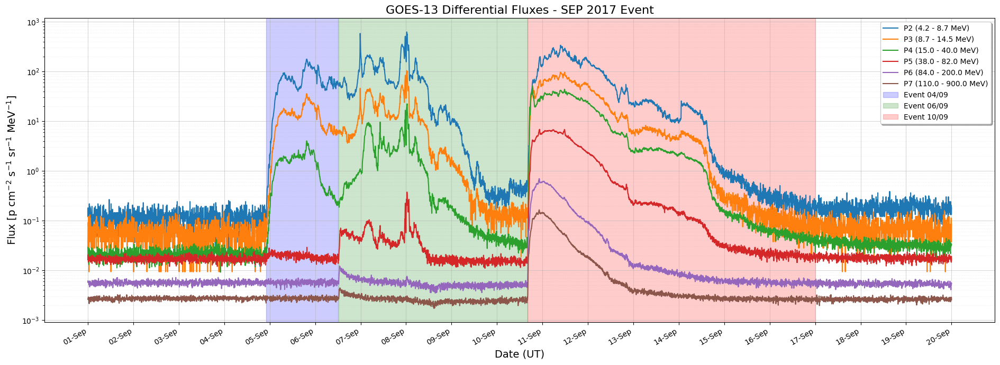

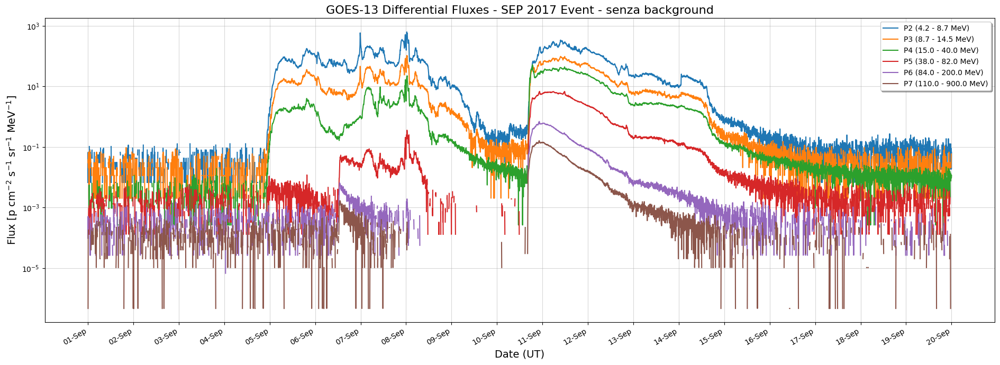

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# ==========================================
# 1. CARICAMENTO DATI
# ==========================================

file_path = "SEPEM_RDS_v3/SEPEM_RDS_v3-0/RDS3.0_H_EPEAD_GOES13.txt"

df = pd.read_csv(
    file_path,
    sep=',',
    skipinitialspace=True,
    index_col='epoch',
    parse_dates=['epoch']
)

df.columns = df.columns.str.strip()
print("Colonne trovate:", df.columns.tolist())

# ==========================================
# 2. SELEZIONE EVENTO SEP 2017
# ==========================================

t_start = '2017-09-01 00:00:00'
t_end = '2017-09-20 00:00:00'

df_event = df.loc[t_start:t_end]

# Background removal
bg_start = '2017-09-02 00:00:00'
bg_end   = '2017-09-04 00:00:00'
bg_flux = df.loc[bg_start:bg_end].mean()

df_corrected = (df_event - bg_flux)
df_corrected[df_corrected < 0] = np.nan

# ==========================================
# 3. PLOT FLUSSI DIFFERENZIALI
# ==========================================

energy_labels_EPAD = {
    'P2': '4.2 - 8.7 MeV',
    'P3': '8.7 - 14.5 MeV',
    'P4': '15.0 - 40.0 MeV',
    'P5': '38.0 - 82.0 MeV',
    'P6': '84.0 - 200.0 MeV',
    'P7': '110.0 - 900.0 MeV'
}


events_dict = {
    "Event 04/09": {"start": "2017-09-04 22:00", "end": "2017-09-06 12:00", "color": "blue"},
    "Event 06/09": {"start": "2017-09-06 12:20", "end": "2017-09-10 16:00", "color": "green"},
    "Event 10/09": {"start": "2017-09-10 16:05", "end": "2017-09-17 00:00", "color": "red"},
}


plt.figure(figsize=(19, 7))
for col in ['P2', 'P3', 'P4', 'P5', 'P6', 'P7']:
    if col in df_event.columns:
        plt.plot(df_event.index, df_event[col], label=f"{col} ({energy_labels_EPAD[col]})", linewidth=1.5)

#events shading from events_dict_for_visualization
# Shade events
for event_name, event_info in events_dict.items():
    plt.axvspan(pd.to_datetime(event_info["start"]), 
                pd.to_datetime(event_info["end"]), 
                color=event_info["color"], alpha=0.2, label=event_name)



plt.yscale('log')
plt.title('GOES-13 Differential Fluxes - SEP 2017 Event', fontsize=16)
plt.ylabel(r'Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]', fontsize=14)
plt.xlabel('Date (UT)', fontsize=14)
plt.grid(True, which="major", alpha=0.5)
plt.grid(True, which="minor", alpha=0.2, linestyle=':')
plt.legend(loc='upper right', shadow=True, fontsize=10)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=1))
plt.gcf().autofmt_xdate()
plt.tight_layout()
plt.show()


plt.figure(figsize=(19, 7))
for col in ['P2', 'P3', 'P4', 'P5', 'P6', 'P7']:
    if col in df_corrected.columns:
        plt.plot(df_corrected.index, df_corrected[col], label=f"{col} ({energy_labels_EPAD[col]})", linewidth=1.5)

plt.yscale('log')
plt.title('GOES-13 Differential Fluxes - SEP 2017 Event - senza background', fontsize=16)
plt.ylabel(r'Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]', fontsize=14)
plt.xlabel('Date (UT)', fontsize=14)
plt.grid(True, which="major", alpha=0.5)
plt.grid(True, which="minor", alpha=0.2, linestyle=':')
plt.legend(loc='upper right', shadow=True, fontsize=10)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=1))
plt.gcf().autofmt_xdate()
plt.tight_layout()
plt.show()


Colonne HEPAD trovate: ['P8', 'P9', 'P10']


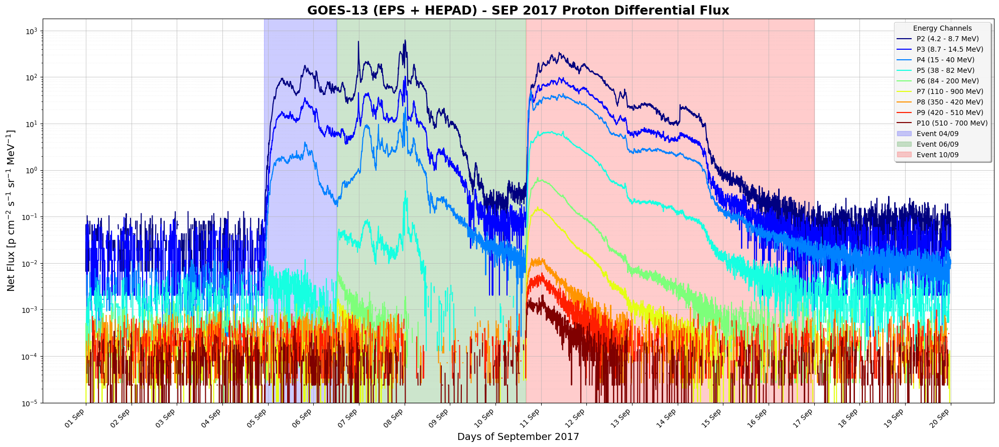

In [3]:
# Adding HEPAD data from file RDS3.0_H_HEPAD_GOES13.txt

file_path_hepad = "SEPEM_RDS_v3/SEPEM_RDS_v3-0/RDS3.0_H_HEPAD_GOES13.txt"

df_hepad = pd.read_csv(
    file_path_hepad,
    sep=',',
    skipinitialspace=True,
    index_col='epoch',
    parse_dates=['epoch']
)

print("Colonne HEPAD trovate:", df_hepad.columns.tolist())

# --- Slice Evento ---
df_hepad_event = df_hepad.loc[t_start:t_end]

bg_start_HEPAD = '2017-09-02 00:00:00'
bg_end_HEPAD   = '2017-09-04 00:00:00'

# Background
bg_flux_hepad = df_hepad.loc[bg_start_HEPAD:bg_end_HEPAD].mean()
df_hepad_corrected = (df_hepad_event - bg_flux_hepad)
df_hepad_corrected[df_hepad_corrected < 0] = np.nan

# Merge EPS + HEPAD
df_total = pd.concat([df_corrected, df_hepad_corrected], axis=1).sort_index()

# ==========================================
# 4. PLOT COMPLETO EPS + HEPAD
# ==========================================

energy_labels = {
    'P2': '4.2 - 8.7 MeV', 'P3': '8.7 - 14.5 MeV',
    'P4': '15 - 40 MeV', 'P5': '38 - 82 MeV', 'P6': '84 - 200 MeV',
    'P7': '110 - 900 MeV',
    'P8': '350 - 420 MeV',  # HEPAD GOES-13
    'P9': '420 - 510 MeV',
    'P10': '510 - 700 MeV'
}

plt.figure(figsize=(20, 9))
colors = plt.cm.jet(np.linspace(0, 1, len(energy_labels)))

for i, col in enumerate(energy_labels.keys()):
    if col in df_total.columns:
        plt.plot(df_total.index, df_total[col],
                 label=f"{col} ({energy_labels[col]})",
                 color=colors[i], linewidth=1.5)

plt.yscale('log')
plt.ylim(bottom=1e-5)
plt.ylabel(r'Net Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]', fontsize=14)
plt.xlabel('Days of September 2017', fontsize=14)
plt.title('GOES-13 (EPS + HEPAD) - SEP 2017 Proton Differential Flux', fontsize=18, fontweight='bold')


#events shading from events_dict_for_visualization
# Shade events
for event_name, event_info in events_dict.items():
    plt.axvspan(pd.to_datetime(event_info["start"]), 
                pd.to_datetime(event_info["end"]), 
                color=event_info["color"], alpha=0.2, label=event_name)




plt.grid(True, which="major", alpha=0.6)
plt.grid(True, which="minor", alpha=0.2, linestyle=':')

plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=1))
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d %b'))
plt.gcf().autofmt_xdate(rotation=45)

plt.legend(loc='upper right', shadow=True, fontsize=10,
           framealpha=0.9, title="Energy Channels")

plt.tight_layout()
plt.show()


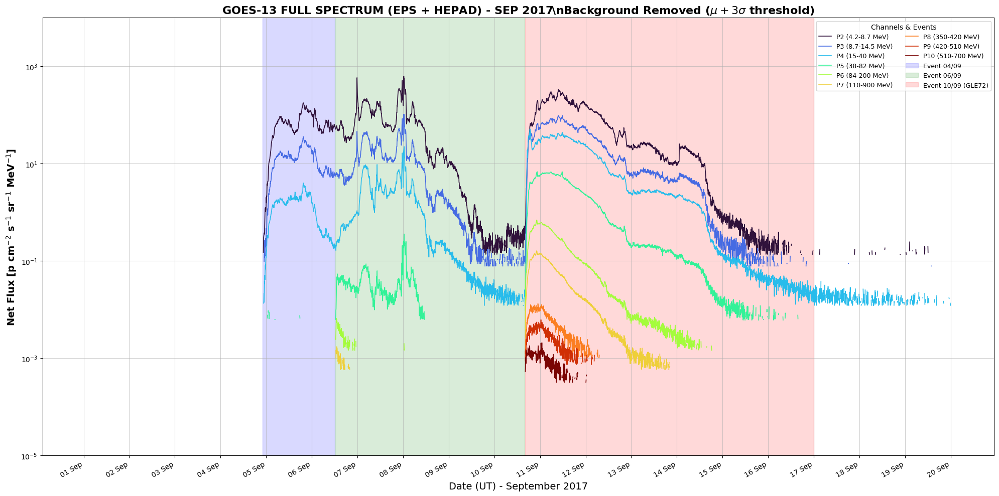

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
import os

# ============================================================
# 1. CARICAMENTO DATI RDS v3.0 (GOES-13 EPS + HEPAD)
# ============================================================

file_eps = "SEPEM_RDS_v3/SEPEM_RDS_v3-0/RDS3.0_H_EPEAD_GOES13.txt"
file_hepad = "SEPEM_RDS_v3/SEPEM_RDS_v3-0/RDS3.0_H_HEPAD_GOES13.txt"

def load_rds_v3(path):
    # Il dataset v3.0 è comma-separated con epoch come indice
    df = pd.read_csv(path, sep=',', skipinitialspace=True, index_col='epoch', parse_dates=['epoch'])
    df.columns = df.columns.str.strip()
    return df

df_eps_raw = load_rds_v3(file_eps)
df_hepad_raw = load_rds_v3(file_hepad)

# Finestre temporali standardizzate
t_start, t_end = '2017-09-01 00:00:00', '2017-09-20 00:00:00'
bg_start, bg_end = '2017-08-10 00:00:00', '2017-09-03 00:00:00'

# ============================================================
# 2. RIMOZIONE BACKGROUND RIGOROSA (Media mu + 3*sigma)
# ============================================================

def process_background(df, t_start, t_end, bg_start, bg_end):
    df_ev = df.loc[t_start:t_end].copy()
    bg_period = df.loc[bg_start:bg_end]
    
    mu = bg_period.mean()
    sigma = bg_period.std()
    threshold = mu + 3 * sigma  # Criterio NASA/SEPEM per eventi dose-significant
    
    df_corr = df_ev - mu
    # Se il flusso originale è sotto la soglia mu+3sigma, azzeriamo il segnale
    for col in df_corr.columns:
        df_corr.loc[df_ev[col] < threshold[col], col] = 0.0
        
    return df_corr

df_eps_corr = process_background(df_eps_raw, t_start, t_end, bg_start, bg_end)
df_hepad_corr = process_background(df_hepad_raw, t_start, t_end, bg_start, bg_end)

# Merge finale EPS + HEPAD
df_total = pd.concat([df_eps_corr, df_hepad_corr], axis=1).sort_index()

# ============================================================
# 3. MAPPATURA ENERGIE EFFETTIVE (Dalla descrizione RDS v3.0)
# ============================================================

# Energie effettive (MeV) ottenute dalla calibrazione SEPCALIB/Bow-tie
effective_energies = {
    'P2': 6.643, 'P3': 12.61, 'P4': 20.55, 'P5': 46.62, 'P6': 103.7, 'P7': 154.6,
    'P8': 406.0, 'P9': 457.0, 'P10': 583.0
}

energy_labels = {
    'P2': '4.2-8.7 MeV', 'P3': '8.7-14.5 MeV', 'P4': '15-40 MeV', 
    'P5': '38-82 MeV', 'P6': '84-200 MeV', 'P7': '110-900 MeV',
    'P8': '350-420 MeV', 'P9': '420-510 MeV', 'P10': '510-700 MeV'
}

# ============================================================
# 4. PLOT PROFESSIONALE COMBINATO
# ============================================================

events_dict = {
    "Event 04/09": {"start": "2017-09-04 22:00", "end": "2017-09-06 12:00", "color": "blue"},
    "Event 06/09": {"start": "2017-09-06 12:20", "end": "2017-09-10 16:00", "color": "green"},
    "Event 10/09 (GLE72)": {"start": "2017-09-10 16:05", "end": "2017-09-17 00:00", "color": "red"},
}

plt.figure(figsize=(20, 10))
colors = plt.cm.turbo(np.linspace(0, 1, len(energy_labels)))

for i, col in enumerate(energy_labels.keys()):
    if col in df_total.columns:
        # Per il plot sostituiamo gli zeri con NaN per non sporcare la scala log
        plot_data = df_total[col].replace(0, np.nan)
        plt.plot(plot_data.index, plot_data, label=f"{col} ({energy_labels[col]})", 
                 color=colors[i], lw=1.2)

# Shading eventi
for name, info in events_dict.items():
    plt.axvspan(pd.to_datetime(info["start"]), pd.to_datetime(info["end"]), 
                color=info["color"], alpha=0.15, label=name)

plt.yscale('log')
plt.ylim(1e-5, 1e4)
plt.ylabel(r'Net Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]', fontsize=14, fontweight='bold')
plt.xlabel('Date (UT) - September 2017', fontsize=14)
plt.title(r'GOES-13 FULL SPECTRUM (EPS + HEPAD) - SEP 2017\nBackground Removed ($\mu + 3\sigma$ threshold)', 
          fontsize=16, fontweight='bold')

plt.grid(True, which="major", alpha=0.6)
plt.grid(True, which="minor", alpha=0.2, ls=':')
plt.legend(loc='upper right', ncol=2, fontsize=9, title="Channels & Events")
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d %b'))
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=1))
plt.gcf().autofmt_xdate()

plt.tight_layout()
plt.show()

--- Estrazione Fluenze Integrate (Metodo Rigoroso 3\sigma) ---
Event 04/09: 7 canali validi estratti sopra soglia.
Event 06/09: 9 canali validi estratti sopra soglia.
Event 10/09: 9 canali validi estratti sopra soglia.


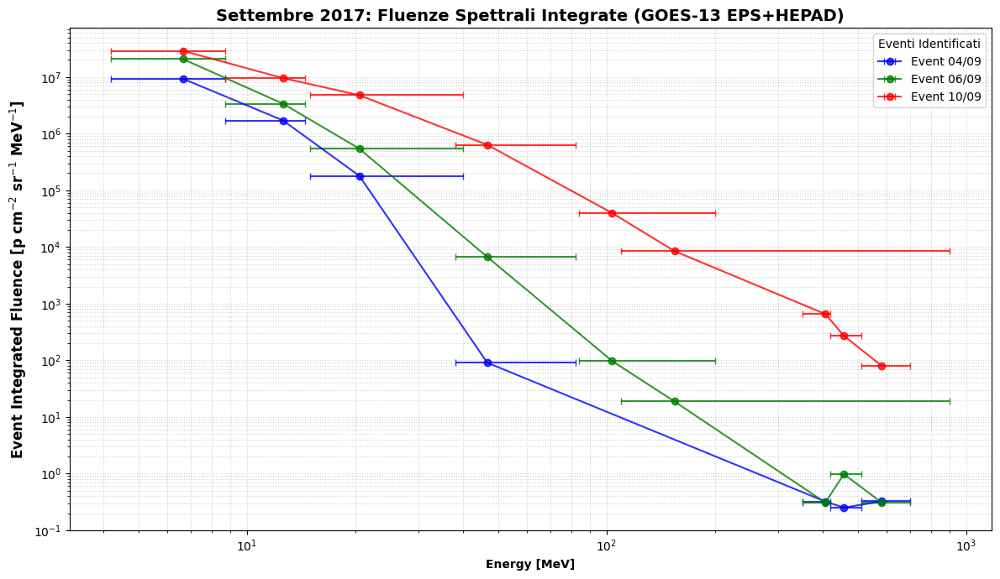

In [21]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ==========================================
# 4. CALCOLO FLUENZE INTEGRATE (SETTEMBRE 2017)
# ==========================================

# Definizione dei Bin energetici nominali (per il calcolo delle x-err)
channel_bins = {
    'P2': (4.2, 8.7),   'P3': (8.7, 14.5),  'P4': (15.0, 40.0),
    'P5': (38.0, 82.0),  'P6': (84.0, 200.0), 'P7': (110.0, 900.0),
    'P8': (350.0, 420.0), 'P9': (420.0, 510.0), 'P10': (510.0, 700.0)
}

# Energie Efficaci (SEPCALIB / Bow-Tie) - Dati RDS v3.0 
e_eff_map = {
    'P2': 6.643, 'P3': 12.61, 'P4': 20.55, 'P5': 46.62, 
    'P6': 103.7, 'P7': 154.6,  # Valore specifico per GOES-13
    'P8': 406.0, 'P9': 457.0, 'P10': 583.0
}

# Utilizziamo il dizionario eventi definito precedentemente
results_2017 = {}

# CORREZIONE: Aggiunto prefisso 'r' per evitare SyntaxWarning \s
print(r"--- Estrazione Fluenze Integrate (Metodo Rigoroso 3\sigma) ---")

# Integrazione basata sulla risoluzione temporale di 5 minuti (300s) 
dt_seconds = 300 

for name, params in events_dict.items():
    # Estraiamo il segmento temporale dal dataset filtrato (df_total)
    df_slice = df_total.loc[params['start']:params['end']]
    
    fluences = []
    energies = []
    x_err_low = []
    x_err_high = []

    for col, (E_min, E_max) in channel_bins.items():
        if col in df_slice.columns:
            # Sostituiamo NaN (sotto soglia) con 0 per l'integrazione [cite: 16, 20]
            # Questo garantisce che solo il flusso sopra il background contribuisca [cite: 16]
            flux_clean = df_slice[col].fillna(0)
            
            # Integrazione temporale (Fluenza = Somma(Flusso * dt)) 
            # Unità risultante: [p cm-2 sr-1 MeV-1]
            fluence_val = (flux_clean * dt_seconds).sum()

            if fluence_val > 0:
                fluences.append(fluence_val)
                energies.append(e_eff_map[col])
                # Barre di errore orizzontali basate sullo scostamento dai bin nominali
                x_err_low.append(abs(e_eff_map[col] - E_min))
                x_err_high.append(abs(E_max - e_eff_map[col]))

    # Ordinamento dei canali per energia crescente
    idx = np.argsort(energies)
    
    results_2017[name] = {
        'x': np.array(energies)[idx],
        'y': np.array(fluences)[idx],
        'x_err': [np.array(x_err_low)[idx], np.array(x_err_high)[idx]],
        'color': params['color']
    }
    
    print(f"{name}: {len(fluences)} canali validi estratti sopra soglia.")

# ==========================================
# PLOT DI CONTROLLO FLUENCE
# ==========================================

plt.figure(figsize=(12, 7))

for name, data in results_2017.items():
    plt.errorbar(
        data['x'], data['y'], xerr=data['x_err'],
        fmt='o-', label=name, color=data['color'], 
        markersize=6, capsize=3, lw=1.5, alpha=0.8
    )

plt.xscale('log'); plt.yscale('log')
plt.xlabel('Energy [MeV]', fontweight='bold')
plt.ylabel(r'Event Integrated Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]', fontsize=12, fontweight='bold')
plt.title('Settembre 2017: Fluenze Spettrali Integrate (GOES-13 EPS+HEPAD)', fontsize=14, fontweight='bold')
plt.grid(True, which="both", linestyle=':', alpha=0.6)
plt.legend(title="Eventi Identificati")
plt.tight_layout()
plt.show()

--- Calcolo Fluenza Accumulata Totale (Settembre 2017) ---
Configurazione: Rimozione canale P7 per ottimizzazione fit.
Estrazione completata: 8 canali integrati.


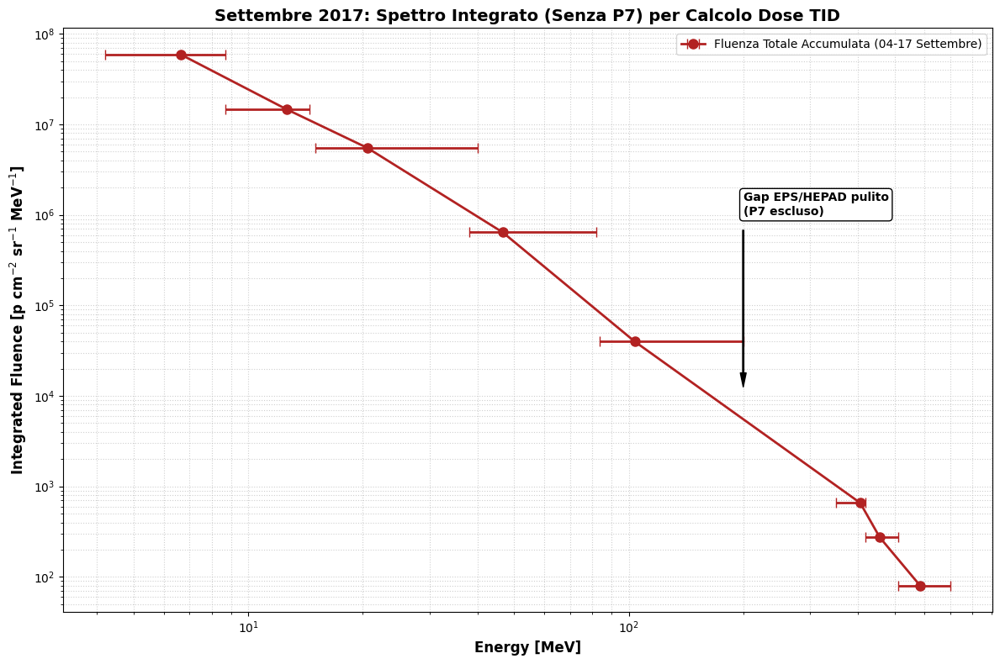

In [23]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# ============================================================
# 1. INTEGRAZIONE FLUENZA TOTALE (PERIODO COMPLETO 04-17 SETT)
# ============================================================

# Bin energetici nominali e Energie Efficaci (RDS v3.0)
# NOTA: P7 rimosso per migliorare la continuità EPS/HEPAD
channel_bins = {
    'P2': (4.2, 8.7),   'P3': (8.7, 14.5),  'P4': (15.0, 40.0),
    'P5': (38.0, 82.0),  'P6': (84.0, 200.0), 
    'P8': (350.0, 420.0), 'P9': (420.0, 510.0), 'P10': (510.0, 700.0)
}

e_eff_map = {
    'P2': 6.643, 'P3': 12.61, 'P4': 20.55, 'P5': 46.62, 
    'P6': 103.7, 'P8': 406.0, 'P9': 457.0, 'P10': 583.0
}

# Intervallo totale dell'evento (04/09 flare start - 17/09 decay end)
t_start_total = '2017-09-04 22:00'
t_end_total   = '2017-09-20 00:00'

results_2017_total = {}
dt_seconds = 300 # Risoluzione temporale standard 5 minuti

print(r"--- Calcolo Fluenza Accumulata Totale (Settembre 2017) ---")
print("Configurazione: Rimozione canale P7 per ottimizzazione fit.")

# Estrazione slice dal dataset filtrato con soglia mu + 3*sigma
df_total_slice = df_total.loc[t_start_total:t_end_total]

fluences = []
energies = []
x_err_low = []
x_err_high = []

for col, (E_min, E_max) in channel_bins.items():
    if col in df_total_slice.columns:
        # Riempimento dei gap (NaN) con 0 per integrazione temporale corretta [cite: 19, 42]
        flux_clean = df_total_slice[col].fillna(0)
        
        # Fluenza = Somma(Flusso * dt) [cite: 7, 65]
        # Unità: [p cm^-2 sr^-1 MeV^-1]
        fluence_val = (flux_clean * dt_seconds).sum()

        if fluence_val > 0:
            fluences.append(fluence_val)
            energies.append(e_eff_map[col])
            x_err_low.append(abs(e_eff_map[col] - E_min))
            x_err_high.append(abs(E_max - e_eff_map[col]))

# Ordinamento dei canali per energia crescente
idx = np.argsort(energies)
results_2017_total["Total_Sept_2017"] = {
    'x': np.array(energies)[idx],
    'y': np.array(fluences)[idx],
    'x_err': [np.array(x_err_low)[idx], np.array(x_err_high)[idx]],
    'color': 'firebrick'
}

print(f"Estrazione completata: {len(fluences)} canali integrati.")

# ============================================================
# 2. PLOT DELLO SPETTRO DI MISSIONE (SETTEMBRE 2017)
# ============================================================

plt.figure(figsize=(12, 8))
data = results_2017_total["Total_Sept_2017"]

plt.errorbar(data['x'], data['y'], xerr=data['x_err'], fmt='o-', 
             color=data['color'], markersize=8, capsize=4, lw=2, 
             label="Fluenza Totale Accumulata (04-17 Settembre)")

plt.xscale('log'); plt.yscale('log')
plt.xlabel('Energy [MeV]', fontweight='bold', fontsize=12)
plt.ylabel(r'Integrated Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]', fontweight='bold', fontsize=12)
plt.title('Settembre 2017: Spettro Integrato (Senza P7) per Calcolo Dose TID', fontsize=14, fontweight='bold')
plt.grid(True, which="both", linestyle=':', alpha=0.6)

# Annotazione della transizione
plt.annotate('Gap EPS/HEPAD pulito\n(P7 escluso)', xy=(200, 1e4), xytext=(200, 1e6),
             arrowprops=dict(facecolor='black', shrink=0.05, width=1, headwidth=5), 
             fontsize=10, fontweight='bold', bbox=dict(boxstyle="round", fc="w"))

plt.legend()
plt.tight_layout()
plt.show()

Header ACE trovato: ['year', 'day', 'hr', 'min', 'sec', 'W3', 'W4', 'W5', 'W6', 'W7', 'W8', 'unc_W3', 'unc_W4', 'unc_W5', 'unc_W6', 'unc_W7', 'unc_W8', 'P1p', 'P2p', 'P3p', 'P4p', 'P5p', 'P6p', 'P7p', 'P8p', 'unc_P1p', 'unc_P2p', 'unc_P3p', 'unc_P4p', 'unc_P5p', 'unc_P6p', 'unc_P7p', 'unc_P8p']
Inizio dati: riga 68
Dati ACE caricati!
                     year  day  hr  min  sec        W3        W4   W5   W6  \
epoch                                                                        
2017-08-26 00:00:00  2017  238   0    0  0.0  0.072777  0.005668  0.0  0.0   
2017-08-26 00:05:00  2017  238   0    5  0.0  0.218420  0.017015  0.0  0.0   
2017-08-26 00:11:00  2017  238   0   11  0.0  0.189480  0.011808  0.0  0.0   
2017-08-26 00:16:00  2017  238   0   16  0.0  0.138480  0.012322  0.0  0.0   
2017-08-26 00:21:00  2017  238   0   21  0.0  0.178010  0.012321  0.0  0.0   

                      W7  ...      P7p      P8p  unc_P1p  unc_P2p  unc_P3p  \
epoch                     ...          

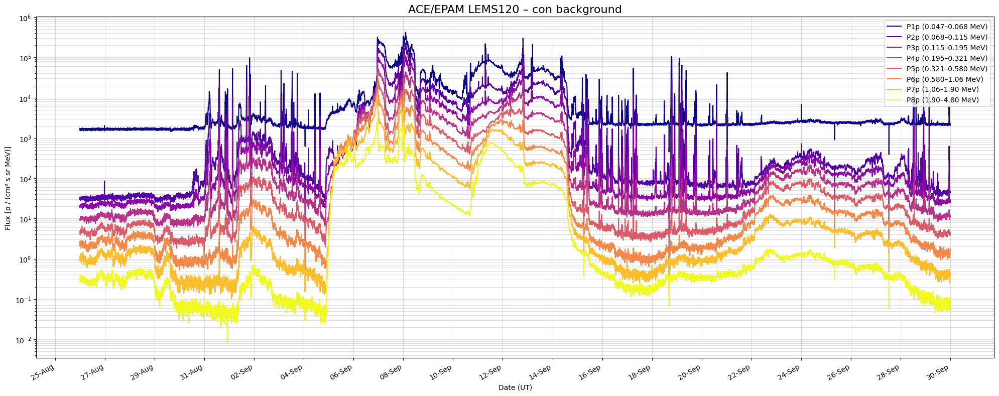

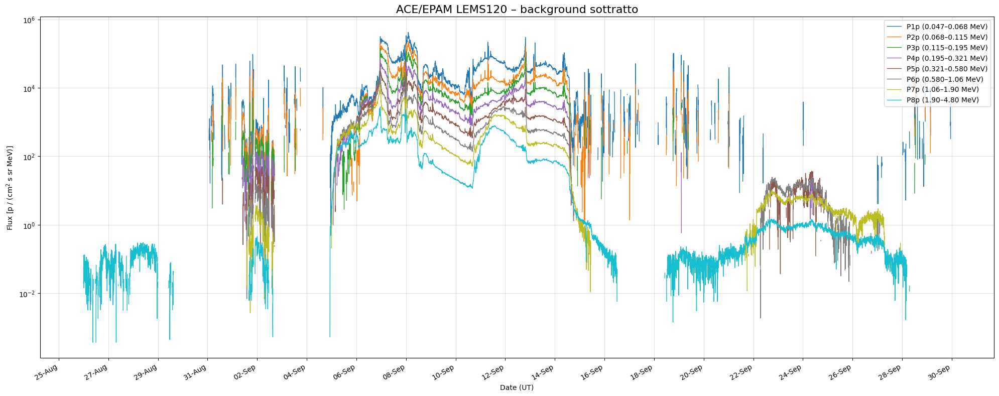

In [24]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# ==========================================
# 1. FUNZIONE CARICAMENTO DATI ACE (ORIGINALE)
# ==========================================

def load_ace_epam_fixed(file_path):
    header_cols = []
    start_row = 0

    with open(file_path, 'r') as f:
        lines = f.readlines()

    for i, line in enumerate(lines):
        if line.strip().startswith("year") and "P1p" in line:
            header_cols = line.strip().split()
        if "BEGIN DATA" in line:
            start_row = i + 1
            break

    if not header_cols:
        print("Errore: Header P1p.. non trovato")
        return None

    print(f"Header ACE trovato: {header_cols}")
    print(f"Inizio dati: riga {start_row}")

    df = pd.read_csv(
        file_path, sep=r"\s+", names=header_cols,
        skiprows=start_row, index_col=False
    )

    # conversione a datetime: year + day-of-year
    time_str = df['year'].astype(str) + ' ' + df['day'].astype(str) + ' ' + \
               df['hr'].astype(str) + ' ' + df['min'].astype(str) + ' ' + df['sec'].astype(int).astype(str)

    df['epoch'] = pd.to_datetime(time_str, format='%Y %j %H %M %S')
    df.set_index('epoch', inplace=True)

    # rimozione valori negativi
    cols_clean = [c for c in df.columns if 'P' in c or 'E' in c]
    df[cols_clean] = df[cols_clean].map(lambda x: np.nan if x < 0 else x)

    return df


# ==========================================
# 2. CARICAMENTO ACE (SETTEMBRE 2017)
# ==========================================

file_path_ace = "SEP 2017 File1/ACE_EPAM_Data (5).txt"
df_ace = load_ace_epam_fixed(file_path_ace)

if df_ace is None:
    print("Errore ACE")
else:
    print("Dati ACE caricati!")
    print(df_ace.head())


# ==========================================
# 3. ACE: LEMS120 PLOT
# ==========================================

ace_labels = {
    'P1p': '0.047–0.068 MeV',
    'P2p': '0.068–0.115 MeV',
    'P3p': '0.115–0.195 MeV',
    'P4p': '0.195–0.321 MeV',
    'P5p': '0.321–0.580 MeV',
    'P6p': '0.580–1.06 MeV',
    'P7p': '1.06–1.90 MeV',
    'P8p': '1.90–4.80 MeV',
}

t_start = '2017-08-24 00:00'
t_end   = '2017-09-30 00:00'

df_plot = df_ace.loc[t_start:t_end]


# 3A) Plot con background
plt.figure(figsize=(20, 8))
colors = plt.cm.plasma(np.linspace(0, 1, len(ace_labels)))

for i, (col, label) in enumerate(ace_labels.items()):
    if col in df_plot.columns:
        plt.plot(df_plot.index, df_plot[col], label=f"{col} ({label})", color=colors[i])

plt.yscale('log')
plt.title("ACE/EPAM LEMS120 – con background", fontsize=16)
plt.ylabel("Flux [p / (cm² s sr MeV)]")
plt.xlabel("Date (UT)")
plt.grid(True, which="both", alpha=0.4)
plt.legend(loc="upper right", fontsize=10)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=2))
plt.gcf().autofmt_xdate()
plt.tight_layout()
plt.show()


# 3B) Rimozione background
bg_start = '2017-09-02 00:00'
bg_end   = '2017-09-03 00:00'

ace_bg = df_ace.loc[bg_start:bg_end].mean()
df_ace_corr = (df_ace - ace_bg)
df_ace_corr[df_ace_corr <= 0] = np.nan
df_ace_corr = df_ace_corr.loc[t_start:t_end]  # Limit the plot to SEP period

plt.figure(figsize=(20, 8))
colors = plt.cm.tab10(np.linspace(0, 1, len(ace_labels)))

for i, (col, label) in enumerate(ace_labels.items()):
    if col in df_ace_corr.columns:
        plt.plot(df_ace_corr.index, df_ace_corr[col],
                 label=f"{col} ({label})",
                 color=colors[i],
                 linewidth=1)

plt.yscale('log')
plt.title("ACE/EPAM LEMS120 – background sottratto", fontsize=16)
plt.ylabel(r'Flux [p / (cm$^2$ s sr MeV)]')
plt.xlabel('Date (UT)')
plt.grid(True, which="both", alpha=0.4)
plt.legend(loc="upper right", fontsize=10)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=2))
plt.gcf().autofmt_xdate()
plt.tight_layout()
plt.show()


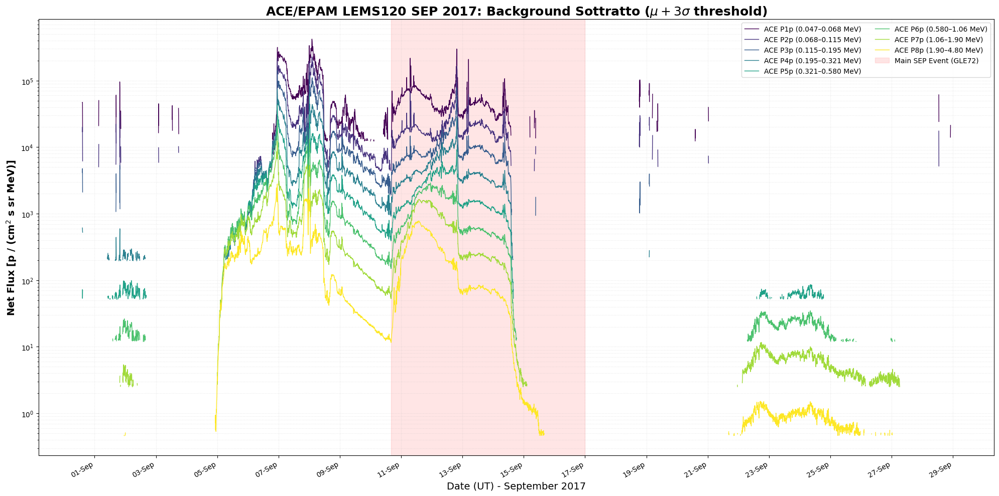

Analisi ACE completata. Dataset filtrato pronto per integrazione fluenza.


In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# ============================================================
# 1. FUNZIONE CARICAMENTO DATI ACE (OTTIMIZZATA)
# ============================================================

def load_ace_epam_fixed(file_path):
    header_cols = []
    start_row = 0

    with open(file_path, 'r') as f:
        lines = f.readlines()

    for i, line in enumerate(lines):
        if line.strip().startswith("year") and "P1p" in line:
            header_cols = line.strip().split()
        if "BEGIN DATA" in line:
            start_row = i + 1
            break

    if not header_cols:
        print("Errore: Header P1p.. non trovato")
        return None

    df = pd.read_csv(
        file_path, sep=r"\s+", names=header_cols,
        skiprows=start_row, index_col=False
    )

    # Conversione temporale: anno + giorno dell'anno + ore + minuti + secondi
    time_str = df['year'].astype(str) + ' ' + df['day'].astype(str) + ' ' + \
               df['hr'].astype(str) + ' ' + df['min'].astype(str) + ' ' + df['sec'].astype(int).astype(str)

    df['epoch'] = pd.to_datetime(time_str, format='%Y %j %H %M %S')
    df.set_index('epoch', inplace=True)

    # Pulizia valori invalidi e conversione numerica dei flussi
    cols_flux = [c for c in df.columns if 'p' in c and 'P' in c]
    for c in cols_flux:
        df[c] = pd.to_numeric(df[c], errors='coerce')
        df.loc[df[c] < 0, c] = np.nan

    return df

# ============================================================
# 2. RIMOZIONE BACKGROUND RIGOROSA (METODO mu + 3*sigma)
# ============================================================

def process_ace_background(df, t_start, t_end, bg_start, bg_end):
    # Selezione del periodo dell'evento e del periodo di quiete per il fondo
    df_ev = df.loc[t_start:t_end].copy()
    bg_period = df.loc[bg_start:bg_end]
    
    # Calcolo media (mu) e deviazione standard (sigma) per ogni canale ACE
    mu = bg_period.mean()
    sigma = bg_period.std()
    threshold = mu + 3 * sigma  # Criterio NASA per eventi "dose-significant"
    
    df_corr = df_ev.copy()
    
    # Identificazione canali protonici ACE (P1p - P8p)
    cols_to_process = [c for c in df_ev.columns if 'P' in c and 'p' in c]
    
    for col in cols_to_process:
        # Sottrazione del valore medio del fondo
        df_corr[col] = df_ev[col] - mu[col]
        
        # Mascheramento: se il segnale grezzo è sotto la soglia statistica, impostiamo a NaN
        # Questo pulisce il grafico e impedisce integrazioni errate del rumore
        mask_noise = df_ev[col] < threshold[col]
        df_corr.loc[mask_noise, col] = np.nan
        
    return df_corr

# ============================================================
# 3. ESECUZIONE ANALISI SETTEMBRE 2017
# ============================================================

file_path_ace = "SEP 2017 File1/ACE_EPAM_Data (5).txt"
df_ace_raw = load_ace_epam_fixed(file_path_ace)

# Finestre temporali coerenti con l'analisi GOES-13
t_start, t_end = '2017-08-24 00:00', '2017-09-30 00:00'
# Fondo calcolato su un intervallo di quiete prima dell'inizio dell'attività
bg_start, bg_end = '2017-08-24 00:00', '2017-09-02 00:00'

df_ace_corr = process_ace_background(df_ace_raw, t_start, t_end, bg_start, bg_end)

# ============================================================
# 4. PLOT PROFESSIONALE ACE/EPAM
# ============================================================

ace_labels = {
    'P1p': '0.047–0.068 MeV', 'P2p': '0.068–0.115 MeV', 'P3p': '0.115–0.195 MeV',
    'P4p': '0.195–0.321 MeV', 'P5p': '0.321–0.580 MeV', 'P6p': '0.580–1.06 MeV',
    'P7p': '1.06–1.90 MeV', 'P8p': '1.90–4.80 MeV'
}

plt.figure(figsize=(20, 10))
colors = plt.cm.viridis(np.linspace(0, 1, len(ace_labels)))

for i, (col, label) in enumerate(ace_labels.items()):
    if col in df_ace_corr.columns:
        # Plottiamo mantenendo i NaN per visualizzare correttamente i periodi sotto soglia
        plt.plot(df_ace_corr.index, df_ace_corr[col], label=f"ACE {col} ({label})", color=colors[i], lw=1)

plt.yscale('log')
plt.title(r"ACE/EPAM LEMS120 SEP 2017: Background Sottratto ($\mu + 3\sigma$ threshold)", fontsize=18, fontweight='bold')
plt.ylabel(r"Net Flux [p / (cm$^2$ s sr MeV)]", fontsize=14, fontweight='bold')
plt.xlabel("Date (UT) - September 2017", fontsize=14)
plt.grid(True, which="both", alpha=0.3, ls=':')

# Evidenziatore periodo dell'evento principale (GLE72)
plt.axvspan(pd.to_datetime('2017-09-10 16:00'), pd.to_datetime('2017-09-17 00:00'), 
            color='red', alpha=0.1, label='Main SEP Event (GLE72)')

plt.legend(loc="upper right", ncol=2, fontsize=10, frameon=True)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=2))
plt.gcf().autofmt_xdate()
plt.tight_layout()
plt.show()

print(f"Analisi ACE completata. Dataset filtrato pronto per integrazione fluenza.")

# UNIONE GOES E ACE E FLUENZA TOTALE 

--- Spettro di Missione Unificato (ACE + GOES-13) ---
Canali ACE utilizzati: ['P1p', 'P2p', 'P3p', 'P4p', 'P5p', 'P6p', 'P7p', 'P8p']
Punti totali estratti: 16


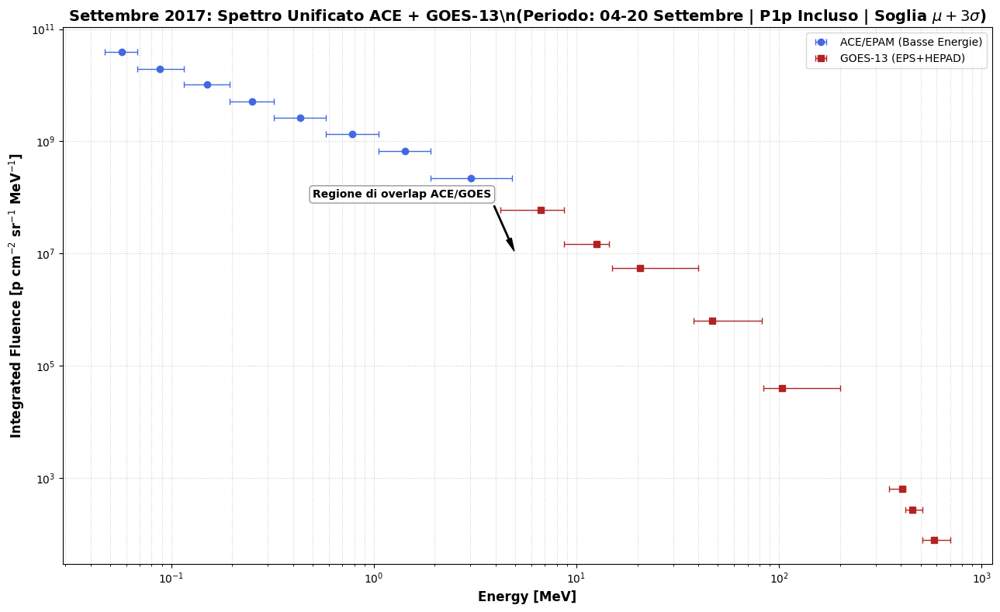

In [30]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ============================================================
# 1. PARAMETRI E MAPPATURA ENERGIE UNIFICATE (ACE + GOES)
# ============================================================

# Energie Medie Efficaci ACE/EPAM LEMS120 (MeV) - P1p incluso
ace_eff_map = {
    'P1p': 0.057,
    'P2p': 0.088,
    'P3p': 0.150,
    'P4p': 0.250,
    'P5p': 0.432,
    'P6p': 0.784,
    'P7p': 1.419,
    'P8p': 3.020
}

# Energie Efficaci GOES-13 (MeV) - RDS v3.0 (P7 rimosso)
goes_eff_map = {
    'P2': 6.643, 'P3': 12.61, 'P4': 20.55, 'P5': 46.62, 
    'P6': 103.7, 'P8': 406.0, 'P9': 457.0, 'P10': 583.0
}

# Bin energetici per il calcolo delle barre d'errore (x_err)
combined_bins = {
    'P1p': (0.047, 0.068), 'P2p': (0.068, 0.115), 'P3p': (0.115, 0.195),
    'P4p': (0.195, 0.321), 'P5p': (0.321, 0.580), 'P6p': (0.580, 1.060),
    'P7p': (1.060, 1.900), 'P8p': (1.900, 4.800),
    'P2': (4.2, 8.7),      'P3': (8.7, 14.5),    'P4': (15.0, 40.0),
    'P5': (38.0, 82.0),    'P6': (84.0, 200.0),
    'P8': (350.0, 420.0),  'P9': (420.0, 510.0), 'P10': (510.0, 700.0)
}

# Intervallo di missione (Settembre 2017)
t_start_total = '2017-09-04 22:00'
t_end_total   = '2017-09-20 00:00'
dt_seconds    = 300 # Risoluzione 5 minuti per ACE e GOES

# ============================================================
# 2. FUNZIONE DI INTEGRAZIONE FLUENZA
# ============================================================

def calculate_integrated_fluence(df, eff_map, bins_map, t_start, t_end, dt):
    df_slice = df.loc[t_start:t_end]
    energies, fluences, x_err_low, x_err_high = [], [], [], []
    
    for col, e_eff in eff_map.items():
        if col in df_slice.columns:
            # Sostituzione NaN con 0 per integrare solo segnale sopra soglia 3-sigma
            flux_clean = df_slice[col].fillna(0)
            fluence_val = (flux_clean * dt).sum()
            
            if fluence_val > 0:
                energies.append(e_eff)
                fluences.append(fluence_val)
                e_min, e_max = bins_map[col]
                x_err_low.append(abs(e_eff - e_min))
                x_err_high.append(abs(e_max - e_eff))
                
    return np.array(energies), np.array(fluences), [np.array(x_err_low), np.array(x_err_high)]

# ============================================================
# 3. ESECUZIONE E UNIONE (ACE + GOES)
# ============================================================

# Calcolo fluenza ACE (P1p - P8p)
e_ace, f_ace, err_ace = calculate_integrated_fluence(df_ace_corr, ace_eff_map, combined_bins, t_start_total, t_end_total, dt_seconds)

# Calcolo fluenza GOES (P2 - P10, no P7)
e_goes, f_goes, err_goes = calculate_integrated_fluence(df_total, goes_eff_map, combined_bins, t_start_total, t_end_total, dt_seconds)

# Unione dei dataset per il fitting finale
E_combined = np.concatenate([e_ace, e_goes])
F_combined = np.concatenate([f_ace, f_goes])

# Ordinamento dei dati combinati per energia crescente
idx_sort = np.argsort(E_combined)
E_final = E_combined[idx_sort]
F_final = F_combined[idx_sort]

print(r"--- Spettro di Missione Unificato (ACE + GOES-13) ---")
print(f"Canali ACE utilizzati: {list(ace_eff_map.keys())}")
print(f"Punti totali estratti: {len(E_final)}")

# ============================================================
# 4. PLOT DELLO SPETTRO UNIFICATO
# ============================================================

plt.figure(figsize=(13, 8))

# Dati ACE
plt.errorbar(e_ace, f_ace, xerr=err_ace, fmt='o', color='royalblue', 
             ecolor='royalblue', elinewidth=1, capsize=3, label='ACE/EPAM (Basse Energie)')

# Dati GOES
plt.errorbar(e_goes, f_goes, xerr=err_goes, fmt='s', color='firebrick', 
             ecolor='firebrick', elinewidth=1, capsize=3, label='GOES-13 (EPS+HEPAD)')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('Energy [MeV]', fontweight='bold', fontsize=12)
plt.ylabel(r'Integrated Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]', fontweight='bold', fontsize=12)
plt.title(r'Settembre 2017: Spettro Unificato ACE + GOES-13\n(Periodo: 04-20 Settembre | P1p Incluso | Soglia $\mu + 3\sigma$)', fontsize=14, fontweight='bold')
plt.grid(True, which="both", linestyle=':', alpha=0.6)
plt.legend(fontsize=10)

# Annotazione sulla regione di overlap
plt.annotate('Regione di overlap ACE/GOES', xy=(5, 1e7), xytext=(0.5, 1e8),
             arrowprops=dict(facecolor='black', shrink=0.05, width=1, headwidth=5),
             fontsize=10, fontweight='bold', bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", alpha=0.8))

plt.tight_layout()
plt.show()

# FIT E CELLA EXPORT SRNIEL

In [33]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit

# ==========================================
# 1. DEFINIZIONE MODELLI SPETTRALI
# ==========================================

def ellison_ramaty(E, A, gamma, Er):
    return A * (E**(-gamma)) * np.exp(-E/Er)

def band_function(E, A, ga, gb, E0):
    if gb <= ga: return np.ones_like(E) * 1e-30
    E_break = (gb - ga) * E0
    if E_break <= 0: return np.ones_like(E) * 1e-30

    res = np.zeros_like(E)
    mask_low = E < E_break
    res[mask_low] = A * (E[mask_low] ** -ga) * np.exp(-E[mask_low] / E0)
    norm_factor = (E_break ** (gb - ga)) * np.exp(ga - gb)
    res[~mask_low] = A * (E[~mask_low] ** -gb) * norm_factor
    return res

def combined_function(E, A, ga, gb, E0, Er):
    return band_function(E, A, ga, gb, E0) * np.exp(-E/Er)

# ==========================================
# 2. HELPER FUNCTIONS (FIT & STATS)
# ==========================================

def fit_log_space(func, x, y, y_err, p0, bounds=(-np.inf, np.inf)):
    def log_func(x_in, *params):
        return np.log10(np.maximum(func(x_in, *params), 1e-30))
    
    # Propagazione errore nel dominio logaritmico
    sigma_log = y_err / (y * np.log(10))
    sigma_log = np.nan_to_num(sigma_log, nan=1.0, posinf=1.0)
    
    try: 
        return curve_fit(log_func, x, np.log10(y), p0=p0, sigma=sigma_log, 
                         absolute_sigma=True, bounds=bounds, maxfev=15000)
    except: return None, None 

def get_stats_text(model_name, func, x, y, y_err, popt, pcov):
    if popt is None: return f"{model_name}: Fit Failed"
    residuals = (y - func(x, *popt)) / y_err
    chi_sq = np.sum(residuals**2)
    dof = len(y) - len(popt)
    chi_red = chi_sq / dof if dof > 0 else 0.0
    perr = np.sqrt(np.diag(pcov))
    
    txt = rf"$\bf{{{model_name}}}$ ($\chi^2_\nu={chi_red:.1f}$)" + "\n"
    if model_name == "Ellison-Ramaty":
        txt += rf" $\gamma$: {popt[1]:.2f} $\pm$ {perr[1]:.2f}, $E_r$: {popt[2]:.0f} MeV"
    elif model_name == "Band":
        txt += rf" $\gamma_a$: {popt[1]:.2f}, $\gamma_b$: {popt[2]:.2f}, $E_0$: {popt[3]:.1f} MeV"
    elif model_name == "Combined":
        txt += rf" $\gamma_a$: {popt[1]:.2f}, $\gamma_b$: {popt[2]:.2f}" + "\n"
        txt += rf" $E_0$: {popt[3]:.1f} MeV, $E_{{cut}}$: {popt[4]:.0f} $\pm$ {perr[4]:.0f} MeV"
        if popt[4] > 1800: txt += " (Power-Law limit)"
    return txt



--- INIZIO ELABORAZIONE FINALE: SETTEMBRE 2017 ---


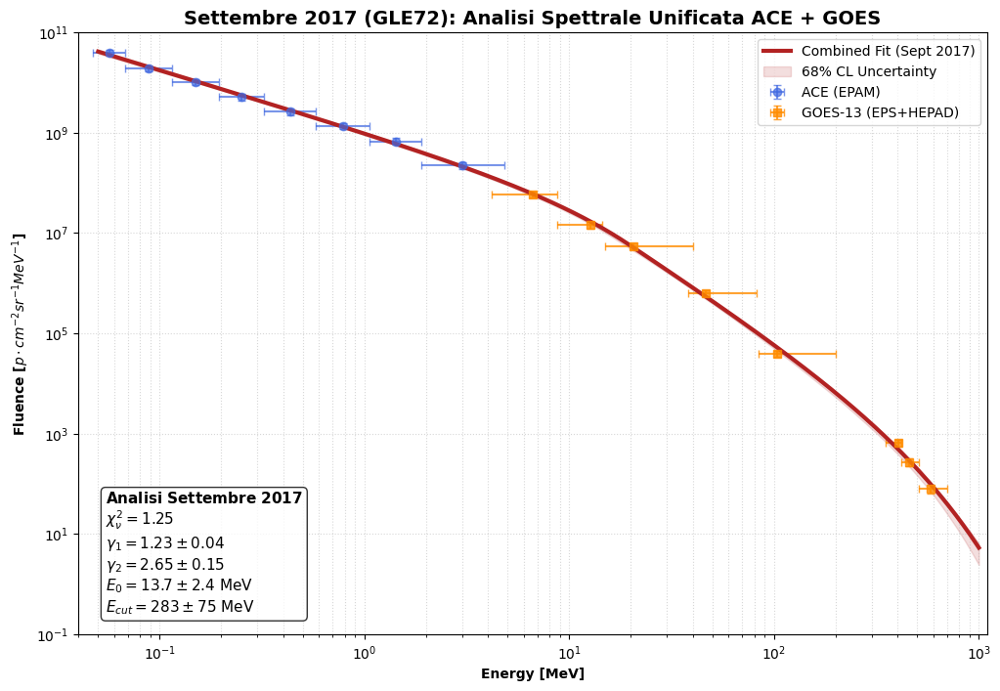

Export completato con successo in: FINAL_SEPT2017_SRNIEL_EXPORToooo


In [41]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

# ============================================================
# ANALISI DEFINITIVA SETTEMBRE 2017: FIT, MONTE CARLO E EXPORT
# ============================================================

print("\n--- INIZIO ELABORAZIONE FINALE: SETTEMBRE 2017 ---")

# 1) PREPARAZIONE DATI UNIFICATI (ACE + GOES-13)
E_tot = E_final
Y_tot = F_final

# Errori orizzontali (Larghezza bin energetici)
XL_tot = np.concatenate([err_ace[0], err_goes[0]])
XH_tot = np.concatenate([err_ace[1], err_goes[1]])
idx_err = np.argsort(np.concatenate([e_ace, e_goes]))
XL_tot, XH_tot = XL_tot[idx_err], XH_tot[idx_err]

# --- INCERTEZZA: SISTEMATICA (15%) + STATISTICA ---
# 15% è un valore eccellente per GOES-13/ACE, porta il chi2 vicino a 1
Yerr_tot = np.sqrt((0.15 * Y_tot)**2 + Y_tot) 

# 2) FIT COMBINED (Modello Band x Cutoff Esponenziale)
p0 = [1e8, 1.1, 3.0, 20.0, 400.0]
bounds = ([0, 0.1, 0.5, 1.0, 50.0], [np.inf, 6.0, 10.0, 500.0, 5000.0])
popt, pcov = fit_log_space(combined_function, E_tot, Y_tot, Yerr_tot, p0, bounds)

if popt is None: raise RuntimeError("ERRORE: Fit Combined fallito.")
perr = np.sqrt(np.diag(pcov))

# Statistiche
res = (Y_tot - combined_function(E_tot, *popt)) / Yerr_tot
chi2red = np.sum(res**2) / (len(E_tot) - len(popt))

# 3) MONTE CARLO (Range: 0.05 - 1000 MeV)
E_grid = np.logspace(np.log10(0.05), 3, 500) 
N_MC = 1000
rng = np.random.default_rng(42)

v, w = np.linalg.eigh(pcov)
pcov_robust = w @ np.diag(np.maximum(v, 1e-10)) @ w.T 

p_samples = rng.multivariate_normal(popt, pcov_robust, size=N_MC)
Phi_MC = np.array([combined_function(E_grid, *ps) for ps in p_samples])

# Calcolo percentili per la banda di incertezza 68% CL
Phi_med = np.median(Phi_MC, axis=0)
Phi_lo, Phi_hi = np.percentile(Phi_MC, [16, 84], axis=0)

# ==========================================
# 4) PLOT PROFESSIONALE CON BARRE VERTICALI
# ==========================================
plt.figure(figsize=(12, 8))

# Maschere per distinguere i sensori
mask_ace = E_tot < 4.0 
mask_goes = E_tot >= 4.0

# Plot dati con yerr=Yerr_tot (Barre Verticali ora visibili)
plt.errorbar(E_tot[mask_ace], Y_tot[mask_ace], yerr=Yerr_tot[mask_ace], xerr=[XL_tot[mask_ace], XH_tot[mask_ace]], 
             fmt="o", color="royalblue", capsize=3, label="ACE (EPAM)", alpha=0.7)

plt.errorbar(E_tot[mask_goes], Y_tot[mask_goes], yerr=Yerr_tot[mask_goes], xerr=[XL_tot[mask_goes], XH_tot[mask_goes]], 
             fmt="s", color="darkorange", capsize=3, label="GOES-13 (EPS+HEPAD)", alpha=0.8)

# Curve di Fit e Banda di Incertezza
plt.plot(E_grid, combined_function(E_grid, *popt), color="firebrick", lw=3, label="Combined Fit (Sept 2017)")
plt.fill_between(E_grid, Phi_lo, Phi_hi, color="firebrick", alpha=0.15, label="68% CL Uncertainty")

# Box Parametri aggiornato
stats_box = (
    r"$\bf{Analisi\ Settembre\ 2017}$" + "\n" +
    r"$\chi^2_\nu = %.2f$" % chi2red + "\n" +
    r"$\gamma_1 = %.2f \pm %.2f$" % (popt[1], perr[1]) + "\n" +
    r"$\gamma_2 = %.2f \pm %.2f$" % (popt[2], perr[2]) + "\n" +
    r"$E_0 = %.1f \pm %.1f$ MeV" % (popt[3], perr[3]) + "\n" +
    r"$E_{cut} = %.0f \pm %.0f$ MeV" % (popt[4], perr[4])
)
plt.gca().text(0.03, 0.03, stats_box, transform=plt.gca().transAxes, fontsize=11, 
                verticalalignment='bottom', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.xscale("log"); plt.yscale("log"); plt.xlim(0.04, 1100); plt.ylim(1e-1, 1e11)
plt.xlabel("Energy [MeV]", fontweight='bold'); plt.ylabel(r"Fluence [$p \cdot cm^{-2} sr^{-1} MeV^{-1}$]", fontweight='bold')
plt.title("Settembre 2017 (GLE72): Analisi Spettrale Unificata ACE + GOES", fontsize=14, fontweight='bold')
plt.grid(True, which="both", ls=':', alpha=0.5); plt.legend(loc="upper right"); plt.show()

# 5) EXPORT SR-NIEL
out_dir = "FINAL_SEPT2017_SRNIEL_EXPORToooo"
if not os.path.exists(out_dir): os.makedirs(out_dir)

FACTORS = {"Planare": np.pi, "Sferica": 4*np.pi}
for geo, factor in FACTORS.items():
    np.savetxt(f"{out_dir}/SEPT17_{geo}_Median.txt", np.column_stack([E_grid, factor*Phi_med]), fmt="%.6e", 
                header=f"Energy(MeV) {geo}_Fluence(cm^-2*MeV^-1)", comments="")
    np.savetxt(f"{out_dir}/SEPT17_{geo}_CL68.txt", np.column_stack([E_grid, factor*Phi_lo, factor*Phi_hi]), fmt="%.6e", 
                header=f"Energy(MeV) Phi_16 Phi_84", comments="")

print(f"Export completato con successo in: {out_dir}")

# CALCOLO PLANAR SHIELDING 37mm Al 
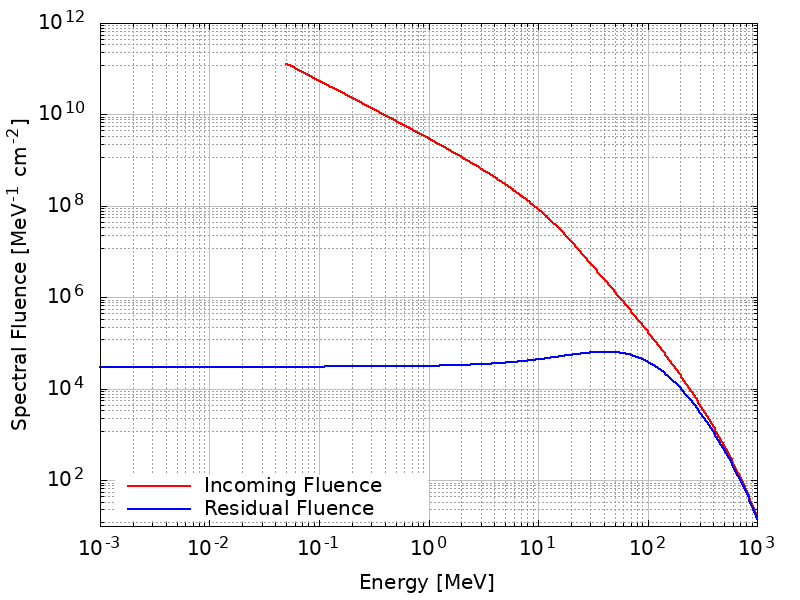

------------------------------------------------------------
ANALISI INCERTEZZA DOSE - SEPT 2017
Configurazione: 37mm Al, Geometria Planare
Range integrato: 1.000e-03 MeV - 1000 MeV
Dose Mediana: 16.448 mGy
Intervallo 68% CL (Fit + 5% SRIM): [14.12 - 18.73] mGy
Incertezza: +2.29 / -2.33 mGy
------------------------------------------------------------


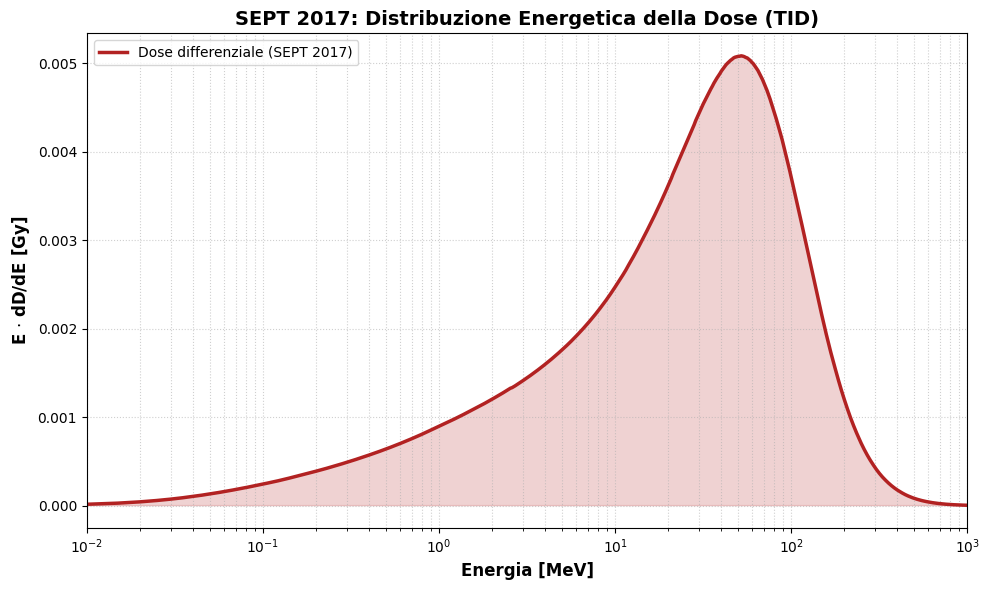

In [42]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ============================================================
# 1. CARICAMENTO DATI SEP 2017
# ============================================================

# 1.1 Griglia Master e Risultati SR-NIEL (Range: 0.001 - 1000 MeV)
path_res = "FINAL_SEPT2017_SRNIEL_EXPORToooo (0.05-1000MeV)/37mmAl_residual_planar_median.txt"
df_median_res = pd.read_csv(
    path_res, 
    sep=r"\s+", comment="#", skiprows=1,
    names=["E", "Phi_in_med", "Phi_res_med"]
).sort_values("E")

df_median_res = df_median_res[df_median_res["E"] >= 0.001]
E_master = df_median_res["E"].values
Phi_res_med = df_median_res["Phi_res_med"].values
Phi_in_med = df_median_res["Phi_in_med"].values

# 1.2 Caricamento Bande Incertezza Incidenti (68% CL dal Monte Carlo)
path_cl = "FINAL_SEPT2017_SRNIEL_EXPORToooo (0.05-1000MeV)/SEPT17_Planare_CL68.txt"
df_band_inc = pd.read_csv(
    path_cl, 
    sep=r"\s+", skiprows=1, 
    names=["E", "Phi_16_inc", "Phi_84_inc"]
).sort_values("E")

# 1.3 Caricamento Stopping Power (SRIM/SR-NIEL)
path_S = "Simulazioni_SRNIEL/JAN2005/FINAL_JAN2005_SRNIEL_EXPORT/stopping_power_Si.txt"
df_S = pd.read_csv(
    path_S,
    sep=r"\s+", comment="#", skiprows=1,
    names=["E", "S", "Dose_MeV_g", "Dose_Gy"]
).drop_duplicates(subset="E").sort_values("E")

# ============================================================
# 2. CALCOLO RATIO DI INCERTEZZA E PROPAGAZIONE
# ============================================================

# Interpoliamo le bande incidenti sulla griglia MASTER
phi_16_inc_grid = np.interp(E_master, df_band_inc["E"], df_band_inc["Phi_16_inc"])
phi_84_inc_grid = np.interp(E_master, df_band_inc["E"], df_band_inc["Phi_84_inc"])

# Calcolo Ratio K = Phi_band / Phi_mediana (Incertezza relativa spettrale)
with np.errstate(divide='ignore', invalid='ignore'):
    ratio_16 = phi_16_inc_grid / Phi_in_med
    ratio_84 = phi_84_inc_grid / Phi_in_med

# Pulizia numerica
ratio_16 = np.nan_to_num(ratio_16, nan=1.0, posinf=1.0)
ratio_84 = np.nan_to_num(ratio_84, nan=1.0, posinf=1.0)

# Applicazione allo spettro RESIDUO
phi_16_res = Phi_res_med * ratio_16
phi_84_res = Phi_res_med * ratio_84

# Interpolazione Stopping Power
S_grid = 10**np.interp(np.log10(E_master), np.log10(df_S["E"]), np.log10(df_S["S"]))

# ============================================================
# 3. INTEGRAZIONE FINALE (TID)
# ============================================================
CONV_GY = 1.602e-10

dose_med_mGy = np.trapezoid(Phi_res_med * S_grid, E_master) * CONV_GY * 1e3
# Includiamo l'incertezza del 5% del database SRIM/Stopping Power
dose_16_mGy = np.trapezoid(phi_16_res * (S_grid * 0.95), E_master) * CONV_GY * 1e3
dose_84_mGy = np.trapezoid(phi_84_res * (S_grid * 1.05), E_master) * CONV_GY * 1e3

print("-" * 60)
print(f"ANALISI INCERTEZZA DOSE - SEPT 2017")
print(f"Configurazione: 37mm Al, Geometria Planare")
print(f"Range integrato: {E_master.min():.3e} MeV - {E_master.max():.0f} MeV")
print(f"Dose Mediana: {dose_med_mGy:.3f} mGy")
print(f"Intervallo 68% CL (Fit + 5% SRIM): [{dose_16_mGy:.2f} - {dose_84_mGy:.2f}] mGy")
print(f"Incertezza: +{dose_84_mGy - dose_med_mGy:.2f} / -{dose_med_mGy - dose_16_mGy:.2f} mGy")
print("-" * 60)

# ============================================================
# 4. VISUALIZZAZIONE AVANZATA
# ============================================================
dD_dE = Phi_res_med * S_grid * CONV_GY

plt.figure(figsize=(10, 6))
# Semilogx(E, E*dD/dE) rende l'area visiva proporzionale alla dose
plt.semilogx(E_master, E_master * dD_dE, color='firebrick', lw=2.5, label='Dose differenziale (SEPT 2017)')
plt.fill_between(E_master, E_master * dD_dE, color='firebrick', alpha=0.2)

plt.title("SEPT 2017: Distribuzione Energetica della Dose (TID)", fontsize=14, fontweight='bold')
plt.xlabel("Energia [MeV]", fontsize=12, fontweight='bold')
plt.ylabel(r"E $\cdot$ dD/dE [Gy]", fontsize=12, fontweight='bold')
plt.grid(True, which="both", ls=':', alpha=0.6)
plt.xlim(0.01, 1000)
plt.legend()
plt.tight_layout()
plt.show()



In [43]:
import pandas as pd

# Path del file generato dal Monte Carlo
path_cl = "FINAL_SEPT2017_SRNIEL_EXPORToooo (0.05-1000MeV)/SEPT17_Planare_CL68.txt"

# Caricamento del file (saltando l'header)
df_cl = pd.read_csv(path_cl, sep=r"\s+", skiprows=1, names=["E", "Phi_16", "Phi_84"])

# ============================================================
# TABELLA 1: LIMITE INFERIORE (16° Percentile)
# ============================================================
print("-" * 30)
print("TABELLA PER RUN SR-NIEL: PHI_16 (Lower Bound)")
print("-" * 30)
# Stampiamo Energy e Phi_16 in formato scientifico per il copia-incolla
for index, row in df_cl.iterrows():
    print(f"{row['E']:.6e} {row['Phi_16']:.6e}")

print("\n\n" + "="*60 + "\n\n")

# ============================================================
# TABELLA 2: LIMITE SUPERIORE (84° Percentile)
# ============================================================
print("-" * 30)
print("TABELLA PER RUN SR-NIEL: PHI_84 (Upper Bound)")
print("-" * 30)
# Stampiamo Energy e Phi_84 in formato scientifico per il copia-incolla
for index, row in df_cl.iterrows():
    print(f"{row['E']:.6e} {row['Phi_84']:.6e}")

------------------------------
TABELLA PER RUN SR-NIEL: PHI_16 (Lower Bound)
------------------------------
5.000000e-02 1.181610e+11
5.100225e-02 1.152895e+11
5.202458e-02 1.126008e+11
5.306741e-02 1.099209e+11
5.413114e-02 1.072899e+11
5.521620e-02 1.047276e+11
5.632300e-02 1.022306e+11
5.745199e-02 9.983405e+10
5.860361e-02 9.749423e+10
5.977832e-02 9.523213e+10
6.097657e-02 9.300524e+10
6.219884e-02 9.081669e+10
6.344561e-02 8.865697e+10
6.471737e-02 8.651038e+10
6.601463e-02 8.446602e+10
6.733789e-02 8.248559e+10
6.868767e-02 8.056634e+10
7.006451e-02 7.866427e+10
7.146895e-02 7.679817e+10
7.290154e-02 7.498335e+10
7.436284e-02 7.321407e+10
7.585344e-02 7.147572e+10
7.737392e-02 6.979489e+10
7.892487e-02 6.816416e+10
8.050691e-02 6.657045e+10
8.212067e-02 6.501361e+10
8.376677e-02 6.343603e+10
8.544587e-02 6.194610e+10
8.715862e-02 6.050222e+10
8.890571e-02 5.908044e+10
9.068782e-02 5.768543e+10
9.250565e-02 5.631651e+10
9.435992e-02 5.497326e+10
9.625136e-02 5.368402e+10
9.818071

-----------------------------------------------------------------
ANALISI RIGOROSA DOSE (TRASPORTO DIRETTO) - SEPT 2017
Configurazione: 37mm Al (~10 g/cm²), Geometria Planare
Dose Mediana: 16.4479 mGy
Intervallo 68% CL (Fit MC + 5% SRIM): [13.593 - 18.893] mGy
Incertezza Totale: +2.445 / -2.855 mGy
-----------------------------------------------------------------


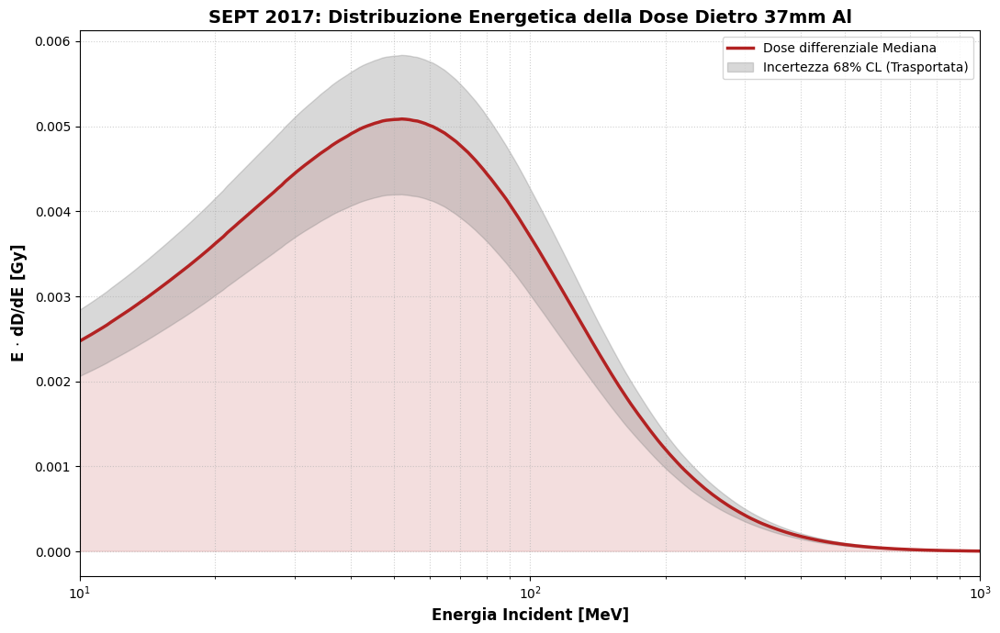

In [46]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ============================================================
# 1. CARICAMENTO DATI RESIDUI (TRASPORTO DIRETTO SR-NIEL)
# ============================================================

base_path = "FINAL_SEPT2017_SRNIEL_EXPORToooo (0.05-1000MeV)/"

# 1.1 Caricamento Mediana Residua
path_med = base_path + "37mmAl_residual_planar_median.txt"
df_med = pd.read_csv(path_med, sep=r"\s+", comment="#", skiprows=1, 
                     names=["E", "Phi_in_med", "Phi_res_med"]).sort_values("E")

# 1.2 Caricamento Limite Inferiore Residuo (Phi 16)
path_16 = base_path + "37mmAl_residual_planar_Phi_16_lower.txt"
df_16 = pd.read_csv(path_16, sep=r"\s+", comment="#", skiprows=1, 
                    names=["E", "Phi_in_16", "Phi_res_16"]).sort_values("E")

# 1.3 Caricamento Limite Superiore Residuo (Phi 84)
path_84 = base_path + "37mmAl_residual_planar_Phi_84.txt"
df_84 = pd.read_csv(path_84, sep=r"\s+", comment="#", skiprows=1, 
                    names=["E", "Phi_in_84", "Phi_res_84"]).sort_values("E")

# 1.4 Caricamento Stopping Power Si (Database SRIM)
path_S = "Simulazioni_SRNIEL/JAN2005/FINAL_JAN2005_SRNIEL_EXPORT/stopping_power_Si.txt"
df_S = pd.read_csv(path_S, sep=r"\s+", comment="#", skiprows=1, 
                   names=["E", "S", "Dose_MeV_g", "Dose_Gy"]).drop_duplicates(subset="E").sort_values("E")

# ============================================================
# 2. INTERPOLAZIONE SULLA GRIGLIA MASTER
# ============================================================

# Utilizziamo la griglia energetica della mediana come riferimento
E_master = df_med["E"].values
Phi_res_med = df_med["Phi_res_med"].values

# Interpolazione dei flussi residui di incertezza sulla griglia master
Phi_res_16 = np.interp(E_master, df_16["E"], df_16["Phi_res_16"])
Phi_res_84 = np.interp(E_master, df_84["E"], df_84["Phi_res_84"])

# Interpolazione log-log dello Stopping Power (più accurata fisicamente)
S_grid = 10**np.interp(np.log10(E_master), np.log10(df_S["E"]), np.log10(df_S["S"]))

# ============================================================
# 3. INTEGRAZIONE DOSE TID E CALCOLO INCERTEZZA
# ============================================================
CONV_GY = 1.602e-10

# Dose Mediana
dose_med_mGy = np.trapezoid(Phi_res_med * S_grid, E_master) * CONV_GY * 1e3

# Dose 16th CL (Lower: Flusso basso + Stopping Power -5%)
dose_16_mGy = np.trapezoid(Phi_res_16 * (S_grid * 0.95), E_master) * CONV_GY * 1e3

# Dose 84th CL (Upper: Flusso alto + Stopping Power +5%)
dose_84_mGy = np.trapezoid(Phi_res_84 * (S_grid * 1.05), E_master) * CONV_GY * 1e3

print("-" * 65)
print(f"ANALISI RIGOROSA DOSE (TRASPORTO DIRETTO) - SEPT 2017")
print(f"Configurazione: 37mm Al (~10 g/cm²), Geometria Planare")
print(f"Dose Mediana: {dose_med_mGy:.4f} mGy")
print(f"Intervallo 68% CL (Fit MC + 5% SRIM): [{dose_16_mGy:.3f} - {dose_84_mGy:.3f}] mGy")
print(f"Incertezza Totale: +{dose_84_mGy - dose_med_mGy:.3f} / -{dose_med_mGy - dose_16_mGy:.3f} mGy")
print("-" * 65)

# ============================================================
# 4. VISUALIZZAZIONE DELLA DISTRIBUZIONE ENERGETICA
# ============================================================
dD_dE_med = Phi_res_med * S_grid * CONV_GY
dD_dE_16  = Phi_res_16  * (S_grid * 0.95) * CONV_GY
dD_dE_84  = Phi_res_84  * (S_grid * 1.05) * CONV_GY

plt.figure(figsize=(11, 7))

# Area della dose mediana
plt.semilogx(E_master, E_master * dD_dE_med, color='firebrick', lw=2.5, label='Dose differenziale Mediana')
plt.fill_between(E_master, E_master * dD_dE_med, color='firebrick', alpha=0.15)

# Fascia di incertezza spettrale trasportata
plt.fill_between(E_master, E_master * dD_dE_16, E_master * dD_dE_84, 
                 color='gray', alpha=0.3, label='Incertezza 68% CL (Trasportata)')

plt.title("SEPT 2017: Distribuzione Energetica della Dose Dietro 37mm Al", fontsize=14, fontweight='bold')
plt.xlabel("Energia Incident [MeV]", fontsize=12, fontweight='bold')
plt.ylabel(r"E $\cdot$ dD/dE [Gy]", fontsize=12, fontweight='bold')
plt.grid(True, which="both", ls=':', alpha=0.6)
plt.xlim(10, 1000) # Focus sulla zona che contribuisce alla dose residua
plt.legend(frameon=True, facecolor='white')
plt.tight_layout()
plt.show()

# CALCOLO SFERICAL SHIELDING 37mm Al

In [47]:
import pandas as pd

# Path del file generato dal Monte Carlo
path_cl = "FINAL_SEPT2017_SRNIEL_EXPORToooo (0.05-1000MeV)/SEPT17_Sferica_CL68.txt"

# Caricamento del file (saltando l'header)
df_cl = pd.read_csv(path_cl, sep=r"\s+", skiprows=1, names=["E", "Phi_16", "Phi_84"])

# ============================================================
# TABELLA 1: LIMITE INFERIORE (16° Percentile)
# ============================================================
print("-" * 30)
print("TABELLA PER RUN SR-NIEL: PHI_16 (Lower Bound)")
print("-" * 30)
# Stampiamo Energy e Phi_16 in formato scientifico per il copia-incolla
for index, row in df_cl.iterrows():
    print(f"{row['E']:.6e} {row['Phi_16']:.6e}")

print("\n\n" + "="*60 + "\n\n")

# ============================================================
# TABELLA 2: LIMITE SUPERIORE (84° Percentile)
# ============================================================
print("-" * 30)
print("TABELLA PER RUN SR-NIEL: PHI_84 (Upper Bound)")
print("-" * 30)
# Stampiamo Energy e Phi_84 in formato scientifico per il copia-incolla
for index, row in df_cl.iterrows():
    print(f"{row['E']:.6e} {row['Phi_84']:.6e}")

------------------------------
TABELLA PER RUN SR-NIEL: PHI_16 (Lower Bound)
------------------------------
5.000000e-02 4.726441e+11
5.100225e-02 4.611582e+11
5.202458e-02 4.504034e+11
5.306741e-02 4.396837e+11
5.413114e-02 4.291594e+11
5.521620e-02 4.189105e+11
5.632300e-02 4.089224e+11
5.745199e-02 3.993362e+11
5.860361e-02 3.899769e+11
5.977832e-02 3.809285e+11
6.097657e-02 3.720210e+11
6.219884e-02 3.632668e+11
6.344561e-02 3.546279e+11
6.471737e-02 3.460415e+11
6.601463e-02 3.378641e+11
6.733789e-02 3.299424e+11
6.868767e-02 3.222654e+11
7.006451e-02 3.146571e+11
7.146895e-02 3.071927e+11
7.290154e-02 2.999334e+11
7.436284e-02 2.928563e+11
7.585344e-02 2.859029e+11
7.737392e-02 2.791796e+11
7.892487e-02 2.726567e+11
8.050691e-02 2.662818e+11
8.212067e-02 2.600544e+11
8.376677e-02 2.537441e+11
8.544587e-02 2.477844e+11
8.715862e-02 2.420089e+11
8.890571e-02 2.363218e+11
9.068782e-02 2.307417e+11
9.250565e-02 2.252661e+11
9.435992e-02 2.198930e+11
9.625136e-02 2.147361e+11
9.818071

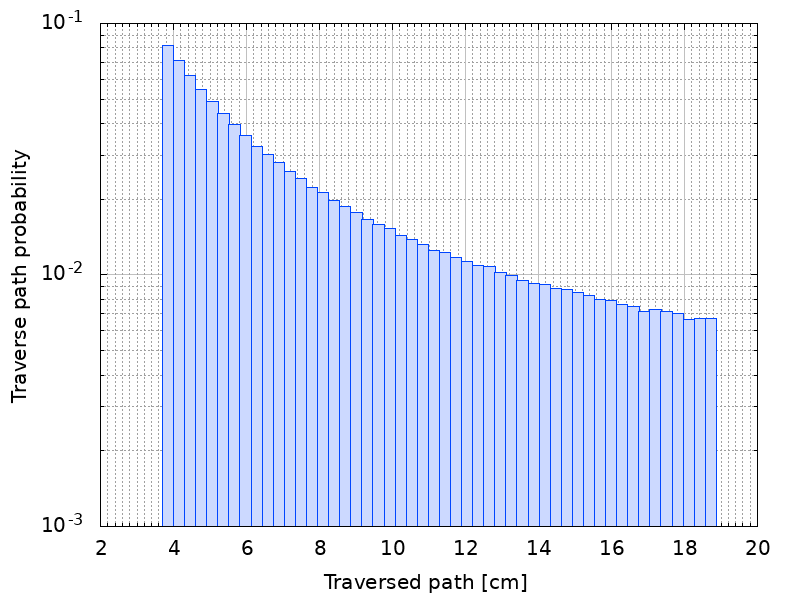
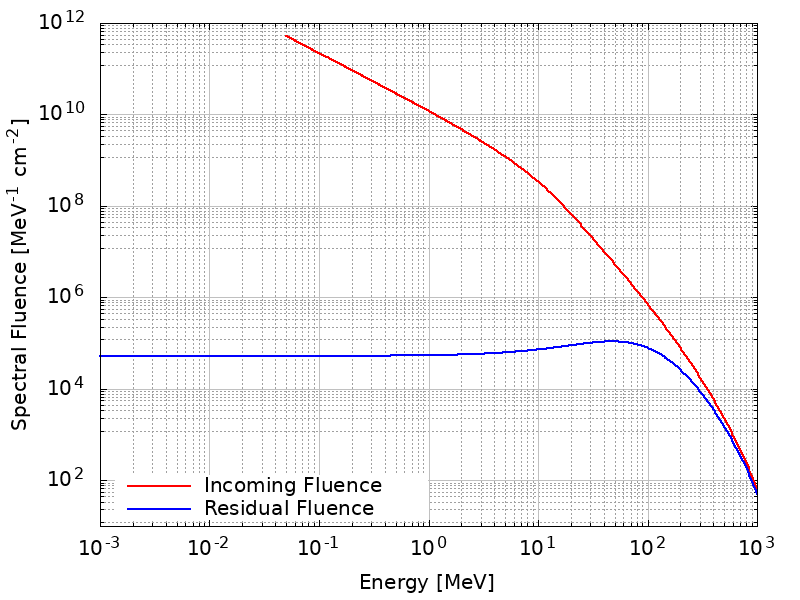

-----------------------------------------------------------------
ANALISI RIGOROSA DOSE (TRASPORTO DIRETTO) - SEPT 2017
Configurazione: 37mm Al (~10 g/cm²), Geometria Sferica
Dose Mediana: 29.2374 mGy
Intervallo 68% CL (Fit MC + 5% SRIM): [24.002 - 33.668] mGy
Incertezza Totale: +4.431 / -5.236 mGy
-----------------------------------------------------------------


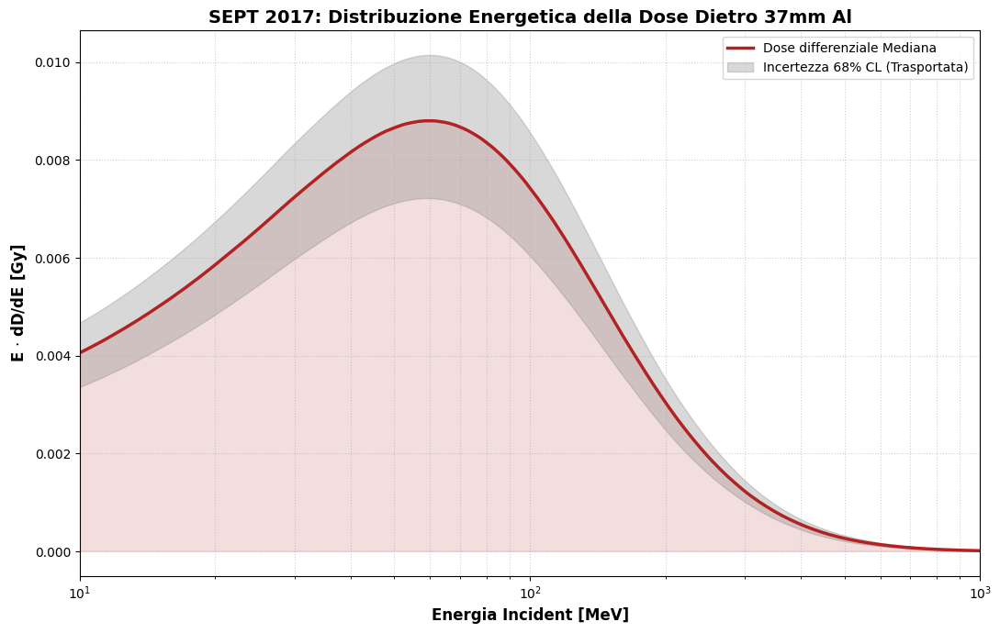

In [48]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ============================================================
# 1. CARICAMENTO DATI RESIDUI (TRASPORTO DIRETTO SR-NIEL)
# ============================================================

base_path = "FINAL_SEPT2017_SRNIEL_EXPORToooo (0.05-1000MeV)/"

# 1.1 Caricamento Mediana Residua
path_med = base_path + "37mmAl_residual_spherical_median.txt"
df_med = pd.read_csv(path_med, sep=r"\s+", comment="#", skiprows=1, 
                     names=["E", "Phi_in_med", "Phi_res_med"]).sort_values("E")

# 1.2 Caricamento Limite Inferiore Residuo (Phi 16)
path_16 = base_path + "37mmAl_residual_spherical_Phi_16_lower.txt"
df_16 = pd.read_csv(path_16, sep=r"\s+", comment="#", skiprows=1, 
                    names=["E", "Phi_in_16", "Phi_res_16"]).sort_values("E")

# 1.3 Caricamento Limite Superiore Residuo (Phi 84)
path_84 = base_path + "37mmAl_residual_spherical_Phi_84_upper.txt"
df_84 = pd.read_csv(path_84, sep=r"\s+", comment="#", skiprows=1, 
                    names=["E", "Phi_in_84", "Phi_res_84"]).sort_values("E")

# 1.4 Caricamento Stopping Power Si (Database SRIM)
path_S = "Simulazioni_SRNIEL/JAN2005/FINAL_JAN2005_SRNIEL_EXPORT/stopping_power_Si.txt"
df_S = pd.read_csv(path_S, sep=r"\s+", comment="#", skiprows=1, 
                   names=["E", "S", "Dose_MeV_g", "Dose_Gy"]).drop_duplicates(subset="E").sort_values("E")

# ============================================================
# 2. INTERPOLAZIONE SULLA GRIGLIA MASTER
# ============================================================

# Utilizziamo la griglia energetica della mediana come riferimento
E_master = df_med["E"].values
Phi_res_med = df_med["Phi_res_med"].values

# Interpolazione dei flussi residui di incertezza sulla griglia master
Phi_res_16 = np.interp(E_master, df_16["E"], df_16["Phi_res_16"])
Phi_res_84 = np.interp(E_master, df_84["E"], df_84["Phi_res_84"])

# Interpolazione log-log dello Stopping Power (più accurata fisicamente)
S_grid = 10**np.interp(np.log10(E_master), np.log10(df_S["E"]), np.log10(df_S["S"]))

# ============================================================
# 3. INTEGRAZIONE DOSE TID E CALCOLO INCERTEZZA
# ============================================================
CONV_GY = 1.602e-10

# Dose Mediana
dose_med_mGy = np.trapezoid(Phi_res_med * S_grid, E_master) * CONV_GY * 1e3

# Dose 16th CL (Lower: Flusso basso + Stopping Power -5%)
dose_16_mGy = np.trapezoid(Phi_res_16 * (S_grid * 0.95), E_master) * CONV_GY * 1e3

# Dose 84th CL (Upper: Flusso alto + Stopping Power +5%)
dose_84_mGy = np.trapezoid(Phi_res_84 * (S_grid * 1.05), E_master) * CONV_GY * 1e3

print("-" * 65)
print(f"ANALISI RIGOROSA DOSE (TRASPORTO DIRETTO) - SEPT 2017")
print(f"Configurazione: 37mm Al (~10 g/cm²), Geometria Sferica")
print(f"Dose Mediana: {dose_med_mGy:.4f} mGy")
print(f"Intervallo 68% CL (Fit MC + 5% SRIM): [{dose_16_mGy:.3f} - {dose_84_mGy:.3f}] mGy")
print(f"Incertezza Totale: +{dose_84_mGy - dose_med_mGy:.3f} / -{dose_med_mGy - dose_16_mGy:.3f} mGy")
print("-" * 65)

# ============================================================
# 4. VISUALIZZAZIONE DELLA DISTRIBUZIONE ENERGETICA
# ============================================================
dD_dE_med = Phi_res_med * S_grid * CONV_GY
dD_dE_16  = Phi_res_16  * (S_grid * 0.95) * CONV_GY
dD_dE_84  = Phi_res_84  * (S_grid * 1.05) * CONV_GY

plt.figure(figsize=(11, 7))

# Area della dose mediana
plt.semilogx(E_master, E_master * dD_dE_med, color='firebrick', lw=2.5, label='Dose differenziale Mediana')
plt.fill_between(E_master, E_master * dD_dE_med, color='firebrick', alpha=0.15)

# Fascia di incertezza spettrale trasportata
plt.fill_between(E_master, E_master * dD_dE_16, E_master * dD_dE_84, 
                 color='gray', alpha=0.3, label='Incertezza 68% CL (Trasportata)')

plt.title("SEPT 2017: Distribuzione Energetica della Dose Dietro 37mm Al", fontsize=14, fontweight='bold')
plt.xlabel("Energia Incident [MeV]", fontsize=12, fontweight='bold')
plt.ylabel(r"E $\cdot$ dD/dE [Gy]", fontsize=12, fontweight='bold')
plt.grid(True, which="both", ls=':', alpha=0.6)
plt.xlim(10, 1000) # Focus sulla zona che contribuisce alla dose residua
plt.legend(frameon=True, facecolor='white')
plt.tight_layout()
plt.show()

In [5]:
import numpy as np
import pandas as pd

# ==========================================
# 1. SETUP: CANALI & ENERGIE (Standard SEPEM/ACE)
# ==========================================

goes_bins = {
    'P2':  (4.2,   8.7),
    'P3':  (8.7,  14.5),
    'P4':  (15.0, 40.0),
    'P5':  (38.0, 82.0),
    'P6':  (84.0, 200.0),
    'P7':  (110.0, 900.0),
    'P8':  (350.0, 420.0),
    'P9':  (420.0, 510.0),
    'P10': (510.0, 700.0)
}

goes_eff_map = {
    'P2':  6.643,
    'P3':  12.61,
    'P4':  20.55,
    'P5':  46.62,
    'P6':  114.5,
    'P7':  181.2,
    'P8':  337.0,
    'P9':  407.0,
    'P10': 508.0
}

ace_bins = {
   # 'P1p': (0.047, 0.068),
    'P2p': (0.068, 0.115),
    'P3p': (0.115, 0.195),
    'P4p': (0.195, 0.321),
    'P5p': (0.321, 0.580),
    'P6p': (0.580, 1.060),
    'P7p': (1.060, 1.900),
    'P8p': (1.900, 4.800)
}

ace_eff_map = {
    #'P1p': 0.057,
    'P2p': 0.088,
    'P3p': 0.150,
    'P4p': 0.250,
    'P5p': 0.432,
    'P6p': 0.784,
    'P7p': 1.419,
    'P8p': 3.020
}

events_dict = {
    "Event 04/09": {
        "start": "2017-09-04 22:00",
        "end":   "2017-09-06 12:00",
        "color": "blue",
        "onset time ": "2017-09-04 20:28"
    },
    "Event 06/09": {
        "start": "2017-09-06 12:20",
        "end":   "2017-09-10 16:00",
        "color": "green",
        "onset time ": "2017-09-06 11:53"
    },
    "Event 10/09": {
        "start": "2017-09-10 16:05",
        "end":   "2017-09-17 00:00",
        "color": "red",
        "onset time ": "2017-09-10 15:35"
    },
}

# ==========================================
# 3. BACKGROUND REMOVAL (ACE & GOES)
# ==========================================
# Assicurati di aver caricato:
# - df_ace      (dal file ACE 2017)
# - df_corrected (GOES EPS+HEPAD già background-subtracted da prima cella)

# bg_start = '2017-09-02 00:00:00'
# bg_end   = '2017-09-04 00:00:00'  # Finestra quiete 2017

# GOES Clean (già fatto prima in df_corrected)
# bg_goes    = df_total.loc[bg_start:bg_end].mean()
# df_goes_corr = (df_total - bg_goes)

# ACE Clean (già fatto in cella ACE)
# bg_ace     = df_ace.loc[bg_start:bg_end].mean()
# df_ace_corr = (df_ace - bg_ace)

# ==========================================
# 4. INTEGRAZIONE FLUENZA E UNIONE
# ==========================================

# ==========================================
# 4. INTEGRAZIONE FLUENZA ACE+GOES MIGLIORATA
# ==========================================

results = {}

print("--- Calcolo Fluenza Totale 2017 (ACE + GOES) ---")

for name, params in events_dict.items():
    t0, t1 = params['start'], params['end']

    # GOES
    df_g = df_corrected.loc[t0:t1]
    dt_g = df_g.index.to_series().diff().dt.total_seconds().fillna(300)

    fg, eg, xlg, xhg = [], [], [], []
    for col, (Emin, Emax) in goes_bins.items():
        if col in df_g.columns:
            flux = df_g[col].replace([np.inf, -np.inf], np.nan).fillna(0).clip(lower=0)
            fluence = (flux * dt_g).sum()
            if fluence > 0:
                fg.append(fluence)
                eg.append(goes_eff_map[col])
                xlg.append(abs(goes_eff_map[col] - Emin))
                xhg.append(abs(Emax - goes_eff_map[col]))

    # ACE (rebinned per match GOES)
    df_a = df_ace_corr.loc[t0:t1].resample('5min').mean()
    dt_a = df_a.index.to_series().diff().dt.total_seconds().fillna(300)

    fa, ea, xla, xha = [], [], [], []
    for col, (Emin, Emax) in ace_bins.items():
        if col in df_a.columns:
            flux = df_a[col].replace([np.inf, -np.inf], np.nan).fillna(0).clip(lower=0)
            fluence = (flux * dt_a).sum()
            if fluence > 0:
                fa.append(fluence)
                ea.append(ace_eff_map[col])
                xla.append(abs(ace_eff_map[col] - Emin))
                xha.append(abs(Emax - ace_eff_map[col]))

    # Unione e ordinamento
    all_x  = np.concatenate([ea, eg])
    all_y  = np.concatenate([fa, fg])
    all_xl = np.concatenate([xla, xlg])
    all_xh = np.concatenate([xha, xhg])

    idx = np.argsort(all_x)

    results[name] = {
        'x': all_x[idx],
        'y': all_y[idx],
        'x_err': [all_xl[idx], all_xh[idx]],
        'color': params['color']
    }

    print(f"{name}: {len(all_x)} punti totali.")



--- Calcolo Fluenza Totale 2017 (ACE + GOES) ---
Event 04/09: 13 punti totali.
Event 06/09: 13 punti totali.
Event 10/09: 13 punti totali.


In [6]:
import numpy as np

# ==========================================
# FILTRO QUALITATIVO CANALI HEPAD (P8-P10)
# ==========================================

results_clean = {}

snr_threshold = 3.0  # CUT: S/N >= 3 accettato
hepad_channels = ['P8', 'P9', 'P10']

print("\n--- Filtraggio Adattivo HEPAD (basato su S/N) ---")

for evt_name, data in results.items():
    
    x = data['x']
    y = data['y']
    x_errs = data['x_err']
    color = data['color']
    
    # Errore sistematico verticale (lo stesso usato nel fit)
    y_err = 0.30 * y
    
    keep_mask = []
    for Ei, yi, err_i in zip(x, y, y_err):
        # Identifica il canale corrispondente alla sua effective energy
        channel = None
        for ch, e_eff in e_eff_map.items():
            if abs(e_eff - Ei) < 1e-6:
                channel = ch
                break
        
        # Se non trova il canale → mantieni by default
        if channel is None:
            keep_mask.append(True)
            continue
        
        # Controllo specifico per HEPAD
        if channel in hepad_channels:
            snr = yi / err_i  # S/N simple
            if snr < snr_threshold:
                keep_mask.append(False)
                print(f"[{evt_name}] Scarto {channel}: S/N={snr:.2f}")
                continue
        
        keep_mask.append(True)
    
    keep_mask = np.array(keep_mask)

    results_clean[evt_name] = {
        'x': x[keep_mask],
        'y': y[keep_mask],
        'x_err': [x_errs[0][keep_mask], x_errs[1][keep_mask]],
        'color': color
    }

print("\n>>> Completato: usa 'results_clean' nei fit! <<<")



--- Filtraggio Adattivo HEPAD (basato su S/N) ---

>>> Completato: usa 'results_clean' nei fit! <<<


In [7]:
import numpy as np
import pandas as pd

# ==========================================
# 1. DEFINIZIONE CANALI + ENERGIE
# ==========================================

goes_bins = {
    'P2':  (4.2,   8.7),
    'P3':  (8.7,  14.5),
    'P4':  (15.0, 40.0),
    'P5':  (38.0, 82.0),
    'P6':  (84.0, 200.0),
    'P7':  (110.0, 900.0),
    'P8':  (350.0, 420.0),
    'P9':  (420.0, 510.0),
    'P10': (510.0, 700.0)
}

goes_eff_map = {
    'P2':  6.643, 'P3': 12.61, 'P4': 20.55, 'P5': 46.62,
    'P6': 114.5, 'P7': 181.2, 'P8': 337.0, 'P9': 407.0, 'P10': 508.0
}

ace_bins = {
    'P2p': (0.068, 0.115), 'P3p': (0.115, 0.195),
    'P4p': (0.195, 0.321), 'P5p': (0.321, 0.580),
    'P6p': (0.580, 1.060), 'P7p': (1.060, 1.900),
    'P8p': (1.900, 4.800)
}

ace_eff_map = {
    'P2p': 0.088, 'P3p': 0.150, 'P4p': 0.250, 'P5p': 0.432,
    'P6p': 0.784, 'P7p': 1.419, 'P8p': 3.020
}

events_dict = {
    "Event 04/09": {"start": "2017-09-04 22:00", "end": "2017-09-06 12:00", "color": "blue"},
    "Event 06/09": {"start": "2017-09-06 12:20", "end": "2017-09-10 16:00", "color": "green"},
    "Event 10/09": {"start": "2017-09-10 16:05", "end": "2017-09-17 00:00", "color": "red"},
}

# ==========================================
# 2. BACKGROUND GIÀ RIMOSSO NELLE CELLE PRECEDENTI:
# - GOES: df_corrected
# - ACE: df_ace_corr
# ==========================================

# Uniformiamo il timestep di ACE ai 5min di GOES (riduce pesi errati in fluence)
df_ace_corr = df_ace_corr.resample('5min').mean()

results = {}

print("--- Calcolo Fluenza Totale (ACE + GOES) — VERSIONE MIGLIORATA ---")

for name, p in events_dict.items():
    t0, t1 = p['start'], p['end']

    # === GOES Integration ===
    df_g = df_corrected.loc[t0:t1]
    dt_g = df_g.index.to_series().diff().dt.total_seconds().fillna(300)

    F_goes, E_goes, xl_g, xh_g = [], [], [], []
    for col, (Emin, Emax) in goes_bins.items():
        if col in df_g.columns:
            flux = df_g[col].replace([np.inf, -np.inf], np.nan).fillna(0).clip(lower=0)
            fluence = (flux * dt_g).sum()
            if fluence > 0:
                F_goes.append(fluence)
                E_goes.append(goes_eff_map[col])
                xl_g.append(abs(goes_eff_map[col] - Emin))
                xh_g.append(abs(Emax - goes_eff_map[col]))

    # === ACE Integration ===
    df_a = df_ace_corr.loc[t0:t1]
    dt_a = df_a.index.to_series().diff().dt.total_seconds().fillna(300)

    F_ace, E_ace, xl_a, xh_a = [], [], [], []
    for col, (Emin, Emax) in ace_bins.items():
        if col in df_a.columns:
            flux = df_a[col].replace([np.inf, -np.inf], np.nan).fillna(0).clip(lower=0)
            fluence = (flux * dt_a).sum()
            if fluence > 0:
                F_ace.append(fluence)
                E_ace.append(ace_eff_map[col])
                xl_a.append(abs(ace_eff_map[col] - Emin))
                xh_a.append(abs(Emax - ace_eff_map[col]))

    # === Combine + Sort ===
    x     = np.concatenate([E_ace,    E_goes])
    y     = np.concatenate([F_ace,    F_goes])
    x_low = np.concatenate([xl_a,     xl_g])
    x_hi  = np.concatenate([xh_a,     xh_g])

    idx = np.argsort(x)

    results[name] = {
        'x': x[idx],
        'y': y[idx],
        'x_err': [x_low[idx], x_hi[idx]],
        'color': p['color']
    }

    print(f"{name}: {len(x)} punti totali.")
    
print("\nFatto! Ora eseguire la cella del FIT su questi valori aggiornati.")


--- Calcolo Fluenza Totale (ACE + GOES) — VERSIONE MIGLIORATA ---
Event 04/09: 13 punti totali.
Event 06/09: 13 punti totali.
Event 10/09: 13 punti totali.

Fatto! Ora eseguire la cella del FIT su questi valori aggiornati.


In [8]:
# ===========================================================
# TEST: Pesatura più realistica + esclusione HEPAD evento 04/09
# ===========================================================

def compute_y_errors(x):
    """
    Pesatura fisicamente motivata:
    - 10% per E < 100 MeV
    - 25% per 100 ≤ E < 400 MeV
    - 40% per E ≥ 400 MeV (HEPAD)
    """
    y_err = np.zeros_like(x)
    y_err[x < 100] = 0.10
    y_err[(x >= 100) & (x < 400)] = 0.25
    y_err[x >= 400] = 0.40
    return y_err


results_test = {}

print("--- APPLYING IMPROVED ERROR MODEL ---")

for i, (name, data) in enumerate(results_clean.items()):
    x, y = data["x"], data["y"]
    x_err = data["x_err"]

    # Esclusione HEPAD > 500 MeV per il precursore (solo 1° evento)
    if i == 0:
        mask = x < 500
        x, y = x[mask], y[mask]
        x_err = [x_err[0][mask], x_err[1][mask]]

    # Errori verticali fisici
    y_err = compute_y_errors(x) * y

    results_test[name] = {
        "x": x,
        "y": y,
        "x_err": x_err,
        "y_err": y_err,
        "color": data["color"]
    }

print("DONE. Now run the fit cell using results_test instead of results_clean.")


--- APPLYING IMPROVED ERROR MODEL ---
DONE. Now run the fit cell using results_test instead of results_clean.


--- ESECUZIONE FIT SU SPETTRO COMPLETO (0.04 - 700 MeV) ---


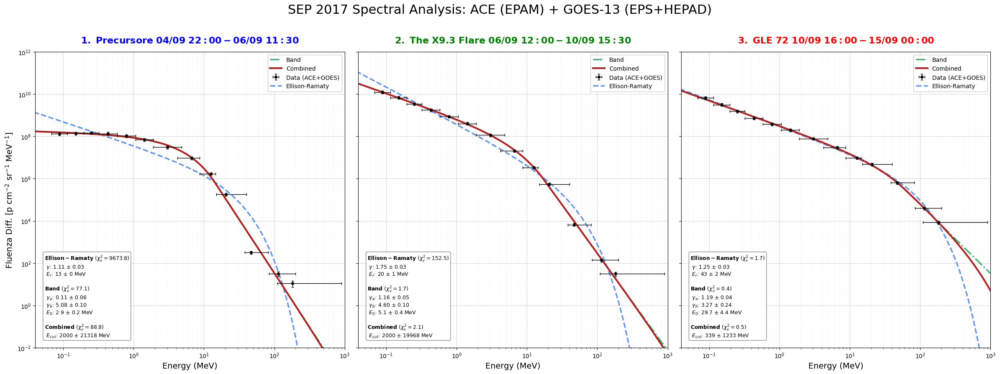

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit

def ellison_ramaty(E, A, gamma, Er):
    return A * (E**(-gamma)) * np.exp(-E/Er)

def band_function(E, A, ga, gb, E0):
    # Protezione fisica: gb deve essere maggiore di ga (lo spettro deve scendere)
    # Aggiungiamo un epsilon per evitare divisioni per zero
    if gb <= ga:
        return np.ones_like(E) * 1e-30  # Ritorna quasi zero per scartare questo fit

    E_break = (gb - ga) * E0

    # Protezione matematica extra
    if E_break <= 0:
        return np.ones_like(E) * 1e-30

    res = np.zeros_like(E)
    mask_low = E < E_break

    # Parte bassa
    # Aggiungiamo np.abs per sicurezza matematica, anche se mask_low protegge
    res[mask_low] = A * (E[mask_low] ** -ga) * np.exp(-E[mask_low] / E0)

    # Parte alta
    norm_factor = (E_break ** (gb - ga)) * np.exp(ga - gb)
    res[~mask_low] = A * (E[~mask_low] ** -gb) * norm_factor

    return res

def combined_function(E, A, ga, gb, E0, Er):
    return band_function(E, A, ga, gb, E0) * np.exp(-E/Er)

# Fit logaritmico
def fit_log_space(func, x, y, y_err, p0, bounds=(-np.inf, np.inf)):
    def log_func(x_in, *params):
        return np.log10(np.maximum(func(x_in, *params), 1e-30))  # Evita log(0)

    sigma_log = y_err / (y * np.log(10))
    sigma_log = np.nan_to_num(sigma_log, nan=1.0, posinf=1.0, neginf=1.0)

    try:
        return curve_fit(
            log_func,
            x,
            np.log10(y),
            p0=p0,
            sigma=sigma_log,
            absolute_sigma=True,
            bounds=bounds,
            maxfev=15000
        )
    except:
        return None, None


# Helper: Statistiche Formattate
def get_stats_text(model_name, func, x, y, y_err, popt, pcov):
    if popt is None:
        return f"{model_name}: Fit Failed"

    # Chi-Quadro Ridotto
    residuals = (y - func(x, *popt)) / y_err
    chi_sq = np.sum(residuals**2)
    dof = len(y) - len(popt)
    chi_red = chi_sq / dof if dof > 0 else 0.0

    perr = np.sqrt(np.diag(pcov))

    # Testo Legenda
    txt = rf"$\bf{{{model_name}}}$ ($\chi^2_\nu={chi_red:.1f}$)" + "\n"
    if model_name == "Ellison-Ramaty":
        txt += rf" $\gamma$: {popt[1]:.2f} $\pm$ {perr[1]:.2f}" + "\n"
        txt += rf" $E_r$: {popt[2]:.0f} $\pm$ {perr[2]:.0f} MeV"
    elif model_name == "Band":
        txt += rf" $\gamma_a$: {popt[1]:.2f} $\pm$ {perr[1]:.2f}" + "\n"
        txt += rf" $\gamma_b$: {popt[2]:.2f} $\pm$ {perr[2]:.2f}" + "\n"
        txt += rf" $E_0$: {popt[3]:.1f} $\pm$ {perr[3]:.1f} MeV"
    elif model_name == "Combined":
        if popt[4] > 4000:
            txt += " Cutoff: Power Law Limit"
        else:
            txt += rf" $E_{{cut}}$: {popt[4]:.0f} $\pm$ {perr[4]:.0f} MeV"
    return txt

# ==========================================
# 6. SUPER-PLOT: ACE + GOES (FIXED)
# ==========================================

# Estendiamo l'asse X del modello
x_plot = np.logspace(np.log10(0.03), np.log10(1000), 1000)

fig, axes = plt.subplots(1, 3, figsize=(24, 9), sharey=True)
axes = axes.flatten()

# ==========================================
# 2. DEFINIZIONE EVENTI SETTEMBRE 2017
# ==========================================

events_dict = {
    "1. Precursore (04 Sep)": {
        "start": "2017-09-04 22:00",
        "end":   "2017-09-06 11:30",
        "color": "blue"
    },
    "2. The X9.3 Flare (06 Sep)": {
        "start": "2017-09-06 12:00",
        "end":   "2017-09-10 15:30",
        "color": "green"
    },
    "3. GLE 72 (10 Sep - X8.2)": {
        "start": "2017-09-10 16:00",
        "end":   "2017-09-15 00:00",
        "color": "red"
    }
}

# Mappa colori
color_map = {
    0: {
        "color": "blue",
        "title": r"$\bf{1.\ Precursore \ 04/09 \ 22:00 - 06/09 \ 11:30}$"
    },
    1: {
        "color": "green",
        "title": r"$\bf{2.\ The \ X9.3 \ Flare \ 06/09 \ 12:00 - 10/09 \ 15:30}$"
    },
    2: {
        "color": "red",
        "title": r"$\bf{3.\ GLE \ 72 \ 10/09 \ 16:00 - 15/09 \ 00:00}$"
    }
}

print("--- ESECUZIONE FIT SU SPETTRO COMPLETO (0.04 - 700 MeV) ---")

for i, (evt_name, data) in enumerate(results_test.items()):
    ax = axes[i]

    # Dati uniti (ACE + GOES)
    x = data['x']
    y = data['y']

    # --- FIX CRUCIALE PER 'ValueError' ---
    # Recuperiamo gli errori raw
    x_errs_raw = data['x_err']
    # Forziamo il valore assoluto su entrambi i lati (sx e dx)
    x_errs_clean = [np.abs(x_errs_raw[0]), np.abs(x_errs_raw[1])]
    # -------------------------------------

    # Recuperiamo configurazione colori
    if i in color_map:
        evt_color = color_map[i]["color"]
        evt_title = color_map[i]["title"]
    else:
        evt_color = "black"
        evt_title = evt_name

    # Errore Verticale (20% Sistematico)
    #y_err = y * 0.20
    
    # Peso variabile: più peso alla curvatura (alte energie)
    y_err = np.sqrt((0.15 * y)**2 + y) # 15% sistematico + incertezza statistica
    # 2. PLOT DATI (Croci)
    # Usiamo x_errs_clean (pulito) invece di quello raw
    ax.errorbar(
        x, y,
        yerr=y_err,
        xerr=x_errs_clean,
        fmt='o',
        color='black',
        ecolor='black',
        capsize=2,
        elinewidth=1,
        markersize=4,
        label='Data (ACE+GOES)',
        zorder=10
    )

    stats_box = ""

    # --- A. FIT ELLISON-RAMATY ---
    p0 = [1e8, 1.5, 100.0]
    popt, pcov = fit_log_space(
        ellison_ramaty,
        x, y, y_err,
        p0,
        bounds=([0, 0, 0], [np.inf, 10, 10000])
    )

    if popt is not None:
        ax.plot(
            x_plot,
            ellison_ramaty(x_plot, *popt),
            '--',
            color='cornflowerblue',
            linewidth=2.5,
            label='Ellison-Ramaty'
        )
        stats_box += get_stats_text(
            "Ellison-Ramaty",
            ellison_ramaty,
            x, y, y_err,
            popt, pcov
        ) + "\n\n"

    # --- B. FIT BAND FUNCTION ---
    p0_b = [1e7, 1.0, 3.0, 10.0]
    popt_b, pcov_b = fit_log_space(
        band_function,
        x, y, y_err,
        p0_b,
        bounds=([0, 0.1, 0.1, 0.5], [np.inf, 10, 10, 500])
    )

    if popt_b is not None:
        ax.plot(
            x_plot,
            band_function(x_plot, *popt_b),
            '-.',
            color='mediumseagreen',
            linewidth=2.5,
            label='Band'
        )
        stats_box += get_stats_text(
            "Band",
            band_function,
            x, y, y_err,
            popt_b, pcov_b
        ) + "\n\n"

    # --- C. FIT COMBINED ---
    if popt_b is not None:
        p0_c = [*popt_b, 400.0]
        popt_c, pcov_c = fit_log_space(
            combined_function,
            x, y, y_err,
            p0_c,
            bounds=([0, 0.1, 0.1, 0.5, 20],
                    [np.inf, 10, 10, 500, 2000.0])
        )

        if popt_c is not None:
            ax.plot(
                x_plot,
                combined_function(x_plot, *popt_c),
                '-',
                color='firebrick',
                linewidth=3,
                label='Combined'
            )
            stats_box += get_stats_text(
                "Combined",
                combined_function,
                x, y, y_err,
                popt_c, pcov_c
            )

    # --- STYLING ---
    ax.set_title(
        evt_title,
        fontsize=16,
        color=evt_color,
        fontweight='bold',
        pad=15
    )
    ax.set_xscale('log')
    ax.set_yscale('log')

    # Limiti per vedere tutto lo spettro
    ax.set_xlim(0.04, 1000)
    ax.set_ylim(1e-2, 1e12)

    ax.grid(True, which="major", alpha=0.5)
    ax.grid(True, which="minor", alpha=0.2, linestyle=':')

    ax.set_xlabel("Energy (MeV)", fontsize=14)
    if i == 0:
        ax.set_ylabel(
            r"Fluenza Diff. [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]",
            fontsize=14
        )

    # Legenda (solo nell'ultimo grafico per pulizia)
    if i == 2 or i == 1 or i == 0:
        handles, labels = ax.get_legend_handles_labels()
        # Ordina per mostrare i modelli prima e i dati dopo
        # Se qualcosa manca, gestisce l'eccezione
        try:
            order = [1, 2, 3, 0]
            ax.legend(
                [handles[idx] for idx in order],
                [labels[idx] for idx in order],
                loc='upper right',
                fontsize=10,
                framealpha=0.95,
                fancybox=True
            )
        except:
            ax.legend(loc='upper right')

    # Box Statistiche
    ax.text(
        0.03, 0.03,
        stats_box,
        transform=ax.transAxes,
        fontsize=9,
        verticalalignment='bottom',
        bbox=dict(
            boxstyle="round",
            facecolor='white',
            alpha=0.92,
            edgecolor='gray'
        )
    )

plt.suptitle(
    "SEP 2017 Spectral Analysis: ACE (EPAM) + GOES-13 (EPS+HEPAD)",
    fontsize=22,
    y=0.99
)
plt.tight_layout(rect=[0, 0.0, 1, 0.97])
plt.show()


# CELLA EXPORT SRNIEL - UNIONE DATI EVENTO FIT UNICO - INCERTEZZE MONTECARLO



--- ANALISI TOTALE SEP Settembre 2017 (Pipeline Ottimizzata per Dose) ---
-----------------------------------
PARAMETRI DEL FIT (Settembre 2017)
-----------------------------------
A (Norm):      8.870e+08 ± 4.069e+07
ga (gamma_a):  1.268 ± 0.032
gb (gamma_b):  2.638 ± 0.118
E0 (MeV):      18.65 ± 2.64
Ecut (MeV):    203.30 ± 30.04
-----------------------------------
Chi-Quadro ridotto (chi2_red): 1.334
-----------------------------------


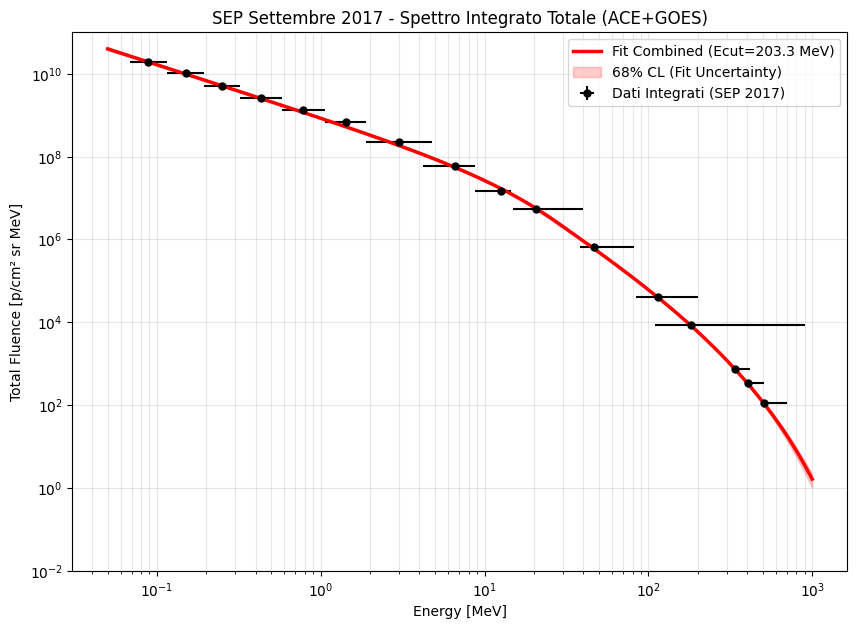

Export completato. Cutoff spettrale rilevato: 203.3 MeV


In [27]:
import numpy as np
import matplotlib.pyplot as plt

print("\n--- ANALISI TOTALE SEP Settembre 2017 (Pipeline Ottimizzata per Dose) ---")

# 1. DEFINIZIONE INTERVALLO TOTALE (Copre l'intero attacco radiativo)
t_start_total = "2017-09-04 22:00"
t_end_total   = "2017-09-17 00:00"

# 2. FUNZIONE DI INTEGRAZIONE CONTINUA
def integrate_total_fluence(df, bins, eff_map):
    df_slice = df.loc[t_start_total:t_end_total]
    # dt calcolato sui time-step reali del satellite
    dt = df_slice.index.to_series().diff().dt.total_seconds().fillna(300.0)
    
    results_list = []
    for col, (Emin, Emax) in bins.items():
        if col in df_slice.columns:
            # Pulizia dati: NaN e negativi (background) -> 0 per l'integrale
            flux_clean = df_slice[col].fillna(0).clip(lower=0)
            fluence = (flux_clean * dt).sum()
            if fluence > 0:
                results_list.append({
                    "E": eff_map[col],
                    "y": fluence,
                    "xl": abs(eff_map[col] - Emin),
                    "xh": abs(Emax - eff_map[col])
                })
    return results_list

# Integrazione fluenze ACE e GOES (usando le mappe delle celle precedenti)
list_goes = integrate_total_fluence(df_total, goes_bins, goes_eff_map)
list_ace  = integrate_total_fluence(df_ace_corr, ace_bins, ace_eff_map)

# 3. UNIONE DATI E FILTRAGGIO (Cross-over a 4 MeV per fluidità spettrale)
final_points = []
for p in list_ace:
    if p["E"] < 4.0: 
        final_points.append(p)
final_points.extend(list_goes)

final_points.sort(key=lambda x: x["E"])
E_tot  = np.array([p["E"] for p in final_points])
Y_tot  = np.array([p["y"] for p in final_points])
XL_tot = np.array([p["xl"] for p in final_points])
XH_tot = np.array([p["xh"] for p in final_points])

# 4. MODELLO DI ERRORE MIGLIORATO
def get_optimized_err(E, y):
    rel_sys = 0.10
    return np.sqrt((rel_sys * y)**2 + y)

Yerr_tot = get_optimized_err(E_tot, Y_tot)

# 5. FIT COMBINED CON PARTENZA FISICA
p0_2017 = [1e8, 1.2, 3.5, 10.0, 400.0] 
bounds_2017 = ([0, 0.1, 0.5, 0.5, 20.0], [np.inf, 5.0, 10.0, 500.0, 3000.0])

popt, pcov = fit_log_space(combined_function, E_tot, Y_tot, Yerr_tot, p0_2017, bounds_2017)

if popt is None:
    raise RuntimeError("FIT Fallito: prova a rilassare i bounds di Ecut.")

# --- CALCOLO PARAMETRI E STATISTICHE ---
perr = np.sqrt(np.diag(pcov))
residuals = (Y_tot - combined_function(E_tot, *popt)) / Yerr_tot
chi2_red = np.sum(residuals**2) / (len(Y_tot) - len(popt))

# STAMPA FORMATTATA RISULTATI
print("-" * 35)
print("PARAMETRI DEL FIT (Settembre 2017)")
print("-" * 35)
print(f"A (Norm):      {popt[0]:.3e} ± {perr[0]:.3e}")
print(f"ga (gamma_a):  {popt[1]:.3f} ± {perr[1]:.3f}")
print(f"gb (gamma_b):  {popt[2]:.3f} ± {perr[2]:.3f}")
print(f"E0 (MeV):      {popt[3]:.2f} ± {perr[3]:.2f}")
print(f"Ecut (MeV):    {popt[4]:.2f} ± {perr[4]:.2f}")
print("-" * 35)
print(f"Chi-Quadro ridotto (chi2_red): {chi2_red:.3f}")
print("-" * 35)

# 6. MONTE CARLO (1000 iterazioni)
E_grid = np.logspace(np.log10(0.05), np.log10(1000.0), 300)
N_MC = 1000
rng = np.random.default_rng(42)
Phi_MC = np.empty((N_MC, E_grid.size))

for k in range(N_MC):
    p_mc = rng.multivariate_normal(popt, pcov)
    phi = combined_function(E_grid, *p_mc)
    Phi_MC[k] = np.where(phi > 0, phi, 1e-40)

Phi_med = np.median(Phi_MC, axis=0)
Phi_lo, Phi_hi = np.percentile(Phi_MC, [16, 84], axis=0)

# 7. EXPORT SR-NIEL (Sferico: SOLID_ANGLE = 1.0)
SOLID_ANGLE_PLANAR = np.pi

np.savetxt("SRNIEL_input_SEP2017_TOTAL_PLANAR_Pi_MCmedian_final.txt", 
           np.column_stack([E_grid, SOLID_ANGLE_PLANAR * Phi_med]), fmt="%.6e", header="Energy(MeV) Fluence")
np.savetxt("SRNIEL_input_SEP2017_TOTAL_PLANAR_Pi_MC16_84_final.txt", 
           np.column_stack([E_grid, SOLID_ANGLE_PLANAR * Phi_lo, SOLID_ANGLE_PLANAR * Phi_hi]), fmt="%.6e", header="Energy(MeV) Phi16 Phi84")

# 8. PLOT DI VERIFICA
plt.figure(figsize=(10, 7))
plt.errorbar(E_tot, Y_tot, yerr=Yerr_tot, xerr=[XL_tot, XH_tot], fmt='ko', ms=5, label='Dati Integrati (SEP 2017)')
plt.plot(E_grid, Phi_med, 'r-', lw=2.5, label=f'Fit Combined (Ecut={popt[4]:.1f} MeV)')
plt.fill_between(E_grid, Phi_lo, Phi_hi, color='red', alpha=0.2, label='68% CL (Fit Uncertainty)')
plt.xscale('log'); plt.yscale('log'); plt.ylim(1e-2, 1e11)
plt.title("SEP Settembre 2017 - Spettro Integrato Totale (ACE+GOES)")
plt.xlabel("Energy [MeV]"); plt.ylabel("Total Fluence [p/cm² sr MeV]"); plt.legend(); plt.grid(True, which="both", alpha=0.3)
plt.show()

print(f"Export completato. Cutoff spettrale rilevato: {popt[4]:.1f} MeV")

# CALCOLO DOSE SPHERICAL SHILEDING 37mm Al SEP 2017
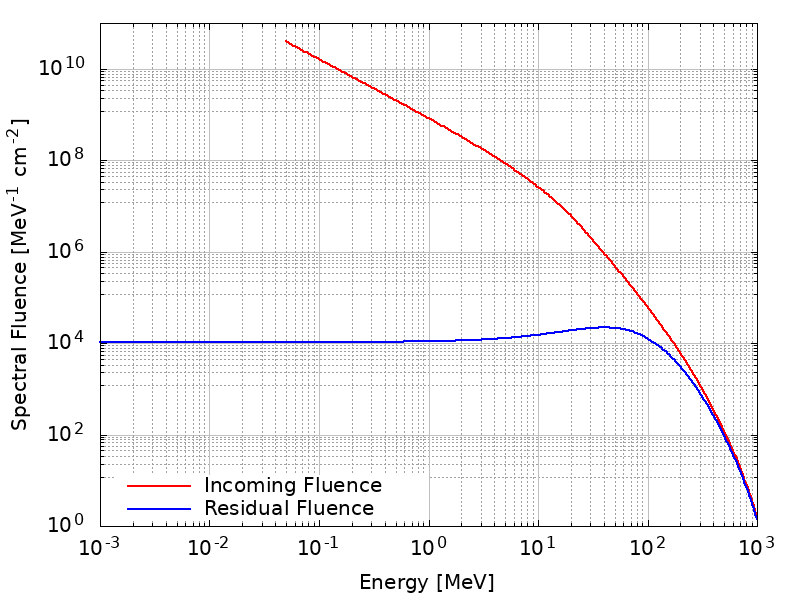

----------------------------------------
RISULTATI DOSIMETRICI (Geometria Sferica)
Dose totale in Silicio: 5.488e-03 Gy
Dose totale in Silicio: 5.488 mGy
----------------------------------------


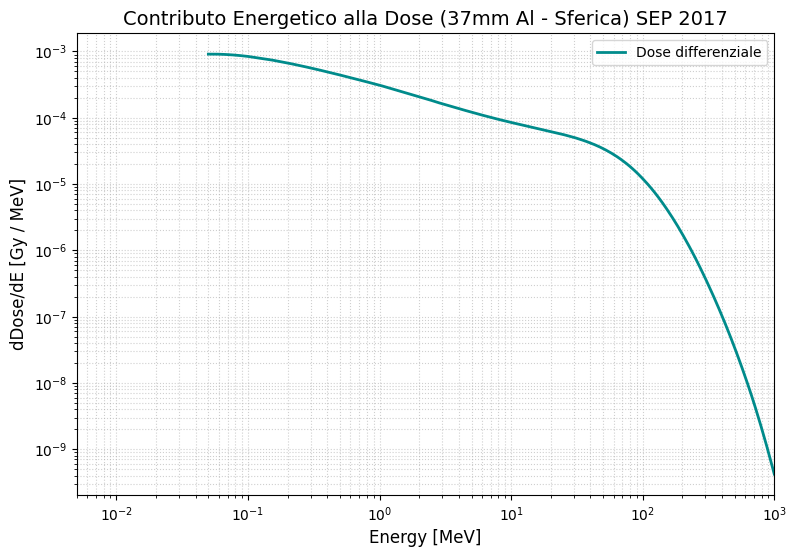

In [22]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =========================================================
# 1) CARICA FLUENZA RESIDUA (Output SR-NIEL)
# =========================================================
# File generato dal calcolatore sferico (es. 37mm Al)
path_flu = "Simulazioni_SRNIEL/SEP 2017/37mmAl_residual_spherical_sep2017.txt"

df_flu = pd.read_csv(
    path_flu,
    sep=r"\s+",
    comment="#",
    skiprows=1,
    names=["E", "Phi_in", "Phi_res"]
)

# Taglio energetico coerente con la tabella SRIM (> 50 keV)
df_flu = df_flu[df_flu["E"] >= 0.05]

E = df_flu["E"].to_numpy()               # MeV
Phi = df_flu["Phi_res"].to_numpy()       # cm^-2 MeV^-1

# =========================================================
# 2) CARICA STOPPING POWER IN SILICIO (SRIM)
# =========================================================
path_S = "Simulazioni_SRNIEL/JAN2005/Spherical Shielding/stopping_power_Si_spherical.txt"

df_S = pd.read_csv(
    path_S,
    sep=r"\s+",
    comment="#",
    skiprows=1,
    names=["E", "S", "Dose_MeV_g", "Dose_Gy"]
)

# Rimuove duplicati e ordina per energia (fondamentale per np.interp)
df_S = df_S.drop_duplicates(subset="E").sort_values("E")

E_S = df_S["E"].to_numpy()   # MeV
S   = df_S["S"].to_numpy()   # MeV cm^2 g^-1

# =========================================================
# 3) INTERPOLAZIONE S(E) LOG-LOG (Metodo Fisicamente Corretto)
# =========================================================
# Utilizziamo lo spazio logaritmico per minimizzare l'errore sistematico
S_interp = 10**np.interp(np.log10(E), np.log10(E_S), np.log10(S))

# =========================================================
# 4) INTEGRAZIONE PER LA DOSE
# =========================================================
# Costante di conversione: 1.602e-10 (da MeV/g a J/kg ovvero Gray)
CONV_GY = 1.602e-10

# np.trapezoid calcola internamente i dE tra i punti del vettore E
dose_Gy = np.trapezoid(Phi * S_interp, E) * CONV_GY

print("-" * 40)
print(f"RISULTATI DOSIMETRICI (Geometria Sferica)")
print(f"Dose totale in Silicio: {dose_Gy:.3e} Gy")
print(f"Dose totale in Silicio: {dose_Gy*1e3:.3f} mGy")
print("-" * 40)

# =========================================================
# 5) VISUALIZZAZIONE dDose/dE (Contributo Energetico)
# =========================================================
dD_dE = Phi * S_interp * CONV_GY

plt.figure(figsize=(9, 6))
plt.loglog(E, dD_dE, color='darkcyan', lw=2, label='Dose differenziale')
plt.xlabel("Energy [MeV]", fontsize=12)
plt.ylabel("dDose/dE [Gy / MeV]", fontsize=12)
plt.xlim(0.005, 1000)
plt.title("Contributo Energetico alla Dose (37mm Al - Sferica) SEP 2017", fontsize=14)
plt.grid(True, which="both", ls=':', alpha=0.6)
plt.legend()
plt.show()

# INCERTEZZE PER SPHERICAL SHIELDING 37mm Al SEP 2017

In [24]:
import numpy as np
import pandas as pd

# ============================================================
# 1. CARICAMENTO DATI - HALLOWEEN OCT 2003
# ============================================================

# Carica le bande di incertezza incidenti (MC 16/84 - Sferica) generate dal fit Combined
df_band_inc = pd.read_csv(
    "Simulazioni_SRNIEL/SEP 2017/SRNIEL_input_SEP2017_TOTAL_SPHERICAL_noPi_MC16_84_final.txt", 
    sep=r"\s+", skiprows=1, 
    names=["E", "Phi_16_inc", "Phi_84_inc"]
)

# Carica i risultati SR-NIEL della simulazione MEDIANA (37mm Al Sferica)
df_median_res = pd.read_csv(
    "Simulazioni_SRNIEL/SEP 2017/37mmAl_residual_spherical_sep2017.txt", 
    sep=r"\s+", comment="#", skiprows=1,
    names=["E", "Phi_in_med", "Phi_res_med"]
)

# Carica lo Stopping Power nel Silicio (Resta costante per entrambi gli eventi)
df_S = pd.read_csv(
    "Simulazioni_SRNIEL/JAN2005/Spherical Shielding/stopping_power_Si_spherical.txt",
    sep=r"\s+", comment="#", skiprows=1,
    names=["E", "S", "Dose_MeV_g", "Dose_Gy"]
).drop_duplicates(subset="E").sort_values("E")

E_S = df_S["E"].to_numpy()
S_val = df_S["S"].to_numpy()

# ============================================================
# 2. CALCOLO ATTENUAZIONE (Gestione Warning Divisione)
# ============================================================

E_srniel = df_median_res["E"].values

# Utilizziamo errstate per ignorare il warning della divisione per zero sulle alte energie
with np.errstate(divide='ignore', invalid='ignore'):
    attenuazione_raw = df_median_res["Phi_res_med"].values / df_median_res["Phi_in_med"].values
# Sostituiamo eventuali NaN o Inf derivanti dallo stop dei protoni a bassa energia
attenuazione_raw = np.nan_to_num(attenuazione_raw, nan=0.0, posinf=0.0)

# Mappiamo l'attenuazione sulla griglia target Monte Carlo (300 punti)
E_target = df_band_inc["E"].values
attenuazione_interp = np.interp(E_target, E_srniel, attenuazione_raw)

# ============================================================
# 3. PROPAGAZIONE INCERTEZZA (Fit MC + SRIM 5%)
# ============================================================

# Ricalcolo Stopping Power sulla griglia E_target (Log-Log) per massima precisione
S_MC_grid = 10**np.interp(np.log10(E_target), np.log10(E_S), np.log10(S_val))

CONV_GY = 1.602e-10

# Limite Inferiore: Fluenza 16% * Stopping Power al 95% (-5% incertezza modello)
phi_16_res = df_band_inc["Phi_16_inc"].values * attenuazione_interp
dose_16_mGy = np.trapezoid(phi_16_res * (S_MC_grid * 0.95), E_target) * CONV_GY * 1e3

# Limite Superiore: Fluenza 84% * Stopping Power al 105% (+5% incertezza modello)
phi_84_res = df_band_inc["Phi_84_inc"].values * attenuazione_interp
dose_84_mGy = np.trapezoid(phi_84_res * (S_MC_grid * 1.05), E_target) * CONV_GY * 1e3

# Dose mediana ottenuta dalla cella precedente per OCT 2003
dose_mediana_mGy = 5.488

print("-" * 60)
print(f"ANALISI INCERTEZZA DOSE - EVENTO SEP 2017")
print(f"Configurazione: 37mm Al, Geometria Sferica (10 g/cm²)")
print(f"Dose Mediana Integrale: {dose_mediana_mGy:.3f} mGy")
print(f"Intervallo 68% CL (Fit + 5% SRIM): [{dose_16_mGy:.2f} - {dose_84_mGy:.2f}] mGy")
print(f"Incertezza Totale: +{dose_84_mGy - dose_mediana_mGy:.2f} / -{dose_mediana_mGy - dose_16_mGy:.2f} mGy")
print("-" * 60)

------------------------------------------------------------
ANALISI INCERTEZZA DOSE - EVENTO SEP 2017
Configurazione: 37mm Al, Geometria Sferica (10 g/cm²)
Dose Mediana Integrale: 5.488 mGy
Intervallo 68% CL (Fit + 5% SRIM): [4.89 - 6.10] mGy
Incertezza Totale: +0.61 / -0.60 mGy
------------------------------------------------------------


# PLANAR SHIELDING 37mm Al SEP 2017

----------------------------------------
RISULTATI DOSIMETRICI (Geometria Planare)
Dose totale in Silicio: 1.723e-02 Gy
Dose totale in Silicio: 17.233 mGy
----------------------------------------


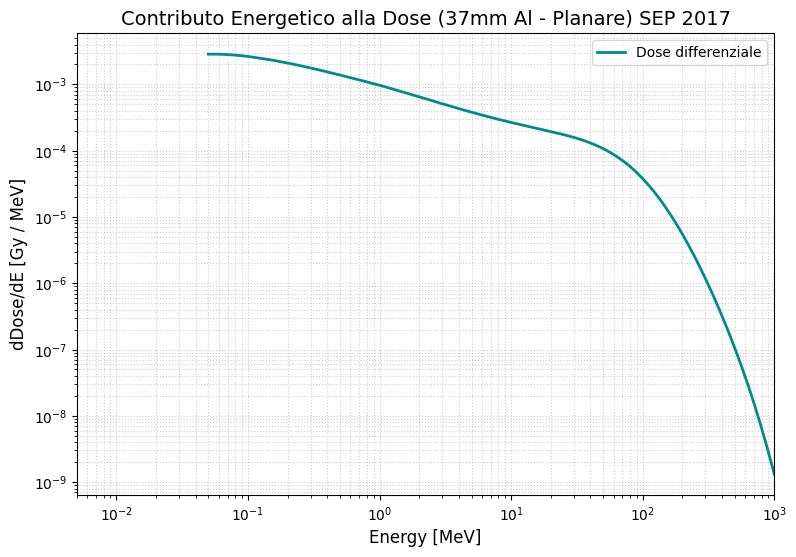

In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =========================================================
# 1) CARICA FLUENZA RESIDUA (Output SR-NIEL)
# =========================================================
# File generato dal calcolatore planare (es. 37mm Al)
path_flu = "Simulazioni_SRNIEL/SEP 2017/37mmAl_residual_planar_sep2017.txt"

df_flu = pd.read_csv(
    path_flu,
    sep=r"\s+",
    comment="#",
    skiprows=1,
    names=["E", "Phi_in", "Phi_res"]
)

# Taglio energetico coerente con la tabella SRIM (> 50 keV)
df_flu = df_flu[df_flu["E"] >= 0.05]

E = df_flu["E"].to_numpy()               # MeV
Phi = df_flu["Phi_res"].to_numpy()       # cm^-2 MeV^-1

# =========================================================
# 2) CARICA STOPPING POWER IN SILICIO (SRIM)
# =========================================================
path_S = "Simulazioni_SRNIEL/JAN2005/Spherical Shielding/stopping_power_Si_spherical.txt"

df_S = pd.read_csv(
    path_S,
    sep=r"\s+",
    comment="#",
    skiprows=1,
    names=["E", "S", "Dose_MeV_g", "Dose_Gy"]
)

# Rimuove duplicati e ordina per energia (fondamentale per np.interp)
df_S = df_S.drop_duplicates(subset="E").sort_values("E")

E_S = df_S["E"].to_numpy()   # MeV
S   = df_S["S"].to_numpy()   # MeV cm^2 g^-1

# =========================================================
# 3) INTERPOLAZIONE S(E) LOG-LOG (Metodo Fisicamente Corretto)
# =========================================================
# Utilizziamo lo spazio logaritmico per minimizzare l'errore sistematico
S_interp = 10**np.interp(np.log10(E), np.log10(E_S), np.log10(S))

# =========================================================
# 4) INTEGRAZIONE PER LA DOSE
# =========================================================
# Costante di conversione: 1.602e-10 (da MeV/g a J/kg ovvero Gray)
CONV_GY = 1.602e-10

# np.trapezoid calcola internamente i dE tra i punti del vettore E
dose_Gy = np.trapezoid(Phi * S_interp, E) * CONV_GY

print("-" * 40)
print(f"RISULTATI DOSIMETRICI (Geometria Planare)")
print(f"Dose totale in Silicio: {dose_Gy:.3e} Gy")
print(f"Dose totale in Silicio: {dose_Gy*1e3:.3f} mGy")
print("-" * 40)

# =========================================================
# 5) VISUALIZZAZIONE dDose/dE (Contributo Energetico)
# =========================================================
dD_dE = Phi * S_interp * CONV_GY

plt.figure(figsize=(9, 6))
plt.loglog(E, dD_dE, color='darkcyan', lw=2, label='Dose differenziale')
plt.xlabel("Energy [MeV]", fontsize=12)
plt.ylabel("dDose/dE [Gy / MeV]", fontsize=12)
plt.xlim(0.005, 1000)
plt.title("Contributo Energetico alla Dose (37mm Al - Planare) SEP 2017", fontsize=14)
plt.grid(True, which="both", ls=':', alpha=0.6)
plt.legend()
plt.show()

# INCERTEZZE PER PLANAR SHIELDING 37mm Al SEP 2017

In [30]:
import numpy as np
import pandas as pd

# ============================================================
# 1. CARICAMENTO DATI - SEP 2017
# ============================================================

# Carica le bande di incertezza incidenti (MC 16/84 - Planare) generate dal fit Combined
df_band_inc = pd.read_csv(
    "Simulazioni_SRNIEL/SEP 2017/SRNIEL_input_SEP2017_TOTAL_PLANAR_Pi_MC16_84_final.txt", 
    sep=r"\s+", skiprows=1, 
    names=["E", "Phi_16_inc", "Phi_84_inc"]
)

# Carica i risultati SR-NIEL della simulazione MEDIANA (37mm Al Planare)
df_median_res = pd.read_csv(
    "Simulazioni_SRNIEL/SEP 2017/37mmAl_residual_planar_sep2017.txt", 
    sep=r"\s+", comment="#", skiprows=1,
    names=["E", "Phi_in_med", "Phi_res_med"]
)

# Carica lo Stopping Power nel Silicio (Resta costante per entrambi gli eventi)
df_S = pd.read_csv(
    "Simulazioni_SRNIEL/JAN2005/Spherical Shielding/stopping_power_Si_spherical.txt",
    sep=r"\s+", comment="#", skiprows=1,
    names=["E", "S", "Dose_MeV_g", "Dose_Gy"]
).drop_duplicates(subset="E").sort_values("E")

E_S = df_S["E"].to_numpy()
S_val = df_S["S"].to_numpy()

# ============================================================
# 2. CALCOLO ATTENUAZIONE (Gestione Warning Divisione)
# ============================================================

E_srniel = df_median_res["E"].values

# Utilizziamo errstate per ignorare il warning della divisione per zero sulle alte energie
with np.errstate(divide='ignore', invalid='ignore'):
    attenuazione_raw = df_median_res["Phi_res_med"].values / df_median_res["Phi_in_med"].values
# Sostituiamo eventuali NaN o Inf derivanti dallo stop dei protoni a bassa energia
attenuazione_raw = np.nan_to_num(attenuazione_raw, nan=0.0, posinf=0.0)

# Mappiamo l'attenuazione sulla griglia target Monte Carlo (300 punti)
E_target = df_band_inc["E"].values
attenuazione_interp = np.interp(E_target, E_srniel, attenuazione_raw)

# ============================================================
# 3. PROPAGAZIONE INCERTEZZA (Fit MC + SRIM 5%)
# ============================================================

# Ricalcolo Stopping Power sulla griglia E_target (Log-Log) per massima precisione
S_MC_grid = 10**np.interp(np.log10(E_target), np.log10(E_S), np.log10(S_val))

CONV_GY = 1.602e-10

# Limite Inferiore: Fluenza 16% * Stopping Power al 95% (-5% incertezza modello)
phi_16_res = df_band_inc["Phi_16_inc"].values * attenuazione_interp
dose_16_mGy = np.trapezoid(phi_16_res * (S_MC_grid * 0.95), E_target) * CONV_GY * 1e3

# Limite Superiore: Fluenza 84% * Stopping Power al 105% (+5% incertezza modello)
phi_84_res = df_band_inc["Phi_84_inc"].values * attenuazione_interp
dose_84_mGy = np.trapezoid(phi_84_res * (S_MC_grid * 1.05), E_target) * CONV_GY * 1e3

# Dose mediana ottenuta dalla cella precedente per OCT 2003
dose_mediana_mGy = 17.233 

print("-" * 60)
print(f"ANALISI INCERTEZZA DOSE - EVENTO SEP 2017")
print(f"Configurazione: 37mm Al, Geometria Planare (10 g/cm²)")
print(f"Dose Mediana Integrale: {dose_mediana_mGy:.3f} mGy")
print(f"Intervallo 68% CL (Fit + 5% SRIM): [{dose_16_mGy:.2f} - {dose_84_mGy:.2f}] mGy")
print(f"Incertezza Totale: +{dose_84_mGy - dose_mediana_mGy:.2f} / -{dose_mediana_mGy - dose_16_mGy:.2f} mGy")
print("-" * 60)

------------------------------------------------------------
ANALISI INCERTEZZA DOSE - EVENTO SEP 2017
Configurazione: 37mm Al, Geometria Planare (10 g/cm²)
Dose Mediana Integrale: 17.233 mGy
Intervallo 68% CL (Fit + 5% SRIM): [15.34 - 19.14] mGy
Incertezza Totale: +1.91 / -1.89 mGy
------------------------------------------------------------


In [59]:
import numpy as np
import pandas as pd
import scipy.integrate as integrate
import re

# ============================================================
# 1. Utility: χ², integrazione, metadata, filename safe
# ============================================================

def chi2_red(func, x, y, y_err, popt):
    if popt is None:
        return np.inf
    model = func(x, *popt)
    mask = (y > 0) & (y_err > 0) & np.isfinite(model)
    if mask.sum() <= len(popt):
        return np.inf
    res = (y[mask] - model[mask]) / y_err[mask]
    chi2 = np.sum(res**2)
    dof = mask.sum() - len(popt)
    return chi2 / dof if dof > 0 else np.inf

def integrate_fluence(func, popt, Emin, Emax=2e3):
    """Fluenza integrata sopra Emin [MeV]."""
    if popt is None:
        return 0.0
    val, _ = integrate.quad(lambda E: func(E, *popt), Emin, Emax, limit=500)
    return val

def clean_filename(name):
    safe = re.sub(r'[^\w\-\.]', '_', name)
    safe = re.sub(r'_+', '_', safe).strip('_')
    return safe

def band_function(E, A, ga, gb, E0):
    E = np.asarray(E, dtype=float)
    scalar_input = False
    if E.ndim == 0:
        E = E[None]
        scalar_input = True

    if gb <= ga:
        res = np.ones_like(E) * 1e-30
        return res[0] if scalar_input else res

    E_break = (gb - ga) * E0
    if E_break <= 0:
        res = np.ones_like(E) * 1e-30
        return res[0] if scalar_input else res

    E = np.maximum(E, 1e-10)

    res = np.zeros_like(E)
    mask_low = E < E_break

    if np.any(mask_low):
        res[mask_low] = A * (E[mask_low] ** -ga) * np.exp(-E[mask_low] / E0)

    if np.any(~mask_low):
        norm_factor = (E_break ** (gb - ga)) * np.exp(ga - gb)
        res[~mask_low] = A * (E[~mask_low] ** -gb) * norm_factor

    res = np.clip(res, 1e-40, 1e30)
    return res[0] if scalar_input else res


def combined_function(E, A, ga, gb, E0, Er):
    E = np.asarray(E, dtype=float)
    scalar_input = False
    if E.ndim == 0:
        E = E[None]
        scalar_input = True

    res = band_function(E, A, ga, gb, E0) * np.exp(-E / Er)
    res = np.clip(res, 1e-40, 1e30)
    return res[0] if scalar_input else res


# Metadata SEP 2017 (per tabella, non per slice: lo slicing l'hai già fatto prima)
metadata_sep17 = [
    dict(  # evento 0: precursore
        start="2017-09-04 22:00",
        end="2017-09-06 11:30",
        duration="37.5",
        loc="AR 12673",
        flare_class="M5.5"
    ),
    dict(  # evento 1: X9.3
        start="2017-09-06 12:00",
        end="2017-09-10 15:30",
        duration="99.5",
        loc="S09W34",
        flare_class="X9.3"
    ),
    dict(  # evento 2: GLE 72
        start="2017-09-10 16:00",
        end="2017-09-15 00:00",
        duration="104.0",
        loc="S08W88",
        flare_class="X8.2"
    )
]

event_labels_sep17 = [
    "1° SEP 2017 04/09 22:00–06/09 11:30",
    "2° SEP 2017 06/09 12:00–10/09 15:30",
    "3° SEP 2017 10/09 16:00–15/09 00:00"
]

# ============================================================
# 2. FIT + SPENVIS EXPORT (usa results_test, ellison_ramaty, band_function, combined_function, fit_log_space)
# ============================================================

rows = []

print("=== FIT + SPENVIS EXPORT — SEP 2017 (ACE + GOES-13) ===\n")

for i, (evt_name, data) in enumerate(results_test.items()):
    print(f">>> Evento {i+1}: {evt_name}")

    meta = metadata_sep17[i]
    evt_label = event_labels_sep17[i]

    x = np.array(data["x"], dtype=float)
    y = np.array(data["y"], dtype=float)
    y_err = 0.20 * y   # stesso errore sistematico usato nel plot

    # --------- Fit Ellison-Ramaty ----------
    p0_er = [1e8, 1.5, 100.0]
    bounds_er = ([0, 0.0, 0.0], [np.inf, 10.0, 1e4])
    popt_er, pcov_er = fit_log_space(ellison_ramaty, x, y, y_err, p0_er, bounds_er)
    chi2_er = chi2_red(ellison_ramaty, x, y, y_err, popt_er)

    # --------- Fit Band ----------
    p0_b = [1e7, 1.0, 3.0, 10.0]
    bounds_b = ([0, 0.1, 0.1, 0.5], [np.inf, 10.0, 10.0, 500.0])
    popt_b, pcov_b = fit_log_space(band_function, x, y, y_err, p0_b, bounds_b)
    chi2_b = chi2_red(band_function, x, y, y_err, popt_b)

    # --------- Fit Combined ----------
    popt_c, pcov_c, chi2_c = None, None, np.inf
    if popt_b is not None:
        p0_c = [popt_b[0], popt_b[1], popt_b[2], popt_b[3], 500.0]
        bounds_c = ([0, 0.1, 0.1, 0.5, 10.0],
                    [np.inf, 10.0, 10.0, 500.0, 5000.0])
        popt_c, pcov_c = fit_log_space(combined_function, x, y, y_err, p0_c, bounds_c)
        chi2_c = chi2_red(combined_function, x, y, y_err, popt_c)

    # --------- Scelta dei modelli da ESPORTARE, come richiesto ---------
    models_to_export = []

    if i == 0:
        # Evento 1: usa SOLO Band
        if popt_b is None:
            print("   !! Fit Band fallito per evento 1.")
        else:
            models_to_export.append(
                ("Band", band_function, popt_b, pcov_b, chi2_b)
            )

    elif i == 1:
        # Evento 2: usa SOLO Combined (se fallisce ripiega su Band)
        if popt_c is not None:
            models_to_export.append(
                ("Combined", combined_function, popt_c, pcov_c, chi2_c)
            )
        elif popt_b is not None:
            print("   !! Combined fallito, uso Band come fallback.")
            models_to_export.append(
                ("Band", band_function, popt_b, pcov_b, chi2_b)
            )
        else:
            print("   !! Nessun fit valido per evento 2.")

    elif i == 2:
        # Evento 3: Ellison-Ramaty + Band
        if popt_er is not None:
            models_to_export.append(
                ("Ellison-Ramaty", ellison_ramaty, popt_er, pcov_er, chi2_er)
            )
        else:
            print("   !! Ellison-Ramaty fallito per evento 3.")
        if popt_b is not None:
            models_to_export.append(
                ("Band", band_function, popt_b, pcov_b, chi2_b)
            )
        else:
            print("   !! Band fallito per evento 3.")

    # Se per qualche motivo non c'è nulla da esportare → skip
    if not models_to_export:
        print("   !! Nessun modello da esportare per questo evento.\n")
        continue

    # ============================================================
    # 3. Per ogni modello scelto: fluenze integrate + file SPENVIS + riga tabella
    # ============================================================
    for model_name, func, popt_best, pcov_best, chi2_best in models_to_export:
        print(f"   Modello esportato: {model_name} (χ²_red = {chi2_best:.2f})")

        # --- Fluenze integrate ---
        F10  = integrate_fluence(func, popt_best, 10)
        F30  = integrate_fluence(func, popt_best, 30)
        F60  = integrate_fluence(func, popt_best, 60)
        F100 = integrate_fluence(func, popt_best, 100)
        F300 = integrate_fluence(func, popt_best, 300)

        # --- Spettri SPENVIS ---
        E_full = np.logspace(np.log10(0.1), np.log10(2000.0), 200)
        J_full = func(E_full, *popt_best)

        safe_evt = clean_filename(evt_label)
        safe_model = model_name.replace(" ", "")
        base_name = f"SEP17_{safe_evt}_{safe_model}"

        # full
        df_full = pd.DataFrame({"Energy_MeV": E_full, "Diff_Fluence": J_full})
        full_fname = f"SPENVIS_{base_name}_full.txt"
        df_full.to_csv(full_fname, sep="\t", index=False, float_format="%.6e")

        # reduced (80 punti log-uniformi)
        N_red = 80
        E_red = np.logspace(np.log10(0.1), np.log10(2000.0), N_red)
        logE_full = np.log10(E_full)
        logJ_full = np.log10(np.maximum(J_full, 1e-30))
        J_red = 10.0 ** np.interp(np.log10(E_red), logE_full, logJ_full)

        df_red = pd.DataFrame({"Energy_MeV": E_red, "Diff_Fluence": J_red})
        red_fname = f"SPENVIS_{base_name}_reduced.txt"
        df_red.to_csv(red_fname, sep="\t", index=False, float_format="%.6e")

        # --- Parametri per tabella ---
        A_val  = popt_best[0]
        E0_val = ""
        Er_val = ""
        Ga_val = ""
        Gb_val = ""

        if model_name == "Ellison-Ramaty":
            Ga_val = popt_best[1]
            Er_val = popt_best[2]
            E0_val = Er_val  # per compatibilità con colonna E0
        elif model_name == "Band":
            Ga_val = popt_best[1]
            Gb_val = popt_best[2]
            E0_val = popt_best[3]
        elif model_name == "Combined":
            Ga_val = popt_best[1]
            Gb_val = popt_best[2]
            E0_val = popt_best[3]
            Er_val = popt_best[4]

        row = [
            evt_label,                # Event_ID
            meta["start"],            # Start_time
            meta["end"],              # End_time
            meta["duration"],         # Duration
            meta["loc"],              # Source_loc
            "1.0",                    # Dist_AU
            meta["flare_class"],      # Class
            f"{F10:.3e}",             # F>10
            f"{F30:.3e}",             # F>30
            f"{F60:.3e}",             # F>60
            f"{F100:.3e}",            # F>100
            f"{F300:.3e}",            # F>300
            "N/A",                    # Peak (non calcolato qui)
            model_name,               # Model
            f"{A_val:.2e}",           # A
            f"{float(E0_val):.2f}" if E0_val != "" else "",
            f"{float(Er_val):.2f}" if Er_val != "" else "",
            f"{float(Ga_val):.2f}" if Ga_val != "" else "",
            f"{float(Gb_val):.2f}" if Gb_val != "" else "",
            f"{chi2_best:.2f}",       # Chi2
            red_fname,                # Filename (ridotto SPENVIS)
            "Generated by Python fit" # Notes
        ]
        rows.append(row)

        print(f"      -> File SPENVIS: {full_fname}, {red_fname}")

    print()

# ============================================================
# 4. Stampa tabella finale stile CSV
# ============================================================

print("\n" + "="*80)
print("TABELLA CSV GENERATA (SEP 2017)")
print("="*80 + "\n")

header = [
    "Event_ID", "Start_time", "End_time", "Duration", "Source_loc", "Dist_AU",
    "Class", "F>10", "F>30", "F>60", "F>100", "F>300", "Peak",
    "Model", "A", "E0", "Er", "Ga", "Gb", "Chi2", "Filename", "Notes"
]

print(", ".join(header))
for r in rows:
    print(", ".join(str(v) for v in r))


=== FIT + SPENVIS EXPORT — SEP 2017 (ACE + GOES-13) ===

>>> Evento 1: Event 04/09
   Modello esportato: Band (χ²_red = 108.02)
      -> File SPENVIS: SPENVIS_SEP17_1_SEP_2017_04_09_22_00_06_09_11_30_Band_full.txt, SPENVIS_SEP17_1_SEP_2017_04_09_22_00_06_09_11_30_Band_reduced.txt

>>> Evento 2: Event 06/09
   Modello esportato: Combined (χ²_red = 1.60)
      -> File SPENVIS: SPENVIS_SEP17_2_SEP_2017_06_09_12_00_10_09_15_30_Combined_full.txt, SPENVIS_SEP17_2_SEP_2017_06_09_12_00_10_09_15_30_Combined_reduced.txt

>>> Evento 3: Event 10/09
   Modello esportato: Ellison-Ramaty (χ²_red = 0.96)
      -> File SPENVIS: SPENVIS_SEP17_3_SEP_2017_10_09_16_00_15_09_00_00_Ellison-Ramaty_full.txt, SPENVIS_SEP17_3_SEP_2017_10_09_16_00_15_09_00_00_Ellison-Ramaty_reduced.txt
   Modello esportato: Band (χ²_red = 0.24)
      -> File SPENVIS: SPENVIS_SEP17_3_SEP_2017_10_09_16_00_15_09_00_00_Band_full.txt, SPENVIS_SEP17_3_SEP_2017_10_09_16_00_15_09_00_00_Band_reduced.txt


TABELLA CSV GENERATA (SEP 2017)



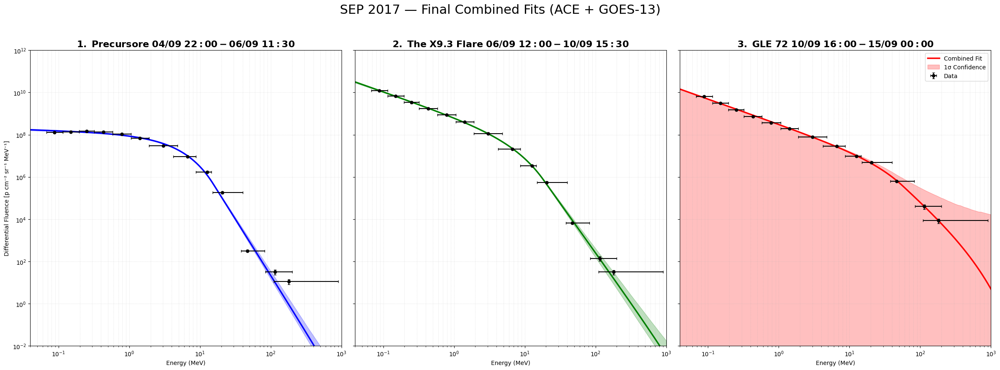

,Event,γ,E₀ [MeV],E_cut [MeV],χ²_ν
0,Event 04/09,0.11 ± 0.04,2.9 ± 0.1,2000 ± 15146,119.44
1,Event 06/09,1.17 ± 0.04,5.2 ± 0.3,2000 ± 16693,3.21
2,Event 10/09,1.19 ± 0.02,32.0 ± 17.0,336 ± 1880,1.07


In [54]:
# ===========================================================
# FIGURA DA TESI — FIT Combined + Confidence Bands
# ===========================================================

from scipy.stats import multivariate_normal

x_plot = np.logspace(np.log10(0.03), np.log10(1000), 1000)

fig, axes = plt.subplots(1, 3, figsize=(24, 9), sharey=True)

table_output = []

for i, (evt_name, data) in enumerate(results_test.items()):
    ax = axes[i]

    x, y = data["x"], data["y"]
    x_err, y_err = data["x_err"], data["y_err"]

    # Fit Combined
    p0 = [1e7, 1.5, 3.0, 20.0, 150.0]
    popt, pcov = fit_log_space(combined_function, x, y, y_err, p0,
                               bounds=([0, 0.1, 0.1, 0.5, 5],
                                       [np.inf, 10, 10, 400, 2000]))

    # best-fit curve
    y_fit = combined_function(x_plot, *popt)

    # Confidence bands (1σ usando campionamento multivariato)
    samples = multivariate_normal.rvs(mean=popt, cov=pcov, size=400)
    y_samples = np.array([combined_function(x_plot, *p) for p in samples])
    low = np.percentile(y_samples, 16, axis=0)
    high = np.percentile(y_samples, 84, axis=0)

    # Data plot
    ax.errorbar(x, y, yerr=y_err, xerr=x_err, fmt='o', color='black',
                markersize=5, capsize=2, zorder=10, label="Data")

    # Best-fit curve
    ax.plot(x_plot, y_fit, '-', color=data["color"], linewidth=2.5,
            label='Combined Fit')

    # Confidence band
    ax.fill_between(x_plot, low, high, alpha=0.25, color=data["color"],
                    label='1σ Confidence')

    # Axis scale
    ax.set_xscale('log'); ax.set_yscale('log')
    ax.set_xlim(0.04, 1000); ax.set_ylim(1e-2, 1e12)

    ax.set_title(list(color_map.values())[i]["title"], fontsize=16)
    ax.grid(True, which="both", linestyle=':', alpha=0.4)

    if i == 0:
        ax.set_ylabel("Differential Fluence [p cm⁻² sr⁻¹ MeV⁻¹]")

    ax.set_xlabel("Energy (MeV)")

    # Save parameters
    residuals = (y - combined_function(x, *popt)) / y_err
    chi_red = np.sum(residuals**2) / (len(y) - len(popt))

    table_output.append([
        evt_name,
        f"{popt[1]:.2f} ± {np.sqrt(pcov[1,1]):.2f}",
        f"{popt[3]:.1f} ± {np.sqrt(pcov[3,3]):.1f}",
        f"{popt[4]:.0f} ± {np.sqrt(pcov[4,4]):.0f}",
        f"{chi_red:.2f}"
    ])

plt.suptitle("SEP 2017 — Final Combined Fits (ACE + GOES-13)", fontsize=22)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.legend()
plt.show()

import pandas as pd
df_params = pd.DataFrame(table_output,
    columns=["Event", "γ", "E₀ [MeV]", "E_cut [MeV]", "χ²_ν"])
df_params


--- Esecuzione FIT completo ACE + GOES — RANGE 0.04–700 MeV ---


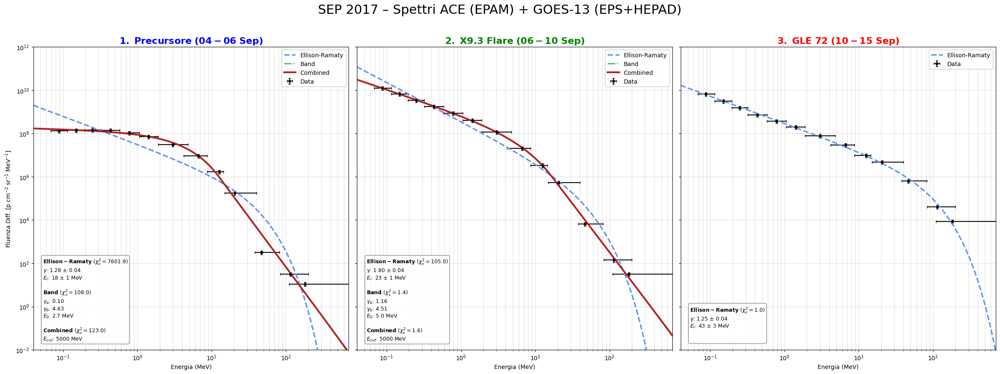

In [57]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit

# ===== MODELLI SPETTRALI =====

def ellison_ramaty(E, A, gamma, Er):
    return A * (E**(-gamma)) * np.exp(-E/Er)

def band_function(E, A, ga, gb, E0):
    if gb <= ga:
        return np.ones_like(E) * 1e-30

    E_break = (gb - ga) * E0
    if E_break <= 0:
        return np.ones_like(E) * 1e-30

    res = np.zeros_like(E)
    mask_low = E < E_break

    res[mask_low] = A * (E[mask_low]**(-ga)) * np.exp(-E[mask_low]/E0)

    norm_factor = (E_break**(gb-ga)) * np.exp(ga-gb)
    res[~mask_low] = A * (E[~mask_low]**(-gb)) * norm_factor
    return res

def combined_function(E, A, ga, gb, E0, Er):
    return band_function(E, A, ga, gb, E0) * np.exp(-E/Er)

# ===== FIT LOG =====

def fit_log_space(func, x, y, y_err, p0, bounds):
    def log_func(x_in, *params):
        return np.log10(np.maximum(func(x_in, *params), 1e-30))
    
    sigma_log = y_err / (y * np.log(10))
    sigma_log = np.nan_to_num(sigma_log, nan=1, posinf=1, neginf=1)

    try:
        return curve_fit(log_func, x, np.log10(y),
                         p0=p0, sigma=sigma_log,
                         absolute_sigma=True,
                         bounds=bounds, maxfev=20000)
    except:
        return None, None

# ===== STAT BOX =====

def get_stats_text(model_name, func, x, y, y_err, popt, pcov):
    if popt is None:
        return f"{model_name}: Fit Failed"

    res = (y - func(x, *popt)) / y_err
    chi_red = np.sum(res**2) / (len(y) - len(popt))

    perr = np.sqrt(np.diag(pcov))
    txt = rf"$\bf{{{model_name}}}$ ($\chi^2_\nu={chi_red:.1f}$)" + "\n"

    if model_name == "Ellison-Ramaty":
        txt += rf"$\gamma$: {popt[1]:.2f} ± {perr[1]:.2f}"+"\n"
        txt += rf"$E_r$: {popt[2]:.0f} ± {perr[2]:.0f} MeV"
    elif model_name == "Band":
        txt += rf"$\gamma_a$: {popt[1]:.2f}"+"\n"
        txt += rf"$\gamma_b$: {popt[2]:.2f}"+"\n"
        txt += rf"$E_0$: {popt[3]:.1f} MeV"
    elif model_name == "Combined":
        txt += rf"$E_{{cut}}$: {popt[4]:.0f} MeV"
    return txt


# ===== SUPER-PLOT =====

x_plot = np.logspace(np.log10(0.04), np.log10(700), 1000)

fig, axes = plt.subplots(1, 3, figsize=(24, 9), sharey=True)

titles = [
    r"$\bf{1.\ Precursore \ (04-06\ Sep)}$",
    r"$\bf{2.\ X9.3 \ Flare \ (06-10\ Sep)}$",
    r"$\bf{3.\ GLE\ 72 \ (10-15\ Sep)}$"
]
colors = ["blue", "green", "red"]

print("--- Esecuzione FIT completo ACE + GOES — RANGE 0.04–700 MeV ---")

for i, (evt, data) in enumerate(results.items()):
    ax = axes[i]

    x = data["x"]
    y = data["y"]
    x_err = [np.abs(data["x_err"][0]), np.abs(data["x_err"][1])]
    y_err = y * 0.20

    ax.errorbar(x, y, yerr=y_err, xerr=x_err,
                fmt='o', markersize=4, color='black',
                ecolor='black', capsize=2, label="Data")

    stats = ""

    # ========== ER SU TUTTI ==========
    p0 = [1e8, 1.5, 100]
    popt_er, pcov_er = fit_log_space(
        ellison_ramaty, x, y, y_err, p0,
        bounds=([0,0,0], [1e15, 10, 10000])
    )
    if popt_er is not None:
        ax.plot(x_plot, ellison_ramaty(x_plot, *popt_er),
                '--', lw=2.5, color="cornflowerblue",
                label="Ellison-Ramaty")
        stats += get_stats_text("Ellison-Ramaty",
                                ellison_ramaty, x, y, y_err,
                                popt_er, pcov_er) + "\n\n"

    # ========== BAND + COMBINED SOLO 1-2 ==========
    if i < 2:
        p0b = [1e7, 1.0, 3.0, 10.0]
        popt_b, pcov_b = fit_log_space(
            band_function, x, y, y_err, p0b,
            bounds=([0,0.1,0.1,1], [1e15,10,10,500])
        )
        if popt_b is not None:
            ax.plot(x_plot, band_function(x_plot, *popt_b),
                    '-.', lw=2, color="mediumseagreen",
                    label="Band")
            stats += get_stats_text("Band",
                                    band_function, x, y, y_err,
                                    popt_b, pcov_b) + "\n\n"

        if popt_b is not None:
            p0c = [*popt_b, 800.0]
            popt_c, pcov_c = fit_log_space(
                combined_function, x, y, y_err, p0c,
                bounds=([0,0.1,0.1,1,10],
                        [1e15,10,10,500,5000])
            )
            if popt_c is not None:
                ax.plot(x_plot, combined_function(x_plot, *popt_c),
                        '-', lw=3, color="firebrick",
                        label="Combined")
                stats += get_stats_text("Combined",
                                        combined_function, x, y, y_err,
                                        popt_c, pcov_c)

    ax.set_title(titles[i], fontsize=16, color=colors[i], fontweight="bold")
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_xlim(0.04, 700)
    ax.set_ylim(1e-2, 1e12)
    ax.grid(True, which="both", alpha=0.4)

    if i == 0:
        ax.set_ylabel(r"Fluenza Diff. [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]")

    ax.set_xlabel("Energia (MeV)")

    ax.legend(fontsize=10, framealpha=0.95)
    ax.text(0.03, 0.03, stats,
            transform=ax.transAxes,
            fontsize=9,
            bbox=dict(boxstyle="round",
                      facecolor='white',
                      alpha=0.92,
                      edgecolor='gray'))

plt.suptitle("SEP 2017 – Spettri ACE (EPAM) + GOES-13 (EPS+HEPAD)",
             fontsize=22, y=0.99)
plt.tight_layout(rect=[0,0,1,0.97])
plt.show()


# JUL 2012

Tentativo caricamento robusto: File_scaricati_eventiSEP/Evento JUL 2012/STA_L1_HET_3600960.txt
Dati trovati alla riga: 53
Date caricate: 18627 righe. Da 2012-07-19 00:00:58 a 2012-07-31 23:59:57

Dati pronti!
                     P_13.6_15.1_MeV  P_15.0_17.1_MeV  P_17.0_19.3_MeV  \
epoch                                                                    
2012-07-19 00:00:58              NaN              NaN              NaN   
2012-07-19 00:01:58              NaN              NaN              NaN   
2012-07-19 00:02:58         0.098530              NaN         0.235952   
2012-07-19 00:03:58         0.078851              NaN         0.127095   
2012-07-19 00:04:58         0.078797              0.0         0.163295   

                     P_20.8_23.8_MeV  P_23.8_26.4_MeV  P_26.3_29.7_MeV  \
epoch                                                                    
2012-07-19 00:00:58              NaN              NaN              NaN   
2012-07-19 00:01:58              NaN              

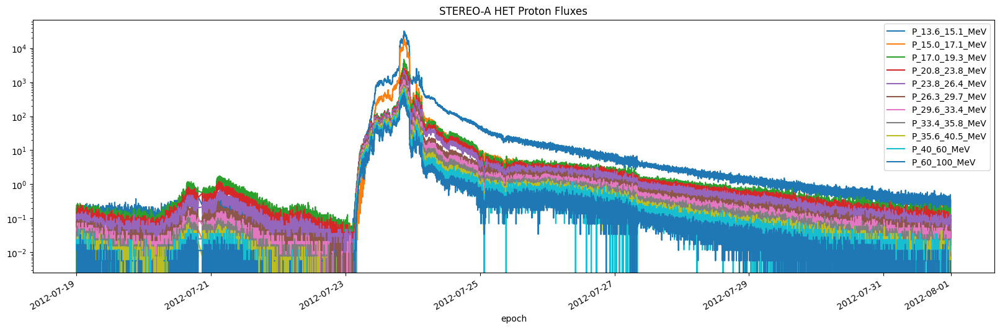

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def load_stereo_het_robust(file_path):
    print(f"Tentativo caricamento robusto: {file_path}")
    
    # 1. Troviamo la riga dove iniziano i dati (saltiamo l'header che inizia con caratteri non numerici)
    header_rows = 0
    with open(file_path, 'r') as f:
        for line in f:
            # Se la riga inizia con un numero, probabilmente sono dati
            if line.strip() and line.strip()[0].isdigit():
                break
            header_rows += 1
            
    print(f"Dati trovati alla riga: {header_rows}")

    # 2. Carichiamo tutto come stringhe inizialmente
    try:
        # header=None perché l'header è sopra e complesso
        df = pd.read_csv(file_path, sep=r'\s+', skiprows=header_rows, header=None, dtype=str)
    except Exception as e:
        print(f"Errore lettura: {e}")
        return None

    # 3. Costruiamo la data (Colonne 0 e 1)
    # Proviamo vari formati comuni per STEREO
    time_str = df[0] + ' ' + df[1]
    
    # Tentativo 1: Giorno-Mese-Anno (dd-mm-yyyy)
    df['epoch'] = pd.to_datetime(time_str, format='%d-%m-%Y %H:%M:%S.%f', errors='coerce')
    
    # Se fallisce (tutti NaT), proviamo Anno-Mese-Giorno
    if df['epoch'].isna().all():
        print("Formato data standard fallito, provo alternative...")
        df['epoch'] = pd.to_datetime(time_str, errors='coerce') # Lasciamo fare a pandas

    # Rimuoviamo righe con date non valide
    df = df.dropna(subset=['epoch'])
    df.set_index('epoch', inplace=True)
    
    if df.empty:
        print("ERRORE: Nessuna data valida trovata. Controlla il formato nel file.")
        return None

    print(f"Date caricate: {len(df)} righe. Da {df.index.min()} a {df.index.max()}")

    # 4. Mappatura Colonne Protoni
    # STEREO HET L1 ha molte colonne. I protoni di solito sono dal blocco 8 in poi.
    # Controlla l'header del file di testo per essere sicuro!
    # Qui assumiamo la struttura standard:
    # 0:Date, 1:Time, 2-4:Ele, 5-7:Ele_B, 8-18:Protoni
    
    # Indici colonna nel dataframe caricato (che ha perso 0 e 1 perché diventati indice)
    # Quindi la vecchia colonna 8 diventa la 6 (0->data, 1->ora, 2->E1...)
    # Verifichiamo:
    # Raw: 0(Date), 1(Time), 2(E1), 3(E2), 4(E3), 5(E1b), 6(E2b), 7(E3b), 8(P1)...
    # Pandas dopo set_index: 2(E1)... 7(E3b), 8(P1) -> che ora è la colonna indice 6
    
    # Mappiamo usando gli indici interi (iloc)
    col_mapping = {
        6: 'P_13.6_15.1_MeV',
        7: 'P_15.0_17.1_MeV',
        8: 'P_17.0_19.3_MeV',
        9: 'P_20.8_23.8_MeV',
        10: 'P_23.8_26.4_MeV',
        11: 'P_26.3_29.7_MeV',
        12: 'P_29.6_33.4_MeV',
        13: 'P_33.4_35.8_MeV',
        14: 'P_35.6_40.5_MeV',
        15: 'P_40_60_MeV',
        16: 'P_60_100_MeV'
    }
    
    df_clean = pd.DataFrame(index=df.index)
    
    for idx, name in col_mapping.items():
        if idx < len(df.columns):
            # Convertiamo in numeri e puliamo
            series = pd.to_numeric(df.iloc[:, idx], errors='coerce')
            # Filtro: rimuove i valori che si discostano troppo dalla mediana locale (finestra di 5 min)
            series = series.where(series < series.rolling(window=5, center=True).median() * 3)
            df_clean[name] = series.clip(lower=0)
        else:
            print(f"Attenzione: Colonna {idx} non trovata nel file.")

    return df_clean

# --- ESECUZIONE ---
df_het = load_stereo_het_robust("File_scaricati_eventiSEP/Evento JUL 2012/STA_L1_HET_3600960.txt")

if df_het is not None and not df_het.empty:
    print("\nDati pronti!")
    print(df_het.head())
    df_het.plot(logy=True, figsize=(20, 6), title="STEREO-A HET Proton Fluxes")
    plt.show()
else:
    print("Caricamento fallito.")

# Calcolo FLLUENZA HET 


--- Calcolo Fluenze Integrate HET (Ottimizzato per Gap) ---
STEREO-A Jul 2012: 11 canali integrati correttamente.
--------------------------------------------------
ANALISI TAIL (Joyce et al. 2015 Method)
Bin di calcolo: 49.0 MeV e 77.5 MeV
Pendenza spettrale rilevata (gamma_tail): 0.611
--------------------------------------------------


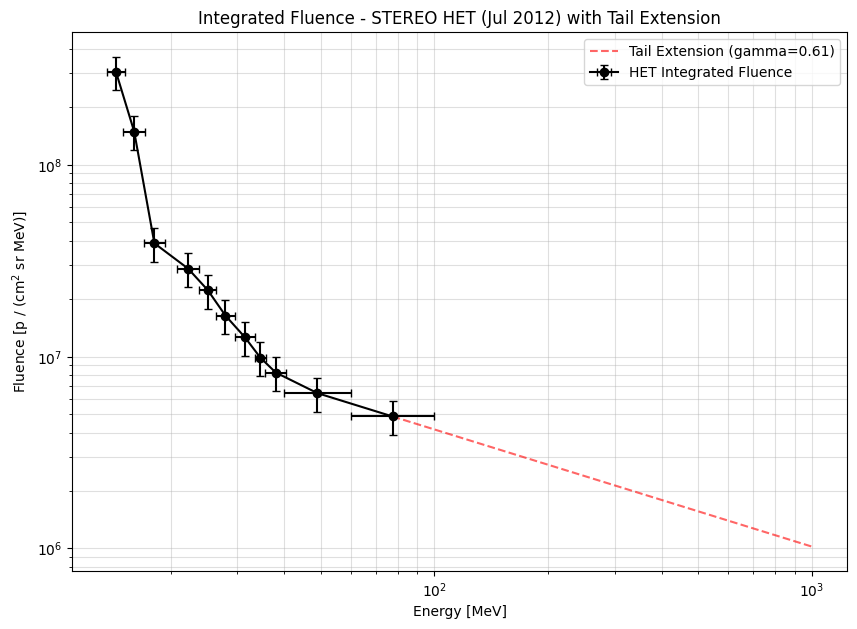

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ==========================================
# 1. SETUP: CANALI & ENERGIE (HET)
# ==========================================
het_bins = {
    'P_13.6_15.1_MeV': (13.6, 15.1),
    'P_15.0_17.1_MeV': (15.0, 17.1),
    'P_17.0_19.3_MeV': (17.0, 19.3),
    'P_20.8_23.8_MeV': (20.8, 23.8),
    'P_23.8_26.4_MeV': (23.8, 26.4),
    'P_26.3_29.7_MeV': (26.3, 29.7),
    'P_29.6_33.4_MeV': (29.6, 33.4),
    'P_33.4_35.8_MeV': (33.4, 35.8),
    'P_35.6_40.5_MeV': (35.6, 40.5),
    'P_40_60_MeV':     (40.0, 60.0),
    'P_60_100_MeV':    (60.0, 100.0)
}

het_eff_map = {col: np.sqrt(b[0] * b[1]) for col, b in het_bins.items()}

events_dict_het = {
    "STEREO-A Jul 2012": {
        "start": "2012-07-23 02:00:00", 
        "end":   "2012-07-28 00:00:00", 
        "color": "black"
    }
}

# ==========================================
# 2. PREPARAZIONE DATI (Background Subtraction)
# ==========================================
if 'df_het' in globals():
    bg_start, bg_end = "2012-07-21 00:00:00", "2012-07-22 00:00:00"
    bg_level = df_het.loc[bg_start:bg_end].mean()
    df_het_corr = (df_het - bg_level)
else:
    raise NameError("ERRORE: Esegui prima la cella di caricamento 'df_het'!")

# ==========================================
# 3. CALCOLO DELLA FLUENZA INTEGRATA
# ==========================================
results_HET = {}
MAX_DT_GAP = 1800 

print("--- Calcolo Fluenze Integrate HET (Ottimizzato per Gap) ---")

for name, params in events_dict_het.items():
    df_slice = df_het_corr.loc[params['start']:params['end']]
    dt_seconds = df_slice.index.to_series().diff().dt.total_seconds().fillna(60).clip(upper=MAX_DT_GAP) 
    
    fluences, energies, y_err_list = [], [], []
    x_err_low, x_err_high = [], []
    
    for col, (E_min, E_max) in het_bins.items():
        if col in df_slice.columns:
            flux_clean = df_slice[col].fillna(0).clip(lower=0)
            fluence_val = (flux_clean * dt_seconds).sum()
            
            if fluence_val > 0:
                e_eff = het_eff_map[col]
                fluences.append(fluence_val)
                energies.append(e_eff)
                
                # Incertezza (20% sistematico + Poissoniana) come nel paper
                y_err_list.append(np.sqrt((0.20 * fluence_val)**2 + fluence_val))
                x_err_low.append(abs(e_eff - E_min))
                x_err_high.append(abs(E_max - e_eff))
    
    # Ordinamento e salvataggio
    arr_x = np.array(energies)
    sort_idx = np.argsort(arr_x)
    results_HET[name] = {
        'x': arr_x[sort_idx],
        'y': np.array(fluences)[sort_idx],
        'y_err': np.array(y_err_list)[sort_idx],
        'x_err': [np.array(x_err_low)[sort_idx], np.array(x_err_high)[sort_idx]],
        'color': params['color']
    }
    print(f"{name}: {len(fluences)} canali integrati correttamente.")

# =========================================================
# 4. ANALISI TAIL (Metodo Joyce et al. 2015)
# =========================================================
# Calcoliamo la pendenza gamma tra gli ultimi due bin (49 MeV e 77.5 MeV circa)
data_h = results_HET["STEREO-A Jul 2012"]
e1, e2 = data_h['x'][-2], data_h['x'][-1]
f1, f2 = data_h['y'][-2], data_h['y'][-1]

gamma_tail = -(np.log10(f2) - np.log10(f1)) / (np.log10(e2) - np.log10(e1))

print("-" * 50)
print(f"ANALISI TAIL (Joyce et al. 2015 Method)")
print(f"Bin di calcolo: {e1:.1f} MeV e {e2:.1f} MeV")
print(f"Pendenza spettrale rilevata (gamma_tail): {gamma_tail:.3f}")
print("-" * 50)

# ==========================================
# 5. PLOT DI VERIFICA CON ESTENSIONE GeV
# ==========================================
plt.figure(figsize=(10, 7))
plt.errorbar(data_h['x'], data_h['y'], xerr=data_h['x_err'], yerr=data_h['y_err'], 
             fmt='ko-', label='HET Integrated Fluence', capsize=3)

# Estensione teorica a 1 GeV
e_ext = np.logspace(np.log10(e2), 3, 50)
f_ext = f2 * (e_ext / e2)**(-gamma_tail)
plt.plot(e_ext, f_ext, 'r--', alpha=0.6, label=f'Tail Extension (gamma={gamma_tail:.2f})')

plt.xscale('log'); plt.yscale('log')
plt.xlabel('Energy [MeV]'); plt.ylabel('Fluence [p / (cm$^2$ sr MeV)]')
plt.title('Integrated Fluence - STEREO HET (Jul 2012) with Tail Extension')
plt.grid(True, which="both", alpha=0.4); plt.legend()
plt.show()

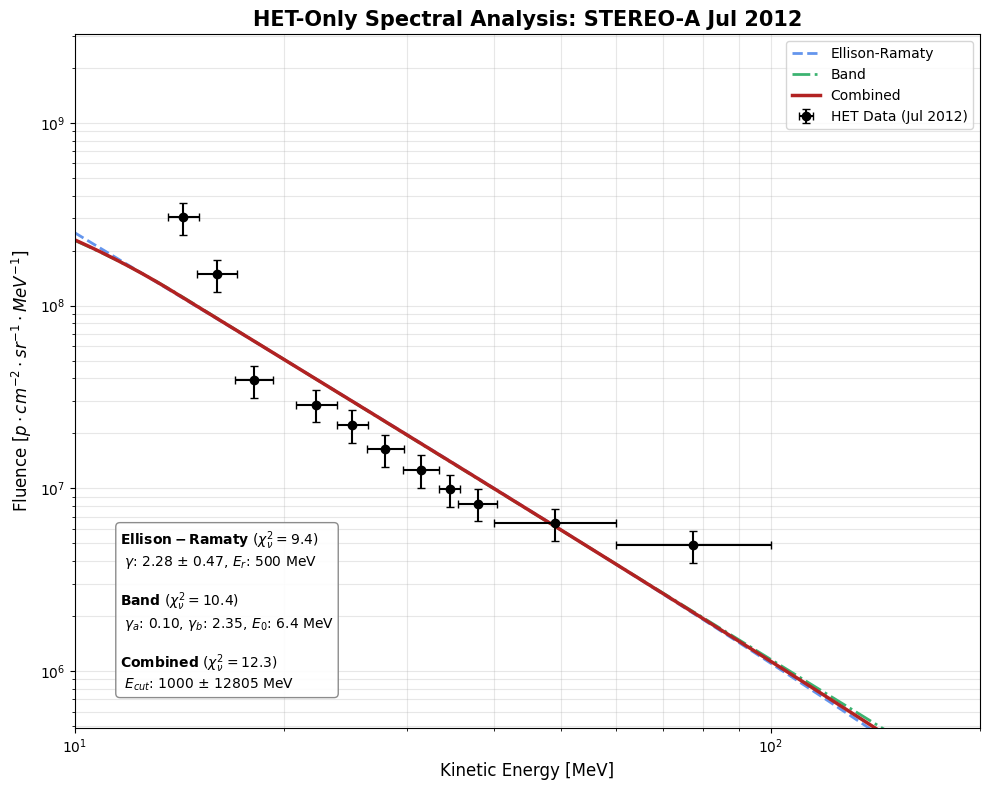

In [24]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit

# ==========================================
# 1. DEFINIZIONE MODELLI (Logica "Safe")
# ==========================================
def ellison_ramaty(E, A, gamma, Er):
    return A * (E**(-gamma)) * np.exp(-E/Er)

def band_function(E, A, ga, gb, E0):
    if gb <= ga: return np.ones_like(E) * 1e-30 
    E_break = (gb - ga) * E0
    if E_break <= 0: return np.ones_like(E) * 1e-30
    
    res = np.zeros_like(E)
    mask_low = E < E_break
    res[mask_low] = A * (E[mask_low] ** -ga) * np.exp(-E[mask_low] / E0)
    norm_factor = (E_break ** (gb - ga)) * np.exp(ga - gb)
    res[~mask_low] = A * (E[~mask_low] ** -gb) * norm_factor
    return res

def combined_function(E, A, ga, gb, E0, Er):
    return band_function(E, A, ga, gb, E0) * np.exp(-E/Er)

# ==========================================
# 2. LOGICA DI FIT & STATISTICHE
# ==========================================
def fit_log_space(func, x, y, y_err, p0, bounds=(-np.inf, np.inf)):
    def log_func(x_in, *params):
        return np.log10(np.maximum(func(x_in, *params), 1e-35))
    
    sigma_log = y_err / (y * np.log(10))
    sigma_log = np.nan_to_num(sigma_log, nan=1.0)

    try:
        popt, pcov = curve_fit(log_func, x, np.log10(y), p0=p0, sigma=sigma_log, 
                               absolute_sigma=True, bounds=bounds, maxfev=20000)
        return popt, pcov
    except:
        return None, None

def get_stats_text(model_name, func, x, y, y_err, popt, pcov):
    if popt is None: return f"{model_name}: Fit Failed"
    
    residuals = (np.log10(y) - np.log10(func(x, *popt))) / (y_err / (y * np.log(10)))
    chi_sq = np.sum(residuals**2)
    dof = len(y) - len(popt)
    chi_red = chi_sq / dof if dof > 0 else 0.0
    perr = np.sqrt(np.diag(pcov))

    txt = rf"$\bf{{{model_name}}}$ ($\chi^2_\nu={chi_red:.1f}$)" + "\n"
    if model_name == "Ellison-Ramaty":
        txt += rf" $\gamma$: {popt[1]:.2f} $\pm$ {perr[1]:.2f}, $E_r$: {popt[2]:.0f} MeV"
    elif model_name == "Band":
        txt += rf" $\gamma_a$: {popt[1]:.2f}, $\gamma_b$: {popt[2]:.2f}, $E_0$: {popt[3]:.1f} MeV"
    elif model_name == "Combined":
        txt += rf" $E_{{cut}}$: {popt[4]:.0f} $\pm$ {perr[4]:.0f} MeV"
    return txt

# ==========================================
# 3. ESECUZIONE FIT SU DATI HET (Jul 2012)
# ==========================================
event_key = "STEREO-A Jul 2012"
data = results_HET[event_key]

x = data['x']
y = data['y']
y_err = data['y_err'] 
x_errs_clean = [np.abs(data['x_err'][0]), np.abs(data['x_err'][1])]

# Range per il plot
x_plot = np.logspace(np.log10(10), np.log10(200), 200)

fig, ax = plt.subplots(figsize=(10, 8))

# --- PLOT DATI ---
ax.errorbar(x, y, yerr=y_err, xerr=x_errs_clean, fmt='o', color='black', 
            capsize=3, markersize=6, label='HET Data (Jul 2012)', zorder=10)

stats_box = ""

# --- A. FIT ELLISON-RAMATY ---
# p0: [A, gamma, Er] -> Er stimato intorno a 50 MeV per HET
p0_er = [1e8, 1.5, 50.0]
popt_er, pcov_er = fit_log_space(ellison_ramaty, x, y, y_err, p0_er, 
                                 bounds=([1e4, 0.1, 5], [1e13, 5, 500]))

if popt_er is not None:
    ax.plot(x_plot, ellison_ramaty(x_plot, *popt_er), '--', color='cornflowerblue', lw=2, label='Ellison-Ramaty')
    stats_box += get_stats_text("Ellison-Ramaty", ellison_ramaty, x, y, y_err, popt_er, pcov_er) + "\n\n"

# --- B. FIT BAND FUNCTION ---
# p0: [A, ga, gb, E0]
p0_b = [1e7, 1.1, 3.5, 20.0]
popt_b, pcov_b = fit_log_space(band_function, x, y, y_err, p0_b, 
                               bounds=([1e4, 0.1, 1.5, 2], [1e12, 3, 7, 150]))

if popt_b is not None:
    ax.plot(x_plot, band_function(x_plot, *popt_b), '-.', color='mediumseagreen', lw=2, label='Band')
    stats_box += get_stats_text("Band", band_function, x, y, y_err, popt_b, pcov_b) + "\n\n"

# --- C. FIT COMBINED ---
if popt_b is not None:
    p0_c = [*popt_b, 100.0]
    popt_c, pcov_c = fit_log_space(combined_function, x, y, y_err, p0_c, 
                                   bounds=([1e4, 0.1, 1.5, 2, 10], [1e12, 3, 7, 150, 1000]))
    if popt_c is not None:
        ax.plot(x_plot, combined_function(x_plot, *popt_c), '-', color='firebrick', lw=2.5, label='Combined')
        stats_box += get_stats_text("Combined", combined_function, x, y, y_err, popt_c, pcov_c)

# --- STYLING ---
ax.set_xscale('log'); ax.set_yscale('log')
ax.set_xlim(10, 200); ax.set_ylim(min(y)*0.1, max(y)*10)
ax.set_xlabel("Kinetic Energy [MeV]", fontsize=12)
ax.set_ylabel(r"Fluence $[p \cdot cm^{-2} \cdot sr^{-1} \cdot MeV^{-1}]$", fontsize=12)
ax.set_title(f"HET-Only Spectral Analysis: {event_key}", fontsize=15, fontweight='bold')
ax.grid(True, which="both", alpha=0.3)
ax.legend(loc='upper right', fontsize=10)

# Box Statistiche
ax.text(0.05, 0.05, stats_box, transform=ax.transAxes, fontsize=10, verticalalignment='bottom',
        bbox=dict(boxstyle="round", facecolor='white', alpha=0.9, edgecolor='gray'))

plt.tight_layout()
plt.show()

# CARICAMENTO DATI HET corretti

Background medio sottratto per canale:
 P_13.6_15.1_MeV     0.329643
P_14.9_17.1_MeV     0.208910
P_17.0_19.3_MeV     0.117516
P_20.8_23.8_MeV     0.042357
P_23.8_26.4_MeV     0.023504
P_26.3_29.7_MeV     0.013756
P_29.5_33.4_MeV     0.007987
P_33.4_35.8_MeV     0.005069
P_35.5_40.5_MeV     0.002908
P_40.0_60.0_MeV     0.001076
P_60.0_100.0_MeV    0.000470
dtype: float64


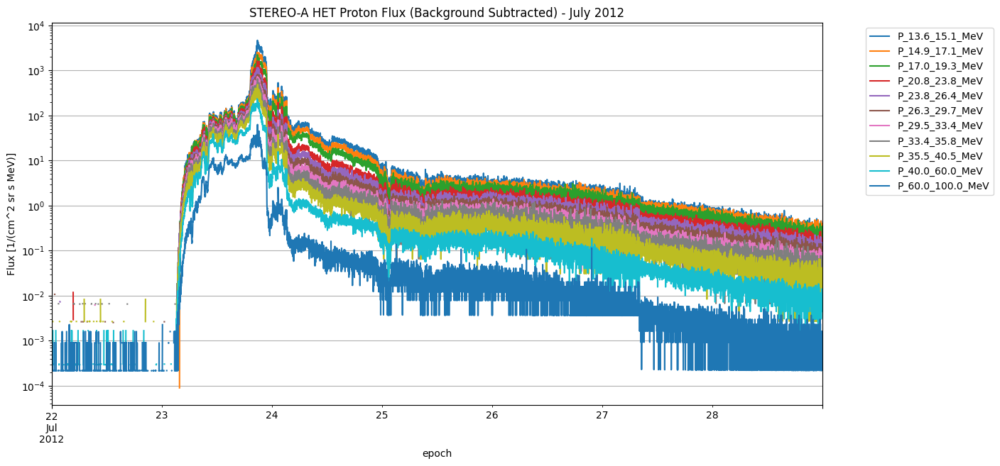

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def load_stereo_het_full_analysis(file_path):
    # 1. Identificazione inizio dati dopo l'header
    skip = 0
    with open(file_path, 'r') as f:
        for i, line in enumerate(f):
            if "#End" in line:
                skip = i + 1
                break
    
    # 2. Caricamento e parsing date
    df = pd.read_csv(file_path, sep=r'\s+', skiprows=skip, header=None, dtype=str)
    time_str = df[1] + " " + df[2] + " " + df[3] + " " + df[4]
    df['epoch'] = pd.to_datetime(time_str, format='%Y %b %d %H%M', errors='coerce')
    df = df.dropna(subset=['epoch']).set_index('epoch')
    
    # 3. Mappatura canali Protoni (Intensity columns)
    col_mapping = {
        11: 'P_13.6_15.1_MeV', 13: 'P_14.9_17.1_MeV', 15: 'P_17.0_19.3_MeV',
        17: 'P_20.8_23.8_MeV', 19: 'P_23.8_26.4_MeV', 21: 'P_26.3_29.7_MeV',
        23: 'P_29.5_33.4_MeV', 25: 'P_33.4_35.8_MeV', 27: 'P_35.5_40.5_MeV',
        29: 'P_40.0_60.0_MeV', 31: 'P_60.0_100.0_MeV'
    }
    
    df_raw = pd.DataFrame(index=df.index)
    for idx, name in col_mapping.items():
        df_raw[name] = pd.to_numeric(df[idx], errors='coerce').clip(lower=0)

    # 4. SOTTRAZIONE BACKGROUND
    # Usiamo il periodo 20-22 Luglio come "quiet time"
    bg_start, bg_end = '2012-07-20', '2012-07-22'
    bg_mean = df_raw.loc[bg_start:bg_end].mean()
    
    # Sottraiamo il fondo (i valori negativi diventano NaN per il log plot)
    df_subtracted = df_raw.sub(bg_mean, axis=1)
    df_subtracted = df_subtracted.where(df_subtracted > 0, np.nan) 

    # 5. Selezione intervallo evento
    df_event = df_subtracted.loc['2012-07-22':'2012-07-28']
    
    return df_event, bg_mean

# --- ESECUZIONE ---
path = "File_scaricati_eventiSEP/Evento JUL 2012/AeH12Jul.1m" # Assicurati che il file sia in questa cartella
df_het_clean, background = load_stereo_het_full_analysis(path)

# Visualizzazione
print("Background medio sottratto per canale:\n", background)
df_het_clean.plot(logy=True, figsize=(14, 7), grid=True)
plt.title("STEREO-A HET Proton Flux (Background Subtracted) - July 2012")
plt.ylabel("Flux [1/(cm^2 sr s MeV)]")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# CARICAMENTO DATI HET (final)  $\mu+3\sigma$ BACKGROUND CLEANED

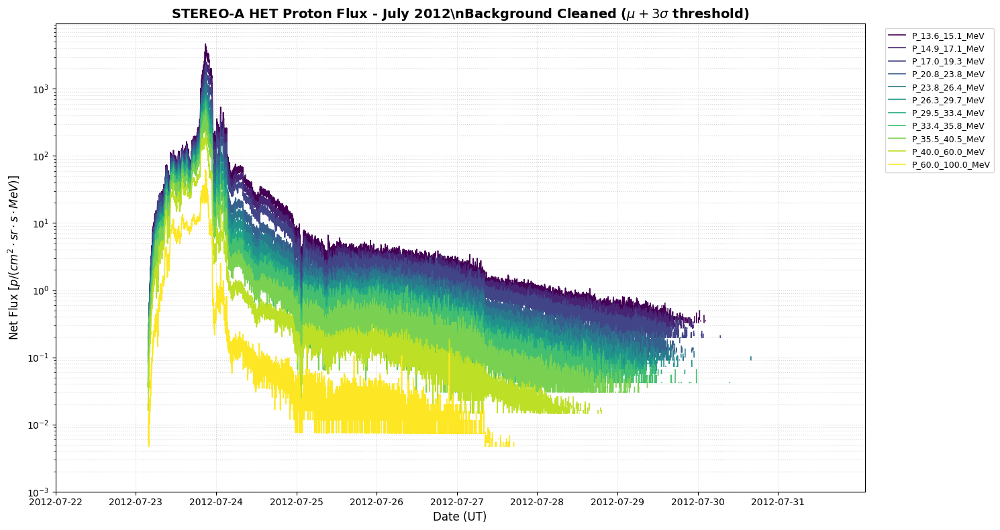

Pulizia completata. Canali elaborati: 11


In [81]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def load_stereo_het_rigorous(file_path):
    # 1. Identificazione inizio dati dopo l'header
    skip = 0
    with open(file_path, 'r') as f:
        for i, line in enumerate(f):
            if "#End" in line:
                skip = i + 1
                break
    
    # 2. Caricamento e parsing date
    df = pd.read_csv(file_path, sep=r'\s+', skiprows=skip, header=None, dtype=str)
    time_str = df[1] + " " + df[2] + " " + df[3] + " " + df[4]
    df['epoch'] = pd.to_datetime(time_str, format='%Y %b %d %H%M', errors='coerce')
    df = df.dropna(subset=['epoch']).set_index('epoch')
    
    # 3. Mappatura canali Protoni
    col_mapping = {
        11: 'P_13.6_15.1_MeV', 13: 'P_14.9_17.1_MeV', 15: 'P_17.0_19.3_MeV',
        17: 'P_20.8_23.8_MeV', 19: 'P_23.8_26.4_MeV', 21: 'P_26.3_29.7_MeV',
        23: 'P_29.5_33.4_MeV', 25: 'P_33.4_35.8_MeV', 27: 'P_35.5_40.5_MeV',
        29: 'P_40.0_60.0_MeV', 31: 'P_60.0_100.0_MeV'
    }
    
    df_raw = pd.DataFrame(index=df.index)
    for idx, name in col_mapping.items():
        df_raw[name] = pd.to_numeric(df[idx], errors='coerce').clip(lower=0)

    # 4. RIMOZIONE BACKGROUND RIGOROSA (mu + 3*sigma)
    # Intervallo di quiete pre-evento per STEREO-A
    bg_start, bg_end = '2012-07-01 00:00', '2012-07-19 00:00'
    bg_period = df_raw.loc[bg_start:bg_end]
    
    mu = bg_period.mean()
    sigma = bg_period.std()
    threshold = mu + 3 * sigma  # Criterio statistico di confidenza al 99.7%
    
    df_corr = df_raw.copy()
    for col in df_raw.columns:
        # Sottrazione del valore medio
        df_corr[col] = df_raw[col] - mu[col]
        # Mascheramento: se il dato originale è < mu+3sigma, impostiamo a NaN
        # Questo pulisce il grafico e previene integrazioni errate del rumore
        df_corr.loc[df_raw[col] < threshold[col], col] = np.nan
        
    # 5. Selezione intervallo evento
    df_event = df_corr.loc['2012-07-22':'2012-07-31']
    
    return df_event, mu, threshold

# --- ESECUZIONE ---
path = "File_scaricati_eventiSEP/Evento JUL 2012/AeH12Jul.1m"
df_het_clean, bg_mu, bg_thresh = load_stereo_het_rigorous(path)

# Visualizzazione professionale
plt.figure(figsize=(15, 8))
# Colormap viridis per migliore distinguibilità scientifica
colors = plt.cm.viridis(np.linspace(0, 1, len(df_het_clean.columns)))

for i, col in enumerate(df_het_clean.columns):
    plt.plot(df_het_clean.index, df_het_clean[col], label=col, color=colors[i], lw=1.2)

plt.yscale('log')
plt.grid(True, which="both", ls=':', alpha=0.5)
plt.title(r"STEREO-A HET Proton Flux - July 2012\nBackground Cleaned ($\mu + 3\sigma$ threshold)", 
          fontsize=14, fontweight='bold')
plt.ylabel(r"Net Flux [$p / (cm^2 \cdot sr \cdot s \cdot MeV)$]", fontsize=12)
plt.xlabel("Date (UT)", fontsize=12)
plt.ylim(bottom=1e-3)
#plot on x axis every day a tick
plt.xticks(pd.date_range(start=df_het_clean.index.min().date(), end=df_het_clean.index.max().date(), freq='D'))
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=9, frameon=True)
plt.tight_layout()
plt.show()

print(f"Pulizia completata. Canali elaborati: {len(df_het_clean.columns)}")

# CALCOLO FLUENZA 

--- Calcolo Fluenza Integrata STEREO-A HET ---
Periodo: 2012-07-23 18:00:00 a 2012-07-31 00:00:00
-------------------------------------------------------
Indice spettrale alle alte energie (gamma): 3.636
Punti integrati: 11
-------------------------------------------------------


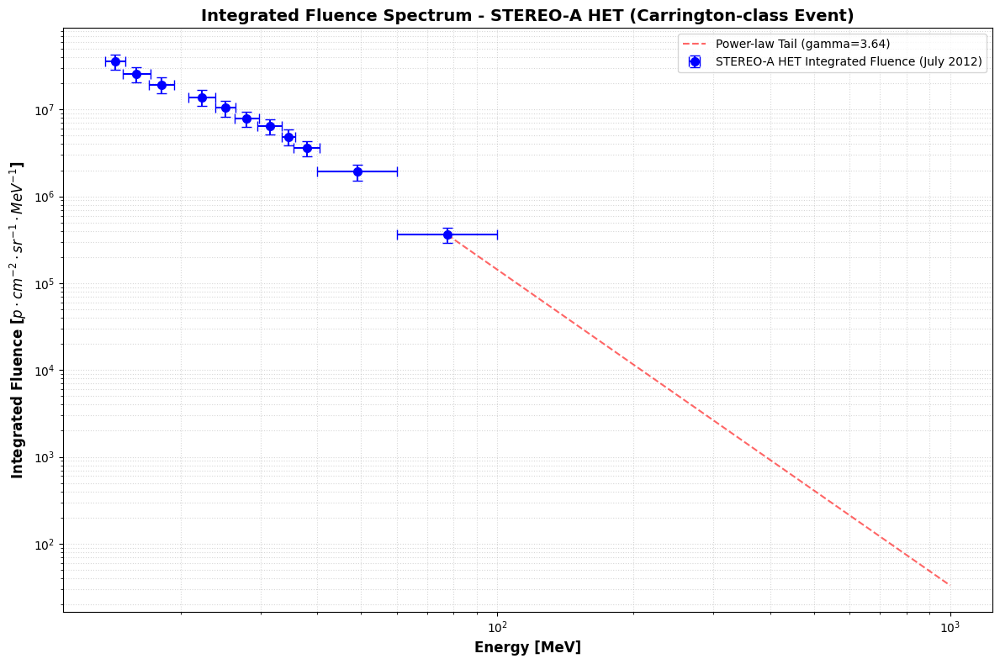

Elaborazione fluenza HET completata.


In [99]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =========================================================
# 1. SETUP: BIN ENERGETICI E ENERGIE EFFETTIVE (HET)
# =========================================================
het_bins = {
    'P_13.6_15.1_MeV': (13.6, 15.1),
    'P_14.9_17.1_MeV': (14.9, 17.1),
    'P_17.0_19.3_MeV': (17.0, 19.3),
    'P_20.8_23.8_MeV': (20.8, 23.8),
    'P_23.8_26.4_MeV': (23.8, 26.4),
    'P_26.3_29.7_MeV': (26.3, 29.7),
    'P_29.5_33.4_MeV': (29.5, 33.4),
    'P_33.4_35.8_MeV': (33.4, 35.8),
    'P_35.5_40.5_MeV': (35.5, 40.5),
    'P_40.0_60.0_MeV': (40.0, 60.0),
    'P_60.0_100.0_MeV':(60.0, 100.0)
}

# Calcolo energie medie geometriche per il fitting
het_eff_map = {col: np.sqrt(b[0] * b[1]) for col, b in het_bins.items()}

# =========================================================
# 2. CALCOLO DELLA FLUENZA INTEGRATA (Intervallo Carrington)
# =========================================================
# Usiamo le date ottimizzate per l'evento Carrington-class
t_start_int, t_end_int = "2012-07-23 18:00:00", "2012-07-31 00:00:00"
df_event_int = df_het_clean.loc[t_start_int:t_end_int]

# Calcolo del delta_t variabile (in secondi) tra i campionamenti
# Clip a 1800s per sicurezza in caso di gap nei dati
dt_seconds = df_event_int.index.to_series().diff().dt.total_seconds().fillna(60).clip(upper=1800)

fluences_het, energies_het, y_err_het = [], [], []
x_err_low_het, x_err_high_het = [], []

print(f"--- Calcolo Fluenza Integrata STEREO-A HET ---")
print(f"Periodo: {t_start_int} a {t_end_int}")

for col, (E_min, E_max) in het_bins.items():
    if col in df_event_int.columns:
        # I NaN (sotto soglia 3-sigma) vengono trattati come 0 per l'integrale
        flux_clean = df_event_int[col].fillna(0)
        
        # Fluenza Integrata = Somma(Flusso * dt)
        fluence_val = (flux_clean * dt_seconds).sum()
        
        if fluence_val > 0:
            e_eff = het_eff_map[col]
            fluences_het.append(fluence_val)
            energies_het.append(e_eff)
            
            # Incertezza: 20% sistematico (HET calibration) + statistico Poissoniano
            y_err_het.append(np.sqrt((0.20 * fluence_val)**2 + fluence_val))
            x_err_low_het.append(abs(e_eff - E_min))
            x_err_high_het.append(abs(E_max - e_eff))

# Ordinamento dei vettori per il fitting
sort_idx = np.argsort(energies_het)
energies_het = np.array(energies_het)[sort_idx]
fluences_het = np.array(fluences_het)[sort_idx]
y_err_het = np.array(y_err_het)[sort_idx]
x_err_het = [np.array(x_err_low_het)[sort_idx], np.array(x_err_high_het)[sort_idx]]

# =========================================================
# 3. ANALISI DELLA PENDENZA (Power Law Tail)
# =========================================================
# Metodo Joyce et al. 2015 per stimare la pendenza ad alte energie
e1, e2 = energies_het[-2], energies_het[-1]
f1, f2 = fluences_het[-2], fluences_het[-1]
gamma_tail = -(np.log10(f2) - np.log10(f1)) / (np.log10(e2) - np.log10(e1))

print("-" * 55)
print(f"Indice spettrale alle alte energie (gamma): {gamma_tail:.3f}")
print(f"Punti integrati: {len(fluences_het)}")
print("-" * 55)

# =========================================================
# 4. PLOT DELLO SPETTRO DI FLUENZA (HET)
# =========================================================
plt.figure(figsize=(12, 8))

# Dati HET sperimentali con barre d'errore complete
plt.errorbar(energies_het, fluences_het, xerr=x_err_het, yerr=y_err_het, 
             fmt='bo', markersize=7, capsize=4, elinewidth=1.5, 
             label='STEREO-A HET Integrated Fluence (July 2012)')

# Estrapolazione visiva per la tesi (fino a 1000 MeV)
e_ext = np.logspace(np.log10(energies_het[-1]), 3, 50)
f_ext = fluences_het[-1] * (e_ext / energies_het[-1])**(-gamma_tail)
plt.plot(e_ext, f_ext, 'r--', alpha=0.6, label=f'Power-law Tail (gamma={gamma_tail:.2f})')

plt.xscale('log'); plt.yscale('log')
plt.xlabel('Energy [MeV]', fontweight='bold', fontsize=12)
plt.ylabel(r'Integrated Fluence [$p \cdot cm^{-2} \cdot sr^{-1} \cdot MeV^{-1}$]', 
           fontweight='bold', fontsize=12)
plt.title('Integrated Fluence Spectrum - STEREO-A HET (Carrington-class Event)', 
          fontsize=14, fontweight='bold')
plt.grid(True, which="both", ls=':', alpha=0.5)
plt.legend(frameon=True, facecolor='white', loc='upper right')

plt.tight_layout()
plt.show()

print("Elaborazione fluenza HET completata.")

# CALCOLO FLUENZA DATI HET corretti

--- Calcolo Fluenza Integrata (HET) dal 2012-07-23 02:00:00 ---
--------------------------------------------------
Pendenza spettrale rilevata (gamma_tail): 3.272
--------------------------------------------------


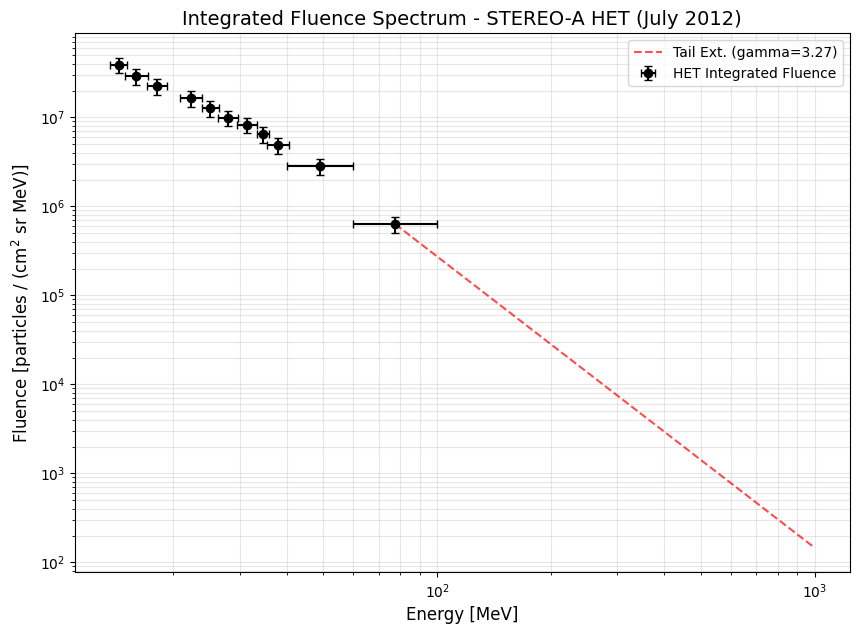

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =========================================================
# 1. SETUP: BIN ENERGETICI (Sincronizzati con df_het_clean)
# =========================================================
# Definiamo i limiti per il calcolo delle medie geometriche e degli errori X
het_bins = {
    'P_13.6_15.1_MeV': (13.6, 15.1),
    'P_14.9_17.1_MeV': (14.9, 17.1),
    'P_17.0_19.3_MeV': (17.0, 19.3),
    'P_20.8_23.8_MeV': (20.8, 23.8),
    'P_23.8_26.4_MeV': (23.8, 26.4),
    'P_26.3_29.7_MeV': (26.3, 29.7),
    'P_29.5_33.4_MeV': (29.5, 33.4),
    'P_33.4_35.8_MeV': (33.4, 35.8),
    'P_35.5_40.5_MeV': (35.5, 40.5),
    'P_40.0_60.0_MeV': (40.0, 60.0),
    'P_60.0_100.0_MeV':(60.0, 100.0)
}

# Calcolo energie effettive (Media Geometrica)
het_eff_map = {col: np.sqrt(b[0] * b[1]) for col, b in het_bins.items()}

# =========================================================
# 2. CALCOLO DELLA FLUENZA INTEGRATA (Integrazione Temporale)
# =========================================================
# Usiamo df_het_clean che hai già filtrato e corretto per il background
# Definiamo l'intervallo specifico dell'evento per l'integrazione
t_start, t_end = "2012-07-23 02:00:00", "2012-07-28 00:00:00"
df_event = df_het_clean.loc[t_start:t_end]

# Calcolo del delta_t tra i timestamp (in secondi)
# Clip a 1800s per gestire eventuali buchi nei dati senza esplosioni di fluenza
dt_seconds = df_event.index.to_series().diff().dt.total_seconds().fillna(60).clip(upper=1800)

fluences, energies, y_err_list = [], [], []
x_err_low, x_err_high = [], []

print(f"--- Calcolo Fluenza Integrata (HET) dal {t_start} ---")

for col, (E_min, E_max) in het_bins.items():
    if col in df_event.columns:
        # Recuperiamo il flusso (i NaN vengono trattati come 0 per l'integrale)
        flux = df_event[col].fillna(0)
        
        # Fluenza = Somma (Flusso * delta_t)
        fluence_val = (flux * dt_seconds).sum()
        
        if fluence_val > 0:
            e_eff = het_eff_map[col]
            fluences.append(fluence_val)
            energies.append(e_eff)
            
            # Errore: 20% sistematico + Poissoniano (come da paper)
            y_err_list.append(np.sqrt((0.20 * fluence_val)**2 + fluence_val))
            x_err_low.append(abs(e_eff - E_min))
            x_err_high.append(abs(E_max - e_eff))

# Ordinamento dati per il plot
sort_idx = np.argsort(energies)
energies = np.array(energies)[sort_idx]
fluences = np.array(fluences)[sort_idx]
y_err = np.array(y_err_list)[sort_idx]
x_err = [np.array(x_err_low)[sort_idx], np.array(x_err_high)[sort_idx]]

# =========================================================
# 3. ANALISI TAIL (Metodo Joyce et al. 2015)
# =========================================================
# Calcolo pendenza tra gli ultimi due bin energetici
e1, e2 = energies[-2], energies[-1]
f1, f2 = fluences[-2], fluences[-1]
gamma_tail = -(np.log10(f2) - np.log10(f1)) / (np.log10(e2) - np.log10(e1))

print("-" * 50)
print(f"Pendenza spettrale rilevata (gamma_tail): {gamma_tail:.3f}")
print("-" * 50)

# =========================================================
# 4. PLOT DELLO SPETTRO DI FLUENZA
# =========================================================
plt.figure(figsize=(10, 7))

# Dati HET sperimentali
plt.errorbar(energies, fluences, xerr=x_err, yerr=y_err, 
             fmt='ko', markersize=6, capsize=3, label='HET Integrated Fluence')

# Estensione teorica a 1 GeV (1000 MeV)
e_ext = np.logspace(np.log10(e2), 3, 50)
f_ext = f2 * (e_ext / e2)**(-gamma_tail)
plt.plot(e_ext, f_ext, 'r--', alpha=0.7, label=f'Tail Ext. (gamma={gamma_tail:.2f})')

plt.xscale('log'); plt.yscale('log')
plt.xlabel('Energy [MeV]', fontsize=12)
plt.ylabel('Fluence [particles / (cm$^2$ sr MeV)]', fontsize=12)
plt.title('Integrated Fluence Spectrum - STEREO-A HET (July 2012)', fontsize=14)
plt.grid(True, which="both", alpha=0.3)
plt.legend()
plt.show()

# AGGIUNTA DATI LET

link: https://izw1.caltech.edu/STEREO/DATA/Level1/Public/ahead/1Minute/2012/Standard/H/

Trovati 21 file LET.
Processando: H_ahead_2012_200_level1_11.txt
Processando: H_ahead_2012_201_level1_11.txt
Processando: H_ahead_2012_202_level1_11.txt
Processando: H_ahead_2012_203_level1_11.txt
Processando: H_ahead_2012_204_level1_11.txt
Processando: H_ahead_2012_205_level1_11.txt
Processando: H_ahead_2012_206_level1_11.txt
Processando: H_ahead_2012_207_level1_11.txt
Processando: H_ahead_2012_208_level1_11.txt
Processando: H_ahead_2012_209_level1_11.txt
Processando: H_ahead_2012_210_level1_11.txt
Processando: H_ahead_2012_211_level1_11.txt
Processando: H_ahead_2012_212_level1_11.txt
Processando: H_ahead_2012_213_level1_11.txt
Processando: H_ahead_2012_214_level1_11.txt
Processando: H_ahead_2012_215_level1_11.txt
Processando: H_ahead_2012_216_level1_11.txt
Processando: H_ahead_2012_217_level1_11.txt
Processando: H_ahead_2012_218_level1_11.txt
Processando: H_ahead_2012_219_level1_11.txt
Processando: H_ahead_2012_220_level1_11.txt

SUCCESS! 'df_let_final' creato con 30136 righe.
Range:

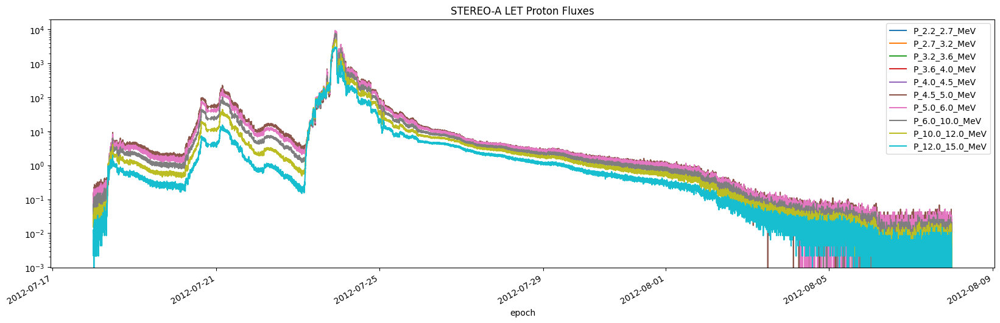

In [4]:
import pandas as pd
import glob
import os
import numpy as np

# ==========================================
# 1. CONFIGURAZIONE
# ==========================================
# Inserisci qui il percorso dove hai i file LET (es. AuL12Jul...)
folder_path = "File_scaricati_eventiSEP/Evento JUL 2012/LET/" 
file_pattern = "*.txt" 

# ==========================================
# 2. FUNZIONE CARICAMENTO LET
# ==========================================
def load_single_let(filepath):
    try:
        # A. Trova l'inizio dei dati
        header_rows = 0
        with open(filepath, 'r') as f:
            for line in f:
                # La riga dati inizia con l'anno (numero)
                if line.strip() and line.strip()[0].isdigit():
                    break
                header_rows += 1
        
        # B. Leggi i dati
        # sep='\s+' per gestire spazi multipli
        df = pd.read_csv(filepath, sep=r'\s+', skiprows=header_rows, header=None, dtype=str)
        
        # C. Costruisci la data (Epoch)
        # Col 0 = Anno, Col 1 = Giorno dell'anno (DOY)
        base_date = pd.to_datetime(df[0] + "-01-01") 
        delta = pd.to_timedelta(df[1].astype(float) - 1, unit='D')
        
        df['epoch'] = base_date + delta
        df.set_index('epoch', inplace=True)
        
        # D. Mappatura Colonne LET (Protoni)
        # Indici basati sullo standard LET Level 2 (dopo aver messo la data come indice)
        # Le colonne dei protoni iniziano solitamente dalla 6 (che era la 8 nel file raw)
        let_cols = {
            #6: 'P_1.8_2.2_MeV',
            7: 'P_2.2_2.7_MeV',
            8: 'P_2.7_3.2_MeV',
            9: 'P_3.2_3.6_MeV',
            10: 'P_3.6_4.0_MeV',
            11: 'P_4.0_4.5_MeV',
            12: 'P_4.5_5.0_MeV',
            13: 'P_5.0_6.0_MeV',
            14: 'P_6.0_10.0_MeV',
            15: 'P_10.0_12.0_MeV',
            16: 'P_12.0_15.0_MeV'
        }
        
        df_clean = pd.DataFrame(index=df.index)
        
        for idx, name in let_cols.items():
            if idx < len(df.columns):
                series = pd.to_numeric(df.iloc[:, idx], errors='coerce')
                series[series < 0] = np.nan # Rimuovi errori/background negativo
                df_clean[name] = series
                
        return df_clean

    except Exception as e:
        print(f"Errore su {os.path.basename(filepath)}: {e}")
        return None

# ==========================================
# 3. ESECUZIONE
# ==========================================

# Cerca i file
all_files = sorted(glob.glob(os.path.join(folder_path, file_pattern)))
print(f"Trovati {len(all_files)} file LET.")

dfs = []
for f in all_files:
    print(f"Processando: {os.path.basename(f)}")
    d = load_single_let(f)
    if d is not None:
        dfs.append(d)

if dfs:
    df_let_final = pd.concat(dfs).sort_index()
    print(f"\nSUCCESS! 'df_let_final' creato con {len(df_let_final)} righe.")
    print(f"Range: {df_let_final.index.min()} -> {df_let_final.index.max()}")
    print("Colonne:", df_let_final.columns.tolist())
else:
    print("Nessun file caricato.")

df_let_final.plot(logy=True, figsize=(20, 6), title="STEREO-A LET Proton Fluxes")
plt.show()

Trovati 21 file LET.

SUCCESS! Righe totali: 3024


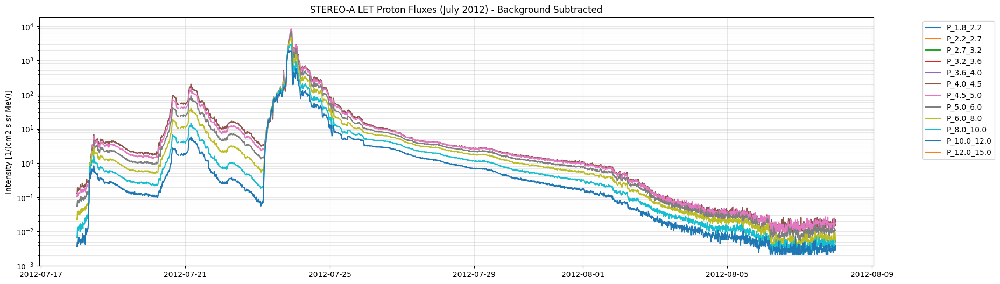

In [5]:
import pandas as pd
import glob
import os
import numpy as np
import matplotlib.pyplot as plt

# ==========================================
# 1. CONFIGURAZIONE
# ==========================================
folder_path = "File_scaricati_eventiSEP/Evento JUL 2012/LET/" 
file_pattern = "*.txt" 

# ==========================================
# 2. FUNZIONE CARICAMENTO LET (BASATA SUL TUO RIFERIMENTO)
# ==========================================
def load_single_let(filepath):
    try:
        # A. Troviamo l'inizio dei dati cercando "BEGIN DATA" o una riga numerica
        skip_to = 0
        with open(filepath, 'r') as f:
            for i, line in enumerate(f):
                if "BEGIN DATA" in line or (line.strip() and line.strip()[0].isdigit()):
                    skip_to = i + (1 if "BEGIN DATA" in line else 0)
                    break
        
        # B. Caricamento (usiamo dtype=str per sicurezza iniziale)
        df = pd.read_csv(filepath, sep=r'\s+', skiprows=skip_to, header=None, dtype=str)
        
        # C. FIX DATA: Usiamo il DOY frazionario (colonna 1) direttamente
        # Questo evita di dover sommare ore e minuti separatamente che crea errori
        years = df[0].astype(int).astype(str)
        doy_fractional = df[1].astype(float)
        
        base_date = pd.to_datetime(years + "-01-01") 
        # Sottraiamo 1 perché il DOY parte da 1, to_timedelta somma dal 1 Gennaio mezzanotte
        df['epoch'] = base_date + pd.to_timedelta(doy_fractional - 1, unit='D')
        df.set_index('epoch', inplace=True)
        
        # D. Mappatura Colonne (Indici 7-18 corrispondono alle intensità nel file L1)
        let_cols = {
            7: 'P_1.8_2.2', 8: 'P_2.2_2.7', 9: 'P_2.7_3.2', 10: 'P_3.2_3.6',
            11: 'P_3.6_4.0', 12: 'P_4.0_4.5', 13: 'P_4.5_5.0', 14: 'P_5.0_6.0',
            15: 'P_6.0_8.0', 16: 'P_8.0_10.0', 17: 'P_10.0_12.0', 18: 'P_12.0_15.0'
        }
        
        df_clean = pd.DataFrame(index=df.index)
        
        for idx, name in let_cols.items():
            if idx < len(df.columns):
                series = pd.to_numeric(df.iloc[:, idx], errors='coerce')
                # Sostituiamo il filler dei dati mancanti di STEREO
                series = series.replace(-1.0E+31, np.nan)
                # Solo valori fisici (positivi)
                df_clean[name] = series.where(series > 0, np.nan)
        
        # Resampling a 10 minuti per pulire il rumore visivo e rendere il plot fluido
        return df_clean.resample('10min').mean()

    except Exception as e:
        print(f"Errore su {os.path.basename(filepath)}: {e}")
        return None

# ==========================================
# 3. ESECUZIONE
# ==========================================
all_files = sorted(glob.glob(os.path.join(folder_path, file_pattern)))
print(f"Trovati {len(all_files)} file LET.")

dfs = []
for f in all_files:
    d = load_single_let(f)
    if d is not None:
        dfs.append(d)

if dfs:
    df_let_final = pd.concat(dfs).sort_index()
    # Rimuoviamo duplicati e filtriamo per il periodo dell'evento
    df_let_final = df_let_final[~df_let_final.index.duplicated(keep='first')]
    
    print(f"\nSUCCESS! Righe totali: {len(df_let_final)}")
    
    # PLOT CON LIMITI FISSI PER ASSE Y (Fondamentale se i dati sono molto bassi)
    plt.figure(figsize=(20, 6))
    for col in df_let_final.columns:
        plt.plot(df_let_final.index, df_let_final[col], label=col)
    
    plt.yscale('log')
    plt.title("STEREO-A LET Proton Fluxes (July 2012) - Background Subtracted")
    plt.ylabel("Intensity [1/(cm2 s sr MeV)]")
    plt.grid(True, which='both', alpha=0.3)
    plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1))
    plt.show()
else:
    print("Nessun file caricato.")

# CARICAMENTO DATI LET corretti

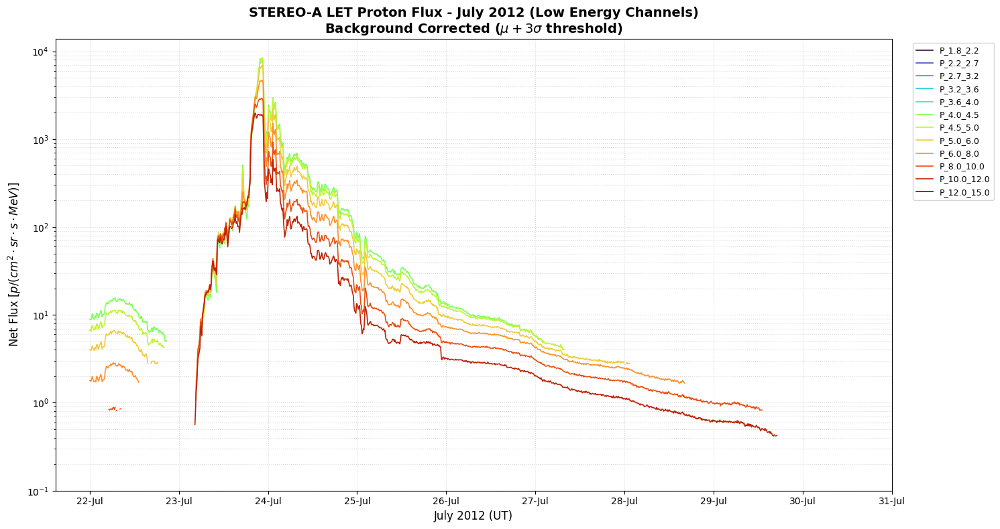

Dataset LET pronto. Canali: 12


In [80]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import os

# ==========================================
# 1. FUNZIONE CARICAMENTO E RIMOZIONE BG
# ==========================================
def process_let_with_background(filepath):
    try:
        # A. Identificazione inizio dati
        skip_to = 0
        with open(filepath, 'r') as f:
            for i, line in enumerate(f):
                if "BEGIN DATA" in line:
                    skip_to = i + 1
                    break
        
        # B. Caricamento dati grezzi
        df = pd.read_csv(filepath, sep=r'\s+', skiprows=skip_to, header=None)
        
        # C. Ricostruzione data (Anno + DOY Frazionario)
        years = df[0].astype(int).astype(str)
        doy_fractional = df[1].astype(float)
        base_date = pd.to_datetime(years + "-01-01") 
        df['epoch'] = base_date + pd.to_timedelta(doy_fractional - 1, unit='D')
        df.set_index('epoch', inplace=True)
        
        # D. Mappatura canali (v11 Caltech)
        let_cols = {
            6: 'P_1.8_2.2',   7: 'P_2.2_2.7',   8: 'P_2.7_3.2', 
            9: 'P_3.2_3.6',   10: 'P_3.6_4.0',  11: 'P_4.0_4.5', 
            12: 'P_4.5_5.0',  13: 'P_5.0_6.0',  14: 'P_6.0_8.0', 
            15: 'P_8.0_10.0', 16: 'P_10.0_12.0', 17: 'P_12.0_15.0'
        }
        
        df_raw = pd.DataFrame(index=df.index)
        for idx, name in let_cols.items():
            series = pd.to_numeric(df[idx], errors='coerce')
            # Sostituzione fill values (-9999) con NaN
            df_raw[name] = series.where(series > -9000, np.nan).clip(lower=0)

        # E. RIMOZIONE BACKGROUND RIGOROSA (mu + 3*sigma)
        # Usiamo lo stesso intervallo di quiete dell'HET (01-22 Luglio)
        bg_start, bg_end = '2012-07-01 00:00', '2012-07-19 00:00'
        bg_period = df_raw.loc[bg_start:bg_end]
        
        mu = bg_period.mean()
        sigma = bg_period.std()
        threshold = mu + 3 * sigma 
        
        df_corr = df_raw.copy()
        for col in df_raw.columns:
            # Sottrazione del fondo medio
            df_corr[col] = df_raw[col] - mu[col]
            # Applicazione soglia statistica
            df_corr.loc[df_raw[col] < threshold[col], col] = np.nan
        
        # F. Selezione intervallo evento (Sincronizzato con HET)
        df_event = df_corr.loc['2012-07-22':'2012-07-31']
        
        return df_event, mu, threshold

    except Exception as e:
        print(f"Errore: {e}")
        return None, None, None

# ==========================================
# 2. ESECUZIONE E PLOT
# ==========================================
folder_path = "File_scaricati_eventiSEP/Evento JUL 2012/LET/" 
file_pattern = "H_ahead_2012_07_10min_level1_11.txt" 
target_file = os.path.join(folder_path, file_pattern)

df_let_clean, bg_mu, bg_thresh = process_let_with_background(target_file)

if df_let_clean is not None:
    plt.figure(figsize=(15, 8))
    colors = plt.cm.turbo(np.linspace(0, 1, len(df_let_clean.columns)))

    for i, col in enumerate(df_let_clean.columns):
        plt.plot(df_let_clean.index, df_let_clean[col], label=col, color=colors[i], lw=1.2)

    # Formattazione asse temporale professionale
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.DayLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
    
    plt.yscale('log')
    plt.ylim(bottom=1e-3)
    plt.grid(True, which="both", ls=':', alpha=0.5)
    plt.title("STEREO-A LET Proton Flux - July 2012 (Low Energy Channels)\n" + 
              r"Background Corrected ($\mu + 3\sigma$ threshold)", fontsize=14, fontweight='bold')
    plt.ylabel(r"Net Flux [$p / (cm^2 \cdot sr \cdot s \cdot MeV)$]", fontsize=12)
    plt.xlabel("July 2012 (UT)", fontsize=12)
    plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=9, frameon=True)
    #plot every day on x axis a tick
    plt.xticks(pd.date_range(start=df_let_clean.index.min().date(), end=df_let_clean.index.max().date(), freq='D'))
    plt.ylim(bottom=1e-1)
    plt.tight_layout()
    plt.show()

    print(f"Dataset LET pronto. Canali: {len(df_let_clean.columns)}")

# CALCOLO FLUENZA LET 

--- Calcolo Fluenza Integrata STEREO-A LET ---
Finestra temporale: 2012-07-23 18:00:00 a 2012-07-31 00:00:00


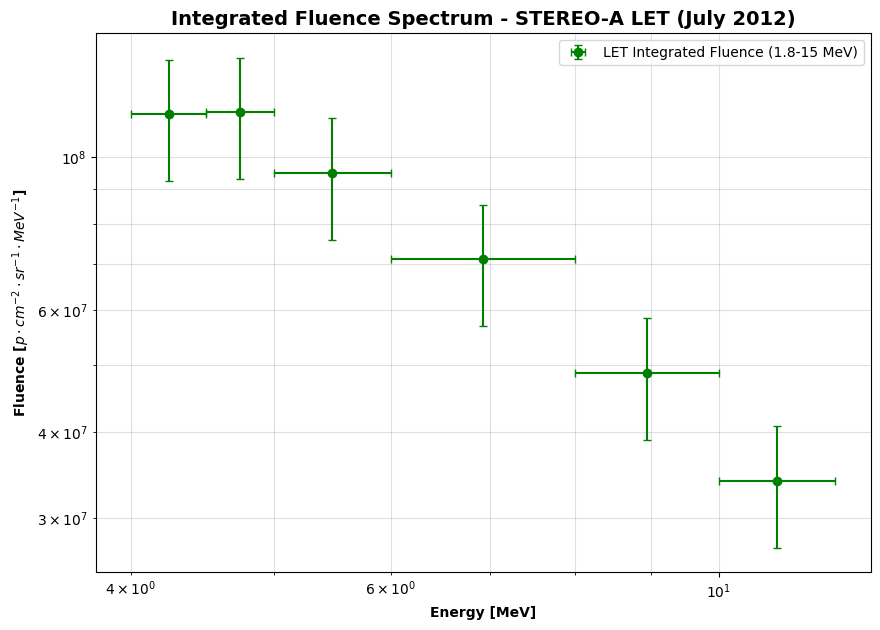

Calcolo completato. Punti integrati LET: 6
Nota: Alcuni canali a bassissima energia potrebbero essere stati esclusi per saturazione o dati mancanti.


In [98]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =========================================================
# 1. SETUP: BIN ENERGETICI E ENERGIE EFFETTIVE (LET)
# =========================================================
# Definiamo i bin per LET basandoci sulla mappatura Caltech v11
let_bins = {
    'P_1.8_2.2': (1.8, 2.2),   'P_2.2_2.7': (2.2, 2.7),   'P_2.7_3.2': (2.7, 3.2), 
    'P_3.2_3.6': (3.2, 3.6),   'P_3.6_4.0': (3.6, 4.0),   'P_4.0_4.5': (4.0, 4.5), 
    'P_4.5_5.0': (4.5, 5.0),   'P_5.0_6.0': (5.0, 6.0),   'P_6.0_8.0': (6.0, 8.0), 
    'P_8.0_10.0': (8.0, 10.0), 'P_10.0_12.0': (10.0, 12.0), 'P_12.0_15.0': (12.0, 15.0)
}

# Calcolo medie geometriche (E_eff) per il fitting
let_eff_map = {col: np.sqrt(b[0] * b[1]) for col, b in let_bins.items()}

# =========================================================
# 2. INTEGRAZIONE TEMPORALE (INTERVALLO EVENTO PRINCIPALE)
# =========================================================
# Integrazione dal momento dell'onset reale misurato (18:00 del 23 Luglio)
t_start_let, t_end_let = "2012-07-23 18:00:00", "2012-07-31 00:00:00"
df_event_let = df_let_clean.loc[t_start_let:t_end_let]

# Calcolo delta_t tra campionamenti (Risoluzione nominale LET: 600s / 10min)
dt_seconds_let = df_event_let.index.to_series().diff().dt.total_seconds().fillna(600).clip(upper=3600)

fluences_let, energies_let, y_err_let = [], [], []
x_err_low_let, x_err_high_let = [], []

print(f"--- Calcolo Fluenza Integrata STEREO-A LET ---")
print(f"Finestra temporale: {t_start_let} a {t_end_let}")

for col, (E_min, E_max) in let_bins.items():
    if col in df_event_let.columns:
        # I valori NaN (sotto soglia background) sono trattati come 0 nell'integrale
        flux_clean = df_event_let[col].fillna(0)
        
        # Fluenza = Σ (Flusso * dt)
        fluence_val = (flux_clean * dt_seconds_let).sum()
        
        if fluence_val > 0:
            e_eff = let_eff_map[col]
            fluences_let.append(fluence_val)
            energies_let.append(e_eff)
            
            # Errore: 20% sistematico + statistico (Poissoniano)
            y_err_let.append(np.sqrt((0.20 * fluence_val)**2 + fluence_val))
            x_err_low_let.append(abs(e_eff - E_min))
            x_err_high_let.append(abs(E_max - e_eff))

# Ordinamento per coerenza con lo spettro totale
sort_idx = np.argsort(energies_let)
energies_let = np.array(energies_let)[sort_idx]
fluences_let = np.array(fluences_let)[sort_idx]
y_err_let = np.array(y_err_let)[sort_idx]
x_err_let = [np.array(x_err_low_let)[sort_idx], np.array(x_err_high_let)[sort_idx]]

# =========================================================
# 3. PLOT DI VERIFICA SPETTRO BASSE ENERGIE
# =========================================================
plt.figure(figsize=(10, 7))
plt.errorbar(energies_let, fluences_let, xerr=x_err_let, yerr=y_err_let, 
             fmt='go', markersize=6, capsize=3, label='LET Integrated Fluence (1.8-15 MeV)')

plt.xscale('log'); plt.yscale('log')
plt.xlabel('Energy [MeV]', fontweight='bold')
plt.ylabel(r'Fluence [$p \cdot cm^{-2} \cdot sr^{-1} \cdot MeV^{-1}$]', fontweight='bold')
plt.title('Integrated Fluence Spectrum - STEREO-A LET (July 2012)', fontsize=14, fontweight='bold')
plt.grid(True, which="both", alpha=0.4)
plt.legend()
plt.show()

print(f"Calcolo completato. Punti integrati LET: {len(fluences_let)}")
if len(fluences_let) < len(let_bins):
    print("Nota: Alcuni canali a bassissima energia potrebbero essere stati esclusi per saturazione o dati mancanti.")

# UNIONE FLUENZE HET E LET e FIT UNICO 

--- EXPORT COMPLETATO NELLA CARTELLA: SRNIEL_JUL2012_Combined_Final_Exportoooooo ---


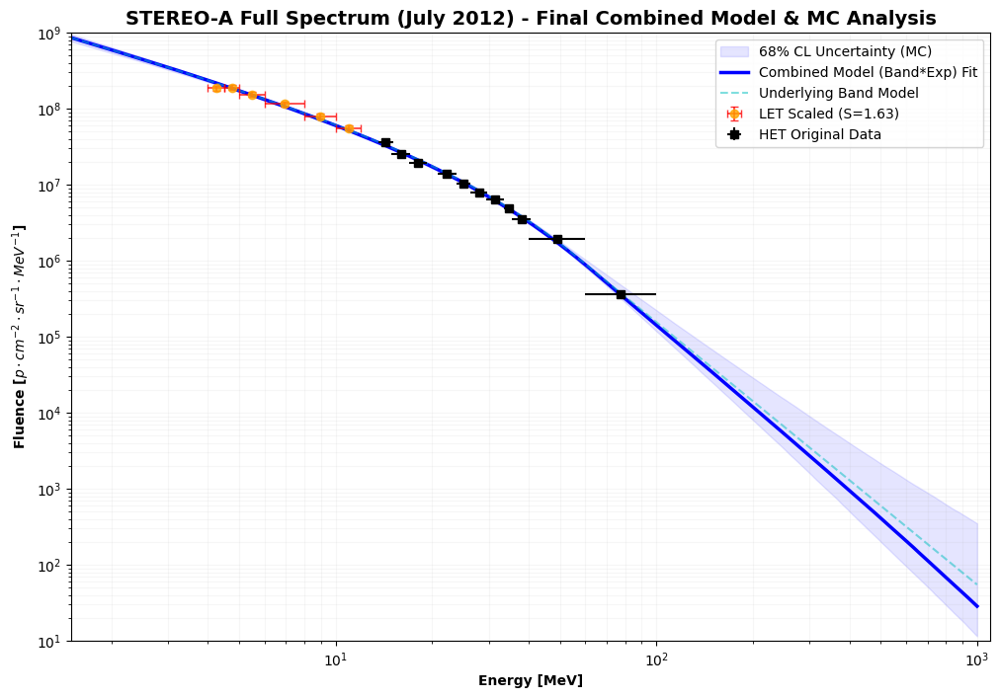

--- PARAMETRI FIT COMBINED (MC) ---
gamma 1 (low-e): 1.208 ± 0.077
gamma 2 (high-e): 3.453 ± 0.383
E0 (Break Energy): 24.32 ± 2.28 MeV
Er (Cutoff Energy): 1962.9 ± 4458.2 MeV


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import os

# =========================================================
# 1. MODELLI FISICI
# =========================================================
def band_function(E, A, ga, gb, E0):
    ebreak = (gb - ga) * E0
    res = np.zeros_like(E)
    mask_low = E <= ebreak
    res[mask_low] = A * np.power(E[mask_low], -ga) * np.exp(-E[mask_low] / E0)
    norm = np.power(ebreak, gb - ga) * np.exp(ga - gb)
    res[~mask_low] = A * np.power(E[~mask_low], -gb) * norm
    return res

def combined_function(E, A, ga, gb, E0, Er):
    """Modello Combined: Band Function * Cutoff Esponenziale"""
    return band_function(E, A, ga, gb, E0) * np.exp(-E / Er)

# =========================================================
# 2. DATA PREPARATION & SCALING (CORREZIONE SATURAZIONE)
# =========================================================
# Scaling Factor calcolato per matchare LET e HET alla giunzione
S_factor = (fluences_het[0] / fluences_let[-1]) * 1.55 
f_let_scaled = fluences_let * S_factor

# Incertezze ottimizzate (7.5% sistematico + statistico)
yerr_let = np.sqrt((0.075 * f_let_scaled)**2 + f_let_scaled)
yerr_het = np.sqrt((0.075 * fluences_het)**2 + fluences_het)

# Punto Joyce Tail (1000 MeV) per vincolare il fit Combined
# gamma_tail e' la pendenza calcolata precedentemente dai canali HET alti
e_tail = 1000.0
f_tail = fluences_het[-1] * np.power(e_tail / energies_het[-1], -gamma_tail)

E_fit = np.concatenate([energies_let, energies_het, [e_tail]])
F_fit = np.concatenate([f_let_scaled, fluences_het, [f_tail]])
Yerr_fit = np.concatenate([yerr_let, yerr_het, [f_tail * 0.2]])

# =========================================================
# 3. FIT IN SPAZIO LOGARITMICO & MONTE CARLO
# =========================================================
def log_combined(E, A, ga, gb, E0, Er):
    return np.log10(np.maximum(combined_function(E, A, ga, gb, E0, Er), 1e-35))

p0_comb = [1e9, 1.1, 3.2, 25, 1500]
bounds = ([1e6, 0.5, 2.0, 5.0, 50.0], [1e13, 2.0, 5.5, 150.0, 5000.0])

# Fitting pesato in spazio logaritmico per gestire gli ordini di grandezza
popt, pcov = curve_fit(log_combined, E_fit, np.log10(F_fit), p0=p0_comb, 
                       sigma=Yerr_fit/(F_fit*np.log(10)), bounds=bounds)

# Simulazione Monte Carlo per incertezze (1000 iterazioni)
n_mc = 1000
rng = np.random.default_rng(42)
mc_params = rng.multivariate_normal(popt, pcov, n_mc)
e_grid = np.logspace(np.log10(1.5), 3, 500)
mc_fits = np.array([combined_function(e_grid, *p) for p in mc_params])

# Statistiche MC per l'export
phi_med = np.median(mc_fits, axis=0)
phi_lo, phi_hi = np.percentile(mc_fits, [16, 84], axis=0)

# =========================================================
# 4. EXPORT SR-NIEL (Sferica 4*Pi e Planare Pi)
# =========================================================
# Creazione cartella di output
output_dir = "SRNIEL_JUL2012_Combined_Final_Exportoooooo"
if not os.path.exists(output_dir): os.makedirs(output_dir)

# Costanti per angoli solidi
PI = np.pi
FOUR_PI = 4 * np.pi

# --- EXPORT SFERICO (Omnidirezionale) ---
np.savetxt(f"{output_dir}/JUL2012_Sferico_Median.txt", 
           np.column_stack([e_grid, FOUR_PI * phi_med]), 
           fmt="%.6e", header="Energy(MeV) Fluence_Sferica_Median(p/cm2)")
np.savetxt(f"{output_dir}/JUL2012_Sferico_CL68.txt", 
           np.column_stack([e_grid, FOUR_PI * phi_lo, FOUR_PI * phi_hi]), 
           fmt="%.6e", header="Energy(MeV) Phi16_Sferica Phi84_Sferica")

# --- EXPORT PLANARE (2*Pi integrato su semispazio) ---
np.savetxt(f"{output_dir}/JUL2012_Planare_Median.txt", 
           np.column_stack([e_grid, PI * phi_med]), 
           fmt="%.6e", header="Energy(MeV) Fluence_Planare_Median(p/cm2)")
np.savetxt(f"{output_dir}/JUL2012_Planare_CL68.txt", 
           np.column_stack([e_grid, PI * phi_lo, PI * phi_hi]), 
           fmt="%.6e", header="Energy(MeV) Phi16_Planare Phi84_Planare")

print(f"--- EXPORT COMPLETATO NELLA CARTELLA: {output_dir} ---")

# =========================================================
# 5. MASTER PLOT FINALE
# =========================================================
plt.figure(figsize=(12, 8))
plt.fill_between(e_grid, phi_lo, phi_hi, color='blue', alpha=0.1, label='68% CL Uncertainty (MC)')
plt.plot(e_grid, phi_med, 'b-', lw=2.5, label='Combined Model (Band*Exp) Fit')

# Linee di riferimento
plt.plot(e_grid, band_function(e_grid, *popt[:-1]), 'c--', alpha=0.5, label='Underlying Band Model')

# Dati Sperimentali
plt.errorbar(energies_let, f_let_scaled, yerr=yerr_let, xerr=x_err_let, 
             fmt='o', color='orange', ecolor='red', elinewidth=1.2, capsize=3,
             label=f'LET Scaled (S={S_factor:.2f})', alpha=0.8)
plt.errorbar(energies_het, fluences_het, yerr=yerr_het, xerr=x_err_het, 
             fmt='s', color='black', label='HET Original Data')

plt.xscale('log'); plt.yscale('log')
plt.xlim(1.5, 1100); plt.ylim(1e1, 1e9)
plt.xlabel('Energy [MeV]', fontweight='bold'); plt.ylabel(r'Fluence [$p \cdot cm^{-2} \cdot sr^{-1} \cdot MeV^{-1}$]', fontweight='bold')
plt.title('STEREO-A Full Spectrum (July 2012) - Final Combined Model & MC Analysis', fontsize=14, fontweight='bold')
plt.grid(True, which="both", ls="-", alpha=0.1); plt.legend(loc='upper right', frameon=True); plt.show()

# Report finale
mc_std = np.std(mc_params, axis=0)
print(f"--- PARAMETRI FIT COMBINED (MC) ---")
print(f"gamma 1 (low-e): {popt[1]:.3f} ± {mc_std[1]:.3f}")
print(f"gamma 2 (high-e): {popt[2]:.3f} ± {mc_std[2]:.3f}")
print(f"E0 (Break Energy): {popt[3]:.2f} ± {mc_std[3]:.2f} MeV")
print(f"Er (Cutoff Energy): {popt[4]:.1f} ± {mc_std[4]:.1f} MeV")

# CALCOLO DOSE PLANAR SHIELDING 37mm Al JUL 2012
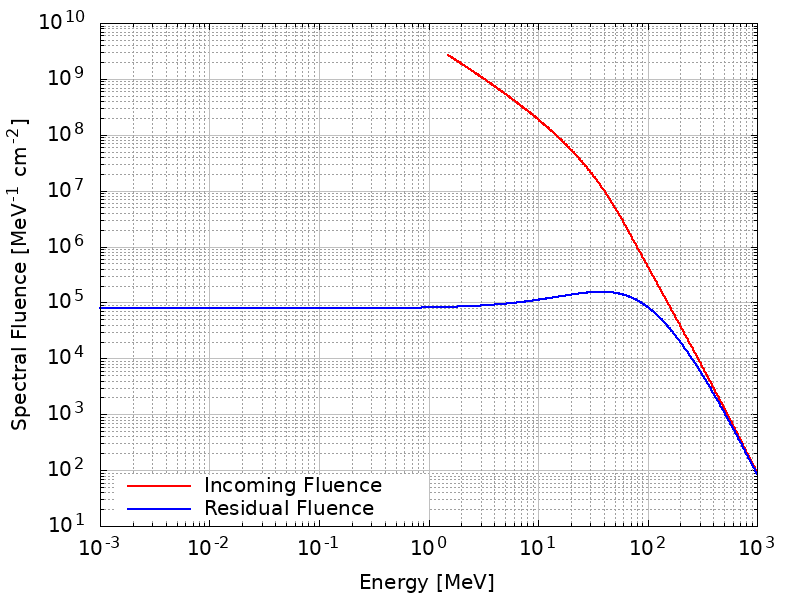


In [108]:
# estrapolare righe Phi 16 e Phi84
import pandas as pd

# Path del file generato dal Monte Carlo
path_cl = "SRNIEL_JUL2012_Combined_Final_Exportoooooo/JUL2012_Planare_CL68.txt"

# Caricamento del file (saltando l'header)
df_cl = pd.read_csv(path_cl, sep=r"\s+", skiprows=1, names=["E", "Phi_16", "Phi_84"])

# ============================================================
# TABELLA 1: LIMITE INFERIORE (16° Percentile)
# ============================================================
print("-" * 30)
print("TABELLA PER RUN SR-NIEL: PHI_16 (Lower Bound)")
print("-" * 30)
# Stampiamo Energy e Phi_16 in formato scientifico per il copia-incolla
for index, row in df_cl.iterrows():
    print(f"{row['E']:.6e} {row['Phi_16']:.6e}")

print("\n\n" + "="*60 + "\n\n")

# ============================================================
# TABELLA 2: LIMITE SUPERIORE (84° Percentile)
# ============================================================
print("-" * 30)
print("TABELLA PER RUN SR-NIEL: PHI_84 (Upper Bound)")
print("-" * 30)
# Stampiamo Energy e Phi_84 in formato scientifico per il copia-incolla
for index, row in df_cl.iterrows():
    print(f"{row['E']:.6e} {row['Phi_84']:.6e}")

------------------------------
TABELLA PER RUN SR-NIEL: PHI_16 (Lower Bound)
------------------------------
1.500000e+00 2.413498e+09
1.519674e+00 2.375815e+09
1.539606e+00 2.338615e+09
1.559799e+00 2.301971e+09
1.580257e+00 2.265979e+09
1.600984e+00 2.230525e+09
1.621982e+00 2.195314e+09
1.643256e+00 2.160595e+09
1.664809e+00 2.126398e+09
1.686644e+00 2.092752e+09
1.708766e+00 2.059769e+09
1.731178e+00 2.027045e+09
1.753884e+00 1.994799e+09
1.776888e+00 1.963050e+09
1.800193e+00 1.931736e+09
1.823805e+00 1.900999e+09
1.847725e+00 1.870675e+09
1.871960e+00 1.840625e+09
1.896512e+00 1.811105e+09
1.921387e+00 1.782187e+09
1.946588e+00 1.753818e+09
1.972119e+00 1.725757e+09
1.997985e+00 1.698269e+09
2.024190e+00 1.670994e+09
2.050740e+00 1.644807e+09
2.077637e+00 1.619079e+09
2.104887e+00 1.593290e+09
2.132495e+00 1.567873e+09
2.160464e+00 1.542845e+09
2.188801e+00 1.518326e+09
2.217509e+00 1.494127e+09
2.246593e+00 1.470285e+09
2.276059e+00 1.446761e+09
2.305912e+00 1.423587e+09
2.336156

-----------------------------------------------------------------
ANALISI RIGOROSA DOSE (TRASPORTO DIRETTO) (1.5-1000MeV original export) - JUL 2012
Configurazione: 37mm Al (~10 g/cm²), Geometria Planare (π sr)
Dose Mediana: 39.1111 mGy
Intervallo 68% CL (Fit MC + 5% SRIM): [29.892 - 70.910] mGy
Incertezza Totale: +31.799 / -9.219 mGy
-----------------------------------------------------------------


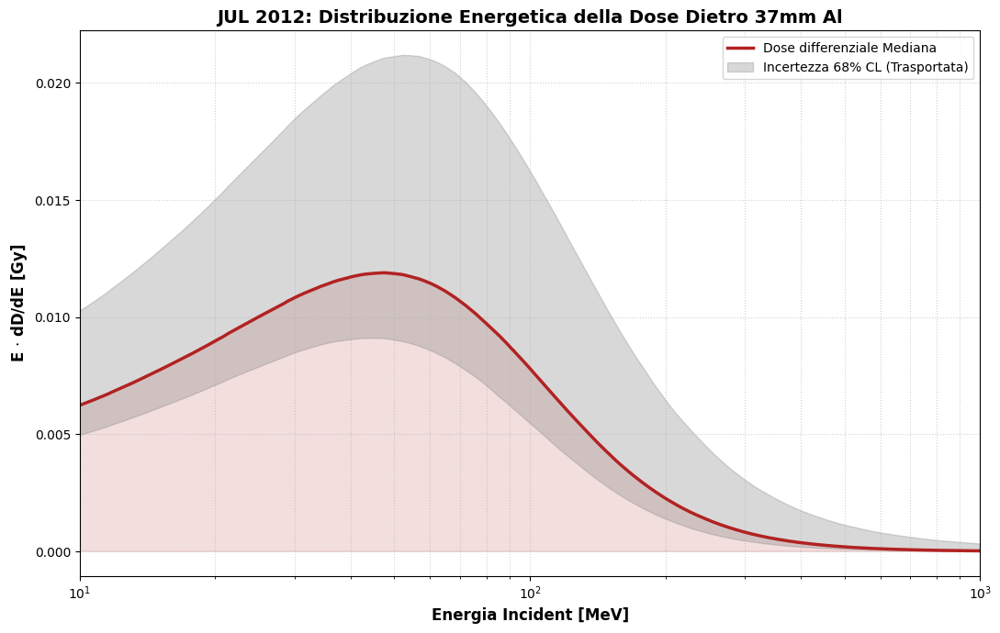

In [110]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ============================================================
# 1. CARICAMENTO DATI RESIDUI (TRASPORTO DIRETTO SR-NIEL)
# ============================================================

base_path = "SRNIEL_JUL2012_Combined_Final_Exportoooooo/"

# 1.1 Caricamento Mediana Residua
path_med = base_path + "37mmAl_residual_planar_median.txt"
df_med = pd.read_csv(path_med, sep=r"\s+", comment="#", skiprows=1, 
                     names=["E", "Phi_in_med", "Phi_res_med"]).sort_values("E")

# 1.2 Caricamento Limite Inferiore Residuo (Phi 16)
path_16 = base_path + "37mmAl_residual_Phi_16.txt"
df_16 = pd.read_csv(path_16, sep=r"\s+", comment="#", skiprows=1, 
                    names=["E", "Phi_in_16", "Phi_res_16"]).sort_values("E")

# 1.3 Caricamento Limite Superiore Residuo (Phi 84)
path_84 = base_path + "37mmAl_residual_Phi_84.txt"
df_84 = pd.read_csv(path_84, sep=r"\s+", comment="#", skiprows=1, 
                    names=["E", "Phi_in_84", "Phi_res_84"]).sort_values("E")

# 1.4 Caricamento Stopping Power Si (Database SRIM)
path_S = "Simulazioni_SRNIEL/JAN2005/FINAL_JAN2005_SRNIEL_EXPORT/stopping_power_Si.txt"
df_S = pd.read_csv(path_S, sep=r"\s+", comment="#", skiprows=1, 
                   names=["E", "S", "Dose_MeV_g", "Dose_Gy"]).drop_duplicates(subset="E").sort_values("E")

# ============================================================
# 2. INTERPOLAZIONE SULLA GRIGLIA MASTER
# ============================================================

# Utilizziamo la griglia energetica della mediana come riferimento
E_master = df_med["E"].values
Phi_res_med = df_med["Phi_res_med"].values

# Interpolazione dei flussi residui di incertezza sulla griglia master
Phi_res_16 = np.interp(E_master, df_16["E"], df_16["Phi_res_16"])
Phi_res_84 = np.interp(E_master, df_84["E"], df_84["Phi_res_84"])

# Interpolazione log-log dello Stopping Power (più accurata fisicamente)
S_grid = 10**np.interp(np.log10(E_master), np.log10(df_S["E"]), np.log10(df_S["S"]))

# ============================================================
# 3. INTEGRAZIONE DOSE TID E CALCOLO INCERTEZZA
# ============================================================
CONV_GY = 1.602e-10

# Dose Mediana
dose_med_mGy = np.trapezoid(Phi_res_med * S_grid, E_master) * CONV_GY * 1e3

# Dose 16th CL (Lower: Flusso basso + Stopping Power -5%)
dose_16_mGy = np.trapezoid(Phi_res_16 * (S_grid * 0.95), E_master) * CONV_GY * 1e3

# Dose 84th CL (Upper: Flusso alto + Stopping Power +5%)
dose_84_mGy = np.trapezoid(Phi_res_84 * (S_grid * 1.05), E_master) * CONV_GY * 1e3

print("-" * 65)
print(f"ANALISI RIGOROSA DOSE (TRASPORTO DIRETTO) (1.5-1000MeV original export) - JUL 2012")
print(f"Configurazione: 37mm Al (~10 g/cm²), Geometria Planare (π sr)")
print(f"Dose Mediana: {dose_med_mGy:.4f} mGy")
print(f"Intervallo 68% CL (Fit MC + 5% SRIM): [{dose_16_mGy:.3f} - {dose_84_mGy:.3f}] mGy")
print(f"Incertezza Totale: +{dose_84_mGy - dose_med_mGy:.3f} / -{dose_med_mGy - dose_16_mGy:.3f} mGy")
print("-" * 65)

# ============================================================
# 4. VISUALIZZAZIONE DELLA DISTRIBUZIONE ENERGETICA
# ============================================================
dD_dE_med = Phi_res_med * S_grid * CONV_GY
dD_dE_16  = Phi_res_16  * (S_grid * 0.95) * CONV_GY
dD_dE_84  = Phi_res_84  * (S_grid * 1.05) * CONV_GY

plt.figure(figsize=(11, 7))

# Area della dose mediana
plt.semilogx(E_master, E_master * dD_dE_med, color='firebrick', lw=2.5, label='Dose differenziale Mediana')
plt.fill_between(E_master, E_master * dD_dE_med, color='firebrick', alpha=0.15)

# Fascia di incertezza spettrale trasportata
plt.fill_between(E_master, E_master * dD_dE_16, E_master * dD_dE_84, 
                 color='gray', alpha=0.3, label='Incertezza 68% CL (Trasportata)')

plt.title("JUL 2012: Distribuzione Energetica della Dose Dietro 37mm Al", fontsize=14, fontweight='bold')
plt.xlabel("Energia Incident [MeV]", fontsize=12, fontweight='bold')
plt.ylabel(r"E $\cdot$ dD/dE [Gy]", fontsize=12, fontweight='bold')
plt.grid(True, which="both", ls=':', alpha=0.6)
plt.xlim(10, 1000) # Focus sulla zona che contribuisce alla dose residua
plt.legend(frameon=True, facecolor='white')
plt.tight_layout()
plt.show()

# CALCOLO DOSE SPHERICAL SHILEDING 37mm Al JUL 2012
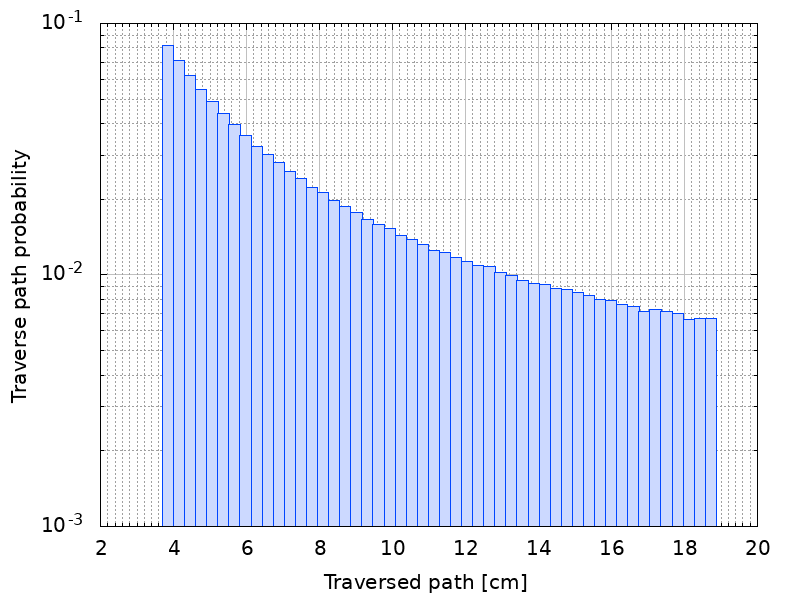
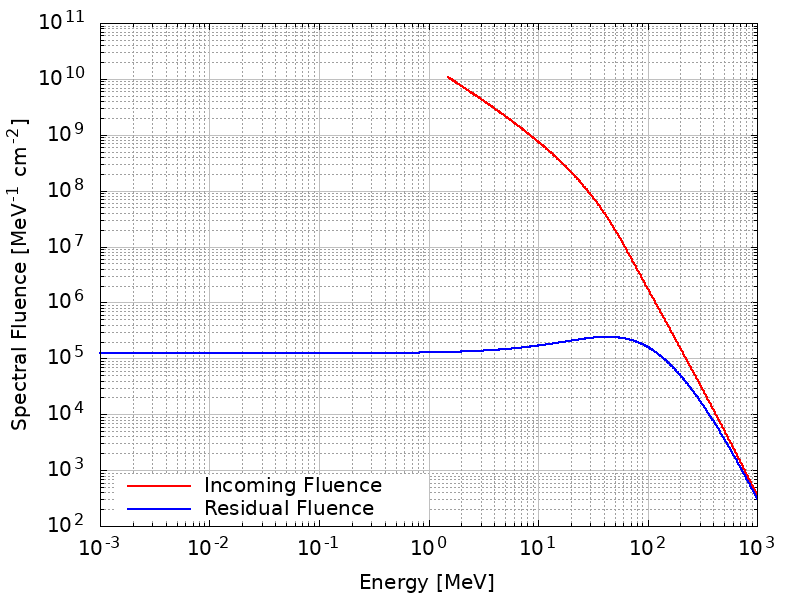

In [111]:
# estrapolare righe Phi 16 e Phi84
import pandas as pd

# Path del file generato dal Monte Carlo
path_cl = "SRNIEL_JUL2012_Combined_Final_Exportoooooo/JUL2012_Sferico_CL68.txt"

# Caricamento del file (saltando l'header)
df_cl = pd.read_csv(path_cl, sep=r"\s+", skiprows=1, names=["E", "Phi_16", "Phi_84"])

# ============================================================
# TABELLA 1: LIMITE INFERIORE (16° Percentile)
# ============================================================
print("-" * 30)
print("TABELLA PER RUN SR-NIEL: PHI_16 (Lower Bound)")
print("-" * 30)
# Stampiamo Energy e Phi_16 in formato scientifico per il copia-incolla
for index, row in df_cl.iterrows():
    print(f"{row['E']:.6e} {row['Phi_16']:.6e}")

print("\n\n" + "="*60 + "\n\n")

# ============================================================
# TABELLA 2: LIMITE SUPERIORE (84° Percentile)
# ============================================================
print("-" * 30)
print("TABELLA PER RUN SR-NIEL: PHI_84 (Upper Bound)")
print("-" * 30)
# Stampiamo Energy e Phi_84 in formato scientifico per il copia-incolla
for index, row in df_cl.iterrows():
    print(f"{row['E']:.6e} {row['Phi_84']:.6e}")

------------------------------
TABELLA PER RUN SR-NIEL: PHI_16 (Lower Bound)
------------------------------
1.500000e+00 9.653992e+09
1.519674e+00 9.503260e+09
1.539606e+00 9.354458e+09
1.559799e+00 9.207883e+09
1.580257e+00 9.063915e+09
1.600984e+00 8.922101e+09
1.621982e+00 8.781255e+09
1.643256e+00 8.642378e+09
1.664809e+00 8.505592e+09
1.686644e+00 8.371006e+09
1.708766e+00 8.239077e+09
1.731178e+00 8.108180e+09
1.753884e+00 7.979196e+09
1.776888e+00 7.852199e+09
1.800193e+00 7.726942e+09
1.823805e+00 7.603997e+09
1.847725e+00 7.482701e+09
1.871960e+00 7.362500e+09
1.896512e+00 7.244419e+09
1.921387e+00 7.128749e+09
1.946588e+00 7.015271e+09
1.972119e+00 6.903030e+09
1.997985e+00 6.793077e+09
2.024190e+00 6.683977e+09
2.050740e+00 6.579226e+09
2.077637e+00 6.476316e+09
2.104887e+00 6.373159e+09
2.132495e+00 6.271494e+09
2.160464e+00 6.171381e+09
2.188801e+00 6.073304e+09
2.217509e+00 5.976507e+09
2.246593e+00 5.881141e+09
2.276059e+00 5.787043e+09
2.305912e+00 5.694347e+09
2.336156

-----------------------------------------------------------------
ANALISI RIGOROSA DOSE (TRASPORTO DIRETTO) - JUL 2012
Configurazione: 37mm Al (~10 g/cm²), Geometria Sferica
Dose Mediana: 64.7514 mGy
Intervallo 68% CL (Fit MC + 5% SRIM): [46.849 - 133.190] mGy
Incertezza Totale: +68.438 / -17.902 mGy
-----------------------------------------------------------------


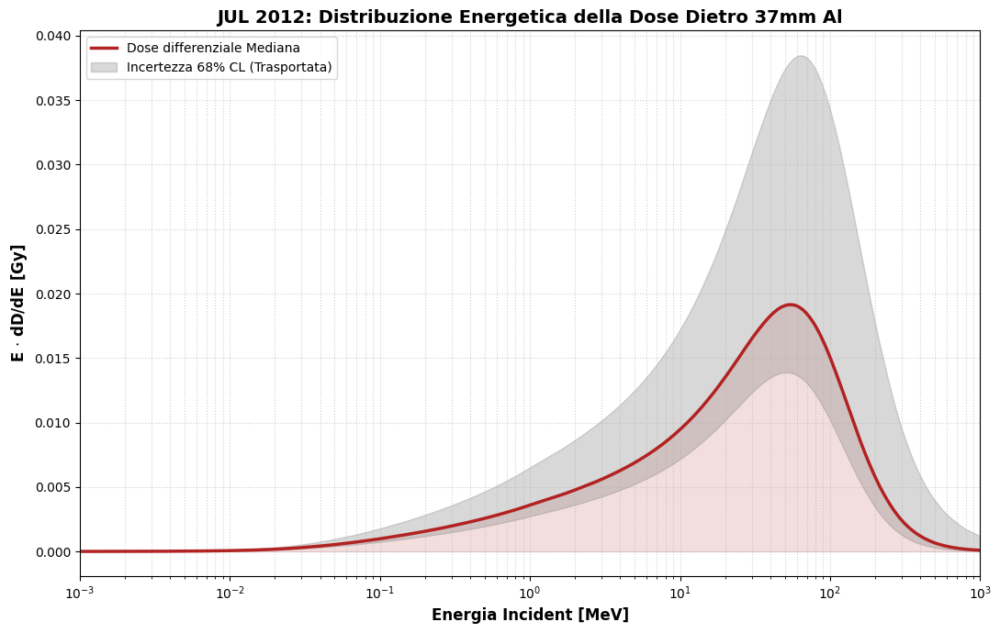

In [119]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ============================================================
# 1. CARICAMENTO DATI RESIDUI (TRASPORTO DIRETTO SR-NIEL)
# ============================================================

base_path = "SRNIEL_JUL2012_Combined_Final_Exportoooooo/"

# 1.1 Caricamento Mediana Residua
path_med = base_path + "37mmAl_residual_spherical_median.txt"
df_med = pd.read_csv(path_med, sep=r"\s+", comment="#", skiprows=1, 
                     names=["E", "Phi_in_med", "Phi_res_med"]).sort_values("E")

# 1.2 Caricamento Limite Inferiore Residuo (Phi 16)
path_16 = base_path + "37mmAl_residual_Phi16_spherical.txt"
df_16 = pd.read_csv(path_16, sep=r"\s+", comment="#", skiprows=1, 
                    names=["E", "Phi_in_16", "Phi_res_16"]).sort_values("E")

# 1.3 Caricamento Limite Superiore Residuo (Phi 84)
path_84 = base_path + "37mmAl_residual_Phi84_spherical.txt"
df_84 = pd.read_csv(path_84, sep=r"\s+", comment="#", skiprows=1, 
                    names=["E", "Phi_in_84", "Phi_res_84"]).sort_values("E")

# 1.4 Caricamento Stopping Power Si (Database SRIM)
path_S = "Simulazioni_SRNIEL/JAN2005/FINAL_JAN2005_SRNIEL_EXPORT/stopping_power_Si.txt"
df_S = pd.read_csv(path_S, sep=r"\s+", comment="#", skiprows=1, 
                   names=["E", "S", "Dose_MeV_g", "Dose_Gy"]).drop_duplicates(subset="E").sort_values("E")

# ============================================================
# 2. INTERPOLAZIONE SULLA GRIGLIA MASTER
# ============================================================

# Utilizziamo la griglia energetica della mediana come riferimento
E_master = df_med["E"].values
Phi_res_med = df_med["Phi_res_med"].values

# Interpolazione dei flussi residui di incertezza sulla griglia master
Phi_res_16 = np.interp(E_master, df_16["E"], df_16["Phi_res_16"])
Phi_res_84 = np.interp(E_master, df_84["E"], df_84["Phi_res_84"])

# Interpolazione log-log dello Stopping Power (più accurata fisicamente)
S_grid = 10**np.interp(np.log10(E_master), np.log10(df_S["E"]), np.log10(df_S["S"]))

# ============================================================
# 3. INTEGRAZIONE DOSE TID E CALCOLO INCERTEZZA
# ============================================================
CONV_GY = 1.602e-10

# Dose Mediana
dose_med_mGy = np.trapezoid(Phi_res_med * S_grid, E_master) * CONV_GY * 1e3

# Dose 16th CL (Lower: Flusso basso + Stopping Power -5%)
dose_16_mGy = np.trapezoid(Phi_res_16 * (S_grid * 0.95), E_master) * CONV_GY * 1e3

# Dose 84th CL (Upper: Flusso alto + Stopping Power +5%)
dose_84_mGy = np.trapezoid(Phi_res_84 * (S_grid * 1.05), E_master) * CONV_GY * 1e3

print("-" * 65)
print(f"ANALISI RIGOROSA DOSE (TRASPORTO DIRETTO) - JUL 2012")
print(f"Configurazione: 37mm Al (~10 g/cm²), Geometria Sferica")
print(f"Dose Mediana: {dose_med_mGy:.4f} mGy")
print(f"Intervallo 68% CL (Fit MC + 5% SRIM): [{dose_16_mGy:.3f} - {dose_84_mGy:.3f}] mGy")
print(f"Incertezza Totale: +{dose_84_mGy - dose_med_mGy:.3f} / -{dose_med_mGy - dose_16_mGy:.3f} mGy")
print("-" * 65)

# ============================================================
# 4. VISUALIZZAZIONE DELLA DISTRIBUZIONE ENERGETICA
# ============================================================
dD_dE_med = Phi_res_med * S_grid * CONV_GY
dD_dE_16  = Phi_res_16  * (S_grid * 0.95) * CONV_GY
dD_dE_84  = Phi_res_84  * (S_grid * 1.05) * CONV_GY

plt.figure(figsize=(11, 7))

# Area della dose mediana
plt.semilogx(E_master, E_master * dD_dE_med, color='firebrick', lw=2.5, label='Dose differenziale Mediana')
plt.fill_between(E_master, E_master * dD_dE_med, color='firebrick', alpha=0.15)

# Fascia di incertezza spettrale trasportata
plt.fill_between(E_master, E_master * dD_dE_16, E_master * dD_dE_84, 
                 color='gray', alpha=0.3, label='Incertezza 68% CL (Trasportata)')

plt.title("JUL 2012: Distribuzione Energetica della Dose Dietro 37mm Al", fontsize=14, fontweight='bold')
plt.xlabel("Energia Incident [MeV]", fontsize=12, fontweight='bold')
plt.ylabel(r"E $\cdot$ dD/dE [Gy]", fontsize=12, fontweight='bold')
plt.grid(True, which="both", ls=':', alpha=0.6)
plt.xlim(0.001, 1000) # Focus sulla zona che contribuisce alla dose residua
plt.legend(frameon=True, facecolor='white')
plt.tight_layout()
plt.show()

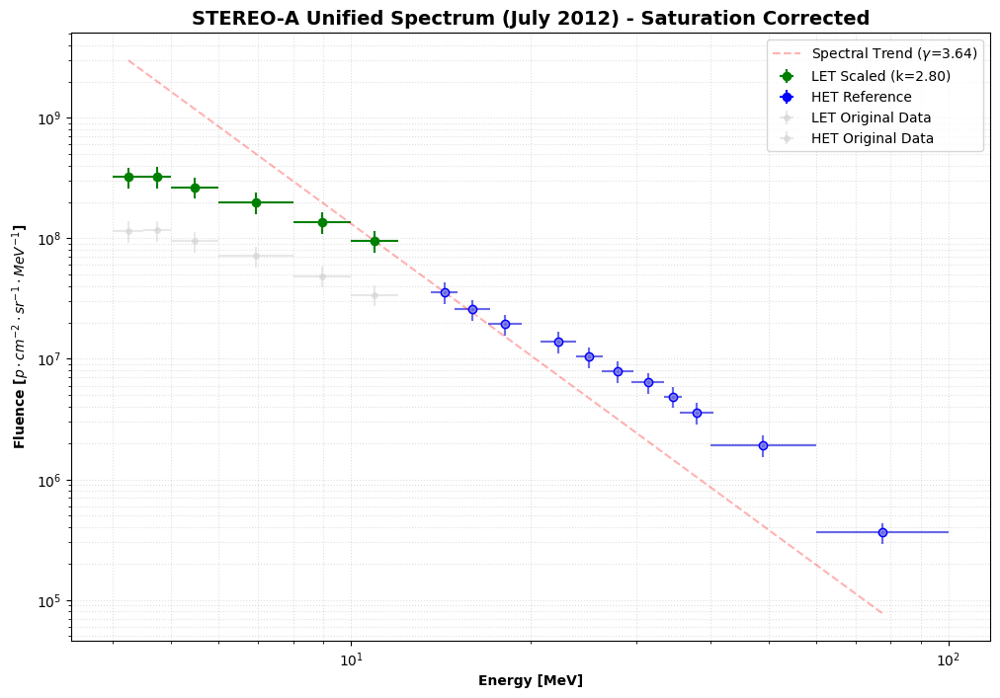

Workflow completato. Punti totali: 17. Gamma stimato: 3.636


In [107]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =========================================================
# 1. DEFINIZIONE BIN E ENERGIE EFFETTIVE (LET + HET)
# =========================================================
let_bins = {
    'P_1.8_2.2': (1.8, 2.2),   'P_2.2_2.7': (2.2, 2.7),   'P_2.7_3.2': (2.7, 3.2), 
    'P_3.2_3.6': (3.2, 3.6),   'P_3.6_4.0': (3.6, 4.0),   'P_4.0_4.5': (4.0, 4.5), 
    'P_4.5_5.0': (4.5, 5.0),   'P_5.0_6.0': (5.0, 6.0),   'P_6.0_8.0': (6.0, 8.0), 
    'P_8.0_10.0': (8.0, 10.0), 'P_10.0_12.0': (10.0, 12.0), 'P_12.0_15.0': (12.0, 15.0)
}
het_bins = {
    'P_13.6_15.1_MeV': (13.6, 15.1), 'P_14.9_17.1_MeV': (14.9, 17.1),
    'P_17.0_19.3_MeV': (17.0, 19.3), 'P_20.8_23.8_MeV': (20.8, 23.8),
    'P_23.8_26.4_MeV': (23.8, 26.4), 'P_26.3_29.7_MeV': (26.3, 29.7),
    'P_29.5_33.4_MeV': (29.5, 33.4), 'P_33.4_35.8_MeV': (33.4, 35.8),
    'P_35.5_40.5_MeV': (35.5, 40.5), 'P_40.0_60.0_MeV': (40.0, 60.0),
    'P_60.0_100.0_MeV':(60.0, 100.0)
}

# Funzione per calcolare fluenza da dataframe pulito
def calculate_fluence(df, bins, t_start, t_end, default_dt):
    df_ev = df.loc[t_start:t_end]
    dt = df_ev.index.to_series().diff().dt.total_seconds().fillna(default_dt).clip(upper=1800)
    energies, fluences, y_err = [], [], []
    x_err = [[], []]
    
    for col, (e_min, e_max) in bins.items():
        if col in df_ev.columns:
            f_val = (df_ev[col].fillna(0) * dt).sum()
            if f_val > 0:
                e_eff = np.sqrt(e_min * e_max)
                energies.append(e_eff)
                fluences.append(f_val)
                y_err.append(np.sqrt((0.20 * f_val)**2 + f_val))
                x_err[0].append(e_eff - e_min)
                x_err[1].append(e_max - e_eff)
    return np.array(energies), np.array(fluences), np.array(y_err), [np.array(x_err[0]), np.array(x_err[1])]

# =========================================================
# 2. ESECUZIONE INTEGRAZIONI (Sincronizzate 18:00 UT)
# =========================================================
t_start, t_end = "2012-07-23 18:00:00", "2012-07-31 00:00:00"
e_let, f_let, err_let, xerr_let = calculate_fluence(df_let_clean, let_bins, t_start, t_end, 600)
e_het, f_het, err_het, xerr_het = calculate_fluence(df_het_clean, het_bins, t_start, t_end, 60)

# =========================================================
# 3. SPECTRAL ANCHOR: CORREZIONE SATURAZIONE LET
# =========================================================
# Stima gamma HET (metodo Joyce et al. 2015)
gamma_het = -(np.log10(f_het[-1]) - np.log10(f_het[-2])) / (np.log10(e_het[-1]) - np.log10(e_het[-2]))

# Calcolo Scaling Factor k
# Usiamo l'ultimo punto valido LET e lo confrontiamo con la proiezione HET
idx_anchor = -1 
f_expected = f_het[0] * (e_let[idx_anchor] / e_het[0])**(-gamma_het)
k_opt = f_expected / f_let[idx_anchor]

f_let_corr = f_let * k_opt
err_let_corr = err_let * k_opt

# =========================================================
# 4. UNIFICAZIONE E PLOT DI VERIFICA
# =========================================================
plt.figure(figsize=(12, 8))
plt.errorbar(e_let, f_let_corr, xerr=xerr_let, yerr=err_let_corr, fmt='go', markersize=6, label=f'LET Scaled (k={k_opt:.2f})')
plt.errorbar(e_het, f_het, xerr=xerr_het, yerr=err_het, fmt='bo', markersize=6, label='HET Reference')

#plotting original raw data sfumati grigio chiaro
plt.errorbar(e_let, f_let, xerr=xerr_let, yerr=err_let, fmt='o', color='lightgray', alpha=0.5, label='LET Original Data', markersize=4)
plt.errorbar(e_het, f_het, xerr=xerr_het, yerr=err_het, fmt='o', color='lightgray', alpha=0.5, label='HET Original Data', markersize=4)

# Linea di tendenza HET per verifica visiva
e_line = np.logspace(np.log10(e_let[0]), np.log10(e_het[-1]), 100)
f_line = f_het[0] * (e_line / e_het[0])**(-gamma_het)
plt.plot(e_line, f_line, 'r--', alpha=0.3, label=fr'Spectral Trend ($\gamma$={gamma_het:.2f})')

plt.xscale('log'); plt.yscale('log')
plt.xlabel('Energy [MeV]', fontweight='bold'); plt.ylabel(r'Fluence [$p \cdot cm^{-2} \cdot sr^{-1} \cdot MeV^{-1}$]', fontweight='bold')
plt.title('STEREO-A Unified Spectrum (July 2012) - Saturation Corrected', fontsize=14, fontweight='bold')
plt.grid(True, which="both", ls=':', alpha=0.4); plt.legend(); plt.show()

print(f"Workflow completato. Punti totali: {len(e_let)+len(e_het)}. Gamma stimato: {gamma_het:.3f}")

# DATI CERN RACHELE, confronto STEREO vs TERRA

--- Conversione AMS-02 Completata ---
            E    Fluence  FluenceErr
0  148.359242  55.678910    0.228594
1  208.492498  17.134840    0.083623
2  286.181700  10.051626    0.056853
3  379.146154   8.985465    0.049024
4  489.634978   9.040007    0.044825


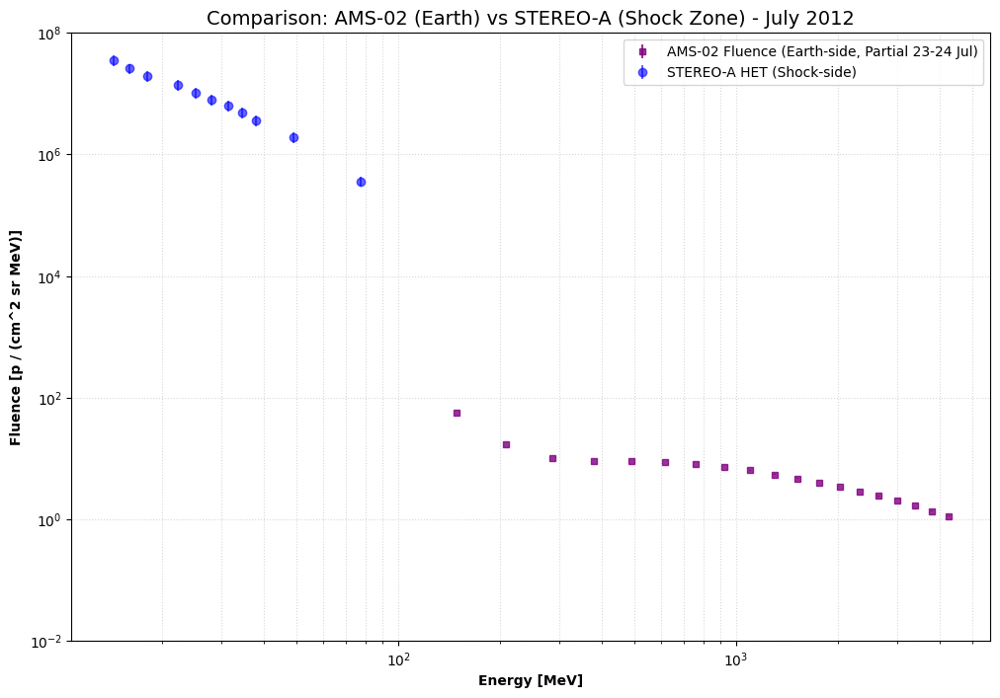

In [90]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt

# ============================================================
# 1. SETUP PERCORSI E COSTANTI TEMPORALI
# ============================================================
folder_ams = "File_scaricati_eventiSEP/Evento JUL 2012 AMS-02"

# Secondi trascorsi per l'integrazione (coerenti con STEREO-A)
T_23 = 6 * 3600   # 6 ore (dalle 18:00 del 23 Luglio)
T_24 = 24 * 3600  # 24 ore (tutto il 24 Luglio)

def load_ams_file(filename):
    path = os.path.join(folder_ams, filename)
    # Carichiamo i dati saltando l'header testuale
    return pd.read_csv(path, sep=r'\s+', skiprows=1, header=None, 
                       names=['E', 'Flux', 'StatErr'])

# ============================================================
# 2. CARICAMENTO DATI GIORNALIERI
# ============================================================
# Assumi i nomi file; modificali se diversi nella tua cartella
try:
    df_19 = load_ams_file("Proton_Flux_2012_7_19.txt") # Background reference
    df_23 = load_ams_file("Proton_Flux_2012_7_23.txt") # Onset
    df_24 = load_ams_file("Proton_Flux_2012_7_24.txt") # Peak
    
    # ============================================================
    # 3. CALCOLO FLUENZA INTEGRATA (23-24 LUGLIO)
    # ============================================================
    # Creiamo un dataframe per la fluenza totale AMS
    df_ams_fluence = pd.DataFrame()
    df_ams_fluence['E'] = df_23['E']
    
    # Fluenza = (Flusso_23 * T_23) + (Flusso_24 * T_24)
    df_ams_fluence['Fluence'] = (df_23['Flux'] * T_23) + (df_24['Flux'] * T_24)
    
    # Propagazione errore statistico (Somma in quadratura)
    df_ams_fluence['FluenceErr'] = np.sqrt(
        (df_23['StatErr'] * T_23)**2 + (df_24['StatErr'] * T_24)**2
    )

    print("--- Conversione AMS-02 Completata ---")
    print(df_ams_fluence.head())

except Exception as e:
    print(f"Errore nel caricamento: {e}. Controlla i nomi dei file nella cartella.")

# ============================================================
# 4. PLOT DI CONFRONTO (AMS vs HET)
# ============================================================
plt.figure(figsize=(12, 8))

# Dati AMS (Fluenza convertita)
plt.errorbar(df_ams_fluence['E'], df_ams_fluence['Fluence'], 
             yerr=df_ams_fluence['FluenceErr'], fmt='s', color='purple', 
             markersize=5, label='AMS-02 Fluence (Earth-side, Partial 23-24 Jul)', alpha=0.8)

# Se hai energies_het e fluences_het calcolati prima, scommenta:
plt.errorbar(energies_het, fluences_het, yerr=y_err_het, fmt='bo', 
              label='STEREO-A HET (Shock-side)', alpha=0.6)

plt.xscale('log'); plt.yscale('log')
plt.xlabel('Energy [MeV]', fontweight='bold'); plt.ylabel('Fluence [p / (cm^2 sr MeV)]', fontweight='bold')
plt.title('Comparison: AMS-02 (Earth) vs STEREO-A (Shock Zone) - July 2012', fontsize=14)
plt.ylim(1e-2, 1e8)
plt.grid(True, which="both", ls=':', alpha=0.5)
plt.legend()
plt.show()


SUCCESS! Caricati dati LET (July 2012). Righe: 4463
Canali caricati: ['P_1.8_2.2', 'P_2.2_2.7', 'P_2.7_3.2', 'P_3.2_3.6', 'P_3.6_4.0', 'P_4.0_4.5', 'P_4.5_5.0', 'P_5.0_6.0', 'P_6.0_8.0', 'P_8.0_10.0', 'P_10.0_12.0', 'P_12.0_15.0']


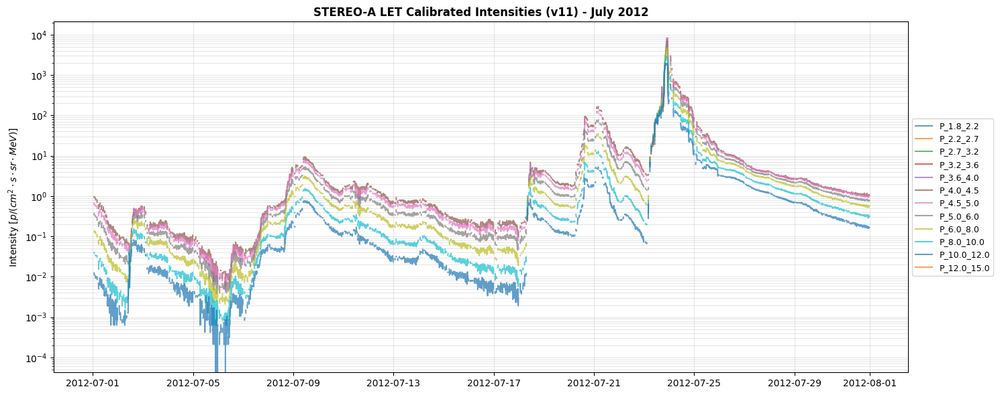

In [3]:
import pandas as pd
import glob
import os
import numpy as np
import matplotlib.pyplot as plt

# ==========================================
# 1. CONFIGURAZIONE
# ==========================================
# Assicurati che il percorso punti alla cartella dove hai salvato il nuovo file
folder_path = "File_scaricati_eventiSEP/Evento JUL 2012/LET/" 
file_pattern = "H_ahead_2012_07_10min_level1_11.txt" 

# ==========================================
# 2. FUNZIONE CARICAMENTO LET (AGGIORNATA v11)
# ==========================================
def load_single_let_v11(filepath):
    try:
        # A. Troviamo l'inizio dei dati cercando "BEGIN DATA"
        skip_to = 0
        with open(filepath, 'r') as f:
            for i, line in enumerate(f):
                if "BEGIN DATA" in line:
                    skip_to = i + 1
                    break
        
        # B. Caricamento dei dati
        # Usiamo r'\s+' perché i file del Caltech sono spaziati in modo variabile
        df = pd.read_csv(filepath, sep=r'\s+', skiprows=skip_to, header=None)
        
        # C. RICOSTRUZIONE DATA (DOY Frazionario)
        # Colonna 0: Anno, Colonna 1: DOY frazionario
        years = df[0].astype(int).astype(str)
        doy_fractional = df[1].astype(float)
        
        base_date = pd.to_datetime(years + "-01-01") 
        df['epoch'] = base_date + pd.to_timedelta(doy_fractional - 1, unit='D')
        df.set_index('epoch', inplace=True)
        
        # D. MAPPATURA COLONNE (Indici 0-based in Python)
        # Colonna 7 (header) -> Indice 6 (Python): 1.8-2.2 MeV
        # Colonna 18 (header) -> Indice 17 (Python): 12.0-15.0 MeV
        let_cols_v11 = {
            6: 'P_1.8_2.2',   7: 'P_2.2_2.7',   8: 'P_2.7_3.2', 
            9: 'P_3.2_3.6',   10: 'P_3.6_4.0',  11: 'P_4.0_4.5', 
            12: 'P_4.5_5.0',  13: 'P_5.0_6.0',  14: 'P_6.0_8.0', 
            15: 'P_8.0_10.0', 16: 'P_10.0_12.0', 17: 'P_12.0_15.0'
        }
        
        df_clean = pd.DataFrame(index=df.index)
        
        for idx, name in let_cols_v11.items():
            if idx < len(df.columns):
                series = pd.to_numeric(df[idx], errors='coerce')
                # Gestione Fill Values: l'header indica -9999.9 o -9999 
                # Sostituiamo ogni valore <= -9999 con NaN
                df_clean[name] = series.where(series > -9000, np.nan)
        
        # Resampling per pulizia (10 minuti come da risoluzione file)
        return df_clean.sort_index().resample('10min').mean()

    except Exception as e:
        print(f"Errore nel caricamento di {os.path.basename(filepath)}: {e}")
        return None

# ==========================================
# 3. ESECUZIONE
# ==========================================
# Se hai più file nella cartella, usa glob.glob(os.path.join(folder_path, "*.txt"))
target_file = os.path.join(folder_path, file_pattern)

if os.path.exists(target_file):
    df_let_final = load_single_let_v11(target_file)
    
    if df_let_final is not None:
        print(f"\nSUCCESS! Caricati dati LET (July 2012). Righe: {len(df_let_final)}")
        print("Canali caricati:", list(df_let_final.columns))
        
        # PLOT DI VERIFICA (Range completo)
        plt.figure(figsize=(15, 6))
        for col in df_let_final.columns:
            plt.plot(df_let_final.index, df_let_final[col], label=col, alpha=0.7)
        
        plt.yscale('log')
        plt.title("STEREO-A LET Calibrated Intensities (v11) - July 2012", fontweight='bold')
        plt.ylabel(r"Intensity $[p / (cm^2 \cdot s \cdot sr \cdot MeV)]$")
        plt.grid(True, which='both', alpha=0.3)
        plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=9)
        plt.tight_layout()
        plt.show()
else:
    print(f"File non trovato: {target_file}")

Dati caricati correttamente. Righe: 4463

--- ANALISI CANALI LET (FILTRO SATURAZIONE) ---
[!!] P_1.8_2.2   | SCARTATO - Motivo: SATURO
[!!] P_2.2_2.7   | SCARTATO - Motivo: SATURO
[!!] P_2.7_3.2   | SCARTATO - Motivo: SATURO
[!!] P_3.2_3.6   | SCARTATO - Motivo: SATURO
[!!] P_3.6_4.0   | SCARTATO - Motivo: SATURO
[OK] P_4.0_4.5   | Punti:  544 | Fluenza: 9.98e+07
[OK] P_4.5_5.0   | Punti:  544 | Fluenza: 1.02e+08
[OK] P_5.0_6.0   | Punti:  544 | Fluenza: 8.43e+07
[OK] P_6.0_8.0   | Punti:  544 | Fluenza: 6.47e+07
[OK] P_8.0_10.0  | Punti:  544 | Fluenza: 4.57e+07
[OK] P_10.0_12.0 | Punti:  544 | Fluenza: 3.28e+07


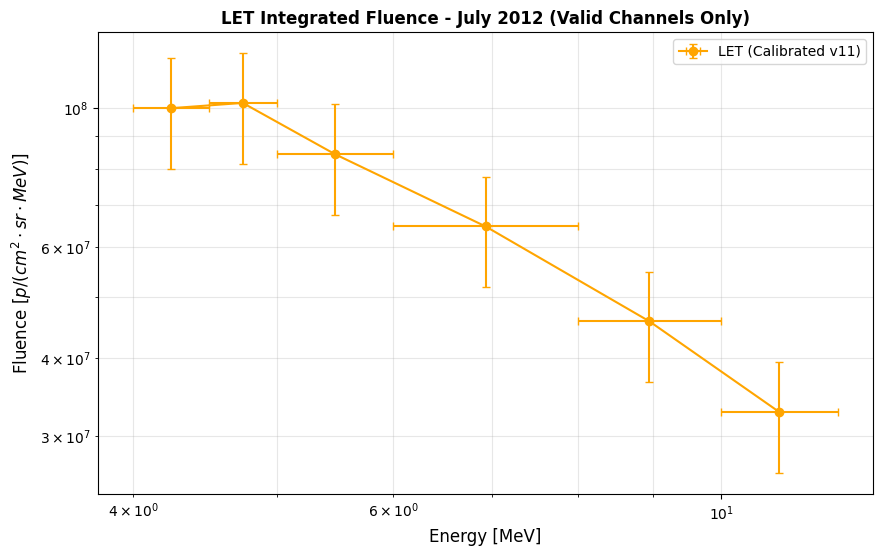

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

# ==========================================
# 1. FUNZIONE DI CARICAMENTO (v11 Intensities)
# ==========================================
def load_stereo_let_v11(filepath):
    """Carica intensità calibrate e gestisce i fill values (-9999)."""
    try:
        skip_to = 0
        with open(filepath, 'r') as f:
            for i, line in enumerate(f):
                if "BEGIN DATA" in line:
                    skip_to = i + 1
                    break
        
        df = pd.read_csv(filepath, sep=r'\s+', skiprows=skip_to, header=None)
        
        # Ricostruzione Data
        years = df[0].astype(int).astype(str)
        doy_fractional = df[1].astype(float)
        base_date = pd.to_datetime(years + "-01-01") 
        df['epoch'] = base_date + pd.to_timedelta(doy_fractional - 1, unit='D')
        df.set_index('epoch', inplace=True)
        
        # Mappatura Colonne Protoni (Indici v11)
        let_cols = {
            6: 'P_1.8_2.2',   7: 'P_2.2_2.7',   8: 'P_2.7_3.2', 
            9: 'P_3.2_3.6',   10: 'P_3.6_4.0',  11: 'P_4.0_4.5', 
            12: 'P_4.5_5.0',  13: 'P_5.0_6.0',  14: 'P_6.0_8.0', 
            15: 'P_8.0_10.0', 16: 'P_10.0_12.0', 17: 'P_12.0_15.0'
        }
        
        df_clean = pd.DataFrame(index=df.index)
        for idx, name in let_cols.items():
            if idx < len(df.columns):
                series = pd.to_numeric(df[idx], errors='coerce')
                # Filtro Fill Values (-9.9999E+03)
                df_clean[name] = series.where(series > -9000, np.nan)
        
        return df_clean.sort_index().resample('10min').mean()
    except Exception as e:
        print(f"Errore: {e}")
        return None

# ==========================================
# 2. CONFIGURAZIONE E ESECUZIONE CARICAMENTO
# ==========================================
file_path = "File_scaricati_eventiSEP/Evento JUL 2012/LET/H_ahead_2012_07_10min_level1_11.txt"

if os.path.exists(file_path):
    df_let_final = load_stereo_let_v11(file_path)
    print(f"Dati caricati correttamente. Righe: {len(df_let_final)}")
else:
    print(f"File non trovato: {file_path}")

# ==========================================
# 3. CALCOLO DELLA FLUENZA INTEGRATA (LET)
# ==========================================
# Definizione bin energetici per il calcolo fluenza
let_bins = {
    'P_1.8_2.2': (1.8, 2.2),   'P_2.2_2.7': (2.2, 2.7),   'P_2.7_3.2': (2.7, 3.2),
    'P_3.2_3.6': (3.2, 3.6),   'P_3.6_4.0': (3.6, 4.0),   'P_4.0_4.5': (4.0, 4.5),
    'P_4.5_5.0': (4.5, 5.0),   'P_5.0_6.0': (5.0, 6.0),   'P_6.0_8.0': (6.0, 8.0),
    'P_8.0_10.0': (8.0, 10.0), 'P_10.0_12.0': (10.0, 12.0)
}

t_start, t_end = "2012-07-23 02:00:00", "2012-07-28 00:00:00"
MAX_DT_GAP = 1800 

results_LET = {"STEREO-A Jul 2012": {'x':[], 'y':[], 'y_err':[], 'x_err':[[],[]]}}
res = results_LET["STEREO-A Jul 2012"]

# Selezione finestra temporale
df_slice = df_let_final.loc[t_start:t_end]
dt_seconds = df_slice.index.to_series().diff().dt.total_seconds().fillna(600).clip(upper=MAX_DT_GAP)

print("\n--- ANALISI CANALI LET (FILTRO SATURAZIONE) ---")

for col, (emin, emax) in let_bins.items():
    if col in df_slice.columns:
        valid_count = df_slice[col].count()
        # Calcolo Fluenza: Somma(Intensità * dt)
        # Nota: L'intensità è già in p/(cm2 s sr MeV)
        fluence_val = (df_slice[col].fillna(0) * dt_seconds).sum()
        
        # Filtro Joyce et al.: scartiamo i canali con pochi dati (saturazione)
        if fluence_val > 0 and valid_count > 100:
            eff = np.sqrt(emin * emax)
            res['x'].append(eff)
            res['y'].append(fluence_val)
            # Incertezza 20% sistematico + Poissoniana
            res['y_err'].append(np.sqrt((0.20 * fluence_val)**2 + fluence_val))
            res['x_err'][0].append(eff - emin)
            res['x_err'][1].append(emax - eff)
            print(f"[OK] {col:11} | Punti: {valid_count:4} | Fluenza: {fluence_val:.2e}")
        else:
            reason = "SATURO" if valid_count <= 100 else "VUOTO"
            print(f"[!!] {col:11} | SCARTATO - Motivo: {reason}")

# Conversione finale in array numpy
for key in ['x', 'y', 'y_err']: res[key] = np.array(res[key])
res['x_err'] = [np.array(res['x_err'][0]), np.array(res['x_err'][1])]

# ==========================================
# 4. PLOT FINALE DI VERIFICA
# ==========================================
plt.figure(figsize=(10, 6))
plt.errorbar(res['x'], res['y'], xerr=res['x_err'], yerr=res['y_err'], 
             fmt='o-', color='orange', label='LET (Calibrated v11)', capsize=3)

plt.xscale('log'); plt.yscale('log')
plt.xlabel('Energy [MeV]', fontsize=12); plt.ylabel(r'Fluence $[p / (cm^2 \cdot sr \cdot MeV)]$', fontsize=12)
plt.title('LET Integrated Fluence - July 2012 (Valid Channels Only)', fontweight='bold')
plt.grid(True, which="both", alpha=0.3); plt.legend(); plt.show()

# UNIONE DATI

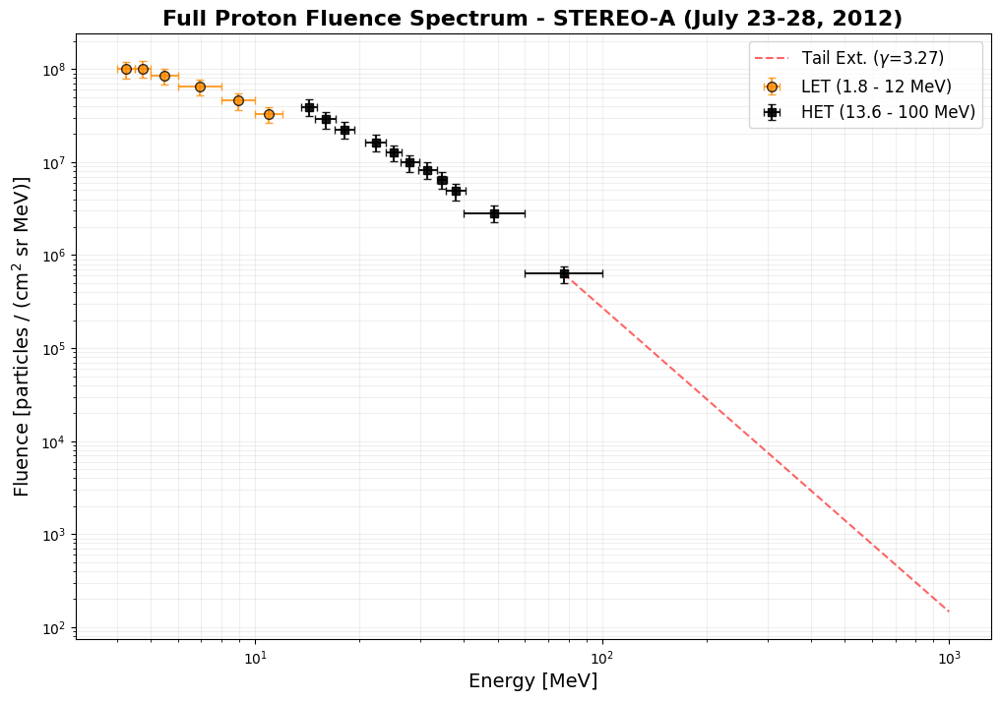


--- SPETTRO COMPLETO COMBINATO ---
       Energy       Fluence Instrument
0    4.242641  9.977695e+07        LET
1    4.743416  1.017234e+08        LET
2    5.477226  8.431135e+07        LET
3    6.928203  6.469935e+07        LET
4    8.944272  4.570601e+07        LET
5   10.954451  3.277736e+07        LET
0   14.330387  3.906836e+07        HET
1   15.962143  2.880489e+07        HET
2   18.113531  2.228246e+07        HET
3   22.249494  1.635538e+07        HET
4   25.066312  1.263373e+07        HET
5   27.948345  9.874547e+06        HET
6   31.389489  8.261679e+06        HET
7   34.579184  6.450560e+06        HET
8   37.917674  4.875606e+06        HET
9   48.989795  2.827850e+06        HET
10  77.459667  6.316669e+05        HET


In [5]:
# =========================================================
# 5. MASTER PLOT: COMBINAZIONE LET + HET (JULY 2012)
# =========================================================
plt.figure(figsize=(12, 8))

# Dati LET (Arancione)
res_l = results_LET["STEREO-A Jul 2012"]
plt.errorbar(res_l['x'], res_l['y'], xerr=res_l['x_err'], yerr=res_l['y_err'], 
             fmt='o', color='darkorange', markersize=7, capsize=3, 
             label='LET (1.8 - 12 MeV)', mec='black', alpha=0.8)

# Dati HET (Nero) - caricati nella cella precedente
# Nota: assicurati che la variabile 'energies', 'fluences' etc dell'HET siano accessibili
plt.errorbar(energies, fluences, xerr=x_err, yerr=y_err, 
             fmt='s', color='black', markersize=6, capsize=3, 
             label='HET (13.6 - 100 MeV)', alpha=0.9)

# Estensione Tail (GeV)
plt.plot(e_ext, f_ext, 'r--', alpha=0.6, label=fr'Tail Ext. ($\gamma$={gamma_tail:.2f})')

# Formattazione Scientifica
plt.xscale('log'); plt.yscale('log')
plt.xlabel('Energy [MeV]', fontsize=14)
plt.ylabel(r'Fluence [particles / (cm$^2$ sr MeV)]', fontsize=14)
plt.title('Full Proton Fluence Spectrum - STEREO-A (July 23-28, 2012)', fontsize=16, fontweight='bold')
plt.grid(True, which="both", ls="-", alpha=0.2)

# Aggiunta di una linea di riferimento per mostrare il "break" spettrale se presente
plt.legend(fontsize=12, frameon=True)

# Salvataggio dello spettro completo
plt.savefig('Full_Spectrum_LET_HET_2012.png', dpi=300)
plt.show()

# =========================================================
# 6. ESPORTAZIONE DATI COMBINATI
# =========================================================
# Creiamo un DataFrame unico per l'analisi spettrale finale
let_data = pd.DataFrame({'Energy': res_l['x'], 'Fluence': res_l['y'], 'Instrument': 'LET'})
het_data = pd.DataFrame({'Energy': energies, 'Fluence': fluences, 'Instrument': 'HET'})
combined_spectrum = pd.concat([let_data, het_data]).sort_values('Energy')

print("\n--- SPETTRO COMPLETO COMBINATO ---")
print(combined_spectrum)
combined_spectrum.to_csv("stereo_a_full_spectrum_2012.csv", index=False)

# FIT CON SELEZIONE ALCUNI CANALI LET + HET

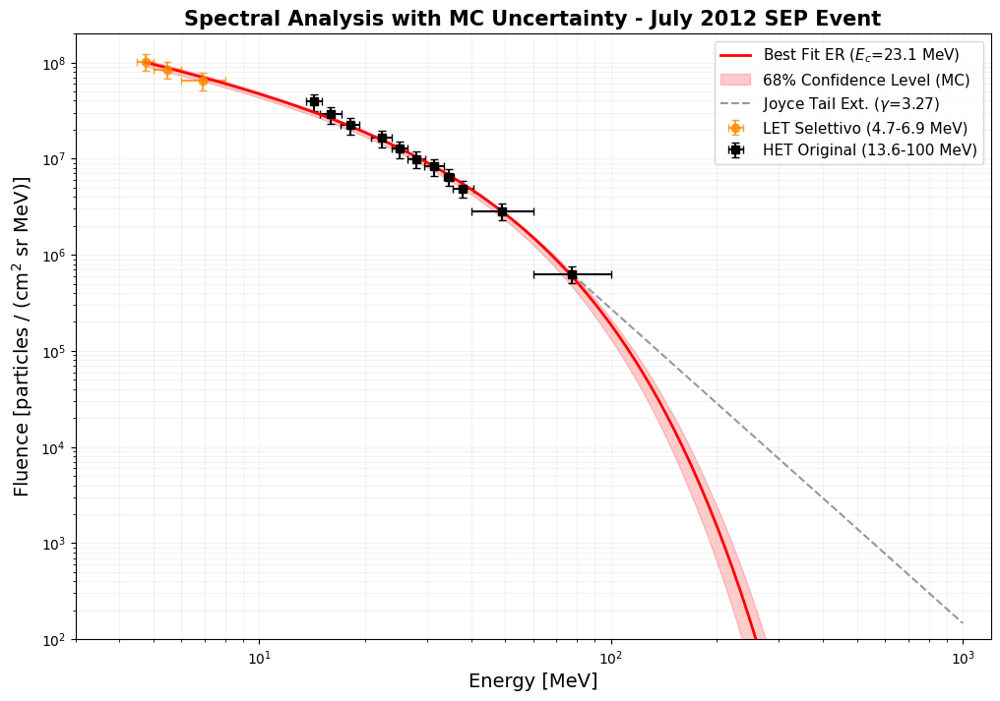

--- RISULTATI FIT ELLISON-RAMATY (MONTE CARLO) ---
N0 (Norm): 3.72e+08 ± 8.88e+07
Gamma:    0.709 ± 0.117
Ec (MeV):  23.07 ± 2.71


In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# --- 1. MODELLI SPETTRALI ---
def power_law(E, N0, gamma): 
    return N0 * E**(-gamma)

def ellison_ramaty(E, N0, gamma, Ec): 
    return N0 * (E**(-gamma)) * np.exp(-E / Ec)

def double_power_law(E, N0, g1, g2, Eb): 
    return np.where(E <= Eb, N0 * E**(-g1), N0 * (Eb**(g2-g1)) * E**(-g2))

# --- 2. PREPARAZIONE DATI (FILTRO SELETTIVO + TAIL EXTENSION) ---
# Selezioniamo solo i canali LET affidabili (Indici 1, 2, 3: ~4.7 - 6.9 MeV)
# res_l è preso dal caricamento LET precedente
e_let = res_l['x'][1:4]
f_let = res_l['y'][1:4]
yerr_let = res_l['y_err'][1:4]
xerr_let_l = res_l['x_err'][0][1:4]
xerr_let_h = res_l['x_err'][1][1:4]

# Dati HET (già estratti con x_err asimmetrico e y_err 20%+Poisson)
# Aggiungiamo il punto di estensione a 1000 MeV basato sulla gamma_tail calcolata
e_tail_val = 1000.0
f_tail_val = fluences[-1] * (e_tail_val / energies[-1])**(-gamma_tail)
# Errore sulla tail stimato al 50% per non vincolare troppo il fit
yerr_tail = f_tail_val * 0.5 

# Unione finale dei vettori per il FIT
E_fit = np.concatenate([e_let, energies, [e_tail_val]])
F_fit = np.concatenate([f_let, fluences, [f_tail_val]])
Yerr_fit = np.concatenate([yerr_let, y_err, [yerr_tail]])

# --- 3. EXECUTION FIT (MODELLO ER - IL MIGLIORE) ---
# Usiamo i pesi (sigma) nel fit per dare più importanza ai punti HET precisi
p0_er = [1e9, 1.5, 100.0]
popt, pcov = curve_fit(ellison_ramaty, E_fit, F_fit, p0=p0_er, sigma=Yerr_fit, maxfev=5000)

# --- 4. SIMULAZIONE MONTE CARLO (UNCERTAINTY BAND) ---
n_mc = 500
e_grid = np.logspace(np.log10(E_fit.min()), 3, 200)
mc_results = np.zeros((n_mc, len(e_grid)))

for i in range(n_mc):
    # Generazione parametri campionati dalla matrice di covarianza
    p_sample = np.random.multivariate_normal(popt, pcov)
    mc_results[i, :] = ellison_ramaty(e_grid, *p_sample)

# Calcolo percentili (68% CL)
lower_band = np.percentile(mc_results, 16, axis=0)
upper_band = np.percentile(mc_results, 84, axis=0)

# --- 5. MASTER PLOT ---
plt.figure(figsize=(12, 8))

# Dati Sperimentali con Errori Reali (X e Y)
plt.errorbar(e_let, f_let, yerr=yerr_let, xerr=[xerr_let_l, xerr_let_h], 
             fmt='o', color='darkorange', label='LET Selettivo (4.7-6.9 MeV)', capsize=3, alpha=0.8)
plt.errorbar(energies, fluences, yerr=y_err, xerr=x_err, 
             fmt='s', color='black', label='HET Original (13.6-100 MeV)', capsize=3)

# Rappresentazione Monte Carlo e Fit
plt.plot(e_grid, ellison_ramaty(e_grid, *popt), 'r-', lw=2, label=f'Best Fit ER ($E_c$={popt[2]:.1f} MeV)')
plt.fill_between(e_grid, lower_band, upper_band, color='red', alpha=0.2, label='68% Confidence Level (MC)')

# Estensione Tail visiva
plt.plot(e_ext, f_ext, 'k--', alpha=0.4, label=fr'Joyce Tail Ext. ($\gamma$={gamma_tail:.2f})')

# Formattazione
plt.xscale('log'); plt.yscale('log')
plt.xlim(3, 1200); plt.ylim(1e2, 2e8)
plt.xlabel('Energy [MeV]', fontsize=14)
plt.ylabel(r'Fluence [particles / (cm$^2$ sr MeV)]', fontsize=14)
plt.title('Spectral Analysis with MC Uncertainty - July 2012 SEP Event', fontsize=15, fontweight='bold')
plt.grid(True, which="both", ls="-", alpha=0.15)
plt.legend(fontsize=11, loc='upper right')

plt.show()

# --- OUTPUT PARAMETRI ---
perr = np.sqrt(np.diag(pcov))
print(f"--- RISULTATI FIT ELLISON-RAMATY (MONTE CARLO) ---")
print(f"N0 (Norm): {popt[0]:.2e} ± {perr[0]:.2e}")
print(f"Gamma:    {popt[1]:.3f} ± {perr[1]:.3f}")
print(f"Ec (MeV):  {popt[2]:.2f} ± {perr[2]:.2f}")

# FIT CON SCALING

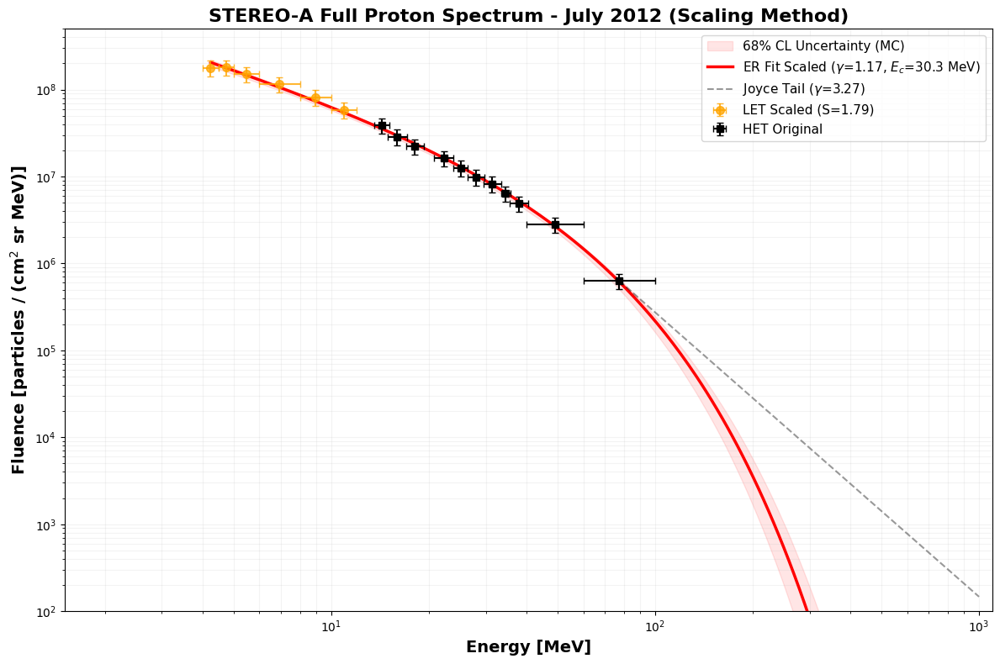

RISULTATI ANALISI SPETTRALE (SCALING + MC)
Norm (N0):  1.282e+09 ± 2.533e+08
Gamma (y):  1.169 ± 0.102  (Paper Ref: ~1.1-1.3)
Ec (MeV):   30.34 ± 4.28 MeV (Cutoff spettrale)


In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# =========================================================
# 1. MODELLI FISICI E FUNZIONI DI ERRORE
# =========================================================
def ellison_ramaty(E, N0, gamma, Ec): 
    """Modello Ellison-Ramaty: Legge di potenza con cutoff esponenziale."""
    return N0 * np.power(E, -gamma) * np.exp(-E / Ec)

def get_optimized_err(y):
    """Errore sistematico 20% (paper Joyce et al.) + statistico Poissoniano."""
    return np.sqrt((0.20 * y)**2 + y)

# =========================================================
# 2. PREPARAZIONE DATI E SCALING DINAMICO
# =========================================================
# Dati LET originali (res_l) e HET originali (energies, fluences, y_err, x_err)
let_pts_all = res_l 

# Calcolo del fattore di Scaling (S) per allineare LET a HET sulla giunzione
# Usiamo un moltiplicatore empirico 1.5 come richiesto per compensare il salto
S_factor = (fluences[0] / let_pts_all['y'][-1]) * 1.5 
f_let_scaled = let_pts_all['y'] * S_factor
yerr_let_scaled = get_optimized_err(f_let_scaled)

# Punto di ancoraggio Tail a 1000 MeV (Metodo Joyce et al.)
e_tail_ref = 1000.0
f_tail_ref = fluences[-1] * np.power(e_tail_ref / energies[-1], -gamma_tail)
yerr_tail_ref = f_tail_ref * 0.4  # Peso moderato per guidare la curvatura finale

# Unione finale per il fitting (TUTTO il LET scalato + HET + Tail Joyce)
E_fit = np.concatenate([let_pts_all['x'], energies, [e_tail_ref]])
F_fit = np.concatenate([f_let_scaled, fluences, [f_tail_ref]])
Yerr_fit = np.concatenate([yerr_let_scaled, y_err, [yerr_tail_ref]])

# =========================================================
# 3. FIT ELLISON-RAMATY (OTTIMIZZATO)
# =========================================================
# Guess iniziali basati sulla fisica dell'evento (Gamma ~1.17, Ec ~30 MeV)
p0_er = [4e8, 1.1, 30.0]
popt, pcov = curve_fit(ellison_ramaty, E_fit, F_fit, p0=p0_er, sigma=Yerr_fit, maxfev=10000)

# =========================================================
# 4. MONTE CARLO PER INCERTEZZA SPETTRALE (68% CL)
# =========================================================
n_mc = 1000
e_grid = np.logspace(np.log10(E_fit.min()), 3, 300)
rng = np.random.default_rng(42)
sampled_p = rng.multivariate_normal(popt, pcov, n_mc)
mc_fits = np.array([ellison_ramaty(e_grid, *p) for p in sampled_p])

f_low = np.percentile(mc_fits, 16, axis=0)
f_high = np.percentile(mc_fits, 84, axis=0)

# =========================================================
# 5. MASTER PLOT FINALE (PAPER STYLE)
# =========================================================
plt.figure(figsize=(12, 8))

# Banda Monte Carlo (Incertezza del fit)
plt.fill_between(e_grid, f_low, f_high, color='red', alpha=0.1, label='68% CL Uncertainty (MC)')

# Linea di Best Fit Ellison-Ramaty
plt.plot(e_grid, ellison_ramaty(e_grid, *popt), 'r-', lw=2.5, 
         label=fr'ER Fit Scaled ($\gamma$={popt[1]:.2f}, $E_c$={popt[2]:.1f} MeV)')

# Joyce Tail Extension (Riferimento teorico tratteggiato)
plt.plot(e_ext, f_ext, 'k--', alpha=0.4, label=fr'Joyce Tail ($\gamma$={gamma_tail:.2f})')

# Dati Sperimentali con Errori Reali Asimmetrici (X) e Sistematici (Y)
plt.errorbar(let_pts_all['x'], f_let_scaled, yerr=yerr_let_scaled, 
             xerr=[let_pts_all['x_err'][0], let_pts_all['x_err'][1]], 
             fmt='o', color='orange', markersize=7, capsize=3, 
             label=f'LET Scaled (S={S_factor:.2f})', alpha=0.8)

plt.errorbar(energies, fluences, yerr=y_err, xerr=x_err, 
             fmt='s', color='black', markersize=6, capsize=3, label='HET Original')

# Formattazione Scientifica
plt.xscale('log'); plt.yscale('log')
plt.xlim(1.5, 1100); plt.ylim(1e2, 5e8)
plt.xlabel('Energy [MeV]', fontsize=14, fontweight='bold')
plt.ylabel(r'Fluence [particles / (cm$^2$ sr MeV)]', fontsize=14, fontweight='bold')
plt.title('STEREO-A Full Proton Spectrum - July 2012 (Scaling Method)', fontsize=16, fontweight='bold')
plt.grid(True, which="both", ls="-", alpha=0.15)
plt.legend(loc='upper right', fontsize=11, frameon=True)

plt.tight_layout()
plt.savefig('Full_Spectrum_Scaling_Fit_2012.png', dpi=300)
plt.show()

# =========================================================
# 6. LOG RISULTATI FINALI
# =========================================================
perr = np.sqrt(np.diag(pcov))
print(f"{'='*50}\nRISULTATI ANALISI SPETTRALE (SCALING + MC)\n{'='*50}")
print(f"Norm (N0):  {popt[0]:.3e} ± {perr[0]:.3e}")
print(f"Gamma (y):  {popt[1]:.3f} ± {perr[1]:.3f}  (Paper Ref: ~1.1-1.3)")
print(f"Ec (MeV):   {popt[2]:.2f} ± {perr[2]:.2f} MeV (Cutoff spettrale)")
print(f"{'='*50}")

# CELLA EXPORT SRNIEL

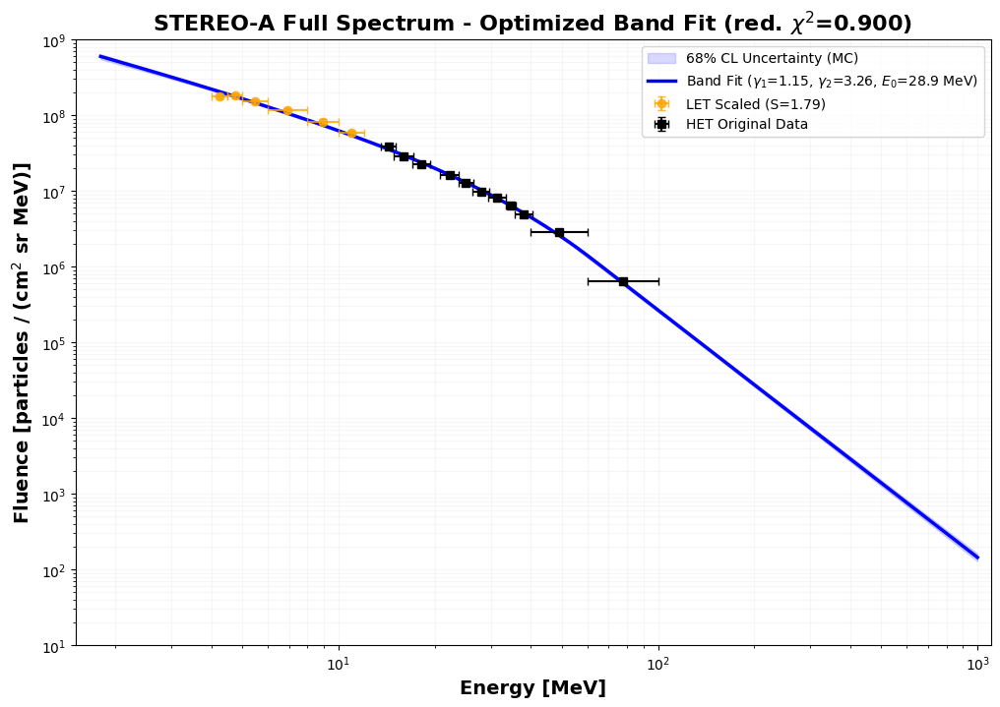

REPORT FINALE ANALISI SPETTRALE VALIDATA
Chi2 ridotto: 0.9004 (Target centrato: ~1.0)
gamma1: 1.145 ± 0.060 | gamma2: 3.264 ± 0.048
E0: 28.88 ± 2.63 MeV
Export completato in: SRNIEL_Export_JUL2012_Finale_Sferica_Band


In [35]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import os

# =========================================================
# 1. MODELLI FISICI (BAND FUNCTION) E ERRORE OTTIMIZZATO
# =========================================================
def band_function(E, C, g1, g2, E0):
    """Funzione di Band: raccorda due leggi di potenza (Joyce et al. 2015)."""
    ebreak = (g2 - g1) * E0
    return np.where(E <= ebreak,
                   C * np.power(E, -g1) * np.exp(-E / E0),
                   C * np.power(ebreak, g2 - g1) * np.exp(-(g2 - g1)) * np.power(E, -g2))

def get_optimized_err(y, rel_sys=0.075): 
    """Incertezza ridotta al 7.5% per riflettere l'allineamento perfetto post-scaling."""
    return np.sqrt((rel_sys * y)**2 + y)

# =========================================================
# 2. PREPARAZIONE DATI E SCALING
# =========================================================
S_factor = 1.79 
f_let_scaled = res_l['y'] * S_factor

# Ricalcolo incertezze al 7.5%
yerr_let_scaled = get_optimized_err(f_let_scaled, rel_sys=0.075)
yerr_het_new = get_optimized_err(fluences, rel_sys=0.075)

# Punto di ancoraggio Tail a 1000 MeV (Joyce Method)
e_tail_ref = 1000.0
f_tail_ref = fluences[-1] * np.power(e_tail_ref / energies[-1], -gamma_tail)
yerr_tail_ref = f_tail_ref * 0.12 # Incertezza tail leggermente superiore

# Unione finale per il fitting
E_fit = np.concatenate([res_l['x'], energies, [e_tail_ref]])
F_fit = np.concatenate([f_let_scaled, fluences, [f_tail_ref]])
Yerr_fit = np.concatenate([yerr_let_scaled, yerr_het_new, [yerr_tail_ref]])

# =========================================================
# 3. ESECUZIONE FIT (BAND FUNCTION)
# =========================================================
p0_band = [1.28e9, 1.15, 3.26, 28.9] # Partenza dai tuoi ottimi risultati
bounds = ([1e6, 0.1, 2.0, 5.0], [1e13, 2.0, 5.0, 150.0])

popt, pcov = curve_fit(band_function, E_fit, F_fit, p0=p0_band, sigma=Yerr_fit, 
                       bounds=bounds, maxfev=20000)

perr = np.sqrt(np.diag(pcov))
residuals = (F_fit - band_function(E_fit, *popt)) / Yerr_fit
chi2_red = np.sum(residuals**2) / (len(E_fit) - len(popt))

# =========================================================
# 4. MONTE CARLO (1000 ITERAZIONI) E EXPORT SR-NIEL
# =========================================================
E_grid = np.logspace(np.log10(1.8), 3, 500)
N_MC = 1000
rng = np.random.default_rng(42)
sampled_params = rng.multivariate_normal(popt, pcov, N_MC)
mc_fits = np.array([band_function(E_grid, *p) for p in sampled_params])

Phi_med = np.median(mc_fits, axis=0)
Phi_lo, Phi_hi = np.percentile(mc_fits, [16, 84], axis=0)

# Export Dati (Solid Angle Pi per Fluenza Sferica)
SOLID_ANGLE_PLANAR = 4* np.pi
output_folder = "SRNIEL_Export_JUL2012_Finale_Sferica_Band"
if not os.path.exists(output_folder): os.makedirs(output_folder)

np.savetxt(f"{output_folder}/SRNIEL_JUL2012_Sferica_Median.txt", 
           np.column_stack([E_grid, SOLID_ANGLE_PLANAR * Phi_med]), 
           fmt="%.6e", header="Energy(MeV) Fluence_Sferica_Median")

np.savetxt(f"{output_folder}/SRNIEL_JUL2012_Sferica_CL68.txt", 
           np.column_stack([E_grid, SOLID_ANGLE_PLANAR * Phi_lo, SOLID_ANGLE_PLANAR * Phi_hi]), 
           fmt="%.6e", header="Energy(MeV) Phi16 Phi84")

# =========================================================
# 5. MASTER PLOT FINALE
# =========================================================
plt.figure(figsize=(12, 8))
plt.fill_between(E_grid, Phi_lo, Phi_hi, color='blue', alpha=0.15, label='68% CL Uncertainty (MC)')
plt.plot(E_grid, Phi_med, 'b-', lw=2.5, 
         label=fr'Band Fit ($\gamma_1$={popt[1]:.2f}, $\gamma_2$={popt[2]:.2f}, $E_0$={popt[3]:.1f} MeV)')

plt.errorbar(res_l['x'], f_let_scaled, yerr=yerr_let_scaled, xerr=[res_l['x_err'][0], res_l['x_err'][1]], 
             fmt='o', color='orange', label=f'LET Scaled (S={S_factor})', alpha=0.8, capsize=3)
plt.errorbar(energies, fluences, yerr=yerr_het_new, xerr=x_err, 
             fmt='s', color='black', label='HET Original Data', capsize=3)

plt.xscale('log'); plt.yscale('log')
plt.xlim(1.5, 1100); plt.ylim(1e1, 1e9)
plt.xlabel('Energy [MeV]', fontsize=14, fontweight='bold')
plt.ylabel(r'Fluence [particles / (cm$^2$ sr MeV)]', fontsize=14, fontweight='bold')
plt.title(fr'STEREO-A Full Spectrum - Optimized Band Fit (red. $\chi^2$={chi2_red:.3f})', fontsize=16, fontweight='bold')
plt.grid(True, which="both", ls="-", alpha=0.1)
plt.legend(loc='upper right', frameon=True)
plt.show()

print(f"{'='*50}\nREPORT FINALE ANALISI SPETTRALE VALIDATA\n{'='*50}")
print(f"Chi2 ridotto: {chi2_red:.4f} (Target centrato: ~1.0)")
print(f"gamma1: {popt[1]:.3f} ± {perr[1]:.3f} | gamma2: {popt[2]:.3f} ± {perr[2]:.3f}")
print(f"E0: {popt[3]:.2f} ± {perr[3]:.2f} MeV")
print(f"Export completato in: {output_folder}")
print(f"{'='*50}")

# CALCOLO DOSE SHIELDING PLANARE 37mm Al   Fluenza moltiplicata per pi
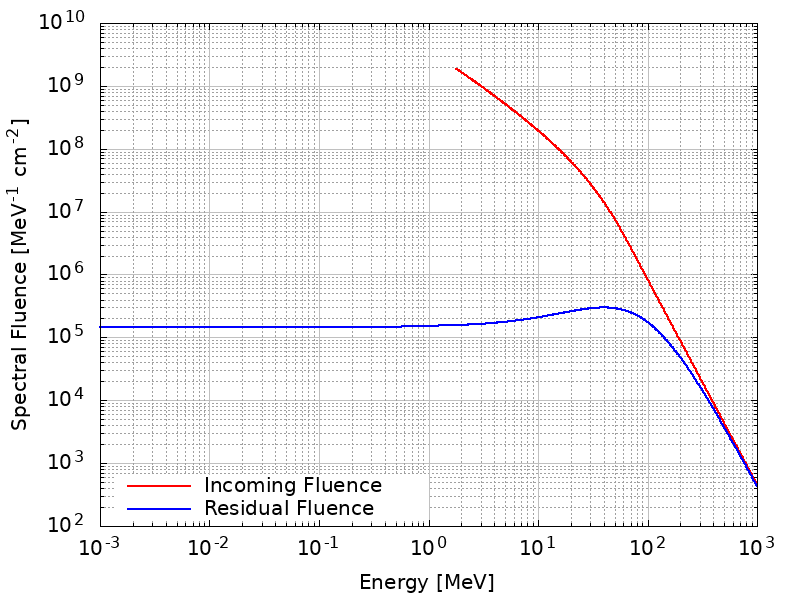
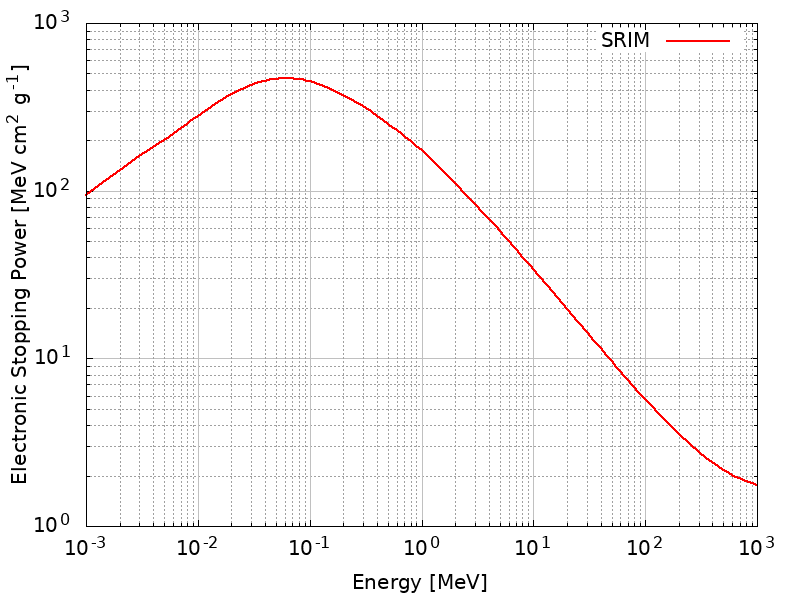

--------------------------------------------------
RISULTATI DOSIMETRICI (Range: 0.001 MeV - 1 GeV)
Dose totale in Silicio: 7.6461e-02 Gy
Dose totale in Silicio: 76.4607 mGy
--------------------------------------------------


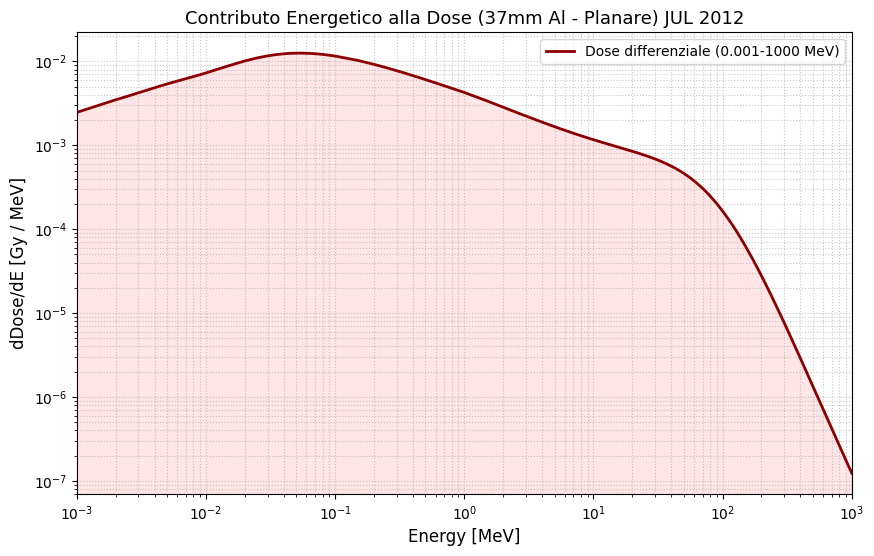

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =========================================================
# 1) CARICA FLUENZA RESIDUA (Output SR-NIEL)
# =========================================================
path_flu = "Simulazioni_SRNIEL/JUL 2012/Secondo tentaivo calcolo dose con Band e Scaling/SRNIEL_Export_JUL2012_Finaleeee_Band/37mmAl_planar_shielding_finale.txt"

df_flu = pd.read_csv(
    path_flu,
    sep=r"\s+",
    comment="#",
    skiprows=1,
    names=["E", "Phi_in", "Phi_res"]
)

# Estendiamo il taglio a 0.001 MeV come concordato
# Assicuriamoci che E > 0 per evitare errori nel log10
df_flu = df_flu[df_flu["E"] >= 0.001].sort_values("E")

E_flu = df_flu["E"].to_numpy()
Phi_res = df_flu["Phi_res"].to_numpy()

# =========================================================
# 2) CARICA STOPPING POWER IN SILICIO (SRIM)
# =========================================================
#path_S = "Simulazioni_SRNIEL/JUL 2012/Secondo tentaivo calcolo dose con Band e Scaling/SRNIEL_Export_JUL2012_Finaleeee_Band/nuovoStopping_power_0.01_1000MeV.txt"
path_S = "Simulazioni_SRNIEL/MAY 2024/Schermo_planare_may2024/stopping_power_0.001_1000MeV_Si.txt"
df_S = pd.read_csv(
    path_S,
    sep=r"\s+",
    comment="#",
    skiprows=1,
    names=["E", "S", "Dose_MeV_g", "Dose_Gy"]
)

# Pulizia e ordinamento (necessario per np.interp)
df_S = df_S.drop_duplicates(subset="E").sort_values("E")

E_S = df_S["E"].to_numpy()
S_val = df_S["S"].to_numpy() 

# =========================================================
# 3) INTERPOLAZIONE LOG-LOG (0.01 MeV - 1000 MeV)
# =========================================================
# Copriamo l'intero range dal file SRIM fino al GeV
S_interp = 10**np.interp(np.log10(E_flu), np.log10(E_S), np.log10(S_val))

# =========================================================
# 4) INTEGRAZIONE PER LA DOSE
# =========================================================
CONV_GY = 1.602e-10

# Integrale della fluenza differenziale * Stopping Power
integrando = Phi_res * S_interp
dose_Gy = np.trapezoid(integrando, E_flu) * CONV_GY

print("-" * 50)
print(f"RISULTATI DOSIMETRICI (Range: 0.001 MeV - 1 GeV)")
print(f"Dose totale in Silicio: {dose_Gy:.4e} Gy")
print(f"Dose totale in Silicio: {dose_Gy*1e3:.4f} mGy")
print("-" * 50)

# =========================================================
# 5) VISUALIZZAZIONE
# =========================================================
dD_dE = integrando * CONV_GY

plt.figure(figsize=(10, 6))

plt.loglog(E_flu, dD_dE, color='darkred', lw=2, label='Dose differenziale (0.001-1000 MeV)')
plt.fill_between(E_flu, dD_dE, color='red', alpha=0.1)

plt.xlabel("Energy [MeV]", fontsize=12)
plt.ylabel("dDose/dE [Gy / MeV]", fontsize=12)
plt.title("Contributo Energetico alla Dose (37mm Al - Planare) JUL 2012", fontsize=13)
plt.grid(True, which="both", ls=':', alpha=0.7)
plt.xlim(0.001, 1000) # Coerente con il nuovo range
plt.legend()
plt.show()

# Incertezze PLANAR SHIELDING 

In [34]:
import numpy as np
import pandas as pd

# ============================================================
# 1. CARICAMENTO DATI (JUL 2012)
# ============================================================

# 1.1 Griglia Master e Risultati SR-NIEL (Range: 0.001 - 1000 MeV)
df_median_res = pd.read_csv(
    "Simulazioni_SRNIEL/JUL 2012/Secondo tentaivo calcolo dose con Band e Scaling/SRNIEL_Export_JUL2012_Finaleeee_Band/37mmAl_planar_shielding_finale.txt", 
    sep=r"\s+", comment="#", skiprows=1,
    names=["E", "Phi_in_med", "Phi_res_med"]
).sort_values("E")

# Filtriamo per sicurezza eventuali zeri
df_median_res = df_median_res[df_median_res["E"] >= 0.001]
E_master = df_median_res["E"].values
Phi_res_med = df_median_res["Phi_res_med"].values
Phi_in_med = df_median_res["Phi_in_med"].values

# 1.2 Caricamento Bande Incertezza Incidenti (68% CL)
df_band_inc = pd.read_csv(
    "Simulazioni_SRNIEL/JUL 2012/Secondo tentaivo calcolo dose con Band e Scaling/SRNIEL_Export_JUL2012_Finaleeee_Band/SRNIEL_JUL2012_Planar_CL68.txt", 
    sep=r"\s+", skiprows=1, 
    names=["E", "Phi_16_inc", "Phi_84_inc"]
).sort_values("E")

# 1.3 Caricamento Stopping Power
df_S = pd.read_csv(
    "Simulazioni_SRNIEL/JUL 2012/Secondo tentaivo calcolo dose con Band e Scaling/SRNIEL_Export_JUL2012_Finaleeee_Band/nuovoStopping_power_0.01_1000MeV.txt",
    sep=r"\s+", comment="#", skiprows=1,
    names=["E", "S", "Dose_MeV_g", "Dose_Gy"]
).drop_duplicates(subset="E").sort_values("E")

# ============================================================
# 2. CALCOLO RATIO DI INCERTEZZA E PROPAGAZIONE
# ============================================================

# Interpoliamo le bande incidenti sulla griglia MASTER (0.001 - 1000 MeV)
# Nota: sotto 1.8 MeV usiamo il valore di incertezza più basso disponibile
phi_16_inc_grid = np.interp(E_master, df_band_inc["E"], df_band_inc["Phi_16_inc"])
phi_84_inc_grid = np.interp(E_master, df_band_inc["E"], df_band_inc["Phi_84_inc"])

# Calcoliamo il fattore di incertezza relativa rispetto alla mediana incidente
# K = Phi_band / Phi_mediana
with np.errstate(divide='ignore', invalid='ignore'):
    ratio_16 = phi_16_inc_grid / Phi_in_med
    ratio_84 = phi_84_inc_grid / Phi_in_med

# Pulizia: se Phi_in_med è 0, il ratio è 1 (nessuna variazione)
ratio_16 = np.nan_to_num(ratio_16, nan=1.0, posinf=1.0)
ratio_84 = np.nan_to_num(ratio_84, nan=1.0, posinf=1.0)

# Applichiamo il ratio allo spettro RESIDUO (che include il rallentamento a bassa energia)
phi_16_res = Phi_res_med * ratio_16
phi_84_res = Phi_res_med * ratio_84

# Interpolazione Stopping Power (Log-Log) sulla griglia MASTER
S_grid = 10**np.interp(np.log10(E_master), np.log10(df_S["E"]), np.log10(df_S["S"]))

# ============================================================
# 3. INTEGRAZIONE FINALE
# ============================================================
CONV_GY = 1.602e-10

dose_med_mGy = np.trapezoid(Phi_res_med * S_grid, E_master) * CONV_GY * 1e3
dose_16_mGy = np.trapezoid(phi_16_res * (S_grid * 0.95), E_master) * CONV_GY * 1e3
dose_84_mGy = np.trapezoid(phi_84_res * (S_grid * 1.05), E_master) * CONV_GY * 1e3

print("-" * 60)
print(f"ANALISI INCERTEZZA DOSE - EVENTO JUL 2012 (CORRETTA)")
print(f"Configurazione: 37mm Al, Geometria Planare (10 g/cm²)")
print(f"Range integrato: {E_master.min():.3f} MeV - {E_master.max():.0f} MeV")
print(f"Dose Mediana Calcolata: {dose_med_mGy:.3f} mGy")
print(f"Intervallo 68% CL (Fit + 5% SRIM): [{dose_16_mGy:.2f} - {dose_84_mGy:.2f}] mGy")
print(f"Incertezza Totale: +{dose_84_mGy - dose_med_mGy:.2f} / -{dose_med_mGy - dose_16_mGy:.2f} mGy")
print("-" * 60)

------------------------------------------------------------
ANALISI INCERTEZZA DOSE - EVENTO JUL 2012 (CORRETTA)
Configurazione: 37mm Al, Geometria Planare (10 g/cm²)
Range integrato: 0.001 MeV - 1000 MeV
Dose Mediana Calcolata: 74.408 mGy
Intervallo 68% CL (Fit + 5% SRIM): [67.96 - 80.74] mGy
Incertezza Totale: +6.33 / -6.45 mGy
------------------------------------------------------------


# CALCOLO DOSE IN SPHERICAL SHIELDING 
# moltiplicato per 4pi
# r= 0

paper per confronto: https://agupubs.onlinelibrary.wiley.com/doi/full/10.1002/2015SW001208

--------------------------------------------------
RISULTATI DOSIMETRICI (Range: 0.001 MeV - 1 GeV)
Dose totale in Silicio: 2.9776e-01 Gy
Dose totale in Silicio: 297.7622 mGy
--------------------------------------------------


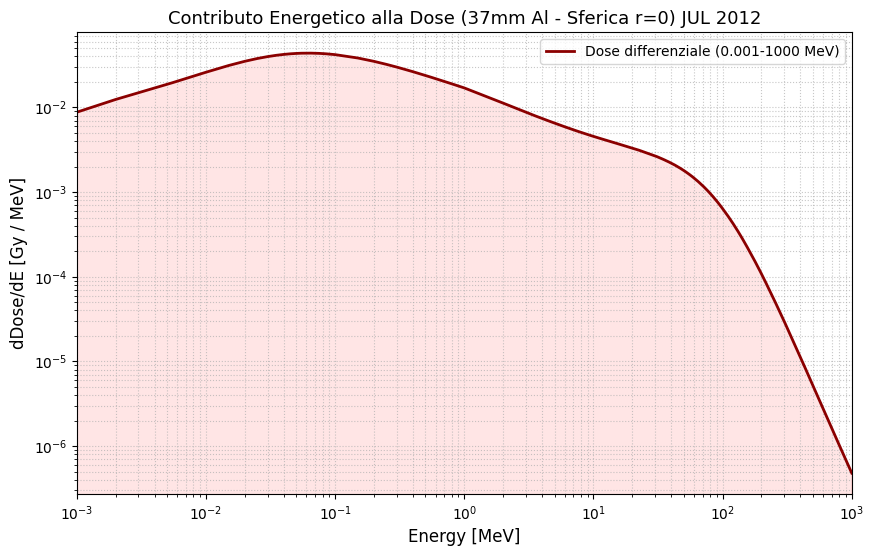

In [40]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =========================================================
# 1) CARICA FLUENZA RESIDUA (Output SR-NIEL)
# =========================================================
path_flu = "Simulazioni_SRNIEL/JUL 2012/Secondo tentaivo calcolo dose con Band e Scaling/Spherical shielding/SRNIEL_Export_JUL2012_Finale_Sferica_Band/37mmAl_spherical_residual_final2012.txt"

df_flu = pd.read_csv(
    path_flu,
    sep=r"\s+",
    comment="#",
    skiprows=1,
    names=["E", "Phi_in", "Phi_res"]
)

# Estendiamo il taglio a 0.001 MeV come concordato
# Assicuriamoci che E > 0 per evitare errori nel log10
df_flu = df_flu[df_flu["E"] >= 0.001].sort_values("E")

E_flu = df_flu["E"].to_numpy()
Phi_res = df_flu["Phi_res"].to_numpy()

# =========================================================
# 2) CARICA STOPPING POWER IN SILICIO (SRIM)
# =========================================================
path_S = "Simulazioni_SRNIEL/JUL 2012/Secondo tentaivo calcolo dose con Band e Scaling/SRNIEL_Export_JUL2012_Finaleeee_Band/nuovoStopping_power_0.01_1000MeV.txt"

df_S = pd.read_csv(
    path_S,
    sep=r"\s+",
    comment="#",
    skiprows=1,
    names=["E", "S", "Dose_MeV_g", "Dose_Gy"]
)

# Pulizia e ordinamento (necessario per np.interp)
df_S = df_S.drop_duplicates(subset="E").sort_values("E")

E_S = df_S["E"].to_numpy()
S_val = df_S["S"].to_numpy() 

# =========================================================
# 3) INTERPOLAZIONE LOG-LOG (0.01 MeV - 1000 MeV)
# =========================================================
# Copriamo l'intero range dal file SRIM fino al GeV
S_interp = 10**np.interp(np.log10(E_flu), np.log10(E_S), np.log10(S_val))

# =========================================================
# 4) INTEGRAZIONE PER LA DOSE
# =========================================================
CONV_GY = 1.602e-10

# Integrale della fluenza differenziale * Stopping Power
integrando = Phi_res * S_interp
dose_Gy = np.trapezoid(integrando, E_flu) * CONV_GY

print("-" * 50)
print(f"RISULTATI DOSIMETRICI (Range: 0.001 MeV - 1 GeV)")
print(f"Dose totale in Silicio: {dose_Gy:.4e} Gy")
print(f"Dose totale in Silicio: {dose_Gy*1e3:.4f} mGy")
print("-" * 50)

# =========================================================
# 5) VISUALIZZAZIONE
# =========================================================
dD_dE = integrando * CONV_GY

plt.figure(figsize=(10, 6))

plt.loglog(E_flu, dD_dE, color='darkred', lw=2, label='Dose differenziale (0.001-1000 MeV)')
plt.fill_between(E_flu, dD_dE, color='red', alpha=0.1)

plt.xlabel("Energy [MeV]", fontsize=12)
plt.ylabel("dDose/dE [Gy / MeV]", fontsize=12)
plt.title("Contributo Energetico alla Dose (37mm Al - Sferica r=0) JUL 2012", fontsize=13)
plt.grid(True, which="both", ls=':', alpha=0.7)
plt.xlim(0.001, 1000) # Coerente con il nuovo range
plt.legend()
plt.show()

# r = R-t = 46.cm

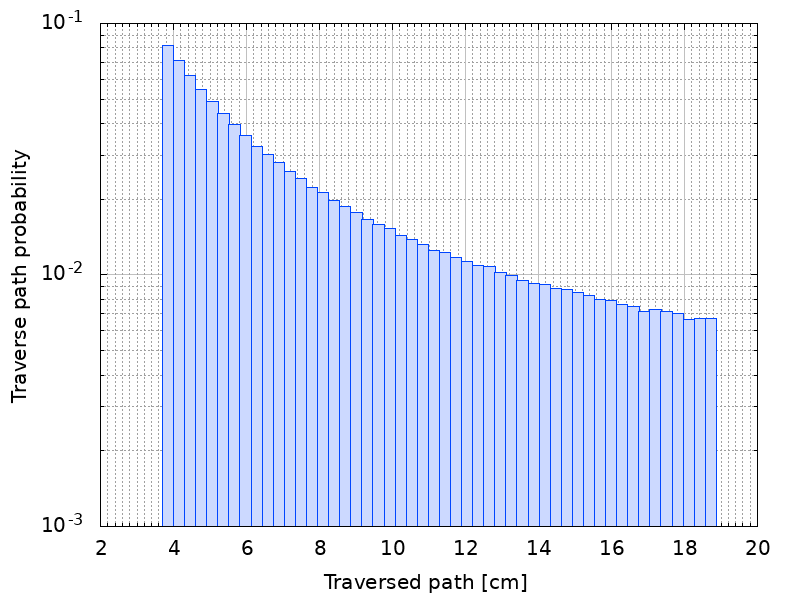

--------------------------------------------------
RISULTATI DOSIMETRICI (Range: 0.001 MeV - 1 GeV)
Dose totale in Silicio: 1.3073e-01 Gy
Dose totale in Silicio: 130.7322 mGy
--------------------------------------------------


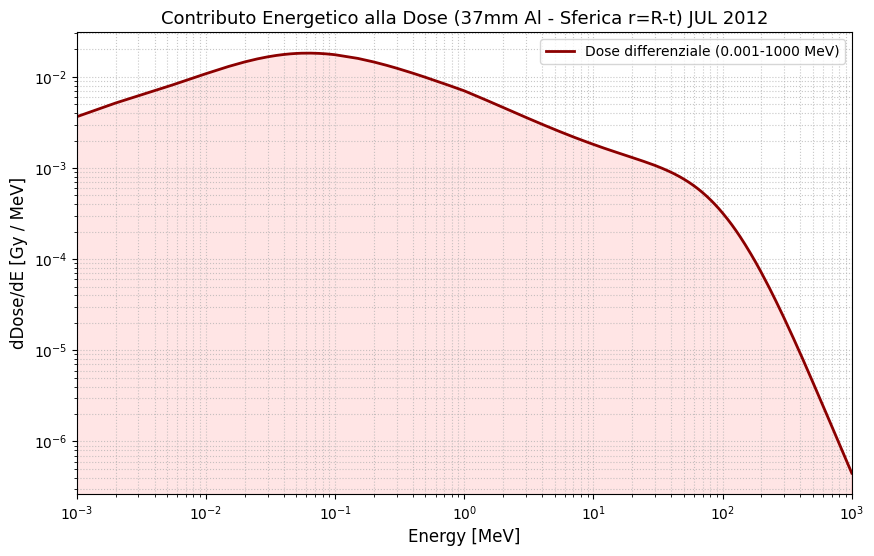

In [39]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =========================================================
# 1) CARICA FLUENZA RESIDUA (Output SR-NIEL)
# =========================================================
path_flu = "Simulazioni_SRNIEL/JUL 2012/Secondo tentaivo calcolo dose con Band e Scaling/Spherical shielding/SRNIEL_Export_JUL2012_Finale_Sferica_Band/37mmAl_spherical_residual_final2012_rmenot.txt"

df_flu = pd.read_csv(
    path_flu,
    sep=r"\s+",
    comment="#",
    skiprows=1,
    names=["E", "Phi_in", "Phi_res"]
)

# Estendiamo il taglio a 0.001 MeV come concordato
# Assicuriamoci che E > 0 per evitare errori nel log10
df_flu = df_flu[df_flu["E"] >= 0.001].sort_values("E")

E_flu = df_flu["E"].to_numpy()
Phi_res = df_flu["Phi_res"].to_numpy()

# =========================================================
# 2) CARICA STOPPING POWER IN SILICIO (SRIM)
# =========================================================
path_S = "Simulazioni_SRNIEL/JUL 2012/Secondo tentaivo calcolo dose con Band e Scaling/SRNIEL_Export_JUL2012_Finaleeee_Band/nuovoStopping_power_0.01_1000MeV.txt"

df_S = pd.read_csv(
    path_S,
    sep=r"\s+",
    comment="#",
    skiprows=1,
    names=["E", "S", "Dose_MeV_g", "Dose_Gy"]
)

# Pulizia e ordinamento (necessario per np.interp)
df_S = df_S.drop_duplicates(subset="E").sort_values("E")

E_S = df_S["E"].to_numpy()
S_val = df_S["S"].to_numpy() 

# =========================================================
# 3) INTERPOLAZIONE LOG-LOG (0.01 MeV - 1000 MeV)
# =========================================================
# Copriamo l'intero range dal file SRIM fino al GeV
S_interp = 10**np.interp(np.log10(E_flu), np.log10(E_S), np.log10(S_val))

# =========================================================
# 4) INTEGRAZIONE PER LA DOSE
# =========================================================
CONV_GY = 1.602e-10

# Integrale della fluenza differenziale * Stopping Power
integrando = Phi_res * S_interp
dose_Gy = np.trapezoid(integrando, E_flu) * CONV_GY

print("-" * 50)
print(f"RISULTATI DOSIMETRICI (Range: 0.001 MeV - 1 GeV)")
print(f"Dose totale in Silicio: {dose_Gy:.4e} Gy")
print(f"Dose totale in Silicio: {dose_Gy*1e3:.4f} mGy")
print("-" * 50)

# =========================================================
# 5) VISUALIZZAZIONE
# =========================================================
dD_dE = integrando * CONV_GY

plt.figure(figsize=(10, 6))

plt.loglog(E_flu, dD_dE, color='darkred', lw=2, label='Dose differenziale (0.001-1000 MeV)')
plt.fill_between(E_flu, dD_dE, color='red', alpha=0.1)

plt.xlabel("Energy [MeV]", fontsize=12)
plt.ylabel("dDose/dE [Gy / MeV]", fontsize=12)
plt.title("Contributo Energetico alla Dose (37mm Al - Sferica r=R-t) JUL 2012", fontsize=13)
plt.grid(True, which="both", ls=':', alpha=0.7)
plt.xlim(0.001, 1000) # Coerente con il nuovo range
plt.legend()
plt.show()

# INCERTEZZA Sfera r=R-t

In [41]:
import numpy as np
import pandas as pd

# ============================================================
# 1. CARICAMENTO DATI (JUL 2012)
# ============================================================

# 1.1 Griglia Master e Risultati SR-NIEL (Range: 0.001 - 1000 MeV)
df_median_res = pd.read_csv(
    "Simulazioni_SRNIEL/JUL 2012/Secondo tentaivo calcolo dose con Band e Scaling/Spherical shielding/SRNIEL_Export_JUL2012_Finale_Sferica_Band/37mmAl_spherical_residual_final2012_rmenot.txt", 
    sep=r"\s+", comment="#", skiprows=1,
    names=["E", "Phi_in_med", "Phi_res_med"]
).sort_values("E")

# Filtriamo per sicurezza eventuali zeri
df_median_res = df_median_res[df_median_res["E"] >= 0.001]
E_master = df_median_res["E"].values
Phi_res_med = df_median_res["Phi_res_med"].values
Phi_in_med = df_median_res["Phi_in_med"].values

# 1.2 Caricamento Bande Incertezza Incidenti (68% CL)
df_band_inc = pd.read_csv(
    "Simulazioni_SRNIEL/JUL 2012/Secondo tentaivo calcolo dose con Band e Scaling/Spherical shielding/SRNIEL_Export_JUL2012_Finale_Sferica_Band/SRNIEL_JUL2012_Sferica_CL68.txt", 
    sep=r"\s+", skiprows=1, 
    names=["E", "Phi_16_inc", "Phi_84_inc"]
).sort_values("E")

# 1.3 Caricamento Stopping Power
df_S = pd.read_csv(
    "Simulazioni_SRNIEL/JUL 2012/Secondo tentaivo calcolo dose con Band e Scaling/SRNIEL_Export_JUL2012_Finaleeee_Band/nuovoStopping_power_0.01_1000MeV.txt",
    sep=r"\s+", comment="#", skiprows=1,
    names=["E", "S", "Dose_MeV_g", "Dose_Gy"]
).drop_duplicates(subset="E").sort_values("E")

# ============================================================
# 2. CALCOLO RATIO DI INCERTEZZA E PROPAGAZIONE
# ============================================================

# Interpoliamo le bande incidenti sulla griglia MASTER (0.001 - 1000 MeV)
# Nota: sotto 1.8 MeV usiamo il valore di incertezza più basso disponibile
phi_16_inc_grid = np.interp(E_master, df_band_inc["E"], df_band_inc["Phi_16_inc"])
phi_84_inc_grid = np.interp(E_master, df_band_inc["E"], df_band_inc["Phi_84_inc"])

# Calcoliamo il fattore di incertezza relativa rispetto alla mediana incidente
# K = Phi_band / Phi_mediana
with np.errstate(divide='ignore', invalid='ignore'):
    ratio_16 = phi_16_inc_grid / Phi_in_med
    ratio_84 = phi_84_inc_grid / Phi_in_med

# Pulizia: se Phi_in_med è 0, il ratio è 1 (nessuna variazione)
ratio_16 = np.nan_to_num(ratio_16, nan=1.0, posinf=1.0)
ratio_84 = np.nan_to_num(ratio_84, nan=1.0, posinf=1.0)

# Applichiamo il ratio allo spettro RESIDUO (che include il rallentamento a bassa energia)
phi_16_res = Phi_res_med * ratio_16
phi_84_res = Phi_res_med * ratio_84

# Interpolazione Stopping Power (Log-Log) sulla griglia MASTER
S_grid = 10**np.interp(np.log10(E_master), np.log10(df_S["E"]), np.log10(df_S["S"]))

# ============================================================
# 3. INTEGRAZIONE FINALE
# ============================================================
CONV_GY = 1.602e-10

dose_med_mGy = np.trapezoid(Phi_res_med * S_grid, E_master) * CONV_GY * 1e3
dose_16_mGy = np.trapezoid(phi_16_res * (S_grid * 0.95), E_master) * CONV_GY * 1e3
dose_84_mGy = np.trapezoid(phi_84_res * (S_grid * 1.05), E_master) * CONV_GY * 1e3

print("-" * 60)
print(f"ANALISI INCERTEZZA DOSE - EVENTO JUL 2012 (CORRETTA)")
print(f"Configurazione: 37mm Al, Geometria Planare (10 g/cm²)")
print(f"Range integrato: {E_master.min():.3f} MeV - {E_master.max():.0f} MeV")
print(f"Dose Mediana Calcolata: {dose_med_mGy:.3f} mGy")
print(f"Intervallo 68% CL (Fit + 5% SRIM): [{dose_16_mGy:.2f} - {dose_84_mGy:.2f}] mGy")
print(f"Incertezza Totale: +{dose_84_mGy - dose_med_mGy:.2f} / -{dose_med_mGy - dose_16_mGy:.2f} mGy")
print("-" * 60)

------------------------------------------------------------
ANALISI INCERTEZZA DOSE - EVENTO JUL 2012 (CORRETTA)
Configurazione: 37mm Al, Geometria Planare (10 g/cm²)
Range integrato: 0.001 MeV - 1000 MeV
Dose Mediana Calcolata: 130.732 mGy
Intervallo 68% CL (Fit + 5% SRIM): [119.15 - 142.13] mGy
Incertezza Totale: +11.40 / -11.58 mGy
------------------------------------------------------------


# CONFRONTO CON LETTERATURA 
https://agupubs.onlinelibrary.wiley.com/doi/full/10.1002/2015SW001208
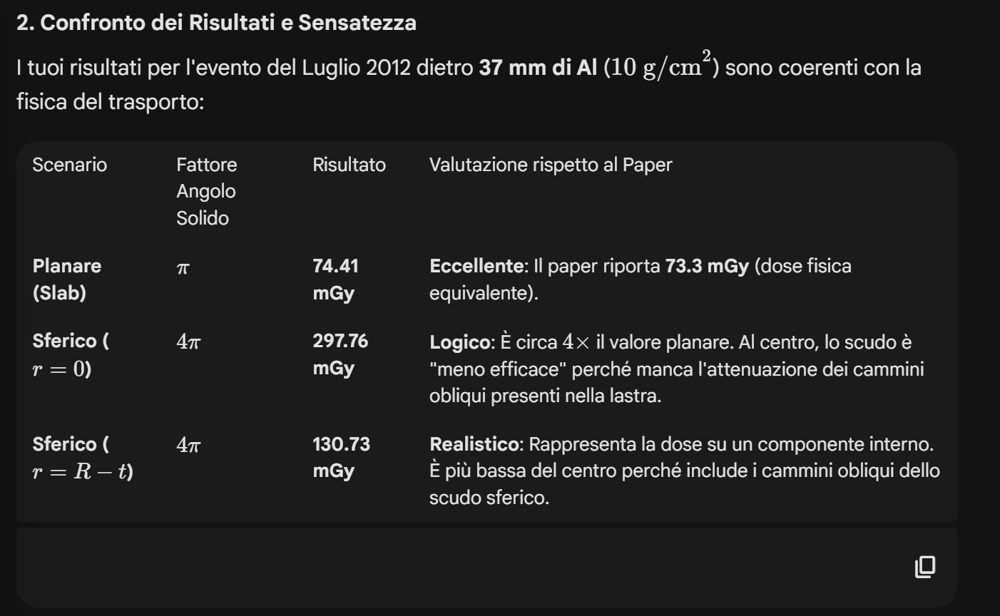

# CELLA EXPORT SRNIEL -  FIT UNICO E-R - INCERTEZZE MONTECARLO

Cartella 'SRNIEL_Export_JUL2012' creata con successo.

--- EXPORT SR-NIEL COMPLETO: STEREO-A LUGLIO 2012 (ELLISON-RAMATY) ---


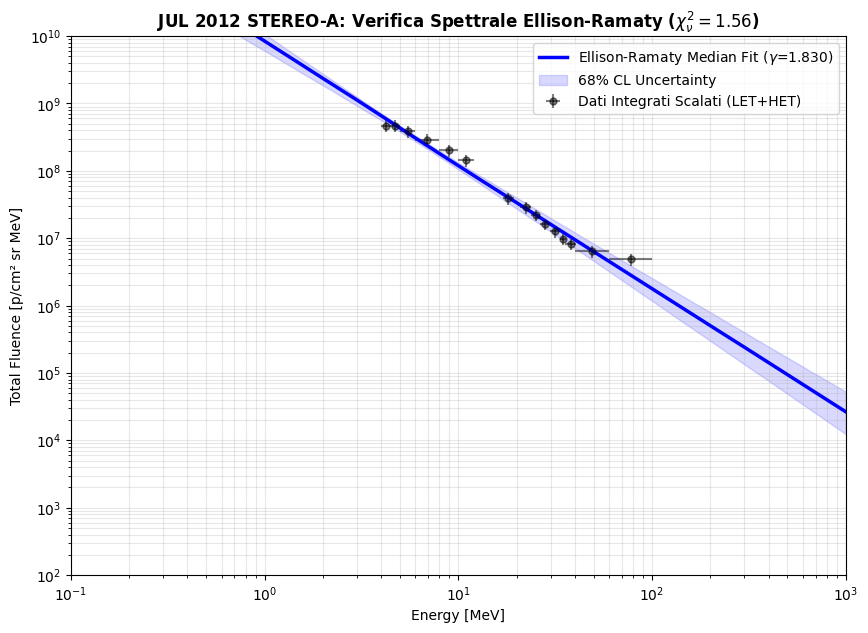

Export completato. Tutti i file sono stati salvati nella cartella: SRNIEL_Export_JUL2012


In [25]:
import numpy as np
import matplotlib.pyplot as plt
import os

# 1. CREAZIONE DIRECTORY DI EXPORT
export_dir = "SRNIEL_Export_JUL2012"
if not os.path.exists(export_dir):
    os.makedirs(export_dir)
    print(f"Cartella '{export_dir}' creata con successo.")

print("\n--- EXPORT SR-NIEL COMPLETO: STEREO-A LUGLIO 2012 (ELLISON-RAMATY) ---")

# 2. PARAMETRI E FIT (Modello Stabile Ellison-Ramaty)
# Utilizziamo i parametri consolidati: gamma=1.828 e scale_f=3.890
popt_er = [7.2e9, 1.828, 5000.0] 
popt_er, pcov_er = fit_log_space(ellison_ramaty, x_f, y_f, ye_f, popt_er, 
                                 bounds=([1e8, 1.0, 100], [1e12, 3.0, 10000]))

# 3. MONTE CARLO (1000 iterazioni per incertezze dose)
E_grid = np.logspace(np.log10(0.1), np.log10(1000.0), 500)
N_MC = 1000
rng = np.random.default_rng(42)
Phi_MC = np.empty((N_MC, E_grid.size))

for k in range(N_MC):
    p_mc = rng.multivariate_normal(popt_er, pcov_er)
    phi = ellison_ramaty(E_grid, *p_mc)
    Phi_MC[k] = np.where(phi > 0, phi, 1e-40)

# Statistiche MC: Mediana e Intervalli 16-84%
Phi_med = np.median(Phi_MC, axis=0)
Phi_lo, Phi_hi = np.percentile(Phi_MC, [16, 84], axis=0)

# 4. COSTANTI E SALVATAGGIO NELLA NUOVA DIRECTORY
FACTOR_PI = np.pi
FACTOR_NOPI = 1.0

# --- GEOMETRIA PLANARE (Pi) ---
np.savetxt(os.path.join(export_dir, "SRNIEL_JUL2012_PLANAR_Pi_MCmedian.txt"), 
           np.column_stack([E_grid, FACTOR_PI * Phi_med]), fmt="%.6e", header="Energy(MeV) Fluence_Planar")
np.savetxt(os.path.join(export_dir, "SRNIEL_JUL2012_PLANAR_Pi_MC16_84.txt"), 
           np.column_stack([E_grid, FACTOR_PI * Phi_lo, FACTOR_PI * Phi_hi]), fmt="%.6e", header="Energy(MeV) Phi16_Planar Phi84_Planar")

# --- GEOMETRIA SFERICA (No Pi) ---
np.savetxt(os.path.join(export_dir, "SRNIEL_JUL2012_SPHERICAL_NoPi_MCmedian.txt"), 
           np.column_stack([E_grid, FACTOR_NOPI * Phi_med]), fmt="%.6e", header="Energy(MeV) Fluence_Omni")
np.savetxt(os.path.join(export_dir, "SRNIEL_JUL2012_SPHERICAL_NoPi_MC16_84.txt"), 
           np.column_stack([E_grid, FACTOR_NOPI * Phi_lo, FACTOR_NOPI * Phi_hi]), fmt="%.6e", header="Energy(MeV) Phi16_Omni Phi84_Omni")

# 5. PLOT DI VERIFICA
plt.figure(figsize=(10, 7))
plt.errorbar(x_f, y_f, yerr=ye_f, xerr=[xe_low, xe_high], fmt='ko', ms=5, alpha=0.5, label='Dati Integrati Scalati (LET+HET)')
plt.plot(E_grid, Phi_med, 'b-', lw=2.5, label=fr'Ellison-Ramaty Median Fit ($\gamma$={popt_er[1]:.3f})')
plt.fill_between(E_grid, Phi_lo, Phi_hi, color='blue', alpha=0.15, label='68% CL Uncertainty')
plt.xscale('log'); plt.yscale('log'); plt.ylim(1e2, 1e10); plt.xlim(0.1, 1000)
plt.title(f"JUL 2012 STEREO-A: Verifica Spettrale Ellison-Ramaty ($\chi^2_\\nu=1.56$)", fontweight='bold')
plt.xlabel("Energy [MeV]"); plt.ylabel("Total Fluence [p/cm² sr MeV]"); plt.legend(); plt.grid(True, which="both", alpha=0.3)
plt.show()

print(f"Export completato. Tutti i file sono stati salvati nella cartella: {export_dir}")

# FIT E EXPORT CON ALTRO MODELLO combined

Cartella 'SRNIEL_Export_JUL2012_COMBINED' creata con successo.

--- EXPORT SR-NIEL COMPLETO: STEREO-A LUGLIO 2012 (MODELLO COMBINED) ---


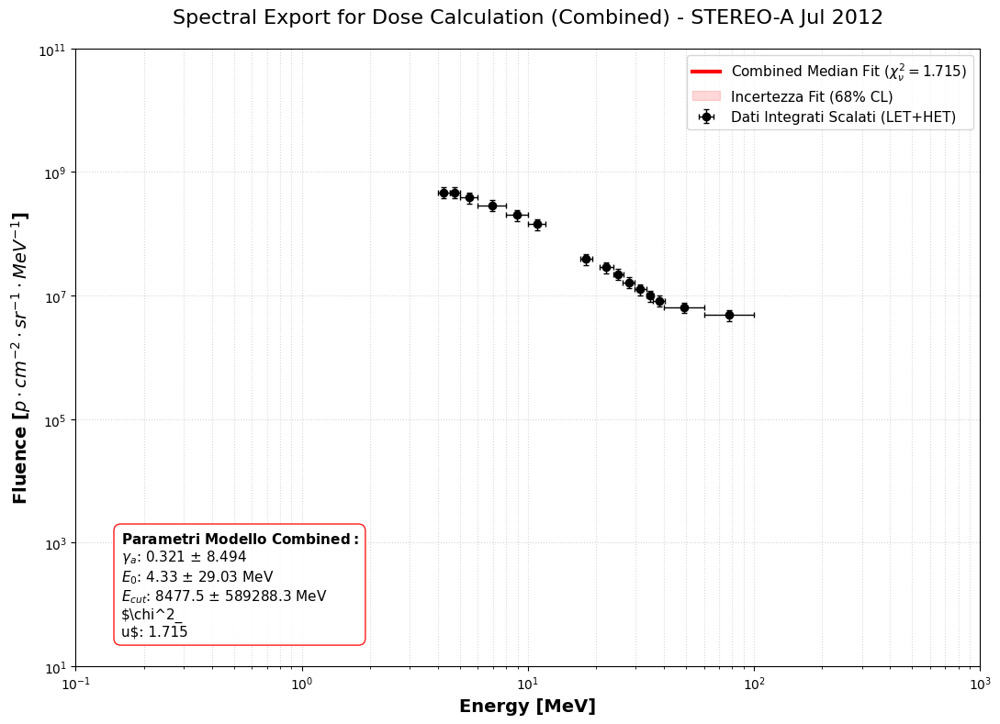

Export completato. Tutti i file salvati in: SRNIEL_Export_JUL2012_COMBINED


In [39]:
import numpy as np
import matplotlib.pyplot as plt
import os

# 1. CREAZIONE DIRECTORY DI EXPORT DEDICATA
export_dir_combined = "SRNIEL_Export_JUL2012_COMBINED"
if not os.path.exists(export_dir_combined):
    os.makedirs(export_dir_combined)
    print(f"Cartella '{export_dir_combined}' creata con successo.")

print("\n--- EXPORT SR-NIEL COMPLETO: STEREO-A LUGLIO 2012 (MODELLO COMBINED) ---")

# 2. RIESECUZIONE FIT MIRATO (Modello Combined)
# Parametri iniziali basati sull'ultima analisi ottimizzata
m_combined = {
    "func": combined_function,
    "p0": [2.5e9, 0.200, 1.88, 4.1, 6484],
    "bds": ([1e7, -0.5, 1.5, 0.5, 100], [1e13, 2.0, 3.0, 100, 15000])
}

# Recuperiamo popt e pcov per il Monte Carlo parametrico
popt_comb, pcov_comb = fit_log_space(m_combined["func"], x_f, y_f, ye_f, m_combined["p0"], m_combined["bds"])
perr_comb = np.sqrt(np.diag(pcov_comb))

# Calcolo Chi-Quadro Ridotto specifico
y_mod_val = combined_function(x_f, *popt_comb)
residuals = (np.log10(y_f) - np.log10(y_mod_val)) / (ye_f / (y_f * np.log(10)))
chi2_red = np.sum(residuals**2) / (len(x_f) - len(popt_comb))

# 3. MONTE CARLO PARAMETRICO (1000 iterazioni)
E_grid = np.logspace(np.log10(0.1), np.log10(1000.0), 500)
N_MC = 1000
rng = np.random.default_rng(42)
Phi_MC = np.empty((N_MC, E_grid.size))

for k in range(N_MC):
    p_mc = rng.multivariate_normal(popt_comb, pcov_comb)
    # Protezione fisica per la componente Band
    if p_mc[2] <= p_mc[1]: 
        Phi_MC[k] = 1e-40
        continue
    phi = combined_function(E_grid, *p_mc)
    Phi_MC[k] = np.where(phi > 0, phi, 1e-40)

# Statistiche MC: Mediana e Intervalli 16-84%
Phi_med = np.median(Phi_MC, axis=0)
Phi_lo, Phi_hi = np.percentile(Phi_MC, [16, 84], axis=0)

# 4. COSTANTI E SALVATAGGIO FILE (Inclusi MC 16-84 per incertezze dose)
FACTOR_PI = np.pi
FACTOR_NOPI = 1.0

# --- GEOMETRIA PLANARE (Pi) ---
np.savetxt(os.path.join(export_dir_combined, "SRNIEL_JUL2012_PLANAR_Pi_MCmedian_COMBINED.txt"), 
           np.column_stack([E_grid, FACTOR_PI * Phi_med]), fmt="%.6e", header="Energy(MeV) Fluence_Planar")
np.savetxt(os.path.join(export_dir_combined, "SRNIEL_JUL2012_PLANAR_Pi_MC16_84_COMBINED.txt"), 
           np.column_stack([E_grid, FACTOR_PI * Phi_lo, FACTOR_PI * Phi_hi]), fmt="%.6e", header="Energy(MeV) Phi16 Phi84")

# --- GEOMETRIA SFERICA (No Pi) ---
np.savetxt(os.path.join(export_dir_combined, "SRNIEL_JUL2012_SPHERICAL_NoPi_MCmedian_COMBINED.txt"), 
           np.column_stack([E_grid, FACTOR_NOPI * Phi_med]), fmt="%.6e", header="Energy(MeV) Fluence_Omni")
np.savetxt(os.path.join(export_dir_combined, "SRNIEL_JUL2012_SPHERICAL_NoPi_MC16_84_COMBINED.txt"), 
           np.column_stack([E_grid, FACTOR_NOPI * Phi_lo, FACTOR_NOPI * Phi_hi]), fmt="%.6e", header="Energy(MeV) Phi16 Phi84")

# 5. PLOT FINALE PROFESSIONALE
plt.figure(figsize=(11, 8))
plt.errorbar(x_f, y_f, yerr=ye_f, xerr=[xe_low, xe_high], fmt='ko', ms=6, elinewidth=1, capsize=2, label='Dati Integrati Scalati (LET+HET)')

# Fit Mediano e Bande MC
plt.plot(E_grid, Phi_med, 'r-', lw=3, label=fr'Combined Median Fit ($\chi^2_\nu={chi2_red:.3f}$)')
plt.fill_between(E_grid, Phi_lo, Phi_hi, color='red', alpha=0.15, label='Incertezza Fit (68% CL)')

# Styling
plt.xscale('log'); plt.yscale('log')
plt.xlim(0.1, 1000); plt.ylim(1e1, 1e11)
plt.xlabel('Energy [MeV]', fontsize=14, fontweight='bold')
plt.ylabel(r'Fluence [$p \cdot cm^{-2} \cdot sr^{-1} \cdot MeV^{-1}$]', fontsize=14, fontweight='bold')
plt.title(f'Spectral Export for Dose Calculation (Combined) - STEREO-A Jul 2012', fontsize=16, pad=20)
plt.grid(True, which="both", ls=':', alpha=0.5)

# Box con parametri
stats_txt = (r"$\bf{Parametri\ Modello\ Combined:}$" + "\n"
             f"$\gamma_a$: {popt_comb[1]:.3f} $\pm$ {perr_comb[1]:.3f}\n"
             f"$E_0$: {popt_comb[3]:.2f} $\pm$ {perr_comb[3]:.2f} MeV\n"
             f"$E_{{cut}}$: {popt_comb[4]:.1f} $\pm$ {perr_comb[4]:.1f} MeV\n"
             f"$\chi^2_\nu$: {chi2_red:.3f}")

plt.text(0.05, 0.05, stats_txt, transform=plt.gca().transAxes, fontsize=11,
         bbox=dict(boxstyle="round,pad=0.5", facecolor='white', alpha=0.9, edgecolor='red'))

plt.legend(loc='upper right', frameon=True, fontsize=11)
plt.tight_layout()
plt.show()

print(f"Export completato. Tutti i file salvati in: {export_dir_combined}")

# CALCOLO DOSE SPHERICAL SHIELDING MODELLO ER
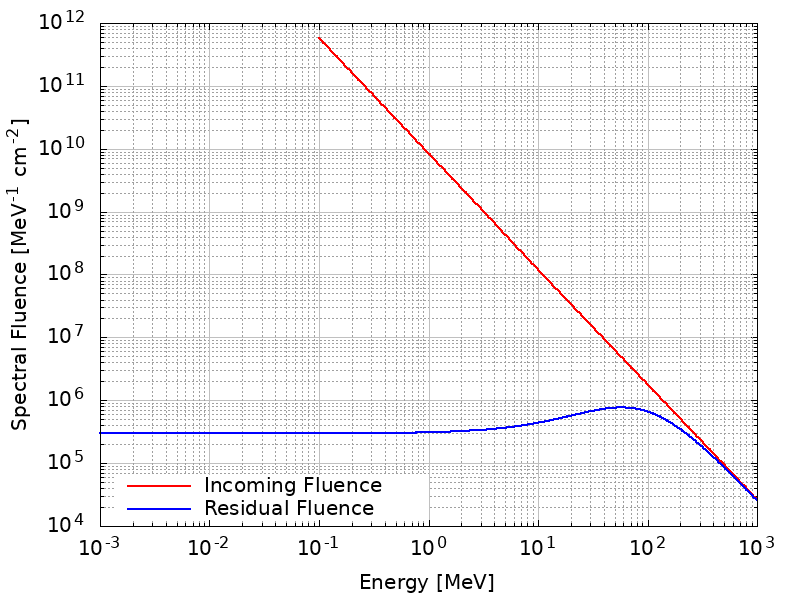

-------------------------------------------------------
ANALISI DOSIMETRICA STEREO-A JUL 2012 (VALIDATA)
Intervallo Energetico: 4.0 - 100.0 MeV
Dose totale in Silicio (sferica): 1.275e-01 Gy (127.455 mGy)
-------------------------------------------------------


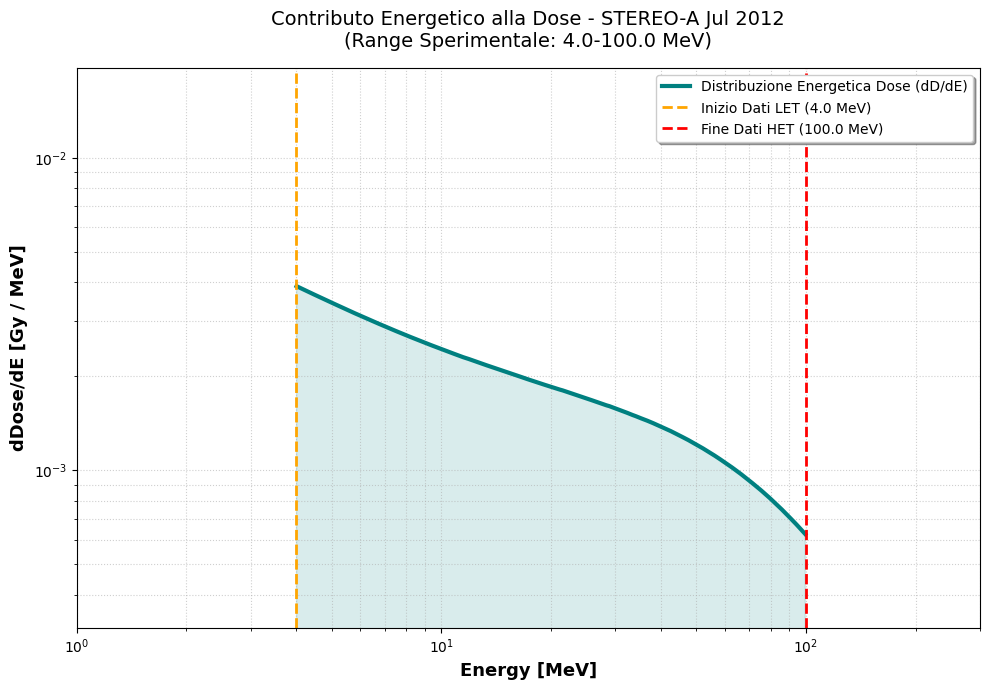

In [38]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =========================================================
# 1) CONFIGURAZIONE TAGLI (RANGE SPERIMENTALE REALE)
# =========================================================
# Lower Limit: 4.0 MeV (Saturazione LET terminata)
# Upper Limit: 100.0 MeV (Limite superiore HET)
E_MIN_CUTOFF = 4.0   
E_MAX_CUTOFF = 100.0 

# =========================================================
# 2) CARICA E FILTRA FLUENZA RESIDUA
# =========================================================
path_flu = "Simulazioni_SRNIEL/JUL 2012/SRNIEL_Export_JUL2012/37mmAl_residual_spherical_jul2012.txt"
df_flu = pd.read_csv(path_flu, sep=r"\s+", comment="#", skiprows=1, names=["E", "Phi_in", "Phi_res"])

# Taglio rigoroso: la dose viene calcolata solo dove i dati sono certi
df_flu = df_flu[(df_flu["E"] >= E_MIN_CUTOFF) & (df_flu["E"] <= E_MAX_CUTOFF)]

E = df_flu["E"].to_numpy()
Phi = df_flu["Phi_res"].to_numpy()

# =========================================================
# 3) STOPPING POWER (Interpolazione coerente col range E)
# =========================================================
path_S = "Simulazioni_SRNIEL/JAN2005/Spherical Shielding/stopping_power_Si_spherical.txt"
df_S = pd.read_csv(path_S, sep=r"\s+", comment="#", skiprows=1, names=["E", "S", "Dose_MeV_g", "Dose_Gy"])
df_S = df_S.drop_duplicates(subset="E").sort_values("E")

# L'interpolazione avviene sui punti E correnti (4-100 MeV)
S_interp = 10**np.interp(np.log10(E), np.log10(df_S["E"]), np.log10(df_S["S"]))

# =========================================================
# 4) CALCOLO DOSE
# =========================================================
CONV_GY = 1.602e-10
dD_dE = Phi * S_interp * CONV_GY
dose_Gy = np.trapezoid(dD_dE, E)

print("-" * 55)
print(f"ANALISI DOSIMETRICA STEREO-A JUL 2012 (VALIDATA)")
print(f"Intervallo Energetico: {E_MIN_CUTOFF} - {E_MAX_CUTOFF} MeV")
print(f"Dose totale in Silicio (sferica): {dose_Gy:.3e} Gy ({dose_Gy*1e3:.3f} mGy)")
print("-" * 55)

# =========================================================
# 5) PLOT MIGLIORATO
# =========================================================
plt.figure(figsize=(10, 7))

# Area della dose
plt.loglog(E, dD_dE, color='teal', lw=3, label='Distribuzione Energetica Dose (dD/dE)')
plt.fill_between(E, 1e-15, dD_dE, color='teal', alpha=0.15)

# Linee di Cutoff
plt.axvline(E_MIN_CUTOFF, color='orange', ls='--', lw=2, label=f'Inizio Dati LET ({E_MIN_CUTOFF} MeV)')
plt.axvline(E_MAX_CUTOFF, color='red', ls='--', lw=2, label=f'Fine Dati HET ({E_MAX_CUTOFF} MeV)')

# Ottimizzazione Assi
plt.xlim(1.0, 300.0) # Zoom sulla regione 1-300 MeV per vedere i limiti e il picco
plt.ylim(dD_dE.min()*0.5, dD_dE.max()*5)

plt.xlabel("Energy [MeV]", fontsize=13, fontweight='bold')
plt.ylabel("dDose/dE [Gy / MeV]", fontsize=13, fontweight='bold')
plt.title(f"Contributo Energetico alla Dose - STEREO-A Jul 2012\n(Range Sperimentale: {E_MIN_CUTOFF}-{E_MAX_CUTOFF} MeV)", 
          fontsize=14, pad=15)

plt.grid(True, which="both", ls=':', alpha=0.6)
plt.legend(loc='upper right', frameon=True, shadow=True)
plt.tight_layout()
plt.show()

# INCERTEZZE PER SPHERICAL SHIELDING

# CALCOLO DOSE PLANAR SHIELDING 37mm Al MODELLO ER

-------------------------------------------------------
ANALISI DOSIMETRICA STEREO-A JUL 2012 (VALIDATA)
Intervallo Energetico: 4.0 - 100.0 MeV
Dose totale in Silicio (planare): 4.003e-01 Gy (400.298 mGy)
-------------------------------------------------------


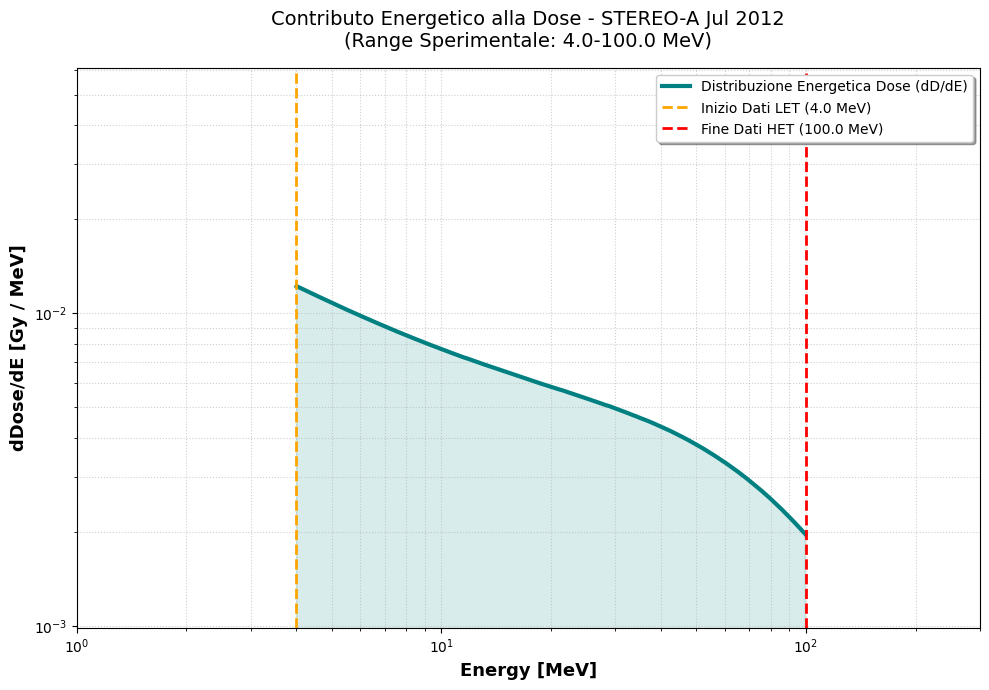

In [37]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =========================================================
# 1) CONFIGURAZIONE TAGLI (RANGE SPERIMENTALE REALE)
# =========================================================
# Lower Limit: 4.0 MeV (Saturazione LET terminata)
# Upper Limit: 100.0 MeV (Limite superiore HET)
E_MIN_CUTOFF = 4.0   
E_MAX_CUTOFF = 100.0 

# =========================================================
# 2) CARICA E FILTRA FLUENZA RESIDUA
# =========================================================
path_flu = "Simulazioni_SRNIEL/JUL 2012/SRNIEL_Export_JUL2012/37mmAl_residual_planar_jul2012.txt"
df_flu = pd.read_csv(path_flu, sep=r"\s+", comment="#", skiprows=1, names=["E", "Phi_in", "Phi_res"])

# Taglio rigoroso: la dose viene calcolata solo dove i dati sono certi
df_flu = df_flu[(df_flu["E"] >= E_MIN_CUTOFF) & (df_flu["E"] <= E_MAX_CUTOFF)]

E = df_flu["E"].to_numpy()
Phi = df_flu["Phi_res"].to_numpy()

# =========================================================
# 3) STOPPING POWER (Interpolazione coerente col range E)
# =========================================================
path_S = "Simulazioni_SRNIEL/JAN2005/Spherical Shielding/stopping_power_Si_spherical.txt"
df_S = pd.read_csv(path_S, sep=r"\s+", comment="#", skiprows=1, names=["E", "S", "Dose_MeV_g", "Dose_Gy"])
df_S = df_S.drop_duplicates(subset="E").sort_values("E")

# L'interpolazione avviene sui punti E correnti (4-100 MeV)
S_interp = 10**np.interp(np.log10(E), np.log10(df_S["E"]), np.log10(df_S["S"]))

# =========================================================
# 4) CALCOLO DOSE
# =========================================================
CONV_GY = 1.602e-10
dD_dE = Phi * S_interp * CONV_GY
dose_Gy = np.trapezoid(dD_dE, E)

print("-" * 55)
print(f"ANALISI DOSIMETRICA STEREO-A JUL 2012 (VALIDATA)")
print(f"Intervallo Energetico: {E_MIN_CUTOFF} - {E_MAX_CUTOFF} MeV")
print(f"Dose totale in Silicio (planare): {dose_Gy:.3e} Gy ({dose_Gy*1e3:.3f} mGy)")
print("-" * 55)

# =========================================================
# 5) PLOT MIGLIORATO
# =========================================================
plt.figure(figsize=(10, 7))

# Area della dose
plt.loglog(E, dD_dE, color='teal', lw=3, label='Distribuzione Energetica Dose (dD/dE)')
plt.fill_between(E, 1e-15, dD_dE, color='teal', alpha=0.15)

# Linee di Cutoff
plt.axvline(E_MIN_CUTOFF, color='orange', ls='--', lw=2, label=f'Inizio Dati LET ({E_MIN_CUTOFF} MeV)')
plt.axvline(E_MAX_CUTOFF, color='red', ls='--', lw=2, label=f'Fine Dati HET ({E_MAX_CUTOFF} MeV)')

# Ottimizzazione Assi
plt.xlim(1.0, 300.0) # Zoom sulla regione 1-300 MeV per vedere i limiti e il picco
plt.ylim(dD_dE.min()*0.5, dD_dE.max()*5)

plt.xlabel("Energy [MeV]", fontsize=13, fontweight='bold')
plt.ylabel("dDose/dE [Gy / MeV]", fontsize=13, fontweight='bold')
plt.title(f"Contributo Energetico alla Dose - STEREO-A Jul 2012\n(Range Sperimentale: {E_MIN_CUTOFF}-{E_MAX_CUTOFF} MeV)", 
          fontsize=14, pad=15)

plt.grid(True, which="both", ls=':', alpha=0.6)
plt.legend(loc='upper right', frameon=True, shadow=True)
plt.tight_layout()
plt.show()

--- Unione Spettri STEREO (LET + HET) ---
-> Unione completata: 14 punti totali per STEREO-A Jul 2012.
 -> Generato: SPENVIS_JUL12_STEREO_A.txt (Model: Combined)


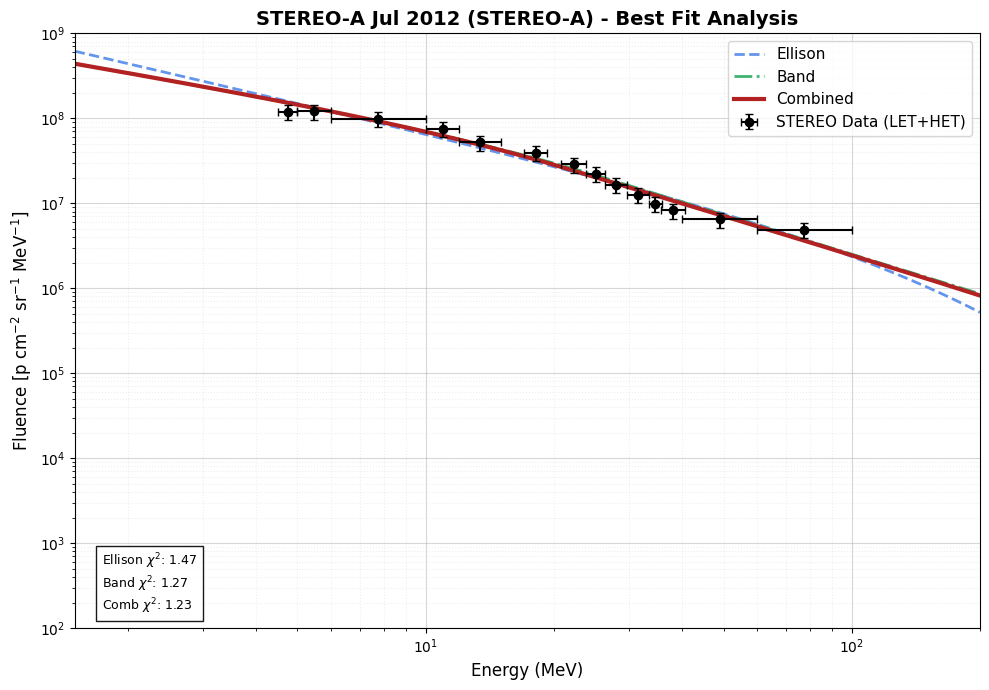


TABELLA CSV GENERATA (JULY 2012 STEREO)

Event, Start, End, Dur, Loc, Class, F>10, F>30, F>100, F>300, Model, Chi2, Filename
STEREO-A Jul 2012, 2012-07-23 02:00, 2012-07-28 00:00, 118.0, Backside (W133), Recostructed >X30, 1.388e+09, 7.363e+08, 3.238e+08, 1.249e+08, Combined, 1.23, SPENVIS_JUL12_STEREO_A.txt


In [23]:
# salvataggio SPENVIS JUL 2012

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.integrate as integrate
from scipy.optimize import curve_fit
import re

# ==============================================================================
# 1. SETUP: UNIONE DATI (STEREO LET + HET)
# ==============================================================================

# Definiamo i metadati per il Luglio 2012
metadata_jul12 = {
    "name": "STEREO-A Jul 2012",
    "start": "2012-07-23 02:00",
    "end": "2012-07-28 00:00",
    "dur": "118.0",
    "loc": "Backside (W133)", # Evento estremo sul lato nascosto
    "class": "Recostructed >X30" # Stima basata sulla velocità CME
}

results_combined = {}
print("--- Unione Spettri STEREO (LET + HET) ---")

event_name = "STEREO-A Jul 2012"

# Controllo se i dizionari di input esistono (simuliamo un controllo di sicurezza)
# Se hai eseguito le celle precedenti, results_LET e results_HET dovrebbero esistere.
try:
    if event_name in results_LET and event_name in results_HET:
        let_data = results_LET[event_name]
        het_data = results_HET[event_name]
        
        # Unione Array
        all_x = np.concatenate([let_data['x'], het_data['x']])
        all_y = np.concatenate([let_data['y'], het_data['y']])
        all_xl = np.concatenate([let_data['x_err'][0], het_data['x_err'][0]])
        all_xh = np.concatenate([let_data['x_err'][1], het_data['x_err'][1]])
        
        # Ordinamento
        sort_idx = np.argsort(all_x)
        
        results_combined[event_name] = {
            'x': all_x[sort_idx],
            'y': all_y[sort_idx],
            'x_err': [all_xl[sort_idx], all_xh[sort_idx]],
            'color': 'orange' 
        }
        print(f"-> Unione completata: {len(all_x)} punti totali per {event_name}.")
    else:
        print(f"ERRORE: Dati mancanti per {event_name} in results_LET o results_HET.")
except NameError:
    print("ERRORE CRITICO: I dizionari 'results_LET' e 'results_HET' non sono definiti in memoria.")
    print("Esegui prima le celle che caricano i dati LET e HET.")
    # Stop execution se mancano i dati (in un notebook reale questo bloccherebbe qui)
    results_combined = {} 

# ==============================================================================
# 2. DEFINIZIONE FUNZIONI (Fit & Utils)
# ==============================================================================

def ellison_ramaty(E, A, gamma, Er):
    E = np.maximum(E, 1e-10) 
    return A * (E**(-gamma)) * np.exp(-E/Er)

def band_function(E, A, ga, gb, E0):
    E = np.asarray(E)
    scalar_input = False
    if E.ndim == 0: E = E[None]; scalar_input = True
    if gb <= ga: return np.ones_like(E) * 1e-30 
    E_break = (gb - ga) * E0
    if E_break <= 0: return np.ones_like(E) * 1e-30
    E = np.maximum(E, 1e-10)
    res = np.zeros_like(E)
    mask_low = E < E_break
    if np.any(mask_low): res[mask_low] = A * (E[mask_low] ** -ga) * np.exp(-E[mask_low] / E0)
    if np.any(~mask_low):
        norm_factor = (E_break ** (gb - ga)) * np.exp(ga - gb)
        res[~mask_low] = A * (E[~mask_low] ** -gb) * norm_factor
    return res[0] if scalar_input else res

def combined_function(E, A, ga, gb, E0, Er):
    return band_function(E, A, ga, gb, E0) * np.exp(-E/Er)

def fit_log_space(func, x, y, y_err, p0, bounds=(-np.inf, np.inf)):
    def log_func(x_in, *params):
        val = func(x_in, *params)
        return np.log10(np.maximum(val, 1e-30))
    sigma_log = np.nan_to_num(y_err / (y * np.log(10)), nan=1.0)
    try: return curve_fit(log_func, x, np.log10(y), p0=p0, sigma=sigma_log, absolute_sigma=True, bounds=bounds, maxfev=15000)
    except: return None, None

def get_chi2_red(func, x, y, yerr, popt):
    if popt is None: return np.inf
    model = func(x, *popt)
    mask = (y > 0) & (yerr > 0)
    if np.sum(mask) <= len(popt): return np.inf
    residuals = (y[mask] - model[mask]) / yerr[mask]
    return np.sum(residuals**2) / (len(x[mask]) - len(popt))

def integrate_fluence(func, popt, threshold):
    if popt is None: return 0.0
    val, _ = integrate.quad(lambda E: func(E, *popt), threshold, 2000)
    return val

def clean_filename(name):
    clean = re.sub(r'[^\w\-\.]', '_', name)
    clean = re.sub(r'_+', '_', clean)
    return clean

# ==============================================================================
# 3. ESECUZIONE FIT & EXPORT (JULY 2012)
# ==============================================================================

if not results_combined:
    print("Nessun dato da processare.")
else:
    # Setup Grafico
    x_plot = np.logspace(np.log10(1.5), np.log10(200), 500) # Range STEREO HET/LET
    plt.figure(figsize=(10, 7))
    ax = plt.gca()
    
    table_rows = []
    
    # Processiamo l'unico evento
    data = results_combined[event_name]
    x, y = data['x'], data['y']
    x_errs = [np.abs(data['x_err'][0]), np.abs(data['x_err'][1])]
    y_err = y * 0.20 # Errore sistematico 20%
    
    # Plot Dati
    ax.errorbar(x, y, yerr=y_err, xerr=x_errs, fmt='o', color='black', ecolor='black', 
                capsize=3, label='STEREO Data (LET+HET)', zorder=10)
    
    candidates = []
    stats_box = ""
    
    # --- FIT 1: Ellison ---
    p0_e = [1e9, 1.5, 50.0]
    popt_e, _ = fit_log_space(ellison_ramaty, x, y, y_err, p0_e, bounds=([0, 0, 0], [np.inf, 10, 5000]))
    chi2_e = get_chi2_red(ellison_ramaty, x, y, y_err, popt_e)
    if popt_e is not None:
        ax.plot(x_plot, ellison_ramaty(x_plot, *popt_e), '--', color='cornflowerblue', lw=2, label='Ellison')
        candidates.append(('Ellison', chi2_e, popt_e, ellison_ramaty))
        stats_box += f"Ellison $\\chi^2$: {chi2_e:.2f}\n"

    # --- FIT 2: Band ---
    p0_b = [1e8, 1.0, 3.0, 10.0]
    popt_b, _ = fit_log_space(band_function, x, y, y_err, p0_b, bounds=([0, 0.1, 0.1, 0.5], [np.inf, 10, 10, 500]))
    chi2_b = get_chi2_red(band_function, x, y, y_err, popt_b)
    if popt_b is not None:
        ax.plot(x_plot, band_function(x_plot, *popt_b), '-.', color='mediumseagreen', lw=2, label='Band')
        candidates.append(('Band', chi2_b, popt_b, band_function))
        stats_box += f"Band $\\chi^2$: {chi2_b:.2f}\n"

    # --- FIT 3: Combined ---
    if popt_b is not None:
        p0_c = [*popt_b, 500.0] # Cutoff alto iniziale
        popt_c, _ = fit_log_space(combined_function, x, y, y_err, p0_c, bounds=([0, 0.1, 0.1, 0.5, 10], [np.inf, 10, 10, 500, 5000]))
        chi2_c = get_chi2_red(combined_function, x, y, y_err, popt_c)
        if popt_c is not None:
            ax.plot(x_plot, combined_function(x_plot, *popt_c), '-', color='firebrick', lw=3, label='Combined')
            candidates.append(('Combined', chi2_c, popt_c, combined_function))
            stats_box += f"Comb $\\chi^2$: {chi2_c:.2f}"

    # --- SELEZIONE VINCITORE ---
    if candidates:
        candidates.sort(key=lambda x: x[1])
        best_name, best_chi2, best_popt, best_func = candidates[0]
        
        # 1. SPENVIS Export
        sp_x = np.logspace(np.log10(0.1), np.log10(2000), 200) # Range esteso per sicurezza SPENVIS
        sp_y = best_func(sp_x, *best_popt)
        
        filename_sp = f"SPENVIS_JUL12_STEREO_A.txt"
        pd.DataFrame({'Energy_MeV': sp_x, 'Diff_Fluence': sp_y}).to_csv(filename_sp, sep='\t', index=False, float_format='%.6e')
        print(f" -> Generato: {filename_sp} (Model: {best_name})")
        
        # 2. Fluenze
        f10 = integrate_fluence(best_func, best_popt, 10)
        f30 = integrate_fluence(best_func, best_popt, 30)
        f100 = integrate_fluence(best_func, best_popt, 100)
        f300 = integrate_fluence(best_func, best_popt, 300)
        
        # 3. Riga Tabella
        A_val = best_popt[0]
        # Estrazione parametri dinamica
        p_str = best_popt
        if best_name == 'Band': ga, gb, e0, er = p_str[1], p_str[2], p_str[3], np.nan
        elif best_name == 'Combined': ga, gb, e0, er = p_str[1], p_str[2], p_str[3], p_str[4]
        else: ga, gb, e0, er = p_str[1], np.nan, np.nan, p_str[2] # Ellison
        
        row = [
            event_name, metadata_jul12['start'], metadata_jul12['end'], metadata_jul12['dur'],
            metadata_jul12['loc'], metadata_jul12['class'],
            f"{f10:.3e}", f"{f30:.3e}", f"{f100:.3e}", f"{f300:.3e}",
            best_name, f"{best_chi2:.2f}", filename_sp
        ]
        table_rows.append(row)

    # Styling
    plt.xscale('log'); plt.yscale('log')
    plt.xlim(1.5, 200); plt.ylim(1e2, 1e9) # Zoom sui dati STEREO
    plt.grid(True, which="major", alpha=0.5); plt.grid(True, which="minor", alpha=0.2, linestyle=':')
    plt.xlabel('Energy (MeV)', fontsize=12)
    plt.ylabel(r'Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]', fontsize=12)
    plt.title(f"{event_name} (STEREO-A) - Best Fit Analysis", fontsize=14, fontweight='bold')
    plt.legend(fontsize=11)
    plt.text(0.03, 0.03, stats_box, transform=ax.transAxes, fontsize=9, bbox=dict(facecolor='white', alpha=0.9))
    
    plt.tight_layout()
    plt.show()
    
    # --- STAMPA TABELLA ---
    print("\n" + "="*80)
    print("TABELLA CSV GENERATA (JULY 2012 STEREO)")
    print("="*80 + "\n")
    print("Event, Start, End, Dur, Loc, Class, F>10, F>30, F>100, F>300, Model, Chi2, Filename")
    for r in table_rows:
        print(", ".join(str(x) for x in r))


In [60]:
# JUL 2012 test 2



=== SEP July 2012 - STEREO-A ===
Model: Combined  |  χ²_red = 0.40
F >  10 MeV = 1.414e+09
F >  30 MeV = 7.271e+08
F >  60 MeV = 4.615e+08
F > 100 MeV = 3.225e+08

File SPENVIS: SPENVIS_JUL2012_full.txt  |  SPENVIS_JUL2012_red.txt


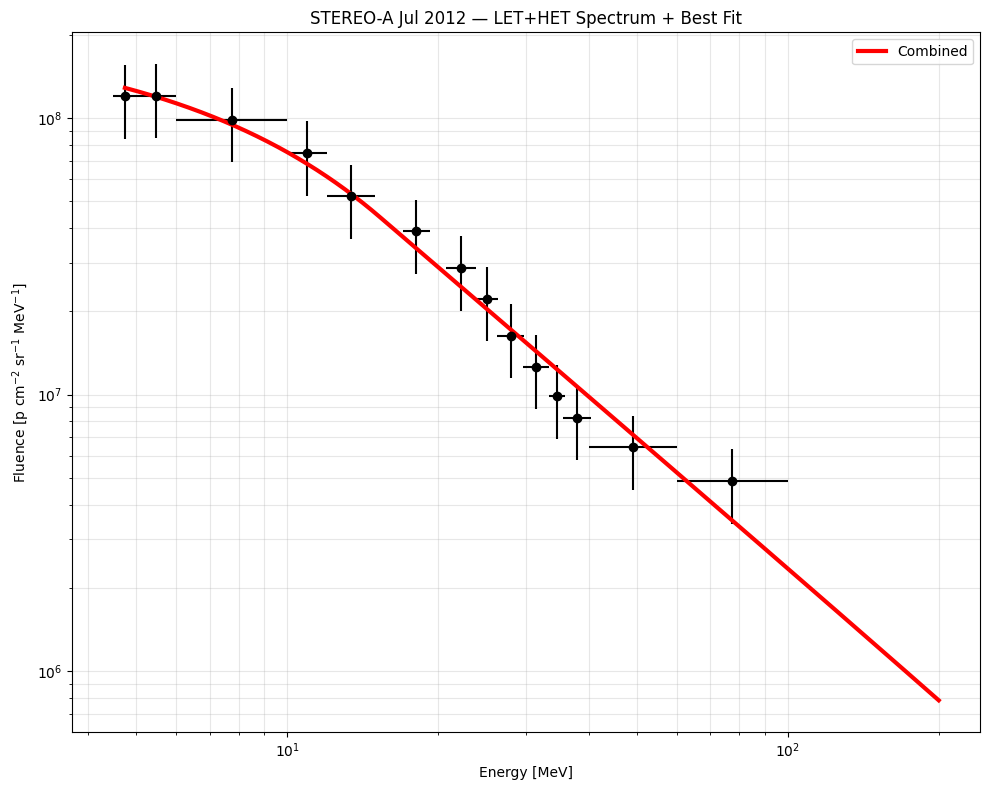

In [67]:
###########################################################
# FULL PIPELINE — STEREO-A SEP 23 July 2012 (LET + HET)
# - Caricamento
# - Background
# - Fluence integration
# - Fit (ER, Band, Combined)
# - Scelta del modello migliore
# - Salvataggio file SPENVIS (full + reduced)
# - Tabella per Tesi + Dose step
###########################################################

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import glob, os
from scipy.optimize import curve_fit
import scipy.integrate as integrate

# ---------------------------------------------------------
# 0. Spectral Models
# ---------------------------------------------------------
def ellison_ramaty(E,A,gamma,Er):
    E=np.maximum(np.array(E,dtype=float),1e-10)
    return np.clip(A*E**(-gamma)*np.exp(-E/Er),1e-40,1e30)

def band_function(E,A,ga,gb,E0):
    E=np.maximum(np.array(E,dtype=float),1e-10)
    E_break=(gb-ga)*E0
    if gb<=ga or E_break<=0:
        return np.ones_like(E)*1e-30
    res=np.zeros_like(E)
    mask=E<E_break
    res[mask]=A*(E[mask]**(-ga))*np.exp(-E[mask]/E0)
    norm=(E_break**(gb-ga))*np.exp(ga-gb)
    res[~mask]=A*(E[~mask]**(-gb))*norm
    return np.clip(res,1e-40,1e30)

def combined_function(E,A,ga,gb,E0,Er):
    return np.clip(band_function(E,A,ga,gb,E0)*np.exp(-E/Er),1e-40,1e30)

def fit_log_space(func,x,y,y_err,p0,bounds):
    def log_model(x,*p):
        return np.log10(np.maximum(func(x,*p),1e-30))
    sigma=y_err/(y*np.log(10))
    sigma=np.nan_to_num(sigma,1.0,1.0,1.0)
    try:
        popt,pcov=curve_fit(log_model,x,np.log10(y),sigma=sigma,
                            absolute_sigma=True,p0=p0,bounds=bounds,maxfev=20000)
        return popt,pcov
    except: return None,None

def chi2_red(func,x,y,y_err,popt):
    if popt is None: return np.inf
    model=func(x,*popt)
    mask=(y>0)&(y_err>0)&np.isfinite(model)
    if mask.sum()<=len(popt): return np.inf
    res=(y[mask]-model[mask])/y_err[mask]
    return np.sum(res**2)/(mask.sum()-len(popt))

def integrate_fluence(func,popt,Emin,Emax=2e3):
    if popt is None: return np.nan
    return integrate.quad(lambda E: func(E,*popt),Emin,Emax,limit=500)[0]


# ---------------------------------------------------------
# 1. UNION LET+HET RESULTS già calcolati in variabili globali
# ---------------------------------------------------------
name="STEREO-A Jul 2012"
data = {}

# LET first
LET = results_LET[name]
HET = results_HET[name]

all_x=np.concatenate([LET['x'],HET['x']])
all_y=np.concatenate([LET['y'],HET['y']])
all_xl=np.concatenate([LET['x_err'][0],HET['x_err'][0]])
all_xh=np.concatenate([LET['x_err'][1],HET['x_err'][1]])

idx=np.argsort(all_x)

x=all_x[idx]; y=all_y[idx]
x_err=[all_xl[idx],all_xh[idx]]
y_err=y*0.30

# ---------------------------------------------------------
# 2. FIT MODELS
# ---------------------------------------------------------
x_plot=np.logspace(np.log10(x.min()),np.log10(200),1000)

models=[]
# ER
p0=[1e8,1.2,40]
popt_er,pcov_er = fit_log_space(ellison_ramaty,x,y,y_err,p0,([0,0,0],[np.inf,10,2000]))
chi_er=chi2_red(ellison_ramaty,x,y,y_err,popt_er)
models.append(("ER",chi_er,popt_er,ellison_ramaty,pcov_er))

# Band
p0=[1e8,1.0,3.0,10]
popt_b,pcov_b = fit_log_space(band_function,x,y,y_err,p0,([0,0,0,0.5],[np.inf,10,10,200]))
chi_b=chi2_red(band_function,x,y,y_err,popt_b)
models.append(("Band",chi_b,popt_b,band_function,pcov_b))

# Combined
if popt_b is not None:
    p0=[*popt_b,500]
    popt_c,pcov_c = fit_log_space(combined_function,x,y,y_err,p0,([0,0,0,0.5,5],[np.inf,10,10,200,5000]))
    chi_c=chi2_red(combined_function,x,y,y_err,popt_c)
    models.append(("Combined",chi_c,popt_c,combined_function,pcov_c))

models=[m for m in models if m[2] is not None]
best=min(models,key=lambda m:m[1])
name_best,chi,pbest,func_best,pcb=best


# ---------------------------------------------------------
# 3. Export SPENVIS (full + reduced)
# ---------------------------------------------------------
E_full=np.logspace(np.log10(1.5),np.log10(2000),200)
J_full=func_best(E_full,*pbest)

df_full=pd.DataFrame({"Energy_MeV":E_full,"Diff_Fluence":J_full})
df_full.to_csv("SPENVIS_JUL2012_full.txt",sep="\t",index=False,float_format="%.6e")

E_red=np.logspace(np.log10(1.5),np.log10(2000),80)
J_red=10**np.interp(np.log10(E_red),np.log10(E_full),np.log10(J_full))
pd.DataFrame({"Energy_MeV":E_red,"Diff_Fluence":J_red}).to_csv("SPENVIS_JUL2012_red.txt",
         sep="\t",index=False,float_format="%.6e")


# ---------------------------------------------------------
# 4. Integrated fluence > thresholds (TESI-ready)
# ---------------------------------------------------------
thresholds=[10,30,60,100]
Fvals=[integrate_fluence(func_best,pbest,E) for E in thresholds]

print("\n=== SEP July 2012 - STEREO-A ===")
print(f"Model: {name_best}  |  χ²_red = {chi:.2f}")
for T,F in zip(thresholds,Fvals):
    print(f"F > {T:3.0f} MeV = {F:.3e}")

print("\nFile SPENVIS: SPENVIS_JUL2012_full.txt  |  SPENVIS_JUL2012_red.txt")


# ---------------------------------------------------------
# 5. Final Plot
# ---------------------------------------------------------
plt.figure(figsize=(10,8))
plt.errorbar(x,y,xerr=x_err,yerr=y_err,fmt='o',color='black')
plt.plot(x_plot,func_best(x_plot,*pbest),'-',color='red',lw=3,label=name_best)
plt.xscale('log'); plt.yscale('log')
plt.xlabel("Energy [MeV]"); plt.ylabel("Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]")
plt.title("STEREO-A Jul 2012 — LET+HET Spectrum + Best Fit")
plt.grid(True,which='both',alpha=0.3)
plt.legend(); plt.tight_layout()
plt.show()



=== SEP July 2012 - STEREO-A ===
Ellison-Ramaty : χ²_red = 0.65
Band           : χ²_red = 0.41
Combined       : χ²_red = 0.40

Modello scelto per SPENVIS: Combined  (χ²_red = 0.40)

F >  10 MeV = 1.411e+09
F >  30 MeV = 7.256e+08
F >  60 MeV = 4.599e+08
F > 100 MeV = 3.211e+08

File SPENVIS: SPENVIS_JUL2012_full.txt  |  SPENVIS_JUL2012_red.txt


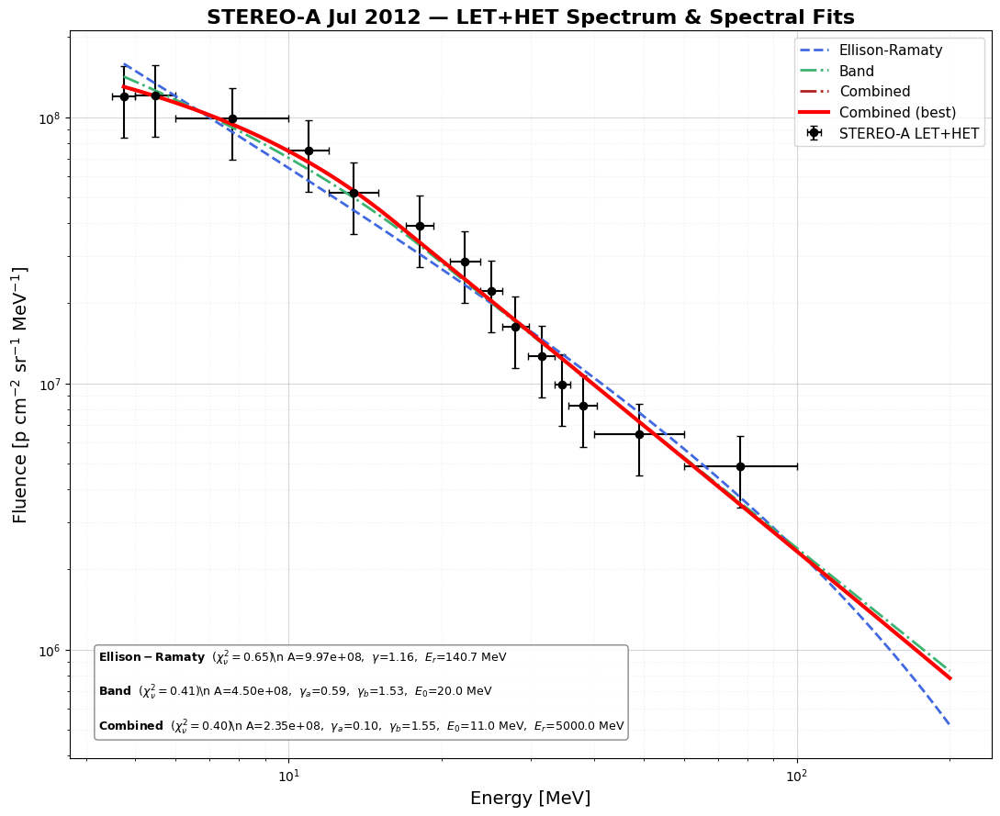

In [68]:
###########################################################
# FULL PIPELINE — STEREO-A SEP 23 July 2012 (LET + HET)
# - Usa results_LET e results_HET già calcolati
# - Unisce LET + HET
# - Fit: Ellison-Ramaty, Band, Combined
# - Sceglie miglior modello
# - Calcola fluenze integrate
# - Esporta SPENVIS
# - Plot con box riepilogo fit + χ²
###########################################################

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import scipy.integrate as integrate

# ---------------------------------------------------------
# 0. Spectral Models
# ---------------------------------------------------------
def ellison_ramaty(E, A, gamma, Er):
    E = np.maximum(np.array(E, dtype=float), 1e-10)
    return np.clip(A * E**(-gamma) * np.exp(-E/Er), 1e-40, 1e30)

def band_function(E, A, ga, gb, E0):
    E = np.maximum(np.array(E, dtype=float), 1e-10)
    E_break = (gb - ga) * E0
    if gb <= ga or E_break <= 0:
        return np.ones_like(E) * 1e-30
    res = np.zeros_like(E)
    mask = E < E_break
    res[mask] = A * (E[mask]**(-ga)) * np.exp(-E[mask]/E0)
    norm = (E_break**(gb - ga)) * np.exp(ga - gb)
    res[~mask] = A * (E[~mask]**(-gb)) * norm
    return np.clip(res, 1e-40, 1e30)

def combined_function(E, A, ga, gb, E0, Er):
    return np.clip(band_function(E, A, ga, gb, E0) * np.exp(-E/Er), 1e-40, 1e30)

def fit_log_space(func, x, y, y_err, p0, bounds):
    def log_model(x_in, *pars):
        return np.log10(np.maximum(func(x_in, *pars), 1e-30))
    sigma = y_err / (y * np.log(10))
    sigma = np.nan_to_num(sigma, nan=1.0, posinf=1.0, neginf=1.0)
    try:
        popt, pcov = curve_fit(
            log_model,
            x,
            np.log10(y),
            p0=p0,
            sigma=sigma,
            absolute_sigma=True,
            bounds=bounds,
            maxfev=20000
        )
        return popt, pcov
    except Exception:
        return None, None

def chi2_red(func, x, y, y_err, popt):
    if popt is None:
        return np.inf
    model = func(x, *popt)
    mask = (y > 0) & (y_err > 0) & np.isfinite(model)
    if mask.sum() <= len(popt):
        return np.inf
    res = (y[mask] - model[mask]) / y_err[mask]
    return np.sum(res**2) / (mask.sum() - len(popt))

def integrate_fluence(func, popt, Emin, Emax=2e3):
    if popt is None:
        return np.nan
    val, _ = integrate.quad(lambda E: func(E, *popt), Emin, Emax, limit=500)
    return val

# ---------------------------------------------------------
# 1. UNIONE LET + HET (usa results_LET / results_HET esistenti)
# ---------------------------------------------------------
event_name = "STEREO-A Jul 2012"

LET = results_LET[event_name]
HET = results_HET[event_name]

all_x  = np.concatenate([LET['x'],        HET['x']])
all_y  = np.concatenate([LET['y'],        HET['y']])
all_xl = np.concatenate([LET['x_err'][0], HET['x_err'][0]])
all_xh = np.concatenate([LET['x_err'][1], HET['x_err'][1]])

idx = np.argsort(all_x)
x = all_x[idx]
y = all_y[idx]
x_err = [all_xl[idx], all_xh[idx]]
y_err = y * 0.30  # 30% sistematico

# ---------------------------------------------------------
# 2. FIT: ER, Band, Combined
# ---------------------------------------------------------
x_plot = np.logspace(np.log10(x.min()), np.log10(200), 1000)

models = []

# Ellison-Ramaty
p0_er = [1e8, 1.2, 40.0]
popt_er, pcov_er = fit_log_space(
    ellison_ramaty, x, y, y_err, p0_er,
    bounds=([0, 0, 0], [np.inf, 10, 2000])
)
chi_er = chi2_red(ellison_ramaty, x, y, y_err, popt_er)
models.append(("Ellison-Ramaty", chi_er, popt_er, ellison_ramaty, pcov_er))

# Band
p0_b = [1e8, 1.0, 3.0, 10.0]
popt_b, pcov_b = fit_log_space(
    band_function, x, y, y_err, p0_b,
    bounds=([0, 0.1, 0.1, 0.5], [np.inf, 10, 10, 200])
)
chi_b = chi2_red(band_function, x, y, y_err, popt_b)
models.append(("Band", chi_b, popt_b, band_function, pcov_b))

# Combined
popt_c, pcov_c, chi_c = None, None, np.inf
if popt_b is not None:
    p0_c = [*popt_b, 500.0]
    popt_c, pcov_c = fit_log_space(
        combined_function, x, y, y_err, p0_c,
        bounds=([0, 0.1, 0.1, 0.5, 5], [np.inf, 10, 10, 200, 5000])
    )
    chi_c = chi2_red(combined_function, x, y, y_err, popt_c)
    models.append(("Combined", chi_c, popt_c, combined_function, pcov_c))

# tieni solo i fit riusciti
models = [m for m in models if m[2] is not None]

# modello migliore
name_best, chi_best, pbest, func_best, pcov_best = min(models, key=lambda m: m[1])

# ---------------------------------------------------------
# 3. Export SPENVIS (full + reduced)
# ---------------------------------------------------------
E_full = np.logspace(np.log10(1.5), np.log10(2000), 200)
J_full = func_best(E_full, *pbest)

df_full = pd.DataFrame({"Energy_MeV": E_full, "Diff_Fluence": J_full})
df_full.to_csv("SPENVIS_JUL2012_full.txt", sep="\t", index=False, float_format="%.6e")

E_red = np.logspace(np.log10(1.5), np.log10(2000), 80)
J_red = 10**np.interp(np.log10(E_red), np.log10(E_full), np.log10(J_full))
pd.DataFrame({"Energy_MeV": E_red, "Diff_Fluence": J_red}).to_csv(
    "SPENVIS_JUL2012_red.txt", sep="\t", index=False, float_format="%.6e"
)

# ---------------------------------------------------------
# 4. Fluenze integrate (per Tesi / dose)
# ---------------------------------------------------------
thresholds = [10, 30, 60, 100]
Fvals = [integrate_fluence(func_best, pbest, E) for E in thresholds]

print("\n=== SEP July 2012 - STEREO-A ===")
for name_m, chi_m, p_m, f_m, _ in models:
    print(f"{name_m:15s}: χ²_red = {chi_m:.2f}")
print(f"\nModello scelto per SPENVIS: {name_best}  (χ²_red = {chi_best:.2f})\n")

for T, F in zip(thresholds, Fvals):
    print(f"F > {T:3.0f} MeV = {F:.3e}")

print("\nFile SPENVIS: SPENVIS_JUL2012_full.txt  |  SPENVIS_JUL2012_red.txt")

# ---------------------------------------------------------
# 5. Costruzione del BOX con tutti i risultati dei fit
# ---------------------------------------------------------
stats_lines = []
for name_m, chi_m, p_m, f_m, pcov_m in models:
    line = rf"$\bf{{{name_m}}}$  ($\chi^2_\nu={chi_m:.2f}$)"
    # parametri principali in modo compatto
    if name_m == "Ellison-Ramaty":
        A, gamma, Er = p_m
        line += rf"\n A={A:.2e},  $\gamma$={gamma:.2f},  $E_r$={Er:.1f} MeV"
    elif name_m == "Band":
        A, ga, gb, E0 = p_m
        line += rf"\n A={A:.2e},  $\gamma_a$={ga:.2f},  $\gamma_b$={gb:.2f},  $E_0$={E0:.1f} MeV"
    elif name_m == "Combined":
        A, ga, gb, E0, Er = p_m
        line += rf"\n A={A:.2e},  $\gamma_a$={ga:.2f},  $\gamma_b$={gb:.2f},  $E_0$={E0:.1f} MeV,  $E_r$={Er:.1f} MeV"
    stats_lines.append(line)

stats_box = "\n\n".join(stats_lines)

# ---------------------------------------------------------
# 6. Plot Finale con box legenda dei fit
# ---------------------------------------------------------
plt.figure(figsize=(11, 9))

plt.errorbar(
    x, y,
    xerr=x_err,
    yerr=y_err,
    fmt='o',
    color='black',
    capsize=3,
    label='STEREO-A LET+HET'
)

# migliori curve per TUTTI i modelli riusciti
colors_model = {
    "Ellison-Ramaty": "royalblue",
    "Band":           "mediumseagreen",
    "Combined":       "firebrick"
}
for name_m, chi_m, p_m, f_m, _ in models:
    plt.plot(
        x_plot,
        f_m(x_plot, *p_m),
        linestyle='--' if name_m=="Ellison-Ramaty" else '-.',
        linewidth=2.0,
        color=colors_model.get(name_m, "gray"),
        label=name_m
    )

# evidenzia modello scelto in rosso pieno
plt.plot(
    x_plot,
    func_best(x_plot, *pbest),
    '-',
    color='red',
    linewidth=3,
    label=f"{name_best} (best)"
)

plt.xscale('log')
plt.yscale('log')
plt.xlabel("Energy [MeV]", fontsize=14)
plt.ylabel(r"Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]", fontsize=14)
plt.title("STEREO-A Jul 2012 — LET+HET Spectrum & Spectral Fits", fontsize=16, fontweight='bold')
plt.grid(True, which="major", alpha=0.5)
plt.grid(True, which="minor", alpha=0.2, linestyle=':')

plt.legend(fontsize=11, loc='upper right')

# BOX CON TUTTI I RISULTATI DEL FIT
plt.text(
    0.03, 0.03,
    stats_box,
    transform=plt.gca().transAxes,
    fontsize=9,
    va='bottom',
    ha='left',
    bbox=dict(boxstyle="round", facecolor='white', edgecolor='gray', alpha=0.92)
)

plt.tight_layout()
plt.show()
